# 人脸生成

MNIST下载地址http://yann.lecun.com/exdb/mnist/

CelebA下载地址http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html

In [14]:
import tensorflow as tf
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

# 数据集本地目录
data_dir = './data'

### 辨别器

In [7]:
def discriminator(images, reuse=False):
    images = tf.reshape(images, [-1, 28, 28, 3])
    with tf.variable_scope("discriminator", reuse=reuse):
        # 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, 2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.nn.leaky_relu(x1)

        # 14x14x64
        x2 = tf.layers.conv2d(x1, 128, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.contrib.layers.layer_norm(x2)  # wgan-gp
        x2 = tf.nn.leaky_relu(x2)

        # 7x7x128
        x3 = tf.layers.conv2d(x2, 256, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.contrib.layers.layer_norm(x3)  # wgan-gp
        x3 = tf.nn.leaky_relu(x3)

        # 4x4x256
        x_flat = tf.reshape(x3, [-1, 4 * 4 * 256])
        logits = tf.layers.dense(x_flat, 1)

    return logits

### 生成器

In [8]:
def generator(n_samples, reuse=False):

    z = tf.random_normal([n_samples, z_dim])

    with tf.variable_scope("generator", reuse=reuse):
        x1 = tf.layers.dense(z, 2*2*512)  # 1024
        x1 = tf.contrib.layers.layer_norm(x1)  # wgan-gp
        x1 = tf.nn.relu(x1)
        x1 = tf.reshape(x1, [-1, 2, 2, 512])

        #2x2x512
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.contrib.layers.layer_norm(x2)  # wgan-gp
        x2 = tf.nn.relu(x2)

        #4x4x256
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.contrib.layers.layer_norm(x3)  # wgan-gp
        x3 = tf.nn.relu(x3)

        # 8x8x128
        x3 = x3[:, :7, :7, :]

        #7x7x128
        x4 = tf.layers.conv2d_transpose(x3, 64, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.contrib.layers.layer_norm(x4)  # wgan-gp
        x4 = tf.nn.relu(x4)

        #14x14x64
        logits = tf.layers.conv2d_transpose(x4, 3, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())

        #28x28x 3
        output = tf.tanh(logits)

        return tf.reshape(output, [-1, OUTPUT_DIM])  

### 损失函数

In [9]:
def model_loss(input_real, LAMBDA=10):

    g_output = generator(batch_size, reuse=False)

    d_logits_real = discriminator(input_real, reuse=False)
    d_logits_fake = discriminator(g_output, reuse=True)

    gen_cost = -tf.reduce_mean(d_logits_fake)
    disc_cost = tf.reduce_mean(d_logits_fake) - tf.reduce_mean(d_logits_real)

    alpha = tf.random_uniform(
        shape=[batch_size, 1],
        minval=0.,
        maxval=1.
    )
    differences = g_output - input_real
    interpolates = input_real + (alpha * differences)
    gradients = tf.gradients(discriminator(interpolates, reuse=True), [interpolates])[0]
    slopes = tf.sqrt(tf.reduce_sum(tf.square(gradients), reduction_indices=[1]))
    gradient_penalty = tf.reduce_mean((slopes - 1.) ** 2)
    disc_cost += LAMBDA * gradient_penalty

    tf.summary.scalar('d_loss', disc_cost)
    tf.summary.scalar('g_loss', gen_cost)
    summary_op = tf.summary.merge_all()

    return disc_cost, gen_cost, summary_op

### 优化器

In [10]:
def model_opt(d_loss, g_loss, beta1, beta2, global_step):

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        var_list = tf.trainable_variables()
        d_var_list = [var for var in var_list if var.name.startswith('discriminator')]
        g_var_list = [var for var in var_list if var.name.startswith('generator')]

        d_train_opt = tf.train.AdamOptimizer(1e-4, beta1=beta1, beta2=beta2).minimize(d_loss, var_list = d_var_list, global_step=global_step)
        g_train_opt = tf.train.AdamOptimizer(1e-4, beta1=beta1, beta2=beta2).minimize(g_loss, var_list = g_var_list, global_step=global_step)
    return d_train_opt, g_train_opt

## 训练神经网络

In [68]:
import math
def images_square_grid(images, mode):

    # Get maximum size for square grid of images
    save_size = math.floor(np.sqrt(images.shape[0]))

    # Scale to 0-255
    images = (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

    # Put images in a square arrangement
    images_in_square = np.reshape(
            images[:save_size*save_size],
            (save_size, save_size, images.shape[1], images.shape[2], images.shape[3]))
    if mode == 'L':
        images_in_square = np.squeeze(images_in_square, 4)

    # Combine images to grid image
    new_im = Image.new(mode, (images.shape[1] * save_size, images.shape[2] * save_size))
    for col_i, col_images in enumerate(images_in_square):
        for image_i, image in enumerate(col_images):
            im = Image.fromarray(image, mode)
            new_im.paste(im, (col_i * images.shape[1], image_i * images.shape[2]))

    return new_im


In [12]:
def show_generator_output(sess, n_images, image_mode, reuse=True):
    cmap = None if image_mode == 'RGB' else 'gray'

    samples = sess.run(generator(n_images, reuse=reuse))
    samples=samples.reshape((n_images, 28, 28, 3))

    images_grid = images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练函数

In [66]:
import time
import numpy as np

def train(epochs, batch_size, learning_rate, beta1, beta2, get_batches, Xs, data_image_mode,
          CRITIC_ITERS=5):

    train_times = 0

    gen = get_batches(Xs, batch_size)
    with tf.Session() as sess:
        global_step = tf.train.get_or_create_global_step(sess.graph)

        input_real = tf.placeholder(tf.float32, [None, OUTPUT_DIM], name="input")
        d_loss, g_loss, summary_op = model_loss(input_real)
        d_train_opt, g_train_opt = model_opt(d_loss, g_loss, beta1, beta2, global_step)

        timestamp = str(int(time.time()))
        out_dir = os.path.abspath(os.path.join(os.path.curdir, "runs", timestamp))
        print("Writing to {}\n".format(out_dir))
        train_summary_dir = os.path.join(out_dir, "summaries", "train")
        train_summary_writer = tf.summary.FileWriter(train_summary_dir, sess.graph)

        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver()
        save_dir = "./models"

        if not os.path.isdir(save_dir):
            os.mkdir(save_dir)
        checkpoint = tf.train.get_checkpoint_state(save_dir)
        if checkpoint and checkpoint.model_checkpoint_path:
            saver.restore(sess, tf.train.latest_checkpoint(save_dir))
            print("Successfully loaded:", tf.train.latest_checkpoint(save_dir))
        else:
            print("Could not find old network weights")

        batch_step = 0

#         try:
        if True:
            for epoch_i in range(epochs):
                if True:
                    start_time = time.time()

                    if epoch_i > 0:
                        _, gen_loss = sess.run([g_train_opt, g_loss])

                    dev_disc_costs = []

                    for i in range(CRITIC_ITERS):

                        batch_images = next(gen)
                        batch_images *= 2
                        batch_images=batch_images.reshape([-1, OUTPUT_DIM])  

                        disc_loss, _, step, summary = sess.run([d_loss, d_train_opt, global_step, summary_op],
                                                feed_dict={input_real: batch_images})
                        dev_disc_costs.append(disc_loss)

                    disc_loss = np.mean(dev_disc_costs)

                    train_summary_writer.add_summary(summary, step)

                    batch_step += 1
                    train_times += 1
                    if train_times % 10 == 0:
                        print(
                            "Epochs {}/{} Batch Step {}/{} gen_loss = {}..., disc_loss = {}..., train using time = {:.3f}".format(
                                epoch_i + 1, epochs, batch_step, len(Xs) // batch_size + 1, gen_loss,
                                disc_loss, time.time() - start_time))
                    if train_times % 100 == 0:
                        save_path = saver.save(sess, os.path.join(save_dir, 'best_model.ckpt'), global_step=step)
                        print("Model saved in file: {}".format(save_path))
                        show_generator_output(sess, 16, data_image_mode)
                    if batch_step % (len(Xs) // batch_size) == 0:
                        batch_step = 0
#         except Exception as reason:
#             print("except!!!", type(reason), reason)
#             save_path = saver.save(sess, os.path.join(save_dir, 'best_model.ckpt'), global_step=step)
#             print("Model saved in file: {}".format(save_path))
    print("Done!")      

In [54]:
from PIL import Image

IMAGE_WIDTH = 28
IMAGE_HEIGHT = 28

def get_batches(Xs, batch_size):
    while(True):
        for start in range(0, len(Xs), batch_size):
            end = min(start + batch_size, len(Xs))
            files=[]
            for file in Xs[start:end]:
                image = Image.open(file)
                
                j = (image.size[0] - 110) // 2
                i = (image.size[1] - 110) // 2
                image = image.crop([j, i, j + 110, i + 110])
                image = image.resize([IMAGE_WIDTH, IMAGE_HEIGHT], Image.BILINEAR)
                image = np.array(image)
                files.append(image)
            files=np.array(files).astype(np.float32)
            if len(files.shape) < 4:
                files=np.expand_dims(files, 0)
            yield files / 255 - 0.5

### 开始训练

Writing to /Users/chengstone/Documents/GitHub/dlnd_face_generation/runs/1549372020

Could not find old network weights
Epochs 10/300000 Batch Step 10/3166 gen_loss = 9.589530944824219..., disc_loss = -12.725021362304688..., train using time = 9.103
Epochs 20/300000 Batch Step 20/3166 gen_loss = 22.095977783203125..., disc_loss = -17.017154693603516..., train using time = 12.579
Epochs 30/300000 Batch Step 30/3166 gen_loss = 25.27987289428711..., disc_loss = -18.126262664794922..., train using time = 9.175
Epochs 40/300000 Batch Step 40/3166 gen_loss = 28.570785522460938..., disc_loss = -19.194854736328125..., train using time = 8.955
Epochs 50/300000 Batch Step 50/3166 gen_loss = 31.385801315307617..., disc_loss = -19.19221305847168..., train using time = 10.188
Epochs 60/300000 Batch Step 60/3166 gen_loss = 27.23310661315918..., disc_loss = -18.551279067993164..., train using time = 9.187
Epochs 70/300000 Batch Step 70/3166 gen_loss = 25.881332397460938..., disc_loss = -18.07440757751

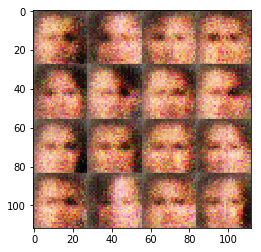

Epochs 110/300000 Batch Step 110/3166 gen_loss = 20.780799865722656..., disc_loss = -10.236058235168457..., train using time = 10.245
Epochs 120/300000 Batch Step 120/3166 gen_loss = 17.641643524169922..., disc_loss = -10.453516006469727..., train using time = 9.626
Epochs 130/300000 Batch Step 130/3166 gen_loss = 24.985027313232422..., disc_loss = -7.021687984466553..., train using time = 10.300
Epochs 140/300000 Batch Step 140/3166 gen_loss = 23.887243270874023..., disc_loss = -9.118605613708496..., train using time = 10.872
Epochs 150/300000 Batch Step 150/3166 gen_loss = 20.707473754882812..., disc_loss = -9.152345657348633..., train using time = 9.413
Epochs 160/300000 Batch Step 160/3166 gen_loss = 19.874282836914062..., disc_loss = -6.2813286781311035..., train using time = 9.231
Epochs 170/300000 Batch Step 170/3166 gen_loss = 20.77887725830078..., disc_loss = -7.646035671234131..., train using time = 10.357
Epochs 180/300000 Batch Step 180/3166 gen_loss = 20.382980346679688...

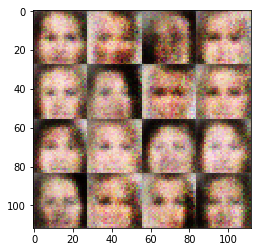

Epochs 210/300000 Batch Step 210/3166 gen_loss = 19.58873748779297..., disc_loss = -6.351168632507324..., train using time = 11.494
Epochs 220/300000 Batch Step 220/3166 gen_loss = 21.539337158203125..., disc_loss = -4.130612373352051..., train using time = 8.953
Epochs 230/300000 Batch Step 230/3166 gen_loss = 17.86563491821289..., disc_loss = -6.528939723968506..., train using time = 10.285
Epochs 240/300000 Batch Step 240/3166 gen_loss = 20.097808837890625..., disc_loss = -5.355020046234131..., train using time = 8.931
Epochs 250/300000 Batch Step 250/3166 gen_loss = 18.589405059814453..., disc_loss = -5.4290995597839355..., train using time = 10.344
Epochs 260/300000 Batch Step 260/3166 gen_loss = 20.303096771240234..., disc_loss = -5.18231201171875..., train using time = 12.885
Epochs 270/300000 Batch Step 270/3166 gen_loss = 17.960865020751953..., disc_loss = -4.735448360443115..., train using time = 9.025
Epochs 280/300000 Batch Step 280/3166 gen_loss = 18.76856231689453..., dis

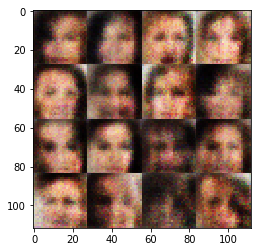

Epochs 310/300000 Batch Step 310/3166 gen_loss = 18.369640350341797..., disc_loss = -5.0266499519348145..., train using time = 11.843
Epochs 320/300000 Batch Step 320/3166 gen_loss = 17.14678955078125..., disc_loss = -4.488722324371338..., train using time = 10.333
Epochs 330/300000 Batch Step 330/3166 gen_loss = 18.979732513427734..., disc_loss = -5.271657466888428..., train using time = 9.017
Epochs 340/300000 Batch Step 340/3166 gen_loss = 14.981138229370117..., disc_loss = -3.924083709716797..., train using time = 8.948
Epochs 350/300000 Batch Step 350/3166 gen_loss = 19.50321388244629..., disc_loss = -4.661012649536133..., train using time = 10.251
Epochs 360/300000 Batch Step 360/3166 gen_loss = 19.341142654418945..., disc_loss = -4.02979850769043..., train using time = 10.167
Epochs 370/300000 Batch Step 370/3166 gen_loss = 17.3524169921875..., disc_loss = -6.2561187744140625..., train using time = 10.327
Epochs 380/300000 Batch Step 380/3166 gen_loss = 15.840932846069336..., di

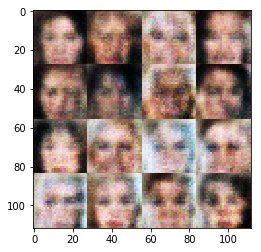

Epochs 410/300000 Batch Step 410/3166 gen_loss = 15.406972885131836..., disc_loss = -4.1541748046875..., train using time = 12.480
Epochs 420/300000 Batch Step 420/3166 gen_loss = 19.131296157836914..., disc_loss = -4.17850923538208..., train using time = 9.116
Epochs 430/300000 Batch Step 430/3166 gen_loss = 15.8108549118042..., disc_loss = -3.1372745037078857..., train using time = 10.330
Epochs 440/300000 Batch Step 440/3166 gen_loss = 18.69741439819336..., disc_loss = -4.283526420593262..., train using time = 9.373
Epochs 450/300000 Batch Step 450/3166 gen_loss = 14.950077056884766..., disc_loss = -3.368269443511963..., train using time = 9.010
Epochs 460/300000 Batch Step 460/3166 gen_loss = 16.759885787963867..., disc_loss = -4.731755256652832..., train using time = 10.411
Epochs 470/300000 Batch Step 470/3166 gen_loss = 13.14954948425293..., disc_loss = -4.339102745056152..., train using time = 9.398
Epochs 480/300000 Batch Step 480/3166 gen_loss = 14.88143539428711..., disc_los

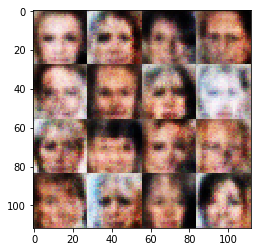

Epochs 510/300000 Batch Step 510/3166 gen_loss = 14.782204627990723..., disc_loss = -4.477186679840088..., train using time = 10.192
Epochs 520/300000 Batch Step 520/3166 gen_loss = 15.552435874938965..., disc_loss = -4.166760444641113..., train using time = 10.161
Epochs 530/300000 Batch Step 530/3166 gen_loss = 13.94737434387207..., disc_loss = -3.2776145935058594..., train using time = 9.052
Epochs 540/300000 Batch Step 540/3166 gen_loss = 15.427854537963867..., disc_loss = -4.143660068511963..., train using time = 8.913
Epochs 550/300000 Batch Step 550/3166 gen_loss = 15.611641883850098..., disc_loss = -3.8527159690856934..., train using time = 10.420
Epochs 560/300000 Batch Step 560/3166 gen_loss = 13.84109878540039..., disc_loss = -4.180743217468262..., train using time = 10.938
Epochs 570/300000 Batch Step 570/3166 gen_loss = 15.877989768981934..., disc_loss = -4.099236488342285..., train using time = 9.141
Epochs 580/300000 Batch Step 580/3166 gen_loss = 14.398702621459961..., 

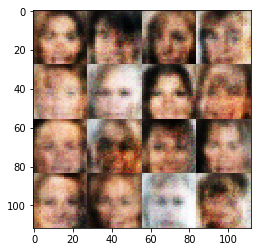

Epochs 610/300000 Batch Step 610/3166 gen_loss = 13.51503849029541..., disc_loss = -4.048386573791504..., train using time = 11.580
Epochs 620/300000 Batch Step 620/3166 gen_loss = 12.159932136535645..., disc_loss = -4.12868595123291..., train using time = 9.357
Epochs 630/300000 Batch Step 630/3166 gen_loss = 11.256124496459961..., disc_loss = -3.9779181480407715..., train using time = 9.833
Epochs 640/300000 Batch Step 640/3166 gen_loss = 13.145981788635254..., disc_loss = -3.248323917388916..., train using time = 9.327
Epochs 650/300000 Batch Step 650/3166 gen_loss = 12.127368927001953..., disc_loss = -3.93440580368042..., train using time = 9.862
Epochs 660/300000 Batch Step 660/3166 gen_loss = 12.4894380569458..., disc_loss = -3.5883758068084717..., train using time = 10.409
Epochs 670/300000 Batch Step 670/3166 gen_loss = 11.726913452148438..., disc_loss = -3.2698752880096436..., train using time = 11.364
Epochs 680/300000 Batch Step 680/3166 gen_loss = 10.832439422607422..., dis

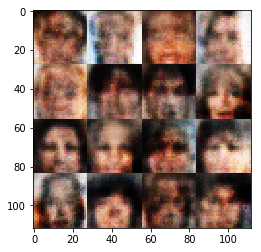

Epochs 710/300000 Batch Step 710/3166 gen_loss = 9.653077125549316..., disc_loss = -3.4968700408935547..., train using time = 10.566
Epochs 720/300000 Batch Step 720/3166 gen_loss = 11.524564743041992..., disc_loss = -3.5733463764190674..., train using time = 9.677
Epochs 730/300000 Batch Step 730/3166 gen_loss = 10.426274299621582..., disc_loss = -2.9964754581451416..., train using time = 12.294
Epochs 740/300000 Batch Step 740/3166 gen_loss = 9.452788352966309..., disc_loss = -3.1796905994415283..., train using time = 9.006
Epochs 750/300000 Batch Step 750/3166 gen_loss = 9.03111743927002..., disc_loss = -3.707190752029419..., train using time = 8.943
Epochs 760/300000 Batch Step 760/3166 gen_loss = 9.238547325134277..., disc_loss = -3.269812822341919..., train using time = 11.055
Epochs 770/300000 Batch Step 770/3166 gen_loss = 6.993204116821289..., disc_loss = -3.670983076095581..., train using time = 9.727
Epochs 780/300000 Batch Step 780/3166 gen_loss = 6.728150367736816..., disc

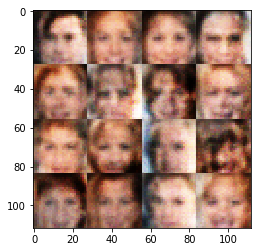

Epochs 810/300000 Batch Step 810/3166 gen_loss = 7.674932479858398..., disc_loss = -2.76332950592041..., train using time = 11.127
Epochs 820/300000 Batch Step 820/3166 gen_loss = 6.341827392578125..., disc_loss = -2.8377137184143066..., train using time = 11.091
Epochs 830/300000 Batch Step 830/3166 gen_loss = 6.86606502532959..., disc_loss = -3.0987892150878906..., train using time = 9.729
Epochs 840/300000 Batch Step 840/3166 gen_loss = 5.624814987182617..., disc_loss = -3.0105087757110596..., train using time = 9.063
Epochs 850/300000 Batch Step 850/3166 gen_loss = 3.7737841606140137..., disc_loss = -3.082411527633667..., train using time = 10.159
Epochs 860/300000 Batch Step 860/3166 gen_loss = 7.9463372230529785..., disc_loss = -2.4340732097625732..., train using time = 10.221
Epochs 870/300000 Batch Step 870/3166 gen_loss = 4.42349100112915..., disc_loss = -3.2871406078338623..., train using time = 9.041
Epochs 880/300000 Batch Step 880/3166 gen_loss = 4.061890602111816..., disc

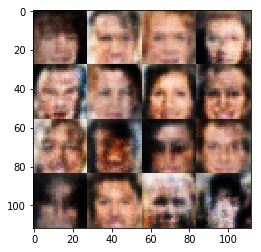

Epochs 910/300000 Batch Step 910/3166 gen_loss = 4.709815979003906..., disc_loss = -2.9862589836120605..., train using time = 12.648
Epochs 920/300000 Batch Step 920/3166 gen_loss = 3.9941036701202393..., disc_loss = -3.1840109825134277..., train using time = 9.010
Epochs 930/300000 Batch Step 930/3166 gen_loss = 3.3206076622009277..., disc_loss = -2.703160285949707..., train using time = 8.917
Epochs 940/300000 Batch Step 940/3166 gen_loss = 2.798072338104248..., disc_loss = -2.0291223526000977..., train using time = 9.400
Epochs 950/300000 Batch Step 950/3166 gen_loss = 4.705956935882568..., disc_loss = -2.946526050567627..., train using time = 9.409
Epochs 960/300000 Batch Step 960/3166 gen_loss = 4.606717109680176..., disc_loss = -2.754380702972412..., train using time = 10.325
Epochs 970/300000 Batch Step 970/3166 gen_loss = 2.6863906383514404..., disc_loss = -2.359416961669922..., train using time = 11.286
Epochs 980/300000 Batch Step 980/3166 gen_loss = 3.2157082557678223..., di

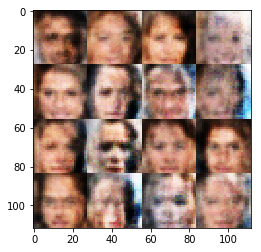

Epochs 1010/300000 Batch Step 1010/3166 gen_loss = 3.4838004112243652..., disc_loss = -2.7901034355163574..., train using time = 10.642
Epochs 1020/300000 Batch Step 1020/3166 gen_loss = 1.1089962720870972..., disc_loss = -2.806246280670166..., train using time = 9.348
Epochs 1030/300000 Batch Step 1030/3166 gen_loss = 2.3676598072052..., disc_loss = -3.178938627243042..., train using time = 10.996
Epochs 1040/300000 Batch Step 1040/3166 gen_loss = 1.8526802062988281..., disc_loss = -2.356645107269287..., train using time = 9.096
Epochs 1050/300000 Batch Step 1050/3166 gen_loss = 1.3066374063491821..., disc_loss = -2.2578787803649902..., train using time = 8.930
Epochs 1060/300000 Batch Step 1060/3166 gen_loss = 0.6972548961639404..., disc_loss = -2.3299317359924316..., train using time = 10.872
Epochs 1070/300000 Batch Step 1070/3166 gen_loss = -0.46320635080337524..., disc_loss = -2.5084948539733887..., train using time = 9.063
Epochs 1080/300000 Batch Step 1080/3166 gen_loss = -0.52

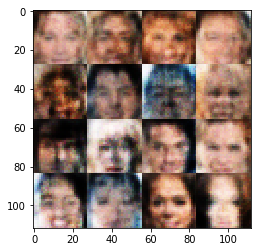

Epochs 1110/300000 Batch Step 1110/3166 gen_loss = 2.307816505432129..., disc_loss = -2.199178695678711..., train using time = 11.113
Epochs 1120/300000 Batch Step 1120/3166 gen_loss = 1.0957731008529663..., disc_loss = -2.3484768867492676..., train using time = 10.246
Epochs 1130/300000 Batch Step 1130/3166 gen_loss = 0.6699557900428772..., disc_loss = -2.4721713066101074..., train using time = 9.171
Epochs 1140/300000 Batch Step 1140/3166 gen_loss = 0.25133073329925537..., disc_loss = -2.47845458984375..., train using time = 8.979
Epochs 1150/300000 Batch Step 1150/3166 gen_loss = 1.9400339126586914..., disc_loss = -2.2741165161132812..., train using time = 10.329
Epochs 1160/300000 Batch Step 1160/3166 gen_loss = 3.04097580909729..., disc_loss = -2.7023231983184814..., train using time = 10.188
Epochs 1170/300000 Batch Step 1170/3166 gen_loss = 1.3803826570510864..., disc_loss = -2.194965124130249..., train using time = 8.933
Epochs 1180/300000 Batch Step 1180/3166 gen_loss = -1.792

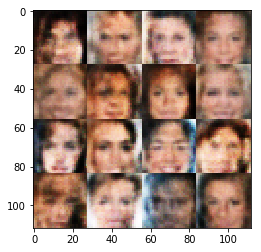

Epochs 1210/300000 Batch Step 1210/3166 gen_loss = -0.34724748134613037..., disc_loss = -1.9688949584960938..., train using time = 13.089
Epochs 1220/300000 Batch Step 1220/3166 gen_loss = -1.7368543148040771..., disc_loss = -2.1782021522521973..., train using time = 9.100
Epochs 1230/300000 Batch Step 1230/3166 gen_loss = -1.205230951309204..., disc_loss = -1.9503288269042969..., train using time = 8.937
Epochs 1240/300000 Batch Step 1240/3166 gen_loss = 0.9057502746582031..., disc_loss = -1.9350147247314453..., train using time = 10.476
Epochs 1250/300000 Batch Step 1250/3166 gen_loss = -0.5394001007080078..., disc_loss = -2.242328643798828..., train using time = 9.089
Epochs 1260/300000 Batch Step 1260/3166 gen_loss = -1.0333362817764282..., disc_loss = -2.1050593852996826..., train using time = 10.385
Epochs 1270/300000 Batch Step 1270/3166 gen_loss = 1.7528177499771118..., disc_loss = -2.394369602203369..., train using time = 11.486
Epochs 1280/300000 Batch Step 1280/3166 gen_loss

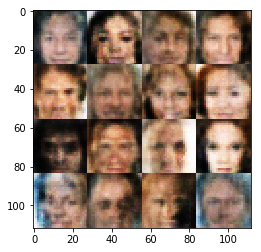

Epochs 1310/300000 Batch Step 1310/3166 gen_loss = -0.843315601348877..., disc_loss = -1.9831912517547607..., train using time = 10.674
Epochs 1320/300000 Batch Step 1320/3166 gen_loss = -0.6909744143486023..., disc_loss = -1.996047019958496..., train using time = 9.021
Epochs 1330/300000 Batch Step 1330/3166 gen_loss = -0.9056905508041382..., disc_loss = -2.0910415649414062..., train using time = 12.097
Epochs 1340/300000 Batch Step 1340/3166 gen_loss = 0.6814475059509277..., disc_loss = -1.7806777954101562..., train using time = 8.964
Epochs 1350/300000 Batch Step 1350/3166 gen_loss = 0.32004809379577637..., disc_loss = -2.1292660236358643..., train using time = 8.958
Epochs 1360/300000 Batch Step 1360/3166 gen_loss = 0.08394527435302734..., disc_loss = -2.156994342803955..., train using time = 12.694
Epochs 1370/300000 Batch Step 1370/3166 gen_loss = -0.8289076089859009..., disc_loss = -2.0199990272521973..., train using time = 9.006
Epochs 1380/300000 Batch Step 1380/3166 gen_loss 

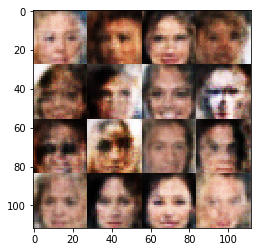

Epochs 1410/300000 Batch Step 1410/3166 gen_loss = -0.7181313633918762..., disc_loss = -1.5302832126617432..., train using time = 9.954
Epochs 1420/300000 Batch Step 1420/3166 gen_loss = -1.765230417251587..., disc_loss = -2.044215202331543..., train using time = 10.917
Epochs 1430/300000 Batch Step 1430/3166 gen_loss = -2.3363568782806396..., disc_loss = -2.0768401622772217..., train using time = 9.056
Epochs 1440/300000 Batch Step 1440/3166 gen_loss = -1.2407898902893066..., disc_loss = -2.0205891132354736..., train using time = 9.123
Epochs 1450/300000 Batch Step 1450/3166 gen_loss = -1.1774821281433105..., disc_loss = -1.7116056680679321..., train using time = 11.969
Epochs 1460/300000 Batch Step 1460/3166 gen_loss = 0.0047746747732162476..., disc_loss = -2.0273280143737793..., train using time = 10.140
Epochs 1470/300000 Batch Step 1470/3166 gen_loss = 0.23845826089382172..., disc_loss = -2.0979397296905518..., train using time = 9.140
Epochs 1480/300000 Batch Step 1480/3166 gen_l

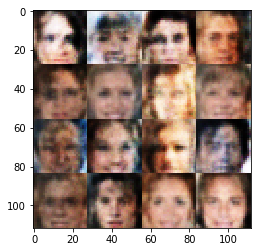

Epochs 1510/300000 Batch Step 1510/3166 gen_loss = -1.5866012573242188..., disc_loss = -1.9557249546051025..., train using time = 13.804
Epochs 1520/300000 Batch Step 1520/3166 gen_loss = 0.009212397038936615..., disc_loss = -1.9588737487792969..., train using time = 9.149
Epochs 1530/300000 Batch Step 1530/3166 gen_loss = -0.5062554478645325..., disc_loss = -1.732003927230835..., train using time = 9.296
Epochs 1540/300000 Batch Step 1540/3166 gen_loss = -0.6717478632926941..., disc_loss = -1.8439826965332031..., train using time = 10.308
Epochs 1550/300000 Batch Step 1550/3166 gen_loss = -1.023003339767456..., disc_loss = -1.8665943145751953..., train using time = 9.314
Epochs 1560/300000 Batch Step 1560/3166 gen_loss = -3.2799954414367676..., disc_loss = -1.7651020288467407..., train using time = 10.300
Epochs 1570/300000 Batch Step 1570/3166 gen_loss = -3.509784698486328..., disc_loss = -1.4799882173538208..., train using time = 13.122
Epochs 1580/300000 Batch Step 1580/3166 gen_lo

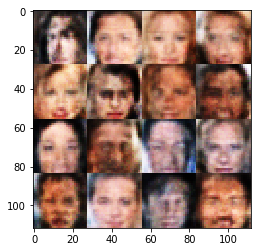

Epochs 1610/300000 Batch Step 1610/3166 gen_loss = -1.2974132299423218..., disc_loss = -1.3513052463531494..., train using time = 11.074
Epochs 1620/300000 Batch Step 1620/3166 gen_loss = -1.7373228073120117..., disc_loss = -1.8010581731796265..., train using time = 9.061
Epochs 1630/300000 Batch Step 1630/3166 gen_loss = -0.45935317873954773..., disc_loss = -1.7543556690216064..., train using time = 12.308
Epochs 1640/300000 Batch Step 1640/3166 gen_loss = -1.8612738847732544..., disc_loss = -1.9039459228515625..., train using time = 9.098
Epochs 1650/300000 Batch Step 1650/3166 gen_loss = -3.0794529914855957..., disc_loss = -1.8460947275161743..., train using time = 9.036
Epochs 1660/300000 Batch Step 1660/3166 gen_loss = -1.2088096141815186..., disc_loss = -1.9127578735351562..., train using time = 11.998
Epochs 1670/300000 Batch Step 1670/3166 gen_loss = -3.190093994140625..., disc_loss = -1.6237707138061523..., train using time = 9.296
Epochs 1680/300000 Batch Step 1680/3166 gen_l

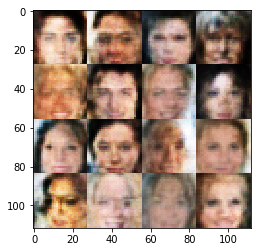

Epochs 1710/300000 Batch Step 1710/3166 gen_loss = -1.671491265296936..., disc_loss = -1.7595571279525757..., train using time = 10.186
Epochs 1720/300000 Batch Step 1720/3166 gen_loss = -1.4694864749908447..., disc_loss = -1.5568647384643555..., train using time = 10.288
Epochs 1730/300000 Batch Step 1730/3166 gen_loss = -3.5364508628845215..., disc_loss = -1.6271663904190063..., train using time = 9.236
Epochs 1740/300000 Batch Step 1740/3166 gen_loss = -1.8875538110733032..., disc_loss = -1.74313485622406..., train using time = 9.077
Epochs 1750/300000 Batch Step 1750/3166 gen_loss = -2.70029878616333..., disc_loss = -1.9738562107086182..., train using time = 12.272
Epochs 1760/300000 Batch Step 1760/3166 gen_loss = -1.4737987518310547..., disc_loss = -1.7414849996566772..., train using time = 10.983
Epochs 1770/300000 Batch Step 1770/3166 gen_loss = -2.5291736125946045..., disc_loss = -1.7990890741348267..., train using time = 9.026
Epochs 1780/300000 Batch Step 1780/3166 gen_loss 

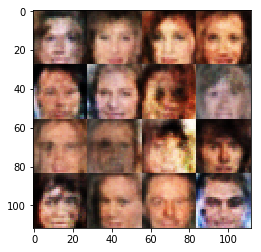

Epochs 1810/300000 Batch Step 1810/3166 gen_loss = -5.110757827758789..., disc_loss = -1.7751249074935913..., train using time = 13.915
Epochs 1820/300000 Batch Step 1820/3166 gen_loss = -2.8949837684631348..., disc_loss = -2.109424114227295..., train using time = 8.985
Epochs 1830/300000 Batch Step 1830/3166 gen_loss = -2.2168965339660645..., disc_loss = -1.9167098999023438..., train using time = 9.001
Epochs 1840/300000 Batch Step 1840/3166 gen_loss = -2.112356424331665..., disc_loss = -1.8737932443618774..., train using time = 10.245
Epochs 1850/300000 Batch Step 1850/3166 gen_loss = -3.0517730712890625..., disc_loss = -1.681372046470642..., train using time = 9.018
Epochs 1860/300000 Batch Step 1860/3166 gen_loss = -2.5686633586883545..., disc_loss = -1.7818107604980469..., train using time = 10.205
Epochs 1870/300000 Batch Step 1870/3166 gen_loss = -2.1669018268585205..., disc_loss = -1.5659644603729248..., train using time = 13.396
Epochs 1880/300000 Batch Step 1880/3166 gen_loss

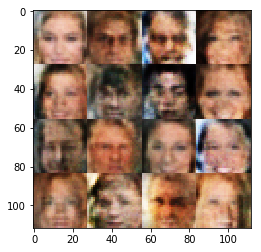

Epochs 1910/300000 Batch Step 1910/3166 gen_loss = -3.15028715133667..., disc_loss = -1.5455049276351929..., train using time = 10.110
Epochs 1920/300000 Batch Step 1920/3166 gen_loss = -4.598420143127441..., disc_loss = -1.961554765701294..., train using time = 8.897
Epochs 1930/300000 Batch Step 1930/3166 gen_loss = -2.154059410095215..., disc_loss = -1.6867507696151733..., train using time = 12.035
Epochs 1940/300000 Batch Step 1940/3166 gen_loss = -2.9958558082580566..., disc_loss = -1.764318823814392..., train using time = 9.400
Epochs 1950/300000 Batch Step 1950/3166 gen_loss = -4.097569942474365..., disc_loss = -1.468825101852417..., train using time = 9.507
Epochs 1960/300000 Batch Step 1960/3166 gen_loss = -5.076179027557373..., disc_loss = -1.5155761241912842..., train using time = 11.891
Epochs 1970/300000 Batch Step 1970/3166 gen_loss = -5.3395185470581055..., disc_loss = -1.592287302017212..., train using time = 9.086
Epochs 1980/300000 Batch Step 1980/3166 gen_loss = -4.9

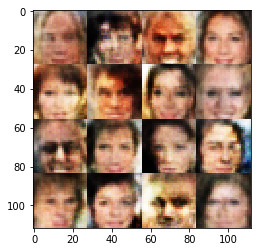

Epochs 2010/300000 Batch Step 2010/3166 gen_loss = -4.221512794494629..., disc_loss = -1.3889100551605225..., train using time = 10.186
Epochs 2020/300000 Batch Step 2020/3166 gen_loss = -3.247382640838623..., disc_loss = -1.7639830112457275..., train using time = 10.272
Epochs 2030/300000 Batch Step 2030/3166 gen_loss = -3.67923903465271..., disc_loss = -1.598889946937561..., train using time = 9.393
Epochs 2040/300000 Batch Step 2040/3166 gen_loss = -5.929843902587891..., disc_loss = -1.6178045272827148..., train using time = 9.001
Epochs 2050/300000 Batch Step 2050/3166 gen_loss = -3.245100259780884..., disc_loss = -1.719325304031372..., train using time = 12.290
Epochs 2060/300000 Batch Step 2060/3166 gen_loss = -4.215215682983398..., disc_loss = -1.7150157690048218..., train using time = 10.130
Epochs 2070/300000 Batch Step 2070/3166 gen_loss = -3.4969513416290283..., disc_loss = -1.7077404260635376..., train using time = 9.135
Epochs 2080/300000 Batch Step 2080/3166 gen_loss = -3

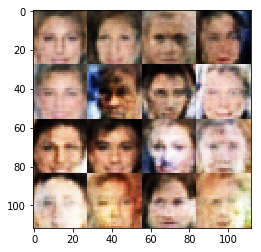

Epochs 2110/300000 Batch Step 2110/3166 gen_loss = -4.174315452575684..., disc_loss = -1.5759955644607544..., train using time = 13.369
Epochs 2120/300000 Batch Step 2120/3166 gen_loss = -4.010095596313477..., disc_loss = -1.460160255432129..., train using time = 8.992
Epochs 2130/300000 Batch Step 2130/3166 gen_loss = -3.234785318374634..., disc_loss = -1.7642666101455688..., train using time = 9.352
Epochs 2140/300000 Batch Step 2140/3166 gen_loss = -3.123800039291382..., disc_loss = -1.603589415550232..., train using time = 10.244
Epochs 2150/300000 Batch Step 2150/3166 gen_loss = -4.697133541107178..., disc_loss = -1.699506402015686..., train using time = 9.297
Epochs 2160/300000 Batch Step 2160/3166 gen_loss = -4.590338706970215..., disc_loss = -1.7838714122772217..., train using time = 10.384
Epochs 2170/300000 Batch Step 2170/3166 gen_loss = -2.8325304985046387..., disc_loss = -1.6002944707870483..., train using time = 12.913
Epochs 2180/300000 Batch Step 2180/3166 gen_loss = -2

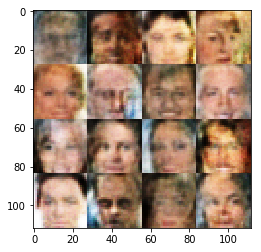

Epochs 2210/300000 Batch Step 2210/3166 gen_loss = -3.542687177658081..., disc_loss = -1.543694257736206..., train using time = 10.447
Epochs 2220/300000 Batch Step 2220/3166 gen_loss = -4.65401029586792..., disc_loss = -1.5167875289916992..., train using time = 8.956
Epochs 2230/300000 Batch Step 2230/3166 gen_loss = -2.476022481918335..., disc_loss = -1.6996599435806274..., train using time = 13.030
Epochs 2240/300000 Batch Step 2240/3166 gen_loss = -3.910959243774414..., disc_loss = -1.6011698246002197..., train using time = 8.965
Epochs 2250/300000 Batch Step 2250/3166 gen_loss = -3.4240784645080566..., disc_loss = -1.611761450767517..., train using time = 9.023
Epochs 2260/300000 Batch Step 2260/3166 gen_loss = -3.3201918601989746..., disc_loss = -1.6136928796768188..., train using time = 13.075
Epochs 2270/300000 Batch Step 2270/3166 gen_loss = -4.424955368041992..., disc_loss = -1.3135316371917725..., train using time = 9.046
Epochs 2280/300000 Batch Step 2280/3166 gen_loss = -4

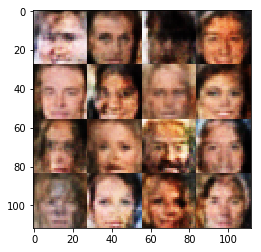

Epochs 2310/300000 Batch Step 2310/3166 gen_loss = -2.0113701820373535..., disc_loss = -1.8164823055267334..., train using time = 10.664
Epochs 2320/300000 Batch Step 2320/3166 gen_loss = -4.257760047912598..., disc_loss = -1.6312506198883057..., train using time = 10.197
Epochs 2330/300000 Batch Step 2330/3166 gen_loss = -2.422116756439209..., disc_loss = -1.2811226844787598..., train using time = 9.077
Epochs 2340/300000 Batch Step 2340/3166 gen_loss = -7.02801513671875..., disc_loss = -1.3558756113052368..., train using time = 8.921
Epochs 2350/300000 Batch Step 2350/3166 gen_loss = -2.707717180252075..., disc_loss = -1.5995283126831055..., train using time = 11.425
Epochs 2360/300000 Batch Step 2360/3166 gen_loss = -3.9990782737731934..., disc_loss = -1.5909775495529175..., train using time = 10.603
Epochs 2370/300000 Batch Step 2370/3166 gen_loss = -2.3445067405700684..., disc_loss = -1.5047798156738281..., train using time = 9.313
Epochs 2380/300000 Batch Step 2380/3166 gen_loss 

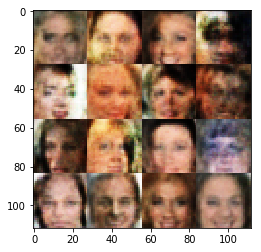

Epochs 2410/300000 Batch Step 2410/3166 gen_loss = -3.491365432739258..., disc_loss = -2.0940558910369873..., train using time = 10.708
Epochs 2420/300000 Batch Step 2420/3166 gen_loss = -3.2774312496185303..., disc_loss = -1.6739600896835327..., train using time = 9.104
Epochs 2430/300000 Batch Step 2430/3166 gen_loss = -1.9432111978530884..., disc_loss = -1.637070655822754..., train using time = 9.030
Epochs 2440/300000 Batch Step 2440/3166 gen_loss = -2.373419761657715..., disc_loss = -1.6626983880996704..., train using time = 10.126
Epochs 2450/300000 Batch Step 2450/3166 gen_loss = -2.1687891483306885..., disc_loss = -1.5347436666488647..., train using time = 9.082
Epochs 2460/300000 Batch Step 2460/3166 gen_loss = -5.547011375427246..., disc_loss = -1.5823341608047485..., train using time = 12.614
Epochs 2470/300000 Batch Step 2470/3166 gen_loss = -4.9126739501953125..., disc_loss = -1.374208927154541..., train using time = 10.566
Epochs 2480/300000 Batch Step 2480/3166 gen_loss 

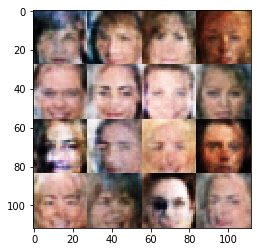

Epochs 2510/300000 Batch Step 2510/3166 gen_loss = -5.642181396484375..., disc_loss = -1.33207106590271..., train using time = 9.299
Epochs 2520/300000 Batch Step 2520/3166 gen_loss = -5.337430953979492..., disc_loss = -1.5659816265106201..., train using time = 10.252
Epochs 2530/300000 Batch Step 2530/3166 gen_loss = -5.237207412719727..., disc_loss = -1.4526056051254272..., train using time = 10.467
Epochs 2540/300000 Batch Step 2540/3166 gen_loss = -2.769071102142334..., disc_loss = -1.2304126024246216..., train using time = 9.734
Epochs 2550/300000 Batch Step 2550/3166 gen_loss = -3.0520882606506348..., disc_loss = -1.5549395084381104..., train using time = 10.039
Epochs 2560/300000 Batch Step 2560/3166 gen_loss = -3.5864768028259277..., disc_loss = -1.6218855381011963..., train using time = 10.265
Epochs 2570/300000 Batch Step 2570/3166 gen_loss = -4.363898754119873..., disc_loss = -1.6068214178085327..., train using time = 9.045
Epochs 2580/300000 Batch Step 2580/3166 gen_loss = 

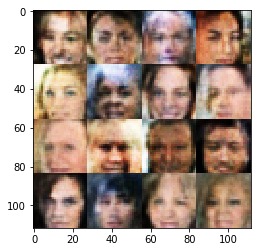

Epochs 2610/300000 Batch Step 2610/3166 gen_loss = -3.854522228240967..., disc_loss = -1.486899971961975..., train using time = 9.301
Epochs 2620/300000 Batch Step 2620/3166 gen_loss = -2.9785642623901367..., disc_loss = -1.4009912014007568..., train using time = 10.521
Epochs 2630/300000 Batch Step 2630/3166 gen_loss = -5.808032989501953..., disc_loss = -1.2985211610794067..., train using time = 9.187
Epochs 2640/300000 Batch Step 2640/3166 gen_loss = -2.537654399871826..., disc_loss = -1.5197633504867554..., train using time = 10.368
Epochs 2650/300000 Batch Step 2650/3166 gen_loss = -3.0224220752716064..., disc_loss = -1.3470474481582642..., train using time = 12.284
Epochs 2660/300000 Batch Step 2660/3166 gen_loss = -5.909268856048584..., disc_loss = -1.5838887691497803..., train using time = 9.443
Epochs 2670/300000 Batch Step 2670/3166 gen_loss = -0.8362034559249878..., disc_loss = -1.5078998804092407..., train using time = 9.063
Epochs 2680/300000 Batch Step 2680/3166 gen_loss =

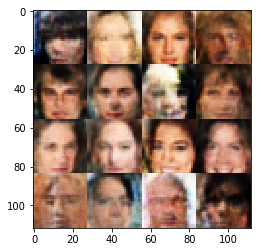

Epochs 2710/300000 Batch Step 2710/3166 gen_loss = -4.893177032470703..., disc_loss = -1.4154822826385498..., train using time = 10.632
Epochs 2720/300000 Batch Step 2720/3166 gen_loss = -3.2323834896087646..., disc_loss = -1.8353850841522217..., train using time = 9.000
Epochs 2730/300000 Batch Step 2730/3166 gen_loss = -3.4429566860198975..., disc_loss = -1.566952109336853..., train using time = 8.985
Epochs 2740/300000 Batch Step 2740/3166 gen_loss = -3.1294431686401367..., disc_loss = -1.5270764827728271..., train using time = 10.114
Epochs 2750/300000 Batch Step 2750/3166 gen_loss = -4.800120830535889..., disc_loss = -1.2810070514678955..., train using time = 10.267
Epochs 2760/300000 Batch Step 2760/3166 gen_loss = -4.453367233276367..., disc_loss = -1.5753072500228882..., train using time = 10.310
Epochs 2770/300000 Batch Step 2770/3166 gen_loss = -4.751212120056152..., disc_loss = -1.4551026821136475..., train using time = 10.244
Epochs 2780/300000 Batch Step 2780/3166 gen_loss

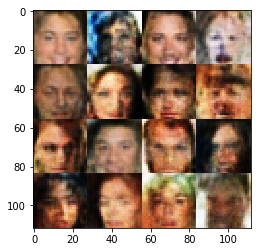

Epochs 2810/300000 Batch Step 2810/3166 gen_loss = -4.967804908752441..., disc_loss = -1.6093146800994873..., train using time = 9.416
Epochs 2820/300000 Batch Step 2820/3166 gen_loss = -3.4057788848876953..., disc_loss = -1.3622318506240845..., train using time = 11.587
Epochs 2830/300000 Batch Step 2830/3166 gen_loss = -3.5720925331115723..., disc_loss = -1.4499406814575195..., train using time = 10.326
Epochs 2840/300000 Batch Step 2840/3166 gen_loss = -4.442246913909912..., disc_loss = -1.6332142353057861..., train using time = 9.063
Epochs 2850/300000 Batch Step 2850/3166 gen_loss = -4.321210861206055..., disc_loss = -1.3469531536102295..., train using time = 10.163
Epochs 2860/300000 Batch Step 2860/3166 gen_loss = -5.318393707275391..., disc_loss = -1.5523226261138916..., train using time = 10.217
Epochs 2870/300000 Batch Step 2870/3166 gen_loss = -3.59051513671875..., disc_loss = -1.7273635864257812..., train using time = 9.469
Epochs 2880/300000 Batch Step 2880/3166 gen_loss =

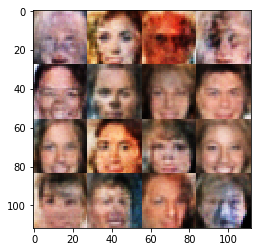

Epochs 2910/300000 Batch Step 2910/3166 gen_loss = -3.6937503814697266..., disc_loss = -1.399613618850708..., train using time = 8.980
Epochs 2920/300000 Batch Step 2920/3166 gen_loss = -2.910923480987549..., disc_loss = -1.6157524585723877..., train using time = 10.288
Epochs 2930/300000 Batch Step 2930/3166 gen_loss = -4.058220863342285..., disc_loss = -1.6082862615585327..., train using time = 8.872
Epochs 2940/300000 Batch Step 2940/3166 gen_loss = -2.8524656295776367..., disc_loss = -1.621109962463379..., train using time = 10.214
Epochs 2950/300000 Batch Step 2950/3166 gen_loss = -4.17458438873291..., disc_loss = -1.5335496664047241..., train using time = 12.228
Epochs 2960/300000 Batch Step 2960/3166 gen_loss = -4.5280842781066895..., disc_loss = -1.3466639518737793..., train using time = 9.115
Epochs 2970/300000 Batch Step 2970/3166 gen_loss = -3.377480983734131..., disc_loss = -1.5682748556137085..., train using time = 8.970
Epochs 2980/300000 Batch Step 2980/3166 gen_loss = -

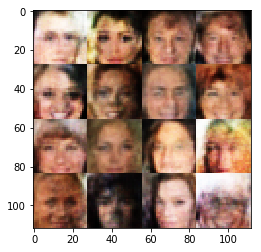

Epochs 3010/300000 Batch Step 3010/3166 gen_loss = -4.2374162673950195..., disc_loss = -1.5220551490783691..., train using time = 10.311
Epochs 3020/300000 Batch Step 3020/3166 gen_loss = -4.8242292404174805..., disc_loss = -1.4617743492126465..., train using time = 9.045
Epochs 3030/300000 Batch Step 3030/3166 gen_loss = -3.2986514568328857..., disc_loss = -1.3696218729019165..., train using time = 8.896
Epochs 3040/300000 Batch Step 3040/3166 gen_loss = -4.942713260650635..., disc_loss = -1.324100375175476..., train using time = 10.173
Epochs 3050/300000 Batch Step 3050/3166 gen_loss = -4.7366862297058105..., disc_loss = -1.4956672191619873..., train using time = 10.180
Epochs 3060/300000 Batch Step 3060/3166 gen_loss = -3.1735568046569824..., disc_loss = -1.6671479940414429..., train using time = 10.258
Epochs 3070/300000 Batch Step 3070/3166 gen_loss = -4.791477203369141..., disc_loss = -1.310915231704712..., train using time = 10.500
Epochs 3080/300000 Batch Step 3080/3166 gen_los

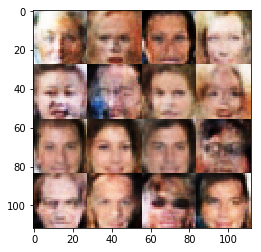

Epochs 3110/300000 Batch Step 3110/3166 gen_loss = -5.2570109367370605..., disc_loss = -1.212799072265625..., train using time = 9.144
Epochs 3120/300000 Batch Step 3120/3166 gen_loss = -4.233644962310791..., disc_loss = -1.3512214422225952..., train using time = 11.033
Epochs 3130/300000 Batch Step 3130/3166 gen_loss = -4.224472999572754..., disc_loss = -1.4891057014465332..., train using time = 9.927
Epochs 3140/300000 Batch Step 3140/3166 gen_loss = -3.925337553024292..., disc_loss = -1.1378588676452637..., train using time = 9.115
Epochs 3150/300000 Batch Step 3150/3166 gen_loss = -4.814802646636963..., disc_loss = -1.4530704021453857..., train using time = 10.247
Epochs 3160/300000 Batch Step 3160/3166 gen_loss = -3.5957658290863037..., disc_loss = -1.4040712118148804..., train using time = 9.868
Epochs 3170/300000 Batch Step 5/3166 gen_loss = -4.129654884338379..., disc_loss = -1.512568712234497..., train using time = 8.975
Epochs 3180/300000 Batch Step 15/3166 gen_loss = -2.5736

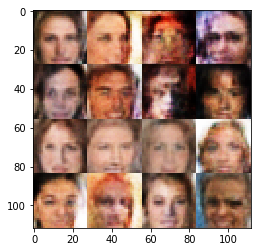

Epochs 3210/300000 Batch Step 45/3166 gen_loss = -3.570871591567993..., disc_loss = -1.4587430953979492..., train using time = 9.021
Epochs 3220/300000 Batch Step 55/3166 gen_loss = -4.258925437927246..., disc_loss = -1.2657109498977661..., train using time = 9.854
Epochs 3230/300000 Batch Step 65/3166 gen_loss = -3.842884063720703..., disc_loss = -1.448008418083191..., train using time = 9.430
Epochs 3240/300000 Batch Step 75/3166 gen_loss = -4.96928596496582..., disc_loss = -1.26530122756958..., train using time = 11.119
Epochs 3250/300000 Batch Step 85/3166 gen_loss = -4.056537628173828..., disc_loss = -1.1778428554534912..., train using time = 11.317
Epochs 3260/300000 Batch Step 95/3166 gen_loss = -3.6343421936035156..., disc_loss = -1.3509737253189087..., train using time = 9.011
Epochs 3270/300000 Batch Step 105/3166 gen_loss = -3.9480559825897217..., disc_loss = -1.3994438648223877..., train using time = 9.101
Epochs 3280/300000 Batch Step 115/3166 gen_loss = -2.436016798019409

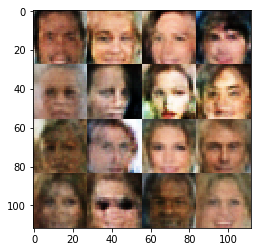

Epochs 3310/300000 Batch Step 145/3166 gen_loss = -3.7600927352905273..., disc_loss = -1.5335075855255127..., train using time = 9.216
Epochs 3320/300000 Batch Step 155/3166 gen_loss = -3.078061103820801..., disc_loss = -1.3133233785629272..., train using time = 9.383
Epochs 3330/300000 Batch Step 165/3166 gen_loss = -4.044888496398926..., disc_loss = -1.2683547735214233..., train using time = 9.186
Epochs 3340/300000 Batch Step 175/3166 gen_loss = -5.098104476928711..., disc_loss = -1.2062467336654663..., train using time = 9.765
Epochs 3350/300000 Batch Step 185/3166 gen_loss = -4.093990802764893..., disc_loss = -1.4485442638397217..., train using time = 10.288
Epochs 3360/300000 Batch Step 195/3166 gen_loss = -4.5756635665893555..., disc_loss = -1.4040963649749756..., train using time = 11.441
Epochs 3370/300000 Batch Step 205/3166 gen_loss = -3.847233295440674..., disc_loss = -1.0841058492660522..., train using time = 9.145
Epochs 3380/300000 Batch Step 215/3166 gen_loss = -4.10979

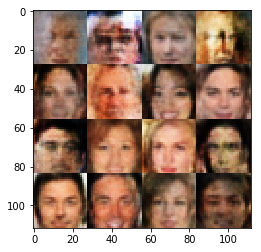

Epochs 3410/300000 Batch Step 245/3166 gen_loss = -3.7460312843322754..., disc_loss = -1.52829909324646..., train using time = 9.178
Epochs 3420/300000 Batch Step 255/3166 gen_loss = -3.548614740371704..., disc_loss = -1.5643821954727173..., train using time = 11.378
Epochs 3430/300000 Batch Step 265/3166 gen_loss = -3.835388660430908..., disc_loss = -1.4835388660430908..., train using time = 9.122
Epochs 3440/300000 Batch Step 275/3166 gen_loss = -2.8107142448425293..., disc_loss = -1.2949271202087402..., train using time = 13.846
Epochs 3450/300000 Batch Step 285/3166 gen_loss = -4.018673896789551..., disc_loss = -1.2853896617889404..., train using time = 12.410
Epochs 3460/300000 Batch Step 295/3166 gen_loss = -4.143650054931641..., disc_loss = -1.430724024772644..., train using time = 9.449
Epochs 3470/300000 Batch Step 305/3166 gen_loss = -3.5177841186523438..., disc_loss = -1.4435863494873047..., train using time = 8.992
Epochs 3480/300000 Batch Step 315/3166 gen_loss = -3.279074

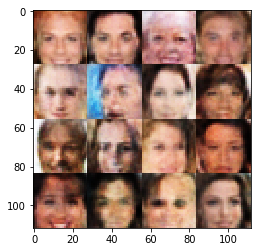

Epochs 3510/300000 Batch Step 345/3166 gen_loss = -2.6582159996032715..., disc_loss = -1.4171807765960693..., train using time = 10.199
Epochs 3520/300000 Batch Step 355/3166 gen_loss = -4.631997108459473..., disc_loss = -1.3561041355133057..., train using time = 9.430
Epochs 3530/300000 Batch Step 365/3166 gen_loss = -4.032827854156494..., disc_loss = -1.2154165506362915..., train using time = 9.051
Epochs 3540/300000 Batch Step 375/3166 gen_loss = -5.0423688888549805..., disc_loss = -1.2999835014343262..., train using time = 11.021
Epochs 3550/300000 Batch Step 385/3166 gen_loss = -4.9696149826049805..., disc_loss = -1.2701762914657593..., train using time = 10.881
Epochs 3560/300000 Batch Step 395/3166 gen_loss = -5.439520835876465..., disc_loss = -1.1471824645996094..., train using time = 9.054
Epochs 3570/300000 Batch Step 405/3166 gen_loss = -3.9762444496154785..., disc_loss = -1.0852447748184204..., train using time = 10.083
Epochs 3580/300000 Batch Step 415/3166 gen_loss = -2.1

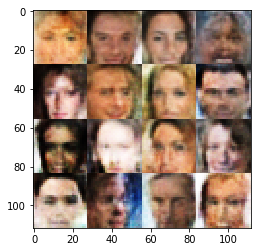

Epochs 3610/300000 Batch Step 445/3166 gen_loss = -3.279932975769043..., disc_loss = -1.3939346075057983..., train using time = 9.045
Epochs 3620/300000 Batch Step 455/3166 gen_loss = -3.5067148208618164..., disc_loss = -1.4371274709701538..., train using time = 9.131
Epochs 3630/300000 Batch Step 465/3166 gen_loss = -3.0032477378845215..., disc_loss = -1.473602294921875..., train using time = 9.985
Epochs 3640/300000 Batch Step 475/3166 gen_loss = -3.7593703269958496..., disc_loss = -1.395477533340454..., train using time = 8.980
Epochs 3650/300000 Batch Step 485/3166 gen_loss = -3.8628768920898438..., disc_loss = -1.283993124961853..., train using time = 12.602
Epochs 3660/300000 Batch Step 495/3166 gen_loss = -3.8773484230041504..., disc_loss = -1.3381080627441406..., train using time = 10.171
Epochs 3670/300000 Batch Step 505/3166 gen_loss = -4.7203049659729..., disc_loss = -1.296496033668518..., train using time = 9.407
Epochs 3680/300000 Batch Step 515/3166 gen_loss = -4.02615451

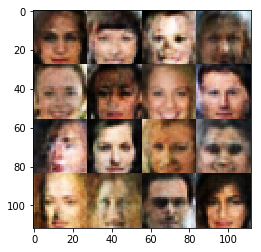

Epochs 3710/300000 Batch Step 545/3166 gen_loss = -3.6088778972625732..., disc_loss = -1.4047901630401611..., train using time = 10.393
Epochs 3720/300000 Batch Step 555/3166 gen_loss = -4.724270343780518..., disc_loss = -1.3013265132904053..., train using time = 10.245
Epochs 3730/300000 Batch Step 565/3166 gen_loss = -4.966616153717041..., disc_loss = -1.2799230813980103..., train using time = 9.139
Epochs 3740/300000 Batch Step 575/3166 gen_loss = -4.359535217285156..., disc_loss = -1.2325505018234253..., train using time = 9.704
Epochs 3750/300000 Batch Step 585/3166 gen_loss = -4.1461181640625..., disc_loss = -1.4322235584259033..., train using time = 10.237
Epochs 3760/300000 Batch Step 595/3166 gen_loss = -5.095192909240723..., disc_loss = -1.2604974508285522..., train using time = 8.938
Epochs 3770/300000 Batch Step 605/3166 gen_loss = -4.925745964050293..., disc_loss = -1.3537604808807373..., train using time = 10.358
Epochs 3780/300000 Batch Step 615/3166 gen_loss = -4.965270

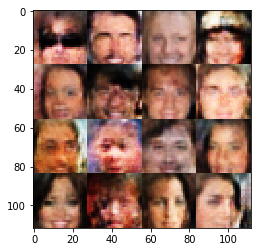

Epochs 3810/300000 Batch Step 645/3166 gen_loss = -3.357381820678711..., disc_loss = -1.255856990814209..., train using time = 10.156
Epochs 3820/300000 Batch Step 655/3166 gen_loss = -4.409490585327148..., disc_loss = -1.2735968828201294..., train using time = 8.957
Epochs 3830/300000 Batch Step 665/3166 gen_loss = -2.8919477462768555..., disc_loss = -1.4168238639831543..., train using time = 10.310
Epochs 3840/300000 Batch Step 675/3166 gen_loss = -4.199816703796387..., disc_loss = -1.3695389032363892..., train using time = 12.158
Epochs 3850/300000 Batch Step 685/3166 gen_loss = -5.035213470458984..., disc_loss = -1.4000608921051025..., train using time = 9.058
Epochs 3860/300000 Batch Step 695/3166 gen_loss = -3.687169313430786..., disc_loss = -1.233025074005127..., train using time = 9.198
Epochs 3870/300000 Batch Step 705/3166 gen_loss = -4.721174716949463..., disc_loss = -1.4141368865966797..., train using time = 10.256
Epochs 3880/300000 Batch Step 715/3166 gen_loss = -5.182055

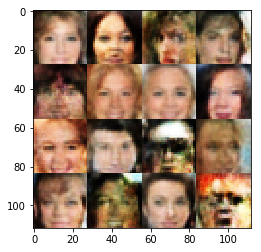

Epochs 3910/300000 Batch Step 745/3166 gen_loss = -3.7410683631896973..., disc_loss = -1.2634310722351074..., train using time = 9.372
Epochs 3920/300000 Batch Step 755/3166 gen_loss = -3.9838571548461914..., disc_loss = -1.2561419010162354..., train using time = 8.950
Epochs 3930/300000 Batch Step 765/3166 gen_loss = -4.0430073738098145..., disc_loss = -1.2569515705108643..., train using time = 10.185
Epochs 3940/300000 Batch Step 775/3166 gen_loss = -4.818042755126953..., disc_loss = -1.0774204730987549..., train using time = 9.860
Epochs 3950/300000 Batch Step 785/3166 gen_loss = -3.874042510986328..., disc_loss = -1.2267471551895142..., train using time = 10.392
Epochs 3960/300000 Batch Step 795/3166 gen_loss = -4.926024436950684..., disc_loss = -1.4363548755645752..., train using time = 11.066
Epochs 3970/300000 Batch Step 805/3166 gen_loss = -4.786960124969482..., disc_loss = -1.1379824876785278..., train using time = 9.112
Epochs 3980/300000 Batch Step 815/3166 gen_loss = -4.852

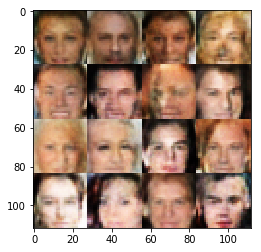

Epochs 4010/300000 Batch Step 845/3166 gen_loss = -4.7389020919799805..., disc_loss = -1.392577052116394..., train using time = 10.204
Epochs 4020/300000 Batch Step 855/3166 gen_loss = -4.806095600128174..., disc_loss = -1.1901204586029053..., train using time = 10.185
Epochs 4030/300000 Batch Step 865/3166 gen_loss = -4.299169540405273..., disc_loss = -1.2484649419784546..., train using time = 9.099
Epochs 4040/300000 Batch Step 875/3166 gen_loss = -3.480088233947754..., disc_loss = -1.5358197689056396..., train using time = 10.174
Epochs 4050/300000 Batch Step 885/3166 gen_loss = -4.359326362609863..., disc_loss = -1.1886389255523682..., train using time = 10.176
Epochs 4060/300000 Batch Step 895/3166 gen_loss = -3.755964756011963..., disc_loss = -1.2965023517608643..., train using time = 8.933
Epochs 4070/300000 Batch Step 905/3166 gen_loss = -4.4172587394714355..., disc_loss = -1.0915809869766235..., train using time = 10.290
Epochs 4080/300000 Batch Step 915/3166 gen_loss = -4.350

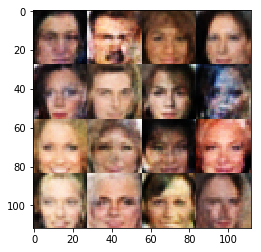

Epochs 4110/300000 Batch Step 945/3166 gen_loss = -3.741772413253784..., disc_loss = -1.068986177444458..., train using time = 10.284
Epochs 4120/300000 Batch Step 955/3166 gen_loss = -3.3027896881103516..., disc_loss = -1.0307743549346924..., train using time = 8.975
Epochs 4130/300000 Batch Step 965/3166 gen_loss = -4.328152656555176..., disc_loss = -1.3874021768569946..., train using time = 10.946
Epochs 4140/300000 Batch Step 975/3166 gen_loss = -4.264249801635742..., disc_loss = -1.143115758895874..., train using time = 12.137
Epochs 4150/300000 Batch Step 985/3166 gen_loss = -4.553305625915527..., disc_loss = -1.2288917303085327..., train using time = 9.135
Epochs 4160/300000 Batch Step 995/3166 gen_loss = -4.141167640686035..., disc_loss = -1.1753685474395752..., train using time = 8.985
Epochs 4170/300000 Batch Step 1005/3166 gen_loss = -3.724167823791504..., disc_loss = -1.2907826900482178..., train using time = 10.123
Epochs 4180/300000 Batch Step 1015/3166 gen_loss = -3.4073

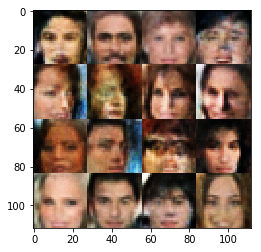

Epochs 4210/300000 Batch Step 1045/3166 gen_loss = -4.472209930419922..., disc_loss = -1.0861773490905762..., train using time = 9.614
Epochs 4220/300000 Batch Step 1055/3166 gen_loss = -5.960694313049316..., disc_loss = -1.1568126678466797..., train using time = 9.029
Epochs 4230/300000 Batch Step 1065/3166 gen_loss = -4.485547065734863..., disc_loss = -1.1969125270843506..., train using time = 10.326
Epochs 4240/300000 Batch Step 1075/3166 gen_loss = -4.356882095336914..., disc_loss = -1.2808934450149536..., train using time = 10.320
Epochs 4250/300000 Batch Step 1085/3166 gen_loss = -4.1323981285095215..., disc_loss = -1.2339211702346802..., train using time = 10.231
Epochs 4260/300000 Batch Step 1095/3166 gen_loss = -4.407428741455078..., disc_loss = -1.5259422063827515..., train using time = 10.521
Epochs 4270/300000 Batch Step 1105/3166 gen_loss = -5.032886981964111..., disc_loss = -1.1357530355453491..., train using time = 9.060
Epochs 4280/300000 Batch Step 1115/3166 gen_loss =

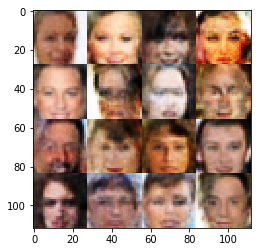

Epochs 4310/300000 Batch Step 1145/3166 gen_loss = -4.810042858123779..., disc_loss = -1.0701698064804077..., train using time = 10.289
Epochs 4320/300000 Batch Step 1155/3166 gen_loss = -4.497192859649658..., disc_loss = -1.29662024974823..., train using time = 10.163
Epochs 4330/300000 Batch Step 1165/3166 gen_loss = -5.807229518890381..., disc_loss = -1.3269546031951904..., train using time = 9.070
Epochs 4340/300000 Batch Step 1175/3166 gen_loss = -5.3351850509643555..., disc_loss = -1.2665128707885742..., train using time = 10.939
Epochs 4350/300000 Batch Step 1185/3166 gen_loss = -4.719588279724121..., disc_loss = -1.2518600225448608..., train using time = 9.221
Epochs 4360/300000 Batch Step 1195/3166 gen_loss = -4.557092189788818..., disc_loss = -1.2503941059112549..., train using time = 9.002
Epochs 4370/300000 Batch Step 1205/3166 gen_loss = -4.187906742095947..., disc_loss = -1.3613214492797852..., train using time = 10.246
Epochs 4380/300000 Batch Step 1215/3166 gen_loss = -

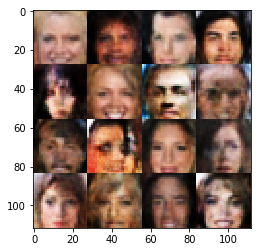

Epochs 4410/300000 Batch Step 1245/3166 gen_loss = -5.2444329261779785..., disc_loss = -1.222874402999878..., train using time = 9.259
Epochs 4420/300000 Batch Step 1255/3166 gen_loss = -3.912874698638916..., disc_loss = -1.1849021911621094..., train using time = 9.044
Epochs 4430/300000 Batch Step 1265/3166 gen_loss = -4.786862373352051..., disc_loss = -1.166741132736206..., train using time = 11.050
Epochs 4440/300000 Batch Step 1275/3166 gen_loss = -5.705550193786621..., disc_loss = -1.1895068883895874..., train using time = 10.943
Epochs 4450/300000 Batch Step 1285/3166 gen_loss = -5.09337043762207..., disc_loss = -1.236467957496643..., train using time = 9.008
Epochs 4460/300000 Batch Step 1295/3166 gen_loss = -5.415642738342285..., disc_loss = -1.2646898031234741..., train using time = 10.441
Epochs 4470/300000 Batch Step 1305/3166 gen_loss = -3.5371289253234863..., disc_loss = -1.10498046875..., train using time = 9.820
Epochs 4480/300000 Batch Step 1315/3166 gen_loss = -3.29832

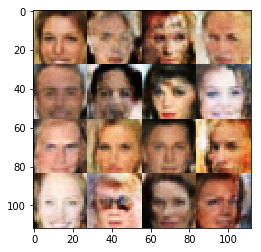

Epochs 4510/300000 Batch Step 1345/3166 gen_loss = -4.76418399810791..., disc_loss = -1.2043052911758423..., train using time = 9.085
Epochs 4520/300000 Batch Step 1355/3166 gen_loss = -5.0652079582214355..., disc_loss = -1.410171389579773..., train using time = 10.169
Epochs 4530/300000 Batch Step 1365/3166 gen_loss = -5.219841957092285..., disc_loss = -1.2381149530410767..., train using time = 9.653
Epochs 4540/300000 Batch Step 1375/3166 gen_loss = -5.125168323516846..., disc_loss = -1.326481819152832..., train using time = 10.043
Epochs 4550/300000 Batch Step 1385/3166 gen_loss = -5.525757789611816..., disc_loss = -1.1084349155426025..., train using time = 12.664
Epochs 4560/300000 Batch Step 1395/3166 gen_loss = -4.305710792541504..., disc_loss = -1.2109475135803223..., train using time = 9.321
Epochs 4570/300000 Batch Step 1405/3166 gen_loss = -5.542933940887451..., disc_loss = -1.1225244998931885..., train using time = 9.048
Epochs 4580/300000 Batch Step 1415/3166 gen_loss = -4.

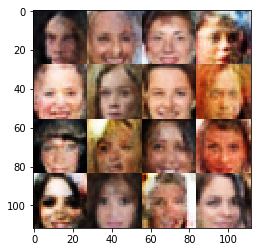

Epochs 4610/300000 Batch Step 1445/3166 gen_loss = -5.13509464263916..., disc_loss = -1.2891792058944702..., train using time = 12.889
Epochs 4620/300000 Batch Step 1455/3166 gen_loss = -5.149117469787598..., disc_loss = -1.1854057312011719..., train using time = 9.437
Epochs 4630/300000 Batch Step 1465/3166 gen_loss = -3.9074482917785645..., disc_loss = -1.0476523637771606..., train using time = 8.912
Epochs 4640/300000 Batch Step 1475/3166 gen_loss = -5.859047889709473..., disc_loss = -1.0678012371063232..., train using time = 13.586
Epochs 4650/300000 Batch Step 1485/3166 gen_loss = -6.03809928894043..., disc_loss = -1.1359138488769531..., train using time = 9.172
Epochs 4660/300000 Batch Step 1495/3166 gen_loss = -6.735434532165527..., disc_loss = -1.1702558994293213..., train using time = 9.084
Epochs 4670/300000 Batch Step 1505/3166 gen_loss = -4.86691427230835..., disc_loss = -1.236933946609497..., train using time = 12.186
Epochs 4680/300000 Batch Step 1515/3166 gen_loss = -5.3

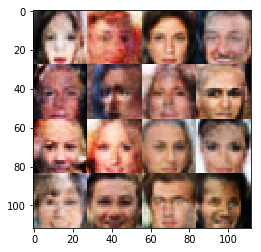

Epochs 4710/300000 Batch Step 1545/3166 gen_loss = -4.451228141784668..., disc_loss = -0.937656581401825..., train using time = 9.676
Epochs 4720/300000 Batch Step 1555/3166 gen_loss = -5.742331504821777..., disc_loss = -1.1912816762924194..., train using time = 9.909
Epochs 4730/300000 Batch Step 1565/3166 gen_loss = -4.0071868896484375..., disc_loss = -1.0891485214233398..., train using time = 13.227
Epochs 4740/300000 Batch Step 1575/3166 gen_loss = -5.900757312774658..., disc_loss = -1.1502560377120972..., train using time = 10.183
Epochs 4750/300000 Batch Step 1585/3166 gen_loss = -5.408962726593018..., disc_loss = -1.1809478998184204..., train using time = 8.971
Epochs 4760/300000 Batch Step 1595/3166 gen_loss = -5.734067440032959..., disc_loss = -1.0420124530792236..., train using time = 10.325
Epochs 4770/300000 Batch Step 1605/3166 gen_loss = -5.1641926765441895..., disc_loss = -1.07805597782135..., train using time = 8.944
Epochs 4780/300000 Batch Step 1615/3166 gen_loss = -6

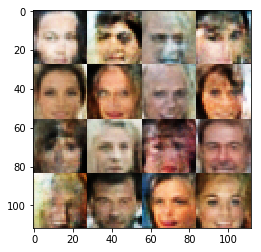

Epochs 4810/300000 Batch Step 1645/3166 gen_loss = -4.194625377655029..., disc_loss = -1.2799161672592163..., train using time = 8.964
Epochs 4820/300000 Batch Step 1655/3166 gen_loss = -5.814192771911621..., disc_loss = -1.2729251384735107..., train using time = 10.867
Epochs 4830/300000 Batch Step 1665/3166 gen_loss = -5.672904968261719..., disc_loss = -1.0615984201431274..., train using time = 8.993
Epochs 4840/300000 Batch Step 1675/3166 gen_loss = -4.81680154800415..., disc_loss = -1.1699588298797607..., train using time = 10.350
Epochs 4850/300000 Batch Step 1685/3166 gen_loss = -6.753705024719238..., disc_loss = -1.082581877708435..., train using time = 12.155
Epochs 4860/300000 Batch Step 1695/3166 gen_loss = -5.662174224853516..., disc_loss = -1.2883291244506836..., train using time = 9.022
Epochs 4870/300000 Batch Step 1705/3166 gen_loss = -5.490261077880859..., disc_loss = -1.1116081476211548..., train using time = 8.989
Epochs 4880/300000 Batch Step 1715/3166 gen_loss = -6.

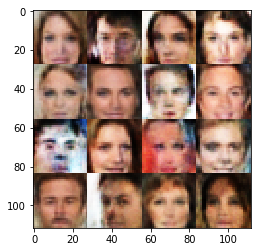

Epochs 4910/300000 Batch Step 1745/3166 gen_loss = -6.015178203582764..., disc_loss = -1.1393945217132568..., train using time = 13.313
Epochs 4920/300000 Batch Step 1755/3166 gen_loss = -6.628843307495117..., disc_loss = -1.120632529258728..., train using time = 9.062
Epochs 4930/300000 Batch Step 1765/3166 gen_loss = -4.883281230926514..., disc_loss = -1.1430524587631226..., train using time = 8.861
Epochs 4940/300000 Batch Step 1775/3166 gen_loss = -4.6010518074035645..., disc_loss = -1.0621083974838257..., train using time = 13.343
Epochs 4950/300000 Batch Step 1785/3166 gen_loss = -5.504020690917969..., disc_loss = -1.1605908870697021..., train using time = 9.378
Epochs 4960/300000 Batch Step 1795/3166 gen_loss = -5.147459983825684..., disc_loss = -1.1060516834259033..., train using time = 9.419
Epochs 4970/300000 Batch Step 1805/3166 gen_loss = -6.648837089538574..., disc_loss = -1.1432883739471436..., train using time = 11.743
Epochs 4980/300000 Batch Step 1815/3166 gen_loss = -

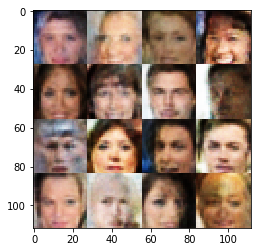

Epochs 5010/300000 Batch Step 1845/3166 gen_loss = -6.070149898529053..., disc_loss = -1.1963945627212524..., train using time = 9.000
Epochs 5020/300000 Batch Step 1855/3166 gen_loss = -5.103229999542236..., disc_loss = -1.097203016281128..., train using time = 9.109
Epochs 5030/300000 Batch Step 1865/3166 gen_loss = -5.714596271514893..., disc_loss = -1.1816449165344238..., train using time = 10.732
Epochs 5040/300000 Batch Step 1875/3166 gen_loss = -6.272120475769043..., disc_loss = -1.18372642993927..., train using time = 9.669
Epochs 5050/300000 Batch Step 1885/3166 gen_loss = -6.597467422485352..., disc_loss = -0.9525500535964966..., train using time = 9.074
Epochs 5060/300000 Batch Step 1895/3166 gen_loss = -6.214440822601318..., disc_loss = -0.9708061218261719..., train using time = 10.178
Epochs 5070/300000 Batch Step 1905/3166 gen_loss = -5.287325859069824..., disc_loss = -1.094141960144043..., train using time = 9.094
Epochs 5080/300000 Batch Step 1915/3166 gen_loss = -6.480

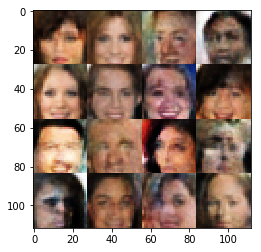

Epochs 5110/300000 Batch Step 1945/3166 gen_loss = -6.579555988311768..., disc_loss = -1.1801170110702515..., train using time = 8.963
Epochs 5120/300000 Batch Step 1955/3166 gen_loss = -6.643516540527344..., disc_loss = -1.0160460472106934..., train using time = 10.148
Epochs 5130/300000 Batch Step 1965/3166 gen_loss = -6.285924434661865..., disc_loss = -1.1627506017684937..., train using time = 9.188
Epochs 5140/300000 Batch Step 1975/3166 gen_loss = -6.8737945556640625..., disc_loss = -1.1925686597824097..., train using time = 12.336
Epochs 5150/300000 Batch Step 1985/3166 gen_loss = -7.867373466491699..., disc_loss = -0.928102970123291..., train using time = 10.201
Epochs 5160/300000 Batch Step 1995/3166 gen_loss = -6.421764850616455..., disc_loss = -1.1638119220733643..., train using time = 9.002
Epochs 5170/300000 Batch Step 2005/3166 gen_loss = -7.449279308319092..., disc_loss = -1.1246126890182495..., train using time = 8.919
Epochs 5180/300000 Batch Step 2015/3166 gen_loss = -

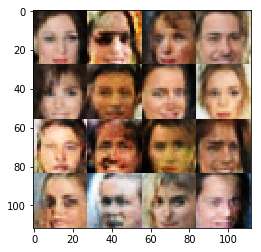

Epochs 5210/300000 Batch Step 2045/3166 gen_loss = -7.1788530349731445..., disc_loss = -0.9759142994880676..., train using time = 11.197
Epochs 5220/300000 Batch Step 2055/3166 gen_loss = -6.293801784515381..., disc_loss = -1.0856900215148926..., train using time = 9.052
Epochs 5230/300000 Batch Step 2065/3166 gen_loss = -5.394347667694092..., disc_loss = -0.9733651280403137..., train using time = 10.288
Epochs 5240/300000 Batch Step 2075/3166 gen_loss = -7.1007585525512695..., disc_loss = -1.1033252477645874..., train using time = 10.150
Epochs 5250/300000 Batch Step 2085/3166 gen_loss = -6.541756629943848..., disc_loss = -0.985080897808075..., train using time = 9.073
Epochs 5260/300000 Batch Step 2095/3166 gen_loss = -6.013828754425049..., disc_loss = -1.1432918310165405..., train using time = 10.688
Epochs 5270/300000 Batch Step 2105/3166 gen_loss = -5.003447532653809..., disc_loss = -0.9054533243179321..., train using time = 11.132
Epochs 5280/300000 Batch Step 2115/3166 gen_loss 

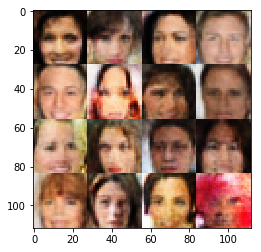

Epochs 5310/300000 Batch Step 2145/3166 gen_loss = -6.529360771179199..., disc_loss = -1.0592243671417236..., train using time = 9.151
Epochs 5320/300000 Batch Step 2155/3166 gen_loss = -7.3465094566345215..., disc_loss = -1.1255671977996826..., train using time = 11.102
Epochs 5330/300000 Batch Step 2165/3166 gen_loss = -7.360857963562012..., disc_loss = -0.9603330492973328..., train using time = 12.579
Epochs 5340/300000 Batch Step 2175/3166 gen_loss = -6.648326873779297..., disc_loss = -1.0169953107833862..., train using time = 9.137
Epochs 5350/300000 Batch Step 2185/3166 gen_loss = -7.896481513977051..., disc_loss = -1.1975901126861572..., train using time = 8.894
Epochs 5360/300000 Batch Step 2195/3166 gen_loss = -6.67714786529541..., disc_loss = -1.2036317586898804..., train using time = 10.440
Epochs 5370/300000 Batch Step 2205/3166 gen_loss = -6.7294816970825195..., disc_loss = -0.9951812624931335..., train using time = 9.109
Epochs 5380/300000 Batch Step 2215/3166 gen_loss = 

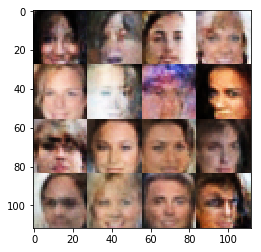

Epochs 5410/300000 Batch Step 2245/3166 gen_loss = -6.800260066986084..., disc_loss = -0.9742641448974609..., train using time = 8.888
Epochs 5420/300000 Batch Step 2255/3166 gen_loss = -6.992559432983398..., disc_loss = -0.9458475112915039..., train using time = 10.087
Epochs 5430/300000 Batch Step 2265/3166 gen_loss = -6.768595218658447..., disc_loss = -1.0782184600830078..., train using time = 11.385
Epochs 5440/300000 Batch Step 2275/3166 gen_loss = -6.41435432434082..., disc_loss = -0.8849102258682251..., train using time = 10.170
Epochs 5450/300000 Batch Step 2285/3166 gen_loss = -7.009523868560791..., disc_loss = -1.10478937625885..., train using time = 9.663
Epochs 5460/300000 Batch Step 2295/3166 gen_loss = -6.810917854309082..., disc_loss = -1.051218867301941..., train using time = 8.967
Epochs 5470/300000 Batch Step 2305/3166 gen_loss = -6.801401138305664..., disc_loss = -1.0690405368804932..., train using time = 8.997
Epochs 5480/300000 Batch Step 2315/3166 gen_loss = -7.97

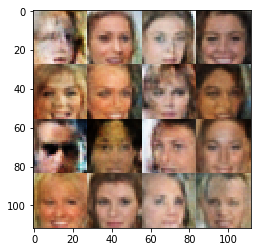

Epochs 5510/300000 Batch Step 2345/3166 gen_loss = -7.163012981414795..., disc_loss = -1.1735048294067383..., train using time = 9.007
Epochs 5520/300000 Batch Step 2355/3166 gen_loss = -7.467642784118652..., disc_loss = -1.105377435684204..., train using time = 8.958
Epochs 5530/300000 Batch Step 2365/3166 gen_loss = -7.043728828430176..., disc_loss = -1.0709559917449951..., train using time = 11.064
Epochs 5540/300000 Batch Step 2375/3166 gen_loss = -6.32724666595459..., disc_loss = -1.0115344524383545..., train using time = 9.198
Epochs 5550/300000 Batch Step 2385/3166 gen_loss = -8.096200942993164..., disc_loss = -1.0494906902313232..., train using time = 9.114
Epochs 5560/300000 Batch Step 2395/3166 gen_loss = -6.793606758117676..., disc_loss = -1.0137327909469604..., train using time = 10.239
Epochs 5570/300000 Batch Step 2405/3166 gen_loss = -7.471288681030273..., disc_loss = -1.0019315481185913..., train using time = 9.067
Epochs 5580/300000 Batch Step 2415/3166 gen_loss = -8.1

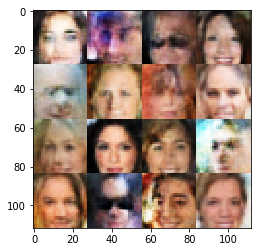

Epochs 5610/300000 Batch Step 2445/3166 gen_loss = -7.1262712478637695..., disc_loss = -0.9975200891494751..., train using time = 9.103
Epochs 5620/300000 Batch Step 2455/3166 gen_loss = -7.3598222732543945..., disc_loss = -1.0306384563446045..., train using time = 11.183
Epochs 5630/300000 Batch Step 2465/3166 gen_loss = -6.626450538635254..., disc_loss = -0.9317823648452759..., train using time = 10.366
Epochs 5640/300000 Batch Step 2475/3166 gen_loss = -6.341263294219971..., disc_loss = -1.1730411052703857..., train using time = 9.231
Epochs 5650/300000 Batch Step 2485/3166 gen_loss = -6.464425086975098..., disc_loss = -1.0190128087997437..., train using time = 10.276
Epochs 5660/300000 Batch Step 2495/3166 gen_loss = -5.899283409118652..., disc_loss = -1.07143235206604..., train using time = 8.971
Epochs 5670/300000 Batch Step 2505/3166 gen_loss = -7.443652629852295..., disc_loss = -1.1250289678573608..., train using time = 9.156
Epochs 5680/300000 Batch Step 2515/3166 gen_loss = -

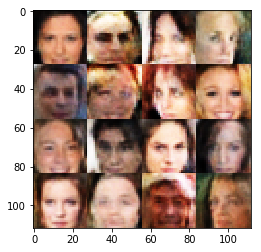

Epochs 5710/300000 Batch Step 2545/3166 gen_loss = -7.807065963745117..., disc_loss = -1.0045166015625..., train using time = 10.255
Epochs 5720/300000 Batch Step 2555/3166 gen_loss = -5.616979122161865..., disc_loss = -0.9811928868293762..., train using time = 8.959
Epochs 5730/300000 Batch Step 2565/3166 gen_loss = -7.94209098815918..., disc_loss = -0.8660296201705933..., train using time = 11.483
Epochs 5740/300000 Batch Step 2575/3166 gen_loss = -6.536568641662598..., disc_loss = -0.927901566028595..., train using time = 12.152
Epochs 5750/300000 Batch Step 2585/3166 gen_loss = -7.00209903717041..., disc_loss = -1.0149714946746826..., train using time = 9.081
Epochs 5760/300000 Batch Step 2595/3166 gen_loss = -5.7223005294799805..., disc_loss = -0.9654098749160767..., train using time = 9.274
Epochs 5770/300000 Batch Step 2605/3166 gen_loss = -6.903875827789307..., disc_loss = -1.0447007417678833..., train using time = 10.287
Epochs 5780/300000 Batch Step 2615/3166 gen_loss = -5.69

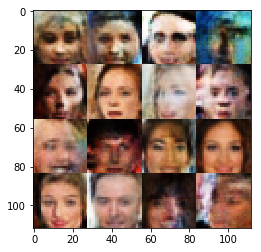

Epochs 5810/300000 Batch Step 2645/3166 gen_loss = -7.4166412353515625..., disc_loss = -1.1014407873153687..., train using time = 9.023
Epochs 5820/300000 Batch Step 2655/3166 gen_loss = -7.126108169555664..., disc_loss = -1.0408741235733032..., train using time = 8.909
Epochs 5830/300000 Batch Step 2665/3166 gen_loss = -7.154876708984375..., disc_loss = -0.9263296127319336..., train using time = 13.273
Epochs 5840/300000 Batch Step 2675/3166 gen_loss = -7.045719146728516..., disc_loss = -0.937233567237854..., train using time = 9.315
Epochs 5850/300000 Batch Step 2685/3166 gen_loss = -6.005159378051758..., disc_loss = -0.9506748914718628..., train using time = 9.029
Epochs 5860/300000 Batch Step 2695/3166 gen_loss = -7.611404895782471..., disc_loss = -0.9885905385017395..., train using time = 12.275
Epochs 5870/300000 Batch Step 2705/3166 gen_loss = -6.215507507324219..., disc_loss = -1.0196752548217773..., train using time = 9.056
Epochs 5880/300000 Batch Step 2715/3166 gen_loss = -7

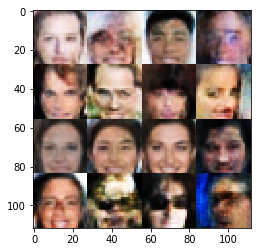

Epochs 5910/300000 Batch Step 2745/3166 gen_loss = -7.74032735824585..., disc_loss = -0.9850556254386902..., train using time = 9.014
Epochs 5920/300000 Batch Step 2755/3166 gen_loss = -8.395265579223633..., disc_loss = -1.1836345195770264..., train using time = 13.541
Epochs 5930/300000 Batch Step 2765/3166 gen_loss = -7.198895454406738..., disc_loss = -1.0391919612884521..., train using time = 10.335
Epochs 5940/300000 Batch Step 2775/3166 gen_loss = -7.3457932472229..., disc_loss = -0.9831655621528625..., train using time = 9.760
Epochs 5950/300000 Batch Step 2785/3166 gen_loss = -7.352653503417969..., disc_loss = -1.0712406635284424..., train using time = 10.685
Epochs 5960/300000 Batch Step 2795/3166 gen_loss = -6.729972839355469..., disc_loss = -0.8235136866569519..., train using time = 9.300
Epochs 5970/300000 Batch Step 2805/3166 gen_loss = -7.806516170501709..., disc_loss = -0.764926552772522..., train using time = 9.082
Epochs 5980/300000 Batch Step 2815/3166 gen_loss = -7.87

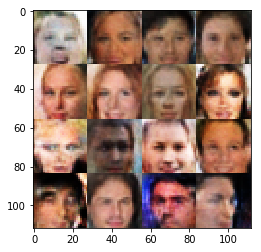

Epochs 6010/300000 Batch Step 2845/3166 gen_loss = -7.079554557800293..., disc_loss = -1.0230863094329834..., train using time = 10.047
Epochs 6020/300000 Batch Step 2855/3166 gen_loss = -7.36499547958374..., disc_loss = -1.0052286386489868..., train using time = 9.213
Epochs 6030/300000 Batch Step 2865/3166 gen_loss = -7.8743791580200195..., disc_loss = -0.8756296038627625..., train using time = 12.066
Epochs 6040/300000 Batch Step 2875/3166 gen_loss = -7.526049613952637..., disc_loss = -1.0614476203918457..., train using time = 10.474
Epochs 6050/300000 Batch Step 2885/3166 gen_loss = -7.967626571655273..., disc_loss = -0.809674084186554..., train using time = 9.129
Epochs 6060/300000 Batch Step 2895/3166 gen_loss = -7.772066116333008..., disc_loss = -0.8943946957588196..., train using time = 8.980
Epochs 6070/300000 Batch Step 2905/3166 gen_loss = -6.91663932800293..., disc_loss = -1.0193992853164673..., train using time = 10.925
Epochs 6080/300000 Batch Step 2915/3166 gen_loss = -7

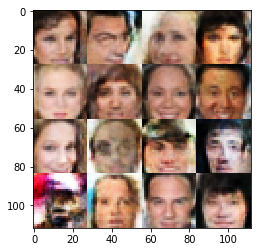

Epochs 6110/300000 Batch Step 2945/3166 gen_loss = -8.941253662109375..., disc_loss = -0.829730212688446..., train using time = 9.427
Epochs 6120/300000 Batch Step 2955/3166 gen_loss = -7.43742561340332..., disc_loss = -0.8587415814399719..., train using time = 10.265
Epochs 6130/300000 Batch Step 2965/3166 gen_loss = -7.460269927978516..., disc_loss = -0.9184281229972839..., train using time = 10.339
Epochs 6140/300000 Batch Step 2975/3166 gen_loss = -7.741593837738037..., disc_loss = -1.025287389755249..., train using time = 9.095
Epochs 6150/300000 Batch Step 2985/3166 gen_loss = -7.455706596374512..., disc_loss = -1.1261346340179443..., train using time = 10.247
Epochs 6160/300000 Batch Step 2995/3166 gen_loss = -7.573210716247559..., disc_loss = -1.10928213596344..., train using time = 11.148
Epochs 6170/300000 Batch Step 3005/3166 gen_loss = -6.264404773712158..., disc_loss = -0.9805313348770142..., train using time = 11.412
Epochs 6180/300000 Batch Step 3015/3166 gen_loss = -6.9

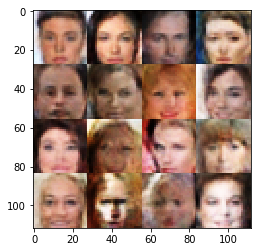

Epochs 6210/300000 Batch Step 3045/3166 gen_loss = -8.215805053710938..., disc_loss = -0.9837135076522827..., train using time = 10.297
Epochs 6220/300000 Batch Step 3055/3166 gen_loss = -7.172656536102295..., disc_loss = -0.8683971166610718..., train using time = 12.120
Epochs 6230/300000 Batch Step 3065/3166 gen_loss = -8.076128005981445..., disc_loss = -1.0401643514633179..., train using time = 8.977
Epochs 6240/300000 Batch Step 3075/3166 gen_loss = -9.297182083129883..., disc_loss = -0.8597937822341919..., train using time = 8.947
Epochs 6250/300000 Batch Step 3085/3166 gen_loss = -7.962495803833008..., disc_loss = -1.0237627029418945..., train using time = 10.494
Epochs 6260/300000 Batch Step 3095/3166 gen_loss = -6.984096527099609..., disc_loss = -0.995144248008728..., train using time = 9.669
Epochs 6270/300000 Batch Step 3105/3166 gen_loss = -8.921369552612305..., disc_loss = -0.8428610563278198..., train using time = 13.274
Epochs 6280/300000 Batch Step 3115/3166 gen_loss = -

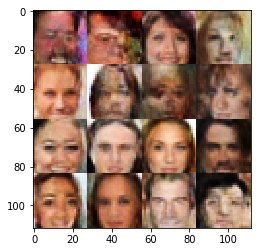

Epochs 6310/300000 Batch Step 3145/3166 gen_loss = -7.801118850708008..., disc_loss = -0.8799886703491211..., train using time = 10.203
Epochs 6320/300000 Batch Step 3155/3166 gen_loss = -9.064617156982422..., disc_loss = -0.9337476491928101..., train using time = 10.208
Epochs 6330/300000 Batch Step 3165/3166 gen_loss = -8.545612335205078..., disc_loss = -0.8978618383407593..., train using time = 13.420
Epochs 6340/300000 Batch Step 10/3166 gen_loss = -7.686563014984131..., disc_loss = -1.027438759803772..., train using time = 9.932
Epochs 6350/300000 Batch Step 20/3166 gen_loss = -6.727665901184082..., disc_loss = -0.8179672956466675..., train using time = 9.070
Epochs 6360/300000 Batch Step 30/3166 gen_loss = -8.060441970825195..., disc_loss = -1.0133917331695557..., train using time = 9.834
Epochs 6370/300000 Batch Step 40/3166 gen_loss = -7.449016094207764..., disc_loss = -0.9193550944328308..., train using time = 10.076
Epochs 6380/300000 Batch Step 50/3166 gen_loss = -7.18415832

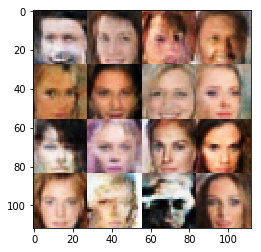

Epochs 6410/300000 Batch Step 80/3166 gen_loss = -9.127418518066406..., disc_loss = -0.9537116289138794..., train using time = 8.911
Epochs 6420/300000 Batch Step 90/3166 gen_loss = -7.154760837554932..., disc_loss = -0.9384878873825073..., train using time = 12.520
Epochs 6430/300000 Batch Step 100/3166 gen_loss = -8.119091033935547..., disc_loss = -0.9799798130989075..., train using time = 9.007
Epochs 6440/300000 Batch Step 110/3166 gen_loss = -9.664243698120117..., disc_loss = -0.8204303979873657..., train using time = 9.052
Epochs 6450/300000 Batch Step 120/3166 gen_loss = -8.064895629882812..., disc_loss = -0.9169646501541138..., train using time = 13.041
Epochs 6460/300000 Batch Step 130/3166 gen_loss = -7.8836140632629395..., disc_loss = -0.9848363995552063..., train using time = 9.112
Epochs 6470/300000 Batch Step 140/3166 gen_loss = -8.026704788208008..., disc_loss = -0.9117029905319214..., train using time = 10.141
Epochs 6480/300000 Batch Step 150/3166 gen_loss = -8.2073478

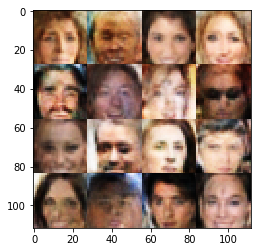

Epochs 6510/300000 Batch Step 180/3166 gen_loss = -7.650527000427246..., disc_loss = -0.9860554933547974..., train using time = 12.205
Epochs 6520/300000 Batch Step 190/3166 gen_loss = -8.667818069458008..., disc_loss = -0.9969730377197266..., train using time = 10.265
Epochs 6530/300000 Batch Step 200/3166 gen_loss = -8.459781646728516..., disc_loss = -0.6782468557357788..., train using time = 9.039
Epochs 6540/300000 Batch Step 210/3166 gen_loss = -9.172853469848633..., disc_loss = -0.7996065020561218..., train using time = 10.682
Epochs 6550/300000 Batch Step 220/3166 gen_loss = -8.679666519165039..., disc_loss = -0.808463454246521..., train using time = 8.902
Epochs 6560/300000 Batch Step 230/3166 gen_loss = -8.850920677185059..., disc_loss = -0.9592256546020508..., train using time = 9.132
Epochs 6570/300000 Batch Step 240/3166 gen_loss = -8.093255996704102..., disc_loss = -0.9356154203414917..., train using time = 13.803
Epochs 6580/300000 Batch Step 250/3166 gen_loss = -8.272269

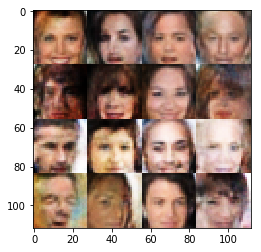

Epochs 6610/300000 Batch Step 280/3166 gen_loss = -7.796039581298828..., disc_loss = -0.9729822278022766..., train using time = 9.042
Epochs 6620/300000 Batch Step 290/3166 gen_loss = -7.948855400085449..., disc_loss = -1.0211658477783203..., train using time = 10.533
Epochs 6630/300000 Batch Step 300/3166 gen_loss = -6.933465957641602..., disc_loss = -0.8243659734725952..., train using time = 10.990
Epochs 6640/300000 Batch Step 310/3166 gen_loss = -8.275321960449219..., disc_loss = -1.0022735595703125..., train using time = 9.062
Epochs 6650/300000 Batch Step 320/3166 gen_loss = -9.49441146850586..., disc_loss = -0.8975343704223633..., train using time = 9.618
Epochs 6660/300000 Batch Step 330/3166 gen_loss = -8.854974746704102..., disc_loss = -0.9920190572738647..., train using time = 10.201
Epochs 6670/300000 Batch Step 340/3166 gen_loss = -7.693538665771484..., disc_loss = -1.1921720504760742..., train using time = 11.578
Epochs 6680/300000 Batch Step 350/3166 gen_loss = -9.437038

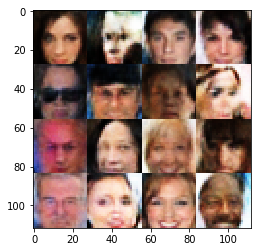

Epochs 6710/300000 Batch Step 380/3166 gen_loss = -8.211633682250977..., disc_loss = -0.9000753164291382..., train using time = 8.992
Epochs 6720/300000 Batch Step 390/3166 gen_loss = -8.489901542663574..., disc_loss = -1.0122742652893066..., train using time = 10.978
Epochs 6730/300000 Batch Step 400/3166 gen_loss = -8.207948684692383..., disc_loss = -0.9371978044509888..., train using time = 8.919
Epochs 6740/300000 Batch Step 410/3166 gen_loss = -8.347578048706055..., disc_loss = -0.9113337397575378..., train using time = 10.243
Epochs 6750/300000 Batch Step 420/3166 gen_loss = -7.325512886047363..., disc_loss = -0.7720546722412109..., train using time = 10.766
Epochs 6760/300000 Batch Step 430/3166 gen_loss = -8.409258842468262..., disc_loss = -0.8772653341293335..., train using time = 10.062
Epochs 6770/300000 Batch Step 440/3166 gen_loss = -8.101604461669922..., disc_loss = -1.1900608539581299..., train using time = 9.126
Epochs 6780/300000 Batch Step 450/3166 gen_loss = -8.93780

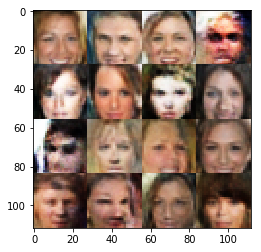

Epochs 6810/300000 Batch Step 480/3166 gen_loss = -7.595158576965332..., disc_loss = -0.8578861951828003..., train using time = 13.432
Epochs 6820/300000 Batch Step 490/3166 gen_loss = -8.66796588897705..., disc_loss = -0.9486174583435059..., train using time = 9.171
Epochs 6830/300000 Batch Step 500/3166 gen_loss = -9.691940307617188..., disc_loss = -0.8905667066574097..., train using time = 9.349
Epochs 6840/300000 Batch Step 510/3166 gen_loss = -9.004155158996582..., disc_loss = -0.908970057964325..., train using time = 10.229
Epochs 6850/300000 Batch Step 520/3166 gen_loss = -8.973838806152344..., disc_loss = -0.830255389213562..., train using time = 8.960
Epochs 6860/300000 Batch Step 530/3166 gen_loss = -8.633749961853027..., disc_loss = -0.9365485906600952..., train using time = 11.579
Epochs 6870/300000 Batch Step 540/3166 gen_loss = -9.900681495666504..., disc_loss = -0.9213158488273621..., train using time = 10.547
Epochs 6880/300000 Batch Step 550/3166 gen_loss = -9.69487571

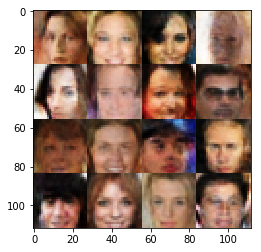

Epochs 6910/300000 Batch Step 580/3166 gen_loss = -9.540985107421875..., disc_loss = -0.8754188418388367..., train using time = 10.263
Epochs 6920/300000 Batch Step 590/3166 gen_loss = -9.522624969482422..., disc_loss = -0.9216899871826172..., train using time = 10.230
Epochs 6930/300000 Batch Step 600/3166 gen_loss = -9.800130844116211..., disc_loss = -0.8906208872795105..., train using time = 10.473
Epochs 6940/300000 Batch Step 610/3166 gen_loss = -8.944026947021484..., disc_loss = -1.0754063129425049..., train using time = 9.243
Epochs 6950/300000 Batch Step 620/3166 gen_loss = -8.551941871643066..., disc_loss = -1.0060333013534546..., train using time = 8.986
Epochs 6960/300000 Batch Step 630/3166 gen_loss = -9.682265281677246..., disc_loss = -0.8338717222213745..., train using time = 12.201
Epochs 6970/300000 Batch Step 640/3166 gen_loss = -9.068496704101562..., disc_loss = -0.9193481206893921..., train using time = 9.798
Epochs 6980/300000 Batch Step 650/3166 gen_loss = -8.95852

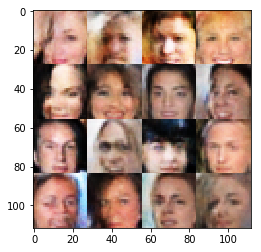

Epochs 7010/300000 Batch Step 680/3166 gen_loss = -9.09964370727539..., disc_loss = -0.8249313235282898..., train using time = 10.015
Epochs 7020/300000 Batch Step 690/3166 gen_loss = -9.334371566772461..., disc_loss = -0.82440584897995..., train using time = 10.592
Epochs 7030/300000 Batch Step 700/3166 gen_loss = -9.691974639892578..., disc_loss = -0.9536344408988953..., train using time = 9.109
Epochs 7040/300000 Batch Step 710/3166 gen_loss = -9.729952812194824..., disc_loss = -0.9151602983474731..., train using time = 10.329
Epochs 7050/300000 Batch Step 720/3166 gen_loss = -9.308572769165039..., disc_loss = -0.937853991985321..., train using time = 12.379
Epochs 7060/300000 Batch Step 730/3166 gen_loss = -9.645496368408203..., disc_loss = -0.8868110775947571..., train using time = 11.344
Epochs 7070/300000 Batch Step 740/3166 gen_loss = -8.636085510253906..., disc_loss = -0.8888856768608093..., train using time = 9.107
Epochs 7080/300000 Batch Step 750/3166 gen_loss = -9.12485504

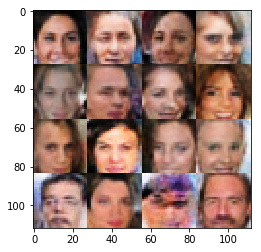

Epochs 7110/300000 Batch Step 780/3166 gen_loss = -9.533428192138672..., disc_loss = -0.8154295086860657..., train using time = 11.968
Epochs 7120/300000 Batch Step 790/3166 gen_loss = -8.621971130371094..., disc_loss = -0.7477296590805054..., train using time = 9.158
Epochs 7130/300000 Batch Step 800/3166 gen_loss = -10.354669570922852..., disc_loss = -0.7439835071563721..., train using time = 9.075
Epochs 7140/300000 Batch Step 810/3166 gen_loss = -9.133642196655273..., disc_loss = -0.9678019285202026..., train using time = 10.177
Epochs 7150/300000 Batch Step 820/3166 gen_loss = -9.572628021240234..., disc_loss = -0.8939704895019531..., train using time = 9.330
Epochs 7160/300000 Batch Step 830/3166 gen_loss = -9.33677864074707..., disc_loss = -0.8633043169975281..., train using time = 11.464
Epochs 7170/300000 Batch Step 840/3166 gen_loss = -9.497621536254883..., disc_loss = -0.7219778299331665..., train using time = 9.657
Epochs 7180/300000 Batch Step 850/3166 gen_loss = -9.656716

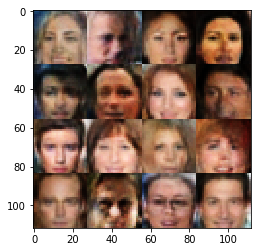

Epochs 7210/300000 Batch Step 880/3166 gen_loss = -9.993907928466797..., disc_loss = -0.8991713523864746..., train using time = 10.413
Epochs 7220/300000 Batch Step 890/3166 gen_loss = -9.960208892822266..., disc_loss = -0.937198281288147..., train using time = 10.845
Epochs 7230/300000 Batch Step 900/3166 gen_loss = -8.393987655639648..., disc_loss = -0.8141948580741882..., train using time = 9.112
Epochs 7240/300000 Batch Step 910/3166 gen_loss = -9.694755554199219..., disc_loss = -0.8274911642074585..., train using time = 9.099
Epochs 7250/300000 Batch Step 920/3166 gen_loss = -10.59709644317627..., disc_loss = -0.7254345417022705..., train using time = 8.986
Epochs 7260/300000 Batch Step 930/3166 gen_loss = -11.32313346862793..., disc_loss = -0.7993997931480408..., train using time = 11.978
Epochs 7270/300000 Batch Step 940/3166 gen_loss = -9.999480247497559..., disc_loss = -0.8258732557296753..., train using time = 9.168
Epochs 7280/300000 Batch Step 950/3166 gen_loss = -9.5103740

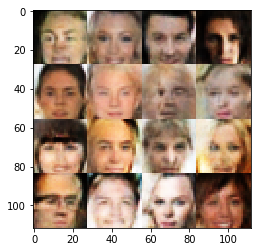

Epochs 7310/300000 Batch Step 980/3166 gen_loss = -9.700931549072266..., disc_loss = -0.7818784117698669..., train using time = 12.632
Epochs 7320/300000 Batch Step 990/3166 gen_loss = -10.794389724731445..., disc_loss = -0.8378109931945801..., train using time = 9.077
Epochs 7330/300000 Batch Step 1000/3166 gen_loss = -9.898407936096191..., disc_loss = -0.711887001991272..., train using time = 9.415
Epochs 7340/300000 Batch Step 1010/3166 gen_loss = -10.383340835571289..., disc_loss = -0.9400235414505005..., train using time = 11.957
Epochs 7350/300000 Batch Step 1020/3166 gen_loss = -9.380712509155273..., disc_loss = -0.8933771252632141..., train using time = 9.071
Epochs 7360/300000 Batch Step 1030/3166 gen_loss = -9.260666847229004..., disc_loss = -0.9521740674972534..., train using time = 10.053
Epochs 7370/300000 Batch Step 1040/3166 gen_loss = -10.585678100585938..., disc_loss = -0.8469827771186829..., train using time = 10.677
Epochs 7380/300000 Batch Step 1050/3166 gen_loss = 

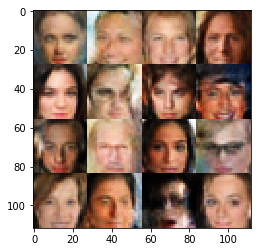

Epochs 7410/300000 Batch Step 1080/3166 gen_loss = -10.047961235046387..., disc_loss = -0.9219679832458496..., train using time = 11.140
Epochs 7420/300000 Batch Step 1090/3166 gen_loss = -10.151269912719727..., disc_loss = -0.8240429162979126..., train using time = 8.892
Epochs 7430/300000 Batch Step 1100/3166 gen_loss = -8.569219589233398..., disc_loss = -0.8223137855529785..., train using time = 10.433
Epochs 7440/300000 Batch Step 1110/3166 gen_loss = -8.323742866516113..., disc_loss = -0.7015089392662048..., train using time = 9.276
Epochs 7450/300000 Batch Step 1120/3166 gen_loss = -8.95815658569336..., disc_loss = -0.7830216288566589..., train using time = 9.040
Epochs 7460/300000 Batch Step 1130/3166 gen_loss = -9.938741683959961..., disc_loss = -0.7659216523170471..., train using time = 15.205
Epochs 7470/300000 Batch Step 1140/3166 gen_loss = -9.67794418334961..., disc_loss = -0.6726698875427246..., train using time = 9.063
Epochs 7480/300000 Batch Step 1150/3166 gen_loss = -

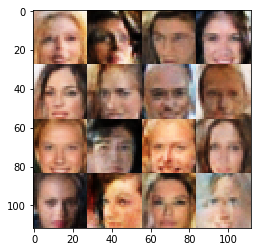

Epochs 7510/300000 Batch Step 1180/3166 gen_loss = -9.522393226623535..., disc_loss = -0.871137797832489..., train using time = 11.074
Epochs 7520/300000 Batch Step 1190/3166 gen_loss = -9.931525230407715..., disc_loss = -0.8463794589042664..., train using time = 13.241
Epochs 7530/300000 Batch Step 1200/3166 gen_loss = -10.26195240020752..., disc_loss = -0.9208517074584961..., train using time = 9.074
Epochs 7540/300000 Batch Step 1210/3166 gen_loss = -8.957621574401855..., disc_loss = -0.7603864073753357..., train using time = 8.984
Epochs 7550/300000 Batch Step 1220/3166 gen_loss = -11.017794609069824..., disc_loss = -0.8315197229385376..., train using time = 10.421
Epochs 7560/300000 Batch Step 1230/3166 gen_loss = -9.222949028015137..., disc_loss = -0.8404642343521118..., train using time = 10.233
Epochs 7570/300000 Batch Step 1240/3166 gen_loss = -10.411385536193848..., disc_loss = -0.7954968810081482..., train using time = 9.091
Epochs 7580/300000 Batch Step 1250/3166 gen_loss =

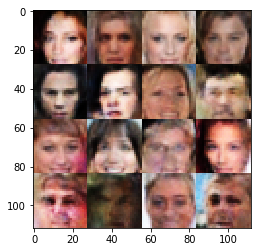

Epochs 7610/300000 Batch Step 1280/3166 gen_loss = -10.666337013244629..., disc_loss = -0.9115803837776184..., train using time = 13.224
Epochs 7620/300000 Batch Step 1290/3166 gen_loss = -9.978400230407715..., disc_loss = -0.7526201605796814..., train using time = 9.034
Epochs 7630/300000 Batch Step 1300/3166 gen_loss = -9.321657180786133..., disc_loss = -0.8206833004951477..., train using time = 9.275
Epochs 7640/300000 Batch Step 1310/3166 gen_loss = -10.224065780639648..., disc_loss = -0.8710902333259583..., train using time = 11.133
Epochs 7650/300000 Batch Step 1320/3166 gen_loss = -9.847503662109375..., disc_loss = -0.7919212579727173..., train using time = 9.153
Epochs 7660/300000 Batch Step 1330/3166 gen_loss = -10.441160202026367..., disc_loss = -0.9310288429260254..., train using time = 10.352
Epochs 7670/300000 Batch Step 1340/3166 gen_loss = -10.000425338745117..., disc_loss = -0.7535645961761475..., train using time = 10.301
Epochs 7680/300000 Batch Step 1350/3166 gen_los

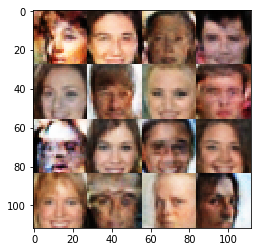

Epochs 7710/300000 Batch Step 1380/3166 gen_loss = -10.569337844848633..., disc_loss = -0.6387259364128113..., train using time = 9.153
Epochs 7720/300000 Batch Step 1390/3166 gen_loss = -8.619421005249023..., disc_loss = -0.9884134531021118..., train using time = 9.018
Epochs 7730/300000 Batch Step 1400/3166 gen_loss = -10.752092361450195..., disc_loss = -0.7047958374023438..., train using time = 11.143
Epochs 7740/300000 Batch Step 1410/3166 gen_loss = -10.49514389038086..., disc_loss = -0.6839602589607239..., train using time = 9.064
Epochs 7750/300000 Batch Step 1420/3166 gen_loss = -10.858001708984375..., disc_loss = -0.929627537727356..., train using time = 9.667
Epochs 7760/300000 Batch Step 1430/3166 gen_loss = -10.19394302368164..., disc_loss = -0.7814733386039734..., train using time = 11.382
Epochs 7770/300000 Batch Step 1440/3166 gen_loss = -10.333752632141113..., disc_loss = -0.8451940417289734..., train using time = 9.074
Epochs 7780/300000 Batch Step 1450/3166 gen_loss =

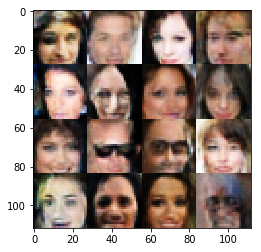

Epochs 7810/300000 Batch Step 1480/3166 gen_loss = -10.14400577545166..., disc_loss = -0.8516149520874023..., train using time = 11.064
Epochs 7820/300000 Batch Step 1490/3166 gen_loss = -10.967987060546875..., disc_loss = -0.8404842615127563..., train using time = 11.084
Epochs 7830/300000 Batch Step 1500/3166 gen_loss = -9.893016815185547..., disc_loss = -0.7197429537773132..., train using time = 9.163
Epochs 7840/300000 Batch Step 1510/3166 gen_loss = -10.247285842895508..., disc_loss = -0.8382499814033508..., train using time = 9.009
Epochs 7850/300000 Batch Step 1520/3166 gen_loss = -9.880887031555176..., disc_loss = -0.9176284670829773..., train using time = 11.896
Epochs 7860/300000 Batch Step 1530/3166 gen_loss = -10.206668853759766..., disc_loss = -0.7527661919593811..., train using time = 9.146
Epochs 7870/300000 Batch Step 1540/3166 gen_loss = -11.470573425292969..., disc_loss = -0.811921238899231..., train using time = 10.302
Epochs 7880/300000 Batch Step 1550/3166 gen_loss

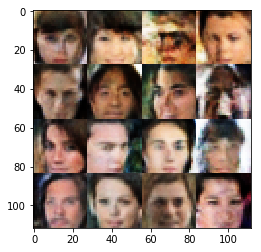

Epochs 7910/300000 Batch Step 1580/3166 gen_loss = -10.687634468078613..., disc_loss = -0.8378322720527649..., train using time = 10.781
Epochs 7920/300000 Batch Step 1590/3166 gen_loss = -10.665014266967773..., disc_loss = -0.7264944911003113..., train using time = 9.334
Epochs 7930/300000 Batch Step 1600/3166 gen_loss = -10.136075973510742..., disc_loss = -0.8320992588996887..., train using time = 10.222
Epochs 7940/300000 Batch Step 1610/3166 gen_loss = -10.91891098022461..., disc_loss = -0.6856542229652405..., train using time = 10.323
Epochs 7950/300000 Batch Step 1620/3166 gen_loss = -10.307221412658691..., disc_loss = -0.9059478640556335..., train using time = 11.120
Epochs 7960/300000 Batch Step 1630/3166 gen_loss = -10.657027244567871..., disc_loss = -0.7709850072860718..., train using time = 8.985
Epochs 7970/300000 Batch Step 1640/3166 gen_loss = -10.958343505859375..., disc_loss = -0.8404831886291504..., train using time = 10.335
Epochs 7980/300000 Batch Step 1650/3166 gen_

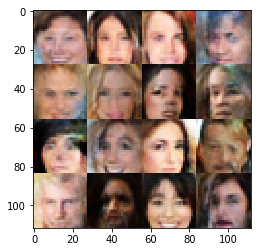

Epochs 8010/300000 Batch Step 1680/3166 gen_loss = -11.180091857910156..., disc_loss = -0.7962148785591125..., train using time = 9.139
Epochs 8020/300000 Batch Step 1690/3166 gen_loss = -11.011758804321289..., disc_loss = -0.8196298480033875..., train using time = 8.971
Epochs 8030/300000 Batch Step 1700/3166 gen_loss = -11.180758476257324..., disc_loss = -0.7720454931259155..., train using time = 10.344
Epochs 8040/300000 Batch Step 1710/3166 gen_loss = -11.479413986206055..., disc_loss = -0.7020823955535889..., train using time = 9.236
Epochs 8050/300000 Batch Step 1720/3166 gen_loss = -11.186565399169922..., disc_loss = -0.8423625826835632..., train using time = 11.407
Epochs 8060/300000 Batch Step 1730/3166 gen_loss = -11.588180541992188..., disc_loss = -0.7731611132621765..., train using time = 10.334
Epochs 8070/300000 Batch Step 1740/3166 gen_loss = -10.597529411315918..., disc_loss = -0.7239288091659546..., train using time = 9.032
Epochs 8080/300000 Batch Step 1750/3166 gen_l

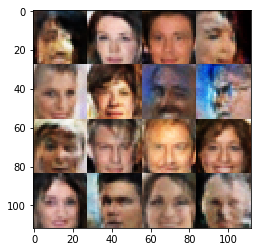

Epochs 8110/300000 Batch Step 1780/3166 gen_loss = -10.372413635253906..., disc_loss = -0.8218787908554077..., train using time = 10.647
Epochs 8120/300000 Batch Step 1790/3166 gen_loss = -10.709287643432617..., disc_loss = -0.7885175943374634..., train using time = 9.579
Epochs 8130/300000 Batch Step 1800/3166 gen_loss = -11.979598999023438..., disc_loss = -0.6615211963653564..., train using time = 9.117
Epochs 8140/300000 Batch Step 1810/3166 gen_loss = -10.774420738220215..., disc_loss = -0.7919274568557739..., train using time = 9.045
Epochs 8150/300000 Batch Step 1820/3166 gen_loss = -10.802656173706055..., disc_loss = -0.6608618497848511..., train using time = 12.615
Epochs 8160/300000 Batch Step 1830/3166 gen_loss = -10.749542236328125..., disc_loss = -0.7728333473205566..., train using time = 9.012
Epochs 8170/300000 Batch Step 1840/3166 gen_loss = -10.350600242614746..., disc_loss = -0.7805646061897278..., train using time = 11.030
Epochs 8180/300000 Batch Step 1850/3166 gen_l

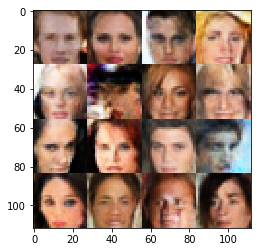

Epochs 8210/300000 Batch Step 1880/3166 gen_loss = -10.195703506469727..., disc_loss = -0.7214460372924805..., train using time = 9.243
Epochs 8220/300000 Batch Step 1890/3166 gen_loss = -10.89660358428955..., disc_loss = -0.604555070400238..., train using time = 9.103
Epochs 8230/300000 Batch Step 1900/3166 gen_loss = -11.475533485412598..., disc_loss = -0.8581749200820923..., train using time = 11.857
Epochs 8240/300000 Batch Step 1910/3166 gen_loss = -11.213401794433594..., disc_loss = -0.6919947862625122..., train using time = 9.117
Epochs 8250/300000 Batch Step 1920/3166 gen_loss = -11.22533893585205..., disc_loss = -0.8558828234672546..., train using time = 9.951
Epochs 8260/300000 Batch Step 1930/3166 gen_loss = -11.32366943359375..., disc_loss = -0.6965377926826477..., train using time = 10.298
Epochs 8270/300000 Batch Step 1940/3166 gen_loss = -11.01474380493164..., disc_loss = -0.7732380628585815..., train using time = 10.208
Epochs 8280/300000 Batch Step 1950/3166 gen_loss =

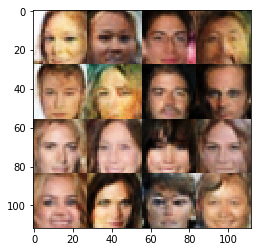

Epochs 8310/300000 Batch Step 1980/3166 gen_loss = -12.129205703735352..., disc_loss = -0.8151016235351562..., train using time = 9.027
Epochs 8320/300000 Batch Step 1990/3166 gen_loss = -11.042959213256836..., disc_loss = -0.7336049675941467..., train using time = 10.336
Epochs 8330/300000 Batch Step 2000/3166 gen_loss = -11.210728645324707..., disc_loss = -0.8780145645141602..., train using time = 9.179
Epochs 8340/300000 Batch Step 2010/3166 gen_loss = -11.652254104614258..., disc_loss = -0.7118090391159058..., train using time = 9.133
Epochs 8350/300000 Batch Step 2020/3166 gen_loss = -12.599700927734375..., disc_loss = -0.8606585264205933..., train using time = 13.645
Epochs 8360/300000 Batch Step 2030/3166 gen_loss = -12.163141250610352..., disc_loss = -0.464705228805542..., train using time = 9.156
Epochs 8370/300000 Batch Step 2040/3166 gen_loss = -12.529232025146484..., disc_loss = -0.8165146708488464..., train using time = 9.044
Epochs 8380/300000 Batch Step 2050/3166 gen_los

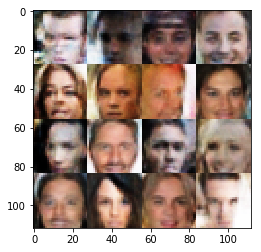

Epochs 8410/300000 Batch Step 2080/3166 gen_loss = -11.534632682800293..., disc_loss = -0.7722347974777222..., train using time = 12.139
Epochs 8420/300000 Batch Step 2090/3166 gen_loss = -10.599091529846191..., disc_loss = -0.7201697826385498..., train using time = 9.051
Epochs 8430/300000 Batch Step 2100/3166 gen_loss = -10.965169906616211..., disc_loss = -0.7022483944892883..., train using time = 9.322
Epochs 8440/300000 Batch Step 2110/3166 gen_loss = -10.708632469177246..., disc_loss = -0.8120719790458679..., train using time = 10.145
Epochs 8450/300000 Batch Step 2120/3166 gen_loss = -11.546947479248047..., disc_loss = -0.7359600067138672..., train using time = 10.822
Epochs 8460/300000 Batch Step 2130/3166 gen_loss = -10.394895553588867..., disc_loss = -0.7403427362442017..., train using time = 9.040
Epochs 8470/300000 Batch Step 2140/3166 gen_loss = -11.412164688110352..., disc_loss = -0.847142219543457..., train using time = 12.076
Epochs 8480/300000 Batch Step 2150/3166 gen_l

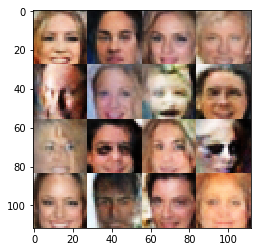

Epochs 8510/300000 Batch Step 2180/3166 gen_loss = -12.146085739135742..., disc_loss = -0.8010727763175964..., train using time = 10.452
Epochs 8520/300000 Batch Step 2190/3166 gen_loss = -11.724396705627441..., disc_loss = -0.8635591268539429..., train using time = 11.237
Epochs 8530/300000 Batch Step 2200/3166 gen_loss = -11.822811126708984..., disc_loss = -0.7851933836936951..., train using time = 11.212
Epochs 8540/300000 Batch Step 2210/3166 gen_loss = -12.931385040283203..., disc_loss = -0.5762553215026855..., train using time = 9.272
Epochs 8550/300000 Batch Step 2220/3166 gen_loss = -12.56985092163086..., disc_loss = -0.7439473271369934..., train using time = 10.359
Epochs 8560/300000 Batch Step 2230/3166 gen_loss = -11.562765121459961..., disc_loss = -0.6535533666610718..., train using time = 9.136
Epochs 8570/300000 Batch Step 2240/3166 gen_loss = -11.33562183380127..., disc_loss = -0.435413122177124..., train using time = 10.175
Epochs 8580/300000 Batch Step 2250/3166 gen_lo

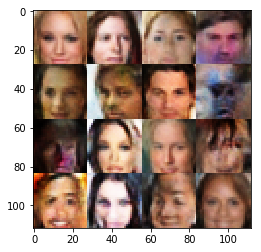

Epochs 8610/300000 Batch Step 2280/3166 gen_loss = -12.513341903686523..., disc_loss = -0.8313308954238892..., train using time = 9.920
Epochs 8620/300000 Batch Step 2290/3166 gen_loss = -12.750581741333008..., disc_loss = -0.8303524851799011..., train using time = 9.321
Epochs 8630/300000 Batch Step 2300/3166 gen_loss = -11.857431411743164..., disc_loss = -0.6672927737236023..., train using time = 13.428
Epochs 8640/300000 Batch Step 2310/3166 gen_loss = -11.12412166595459..., disc_loss = -0.8273426294326782..., train using time = 9.871
Epochs 8650/300000 Batch Step 2320/3166 gen_loss = -12.083526611328125..., disc_loss = -0.6243635416030884..., train using time = 9.004
Epochs 8660/300000 Batch Step 2330/3166 gen_loss = -12.591402053833008..., disc_loss = -0.8463641405105591..., train using time = 10.403
Epochs 8670/300000 Batch Step 2340/3166 gen_loss = -11.613393783569336..., disc_loss = -0.6948615312576294..., train using time = 9.283
Epochs 8680/300000 Batch Step 2350/3166 gen_los

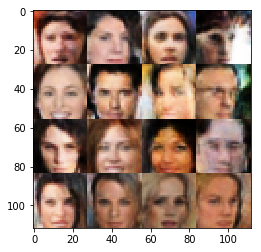

Epochs 8710/300000 Batch Step 2380/3166 gen_loss = -12.340145111083984..., disc_loss = -0.8186548948287964..., train using time = 9.076
Epochs 8720/300000 Batch Step 2390/3166 gen_loss = -12.00574779510498..., disc_loss = -0.7177098393440247..., train using time = 10.414
Epochs 8730/300000 Batch Step 2400/3166 gen_loss = -13.338733673095703..., disc_loss = -0.7168104648590088..., train using time = 10.855
Epochs 8740/300000 Batch Step 2410/3166 gen_loss = -12.995931625366211..., disc_loss = -0.8712741732597351..., train using time = 9.038
Epochs 8750/300000 Batch Step 2420/3166 gen_loss = -13.253192901611328..., disc_loss = -0.7305944561958313..., train using time = 12.400
Epochs 8760/300000 Batch Step 2430/3166 gen_loss = -12.14640998840332..., disc_loss = -0.6734477281570435..., train using time = 9.075
Epochs 8770/300000 Batch Step 2440/3166 gen_loss = -10.974552154541016..., disc_loss = -0.6498559713363647..., train using time = 9.363
Epochs 8780/300000 Batch Step 2450/3166 gen_los

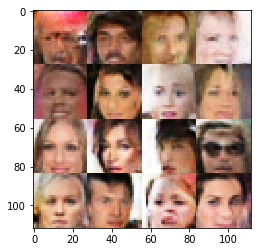

Epochs 8810/300000 Batch Step 2480/3166 gen_loss = -13.275460243225098..., disc_loss = -0.7534159421920776..., train using time = 12.716
Epochs 8820/300000 Batch Step 2490/3166 gen_loss = -12.375627517700195..., disc_loss = -0.685656726360321..., train using time = 9.139
Epochs 8830/300000 Batch Step 2500/3166 gen_loss = -12.49953556060791..., disc_loss = -0.6584451198577881..., train using time = 10.567
Epochs 8840/300000 Batch Step 2510/3166 gen_loss = -13.717734336853027..., disc_loss = -0.5630470514297485..., train using time = 10.350
Epochs 8850/300000 Batch Step 2520/3166 gen_loss = -12.992321014404297..., disc_loss = -0.7975574731826782..., train using time = 9.152
Epochs 8860/300000 Batch Step 2530/3166 gen_loss = -12.651878356933594..., disc_loss = -0.7100092172622681..., train using time = 9.479
Epochs 8870/300000 Batch Step 2540/3166 gen_loss = -12.076696395874023..., disc_loss = -0.6943903565406799..., train using time = 12.016
Epochs 8880/300000 Batch Step 2550/3166 gen_lo

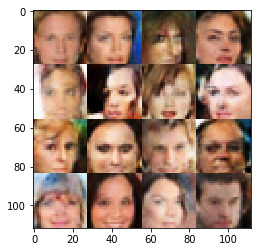

Epochs 8910/300000 Batch Step 2580/3166 gen_loss = -13.323139190673828..., disc_loss = -0.6955886483192444..., train using time = 9.106
Epochs 8920/300000 Batch Step 2590/3166 gen_loss = -12.182923316955566..., disc_loss = -0.7190601229667664..., train using time = 10.777
Epochs 8930/300000 Batch Step 2600/3166 gen_loss = -12.898799896240234..., disc_loss = -0.7431176900863647..., train using time = 10.245
Epochs 8940/300000 Batch Step 2610/3166 gen_loss = -13.346170425415039..., disc_loss = -0.780556321144104..., train using time = 9.158
Epochs 8950/300000 Batch Step 2620/3166 gen_loss = -12.542176246643066..., disc_loss = -0.7626071572303772..., train using time = 9.111
Epochs 8960/300000 Batch Step 2630/3166 gen_loss = -13.54312515258789..., disc_loss = -0.7586420774459839..., train using time = 10.175
Epochs 8970/300000 Batch Step 2640/3166 gen_loss = -11.505309104919434..., disc_loss = -0.6584327220916748..., train using time = 10.187
Epochs 8980/300000 Batch Step 2650/3166 gen_lo

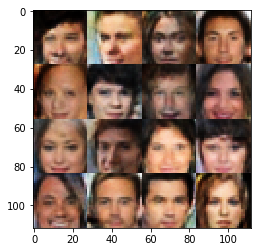

Epochs 9010/300000 Batch Step 2680/3166 gen_loss = -13.554481506347656..., disc_loss = -0.6553806066513062..., train using time = 8.986
Epochs 9020/300000 Batch Step 2690/3166 gen_loss = -14.334623336791992..., disc_loss = -0.613649845123291..., train using time = 11.888
Epochs 9030/300000 Batch Step 2700/3166 gen_loss = -13.506509780883789..., disc_loss = -0.7781197428703308..., train using time = 9.160
Epochs 9040/300000 Batch Step 2710/3166 gen_loss = -13.718732833862305..., disc_loss = -0.6524048447608948..., train using time = 10.180
Epochs 9050/300000 Batch Step 2720/3166 gen_loss = -13.29820728302002..., disc_loss = -0.7891747951507568..., train using time = 10.373
Epochs 9060/300000 Batch Step 2730/3166 gen_loss = -14.28635025024414..., disc_loss = -0.6407998204231262..., train using time = 9.179
Epochs 9070/300000 Batch Step 2740/3166 gen_loss = -13.386503219604492..., disc_loss = -0.7536260485649109..., train using time = 10.811
Epochs 9080/300000 Batch Step 2750/3166 gen_los

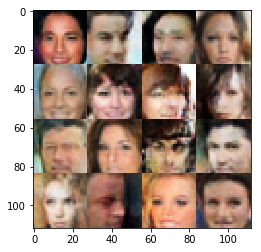

Epochs 9110/300000 Batch Step 2780/3166 gen_loss = -13.505782127380371..., disc_loss = -0.7933412790298462..., train using time = 10.199
Epochs 9120/300000 Batch Step 2790/3166 gen_loss = -12.160938262939453..., disc_loss = -0.6892910599708557..., train using time = 10.217
Epochs 9130/300000 Batch Step 2800/3166 gen_loss = -13.661087036132812..., disc_loss = -0.8046677708625793..., train using time = 9.012
Epochs 9140/300000 Batch Step 2810/3166 gen_loss = -12.892293930053711..., disc_loss = -0.7105157971382141..., train using time = 10.588
Epochs 9150/300000 Batch Step 2820/3166 gen_loss = -12.65380859375..., disc_loss = -0.748961329460144..., train using time = 9.101
Epochs 9160/300000 Batch Step 2830/3166 gen_loss = -13.84323501586914..., disc_loss = -0.760857105255127..., train using time = 10.204
Epochs 9170/300000 Batch Step 2840/3166 gen_loss = -14.021875381469727..., disc_loss = -0.7511758804321289..., train using time = 12.316
Epochs 9180/300000 Batch Step 2850/3166 gen_loss =

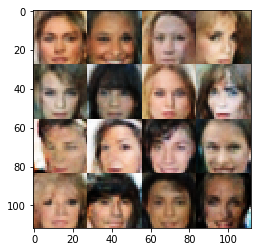

Epochs 9210/300000 Batch Step 2880/3166 gen_loss = -13.182119369506836..., disc_loss = -0.6155651807785034..., train using time = 9.121
Epochs 9220/300000 Batch Step 2890/3166 gen_loss = -13.991893768310547..., disc_loss = -0.7691855430603027..., train using time = 11.388
Epochs 9230/300000 Batch Step 2900/3166 gen_loss = -13.48405647277832..., disc_loss = -0.6922763586044312..., train using time = 10.117
Epochs 9240/300000 Batch Step 2910/3166 gen_loss = -13.107013702392578..., disc_loss = -0.5841155052185059..., train using time = 8.972
Epochs 9250/300000 Batch Step 2920/3166 gen_loss = -13.135297775268555..., disc_loss = -0.6798179745674133..., train using time = 9.646
Epochs 9260/300000 Batch Step 2930/3166 gen_loss = -13.871075630187988..., disc_loss = -0.7556881308555603..., train using time = 11.019
Epochs 9270/300000 Batch Step 2940/3166 gen_loss = -13.259620666503906..., disc_loss = -0.8074004054069519..., train using time = 10.111
Epochs 9280/300000 Batch Step 2950/3166 gen_l

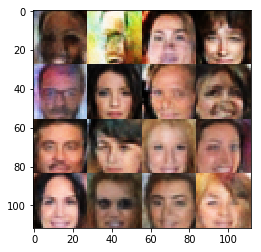

Epochs 9310/300000 Batch Step 2980/3166 gen_loss = -13.352507591247559..., disc_loss = -0.7336562275886536..., train using time = 10.155
Epochs 9320/300000 Batch Step 2990/3166 gen_loss = -12.994725227355957..., disc_loss = -0.5961559414863586..., train using time = 10.962
Epochs 9330/300000 Batch Step 3000/3166 gen_loss = -13.878318786621094..., disc_loss = -0.7482805252075195..., train using time = 9.060
Epochs 9340/300000 Batch Step 3010/3166 gen_loss = -13.578802108764648..., disc_loss = -0.871721625328064..., train using time = 12.112
Epochs 9350/300000 Batch Step 3020/3166 gen_loss = -15.557506561279297..., disc_loss = -0.5844133496284485..., train using time = 9.107
Epochs 9360/300000 Batch Step 3030/3166 gen_loss = -13.292919158935547..., disc_loss = -0.7606886625289917..., train using time = 9.035
Epochs 9370/300000 Batch Step 3040/3166 gen_loss = -14.465381622314453..., disc_loss = -0.7086936831474304..., train using time = 11.577
Epochs 9380/300000 Batch Step 3050/3166 gen_l

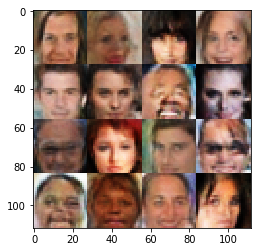

Epochs 9410/300000 Batch Step 3080/3166 gen_loss = -12.767404556274414..., disc_loss = -0.4891917109489441..., train using time = 9.075
Epochs 9420/300000 Batch Step 3090/3166 gen_loss = -14.623544692993164..., disc_loss = -0.5917986035346985..., train using time = 11.199
Epochs 9430/300000 Batch Step 3100/3166 gen_loss = -14.011993408203125..., disc_loss = -0.7557083368301392..., train using time = 10.382
Epochs 9440/300000 Batch Step 3110/3166 gen_loss = -14.32917308807373..., disc_loss = -0.5949890613555908..., train using time = 9.862
Epochs 9450/300000 Batch Step 3120/3166 gen_loss = -14.490737915039062..., disc_loss = -0.6944559216499329..., train using time = 9.049
Epochs 9460/300000 Batch Step 3130/3166 gen_loss = -13.98580551147461..., disc_loss = -0.6537457704544067..., train using time = 13.137
Epochs 9470/300000 Batch Step 3140/3166 gen_loss = -13.529343605041504..., disc_loss = -0.6800624132156372..., train using time = 11.543
Epochs 9480/300000 Batch Step 3150/3166 gen_lo

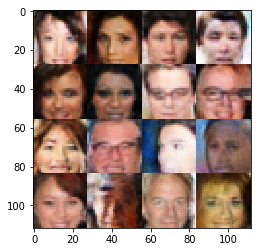

Epochs 9510/300000 Batch Step 15/3166 gen_loss = -14.493857383728027..., disc_loss = -0.8461722135543823..., train using time = 9.137
Epochs 9520/300000 Batch Step 25/3166 gen_loss = -13.735026359558105..., disc_loss = -0.7310138940811157..., train using time = 14.788
Epochs 9530/300000 Batch Step 35/3166 gen_loss = -13.781455039978027..., disc_loss = -0.7429623007774353..., train using time = 9.748
Epochs 9540/300000 Batch Step 45/3166 gen_loss = -13.396672248840332..., disc_loss = -0.7439923882484436..., train using time = 9.027
Epochs 9550/300000 Batch Step 55/3166 gen_loss = -14.781436920166016..., disc_loss = -0.6327689290046692..., train using time = 10.173
Epochs 9560/300000 Batch Step 65/3166 gen_loss = -15.609970092773438..., disc_loss = -0.6013452410697937..., train using time = 9.132
Epochs 9570/300000 Batch Step 75/3166 gen_loss = -15.049982070922852..., disc_loss = -0.766616940498352..., train using time = 10.394
Epochs 9580/300000 Batch Step 85/3166 gen_loss = -14.1831474

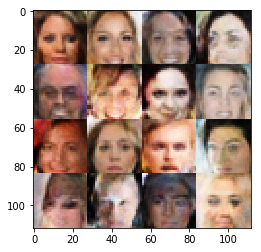

Epochs 9610/300000 Batch Step 115/3166 gen_loss = -13.455633163452148..., disc_loss = -0.7568413615226746..., train using time = 10.373
Epochs 9620/300000 Batch Step 125/3166 gen_loss = -13.25100326538086..., disc_loss = -0.5263412594795227..., train using time = 10.649
Epochs 9630/300000 Batch Step 135/3166 gen_loss = -14.611879348754883..., disc_loss = -0.6458638906478882..., train using time = 9.619
Epochs 9640/300000 Batch Step 145/3166 gen_loss = -14.157248497009277..., disc_loss = -0.6918323040008545..., train using time = 11.898
Epochs 9650/300000 Batch Step 155/3166 gen_loss = -14.145183563232422..., disc_loss = -0.5151914358139038..., train using time = 9.035
Epochs 9660/300000 Batch Step 165/3166 gen_loss = -15.340736389160156..., disc_loss = -0.7031737565994263..., train using time = 9.140
Epochs 9670/300000 Batch Step 175/3166 gen_loss = -15.174044609069824..., disc_loss = -0.4898253083229065..., train using time = 12.366
Epochs 9680/300000 Batch Step 185/3166 gen_loss = -1

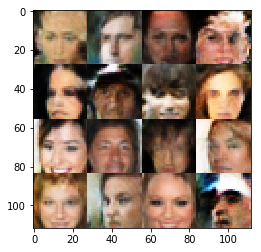

Epochs 9710/300000 Batch Step 215/3166 gen_loss = -15.088579177856445..., disc_loss = -0.4974697232246399..., train using time = 10.261
Epochs 9720/300000 Batch Step 225/3166 gen_loss = -15.287181854248047..., disc_loss = -0.6776994466781616..., train using time = 9.301
Epochs 9730/300000 Batch Step 235/3166 gen_loss = -13.730152130126953..., disc_loss = -0.5841430425643921..., train using time = 10.110
Epochs 9740/300000 Batch Step 245/3166 gen_loss = -14.329829216003418..., disc_loss = -0.6277729272842407..., train using time = 8.977
Epochs 9750/300000 Batch Step 255/3166 gen_loss = -14.940998077392578..., disc_loss = -0.6526952981948853..., train using time = 9.595
Epochs 9760/300000 Batch Step 265/3166 gen_loss = -15.18113899230957..., disc_loss = -0.6125701665878296..., train using time = 12.143
Epochs 9770/300000 Batch Step 275/3166 gen_loss = -14.643148422241211..., disc_loss = -0.5383979082107544..., train using time = 9.841
Epochs 9780/300000 Batch Step 285/3166 gen_loss = -16

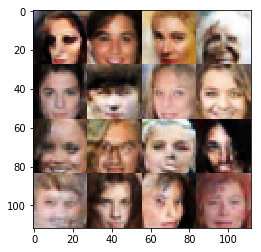

Epochs 9810/300000 Batch Step 315/3166 gen_loss = -15.391319274902344..., disc_loss = -0.6186705827713013..., train using time = 11.979
Epochs 9820/300000 Batch Step 325/3166 gen_loss = -15.428107261657715..., disc_loss = -0.6341946125030518..., train using time = 10.451
Epochs 9830/300000 Batch Step 335/3166 gen_loss = -15.387992858886719..., disc_loss = -0.6786344647407532..., train using time = 9.058
Epochs 9840/300000 Batch Step 345/3166 gen_loss = -14.508855819702148..., disc_loss = -0.689456582069397..., train using time = 8.971
Epochs 9850/300000 Batch Step 355/3166 gen_loss = -15.51583480834961..., disc_loss = -0.6247859597206116..., train using time = 10.116
Epochs 9860/300000 Batch Step 365/3166 gen_loss = -14.800813674926758..., disc_loss = -0.580079197883606..., train using time = 10.378
Epochs 9870/300000 Batch Step 375/3166 gen_loss = -15.792960166931152..., disc_loss = -0.7465258836746216..., train using time = 11.301
Epochs 9880/300000 Batch Step 385/3166 gen_loss = -16

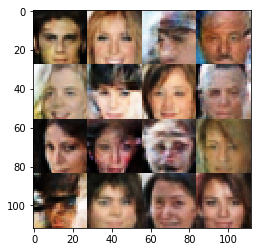

Epochs 9910/300000 Batch Step 415/3166 gen_loss = -14.107101440429688..., disc_loss = -0.6585725545883179..., train using time = 13.324
Epochs 9920/300000 Batch Step 425/3166 gen_loss = -15.386441230773926..., disc_loss = -0.6674841642379761..., train using time = 9.046
Epochs 9930/300000 Batch Step 435/3166 gen_loss = -14.797239303588867..., disc_loss = -0.646399199962616..., train using time = 10.196
Epochs 9940/300000 Batch Step 445/3166 gen_loss = -15.435834884643555..., disc_loss = -0.751400351524353..., train using time = 10.354
Epochs 9950/300000 Batch Step 455/3166 gen_loss = -15.784921646118164..., disc_loss = -0.6867696046829224..., train using time = 9.005
Epochs 9960/300000 Batch Step 465/3166 gen_loss = -15.275572776794434..., disc_loss = -0.6421462893486023..., train using time = 10.204
Epochs 9970/300000 Batch Step 475/3166 gen_loss = -15.854837417602539..., disc_loss = -0.6912375688552856..., train using time = 10.391
Epochs 9980/300000 Batch Step 485/3166 gen_loss = -1

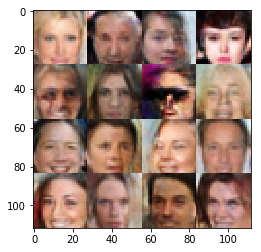

Epochs 10010/300000 Batch Step 515/3166 gen_loss = -15.031415939331055..., disc_loss = -0.5842509269714355..., train using time = 10.784
Epochs 10020/300000 Batch Step 525/3166 gen_loss = -15.265666961669922..., disc_loss = -0.6568694710731506..., train using time = 9.289
Epochs 10030/300000 Batch Step 535/3166 gen_loss = -15.33349323272705..., disc_loss = -0.6661956906318665..., train using time = 11.202
Epochs 10040/300000 Batch Step 545/3166 gen_loss = -14.753702163696289..., disc_loss = -0.6090547442436218..., train using time = 9.093
Epochs 10050/300000 Batch Step 555/3166 gen_loss = -15.455509185791016..., disc_loss = -0.5987036824226379..., train using time = 11.616
Epochs 10060/300000 Batch Step 565/3166 gen_loss = -15.427011489868164..., disc_loss = -0.6927202343940735..., train using time = 11.745
Epochs 10070/300000 Batch Step 575/3166 gen_loss = -15.8776273727417..., disc_loss = -0.6935648918151855..., train using time = 8.944
Epochs 10080/300000 Batch Step 585/3166 gen_los

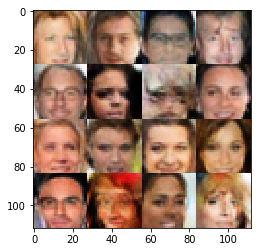

Epochs 10110/300000 Batch Step 615/3166 gen_loss = -16.518253326416016..., disc_loss = -0.48009204864501953..., train using time = 11.093
Epochs 10120/300000 Batch Step 625/3166 gen_loss = -14.649890899658203..., disc_loss = -0.6609673500061035..., train using time = 9.450
Epochs 10130/300000 Batch Step 635/3166 gen_loss = -15.154300689697266..., disc_loss = -0.7600381374359131..., train using time = 9.150
Epochs 10140/300000 Batch Step 645/3166 gen_loss = -15.399166107177734..., disc_loss = -0.5577431321144104..., train using time = 9.145
Epochs 10150/300000 Batch Step 655/3166 gen_loss = -15.757585525512695..., disc_loss = -0.536737322807312..., train using time = 10.257
Epochs 10160/300000 Batch Step 665/3166 gen_loss = -15.773747444152832..., disc_loss = -0.6140678524971008..., train using time = 10.164
Epochs 10170/300000 Batch Step 675/3166 gen_loss = -16.110767364501953..., disc_loss = -0.5968765616416931..., train using time = 11.931
Epochs 10180/300000 Batch Step 685/3166 gen_

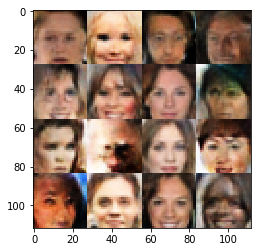

Epochs 10210/300000 Batch Step 715/3166 gen_loss = -17.5751953125..., disc_loss = -0.46909695863723755..., train using time = 10.174
Epochs 10220/300000 Batch Step 725/3166 gen_loss = -17.096744537353516..., disc_loss = -0.7321910262107849..., train using time = 8.996
Epochs 10230/300000 Batch Step 735/3166 gen_loss = -15.937162399291992..., disc_loss = -0.7000753879547119..., train using time = 12.097
Epochs 10240/300000 Batch Step 745/3166 gen_loss = -15.782098770141602..., disc_loss = -0.507734477519989..., train using time = 9.110
Epochs 10250/300000 Batch Step 755/3166 gen_loss = -17.012470245361328..., disc_loss = -0.6060206294059753..., train using time = 9.027
Epochs 10260/300000 Batch Step 765/3166 gen_loss = -16.453689575195312..., disc_loss = -0.6401454210281372..., train using time = 13.184
Epochs 10270/300000 Batch Step 775/3166 gen_loss = -16.789875030517578..., disc_loss = -0.6800915002822876..., train using time = 9.055
Epochs 10280/300000 Batch Step 785/3166 gen_loss =

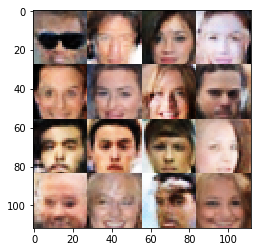

Epochs 10310/300000 Batch Step 815/3166 gen_loss = -17.157407760620117..., disc_loss = -0.714246392250061..., train using time = 10.267
Epochs 10320/300000 Batch Step 825/3166 gen_loss = -16.30960464477539..., disc_loss = -0.6283307075500488..., train using time = 10.420
Epochs 10330/300000 Batch Step 835/3166 gen_loss = -16.808361053466797..., disc_loss = -0.5591760873794556..., train using time = 9.023
Epochs 10340/300000 Batch Step 845/3166 gen_loss = -16.557462692260742..., disc_loss = -0.6084940433502197..., train using time = 9.151
Epochs 10350/300000 Batch Step 855/3166 gen_loss = -16.536128997802734..., disc_loss = -0.6322745084762573..., train using time = 12.139
Epochs 10360/300000 Batch Step 865/3166 gen_loss = -16.31963539123535..., disc_loss = -0.5551408529281616..., train using time = 10.258
Epochs 10370/300000 Batch Step 875/3166 gen_loss = -16.437177658081055..., disc_loss = -0.588432252407074..., train using time = 9.588
Epochs 10380/300000 Batch Step 885/3166 gen_loss

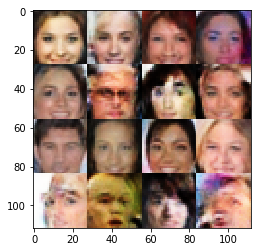

Epochs 10410/300000 Batch Step 915/3166 gen_loss = -15.698774337768555..., disc_loss = -0.6478425860404968..., train using time = 10.343
Epochs 10420/300000 Batch Step 925/3166 gen_loss = -16.519546508789062..., disc_loss = -0.6065165400505066..., train using time = 9.233
Epochs 10430/300000 Batch Step 935/3166 gen_loss = -17.216651916503906..., disc_loss = -0.6117044687271118..., train using time = 8.921
Epochs 10440/300000 Batch Step 945/3166 gen_loss = -16.576313018798828..., disc_loss = -0.7142874002456665..., train using time = 10.531
Epochs 10450/300000 Batch Step 955/3166 gen_loss = -16.067663192749023..., disc_loss = -0.6131438612937927..., train using time = 9.071
Epochs 10460/300000 Batch Step 965/3166 gen_loss = -16.17144775390625..., disc_loss = -0.7073389887809753..., train using time = 13.123
Epochs 10470/300000 Batch Step 975/3166 gen_loss = -15.929508209228516..., disc_loss = -0.563806414604187..., train using time = 10.250
Epochs 10480/300000 Batch Step 985/3166 gen_lo

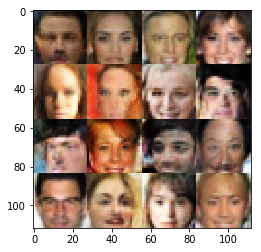

Epochs 10510/300000 Batch Step 1015/3166 gen_loss = -16.59444236755371..., disc_loss = -0.6383771300315857..., train using time = 9.388
Epochs 10520/300000 Batch Step 1025/3166 gen_loss = -16.393911361694336..., disc_loss = -0.6842153668403625..., train using time = 10.284
Epochs 10530/300000 Batch Step 1035/3166 gen_loss = -17.054466247558594..., disc_loss = -0.689017117023468..., train using time = 10.396
Epochs 10540/300000 Batch Step 1045/3166 gen_loss = -17.32375717163086..., disc_loss = -0.5511454343795776..., train using time = 9.058
Epochs 10550/300000 Batch Step 1055/3166 gen_loss = -16.840314865112305..., disc_loss = -0.6839975118637085..., train using time = 10.196
Epochs 10560/300000 Batch Step 1065/3166 gen_loss = -17.050762176513672..., disc_loss = -0.4994334578514099..., train using time = 10.355
Epochs 10570/300000 Batch Step 1075/3166 gen_loss = -16.97398567199707..., disc_loss = -0.6206470727920532..., train using time = 9.745
Epochs 10580/300000 Batch Step 1085/3166 

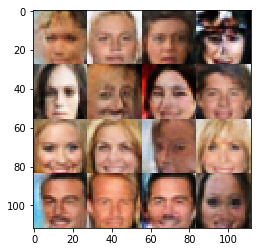

Epochs 10610/300000 Batch Step 1115/3166 gen_loss = -16.843978881835938..., disc_loss = -0.5130914449691772..., train using time = 9.081
Epochs 10620/300000 Batch Step 1125/3166 gen_loss = -16.55001449584961..., disc_loss = -0.5966051816940308..., train using time = 10.280
Epochs 10630/300000 Batch Step 1135/3166 gen_loss = -16.690597534179688..., disc_loss = -0.6711989045143127..., train using time = 9.497
Epochs 10640/300000 Batch Step 1145/3166 gen_loss = -17.020694732666016..., disc_loss = -0.4926045835018158..., train using time = 10.292
Epochs 10650/300000 Batch Step 1155/3166 gen_loss = -16.630706787109375..., disc_loss = -0.6337037086486816..., train using time = 12.325
Epochs 10660/300000 Batch Step 1165/3166 gen_loss = -17.943370819091797..., disc_loss = -0.6110255122184753..., train using time = 9.175
Epochs 10670/300000 Batch Step 1175/3166 gen_loss = -16.730838775634766..., disc_loss = -0.5185272693634033..., train using time = 9.066
Epochs 10680/300000 Batch Step 1185/316

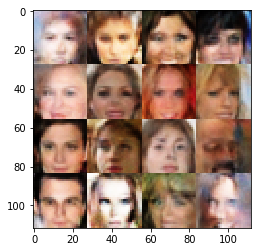

Epochs 10710/300000 Batch Step 1215/3166 gen_loss = -16.874425888061523..., disc_loss = -0.5401757955551147..., train using time = 10.528
Epochs 10720/300000 Batch Step 1225/3166 gen_loss = -17.809856414794922..., disc_loss = -0.631399393081665..., train using time = 9.406
Epochs 10730/300000 Batch Step 1235/3166 gen_loss = -17.439273834228516..., disc_loss = -0.6566044092178345..., train using time = 9.170
Epochs 10740/300000 Batch Step 1245/3166 gen_loss = -17.53583335876465..., disc_loss = -0.6259738802909851..., train using time = 9.924
Epochs 10750/300000 Batch Step 1255/3166 gen_loss = -17.412574768066406..., disc_loss = -0.6408489942550659..., train using time = 10.200
Epochs 10760/300000 Batch Step 1265/3166 gen_loss = -18.35551643371582..., disc_loss = -0.6014612913131714..., train using time = 11.814
Epochs 10770/300000 Batch Step 1275/3166 gen_loss = -17.7182674407959..., disc_loss = -0.6288849115371704..., train using time = 9.148
Epochs 10780/300000 Batch Step 1285/3166 ge

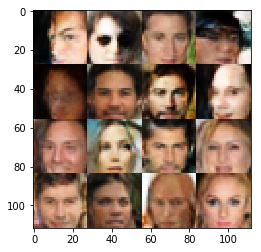

Epochs 10810/300000 Batch Step 1315/3166 gen_loss = -17.563190460205078..., disc_loss = -0.4408322870731354..., train using time = 9.094
Epochs 10820/300000 Batch Step 1325/3166 gen_loss = -17.23868179321289..., disc_loss = -0.8100574612617493..., train using time = 12.067
Epochs 10830/300000 Batch Step 1335/3166 gen_loss = -18.296077728271484..., disc_loss = -0.7099604606628418..., train using time = 9.144
Epochs 10840/300000 Batch Step 1345/3166 gen_loss = -18.343276977539062..., disc_loss = -0.6306251287460327..., train using time = 9.507
Epochs 10850/300000 Batch Step 1355/3166 gen_loss = -17.280372619628906..., disc_loss = -0.7068842649459839..., train using time = 11.882
Epochs 10860/300000 Batch Step 1365/3166 gen_loss = -16.923702239990234..., disc_loss = -0.6533273458480835..., train using time = 9.251
Epochs 10870/300000 Batch Step 1375/3166 gen_loss = -17.603736877441406..., disc_loss = -0.685504138469696..., train using time = 9.008
Epochs 10880/300000 Batch Step 1385/3166 

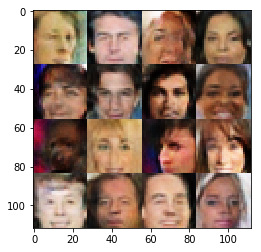

Epochs 10910/300000 Batch Step 1415/3166 gen_loss = -19.004791259765625..., disc_loss = -0.5435327887535095..., train using time = 10.325
Epochs 10920/300000 Batch Step 1425/3166 gen_loss = -17.719776153564453..., disc_loss = -0.5579115748405457..., train using time = 9.102
Epochs 10930/300000 Batch Step 1435/3166 gen_loss = -17.461997985839844..., disc_loss = -0.7008897662162781..., train using time = 9.127
Epochs 10940/300000 Batch Step 1445/3166 gen_loss = -17.912899017333984..., disc_loss = -0.6233257055282593..., train using time = 12.260
Epochs 10950/300000 Batch Step 1455/3166 gen_loss = -17.97606086730957..., disc_loss = -0.5116506218910217..., train using time = 11.114
Epochs 10960/300000 Batch Step 1465/3166 gen_loss = -17.682403564453125..., disc_loss = -0.6254526376724243..., train using time = 8.964
Epochs 10970/300000 Batch Step 1475/3166 gen_loss = -18.714794158935547..., disc_loss = -0.704560399055481..., train using time = 10.346
Epochs 10980/300000 Batch Step 1485/316

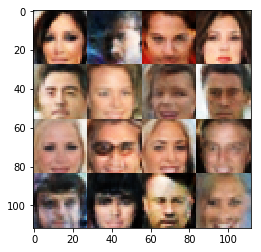

Epochs 11010/300000 Batch Step 1515/3166 gen_loss = -19.676834106445312..., disc_loss = -0.6531303524971008..., train using time = 9.016
Epochs 11020/300000 Batch Step 1525/3166 gen_loss = -18.303556442260742..., disc_loss = -0.5684823393821716..., train using time = 8.949
Epochs 11030/300000 Batch Step 1535/3166 gen_loss = -18.66111946105957..., disc_loss = -0.644592821598053..., train using time = 10.302
Epochs 11040/300000 Batch Step 1545/3166 gen_loss = -17.634679794311523..., disc_loss = -0.5955044627189636..., train using time = 9.034
Epochs 11050/300000 Batch Step 1555/3166 gen_loss = -17.528526306152344..., disc_loss = -0.5342322587966919..., train using time = 10.255
Epochs 11060/300000 Batch Step 1565/3166 gen_loss = -17.439289093017578..., disc_loss = -0.591364324092865..., train using time = 13.319
Epochs 11070/300000 Batch Step 1575/3166 gen_loss = -18.4074764251709..., disc_loss = -0.4182717204093933..., train using time = 9.012
Epochs 11080/300000 Batch Step 1585/3166 ge

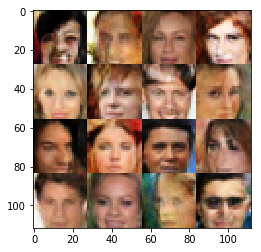

Epochs 11110/300000 Batch Step 1615/3166 gen_loss = -19.26350212097168..., disc_loss = -0.6847505569458008..., train using time = 9.134
Epochs 11120/300000 Batch Step 1625/3166 gen_loss = -17.57406997680664..., disc_loss = -0.6103916168212891..., train using time = 10.543
Epochs 11130/300000 Batch Step 1635/3166 gen_loss = -18.534561157226562..., disc_loss = -0.5355240702629089..., train using time = 9.114
Epochs 11140/300000 Batch Step 1645/3166 gen_loss = -18.825271606445312..., disc_loss = -0.5658462047576904..., train using time = 9.131
Epochs 11150/300000 Batch Step 1655/3166 gen_loss = -17.63909149169922..., disc_loss = -0.5205333828926086..., train using time = 12.591
Epochs 11160/300000 Batch Step 1665/3166 gen_loss = -18.663921356201172..., disc_loss = -0.48606929183006287..., train using time = 8.997
Epochs 11170/300000 Batch Step 1675/3166 gen_loss = -18.643299102783203..., disc_loss = -0.6210302114486694..., train using time = 9.636
Epochs 11180/300000 Batch Step 1685/3166 

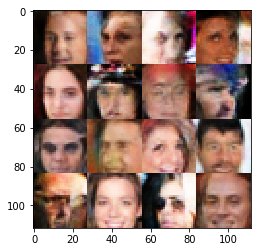

Epochs 11210/300000 Batch Step 1715/3166 gen_loss = -17.810306549072266..., disc_loss = -0.5932306051254272..., train using time = 10.164
Epochs 11220/300000 Batch Step 1725/3166 gen_loss = -18.66627311706543..., disc_loss = -0.5881931781768799..., train using time = 9.022
Epochs 11230/300000 Batch Step 1735/3166 gen_loss = -17.450952529907227..., disc_loss = -0.5306769609451294..., train using time = 11.245
Epochs 11240/300000 Batch Step 1745/3166 gen_loss = -19.039154052734375..., disc_loss = -0.552334725856781..., train using time = 13.386
Epochs 11250/300000 Batch Step 1755/3166 gen_loss = -19.764196395874023..., disc_loss = -0.5234029293060303..., train using time = 9.129
Epochs 11260/300000 Batch Step 1765/3166 gen_loss = -18.605030059814453..., disc_loss = -0.5078179836273193..., train using time = 8.997
Epochs 11270/300000 Batch Step 1775/3166 gen_loss = -18.628225326538086..., disc_loss = -0.5895706415176392..., train using time = 10.249
Epochs 11280/300000 Batch Step 1785/316

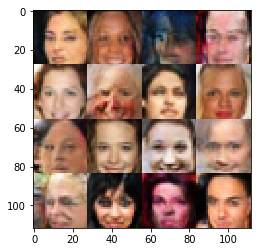

Epochs 11310/300000 Batch Step 1815/3166 gen_loss = -19.218074798583984..., disc_loss = -0.5018554925918579..., train using time = 9.111
Epochs 11320/300000 Batch Step 1825/3166 gen_loss = -19.626014709472656..., disc_loss = -0.6718071699142456..., train using time = 8.907
Epochs 11330/300000 Batch Step 1835/3166 gen_loss = -18.813404083251953..., disc_loss = -0.5322640538215637..., train using time = 10.573
Epochs 11340/300000 Batch Step 1845/3166 gen_loss = -18.474224090576172..., disc_loss = -0.6924367547035217..., train using time = 10.303
Epochs 11350/300000 Batch Step 1855/3166 gen_loss = -19.746841430664062..., disc_loss = -0.6266371607780457..., train using time = 10.626
Epochs 11360/300000 Batch Step 1865/3166 gen_loss = -18.424026489257812..., disc_loss = -0.6721051931381226..., train using time = 10.273
Epochs 11370/300000 Batch Step 1875/3166 gen_loss = -17.9132080078125..., disc_loss = -0.6467019319534302..., train using time = 9.067
Epochs 11380/300000 Batch Step 1885/316

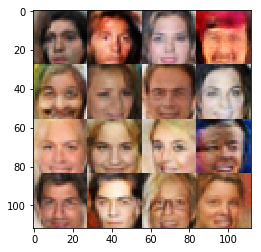

Epochs 11410/300000 Batch Step 1915/3166 gen_loss = -19.06173324584961..., disc_loss = -0.6473102569580078..., train using time = 10.289
Epochs 11420/300000 Batch Step 1925/3166 gen_loss = -18.876985549926758..., disc_loss = -0.5987641215324402..., train using time = 10.466
Epochs 11430/300000 Batch Step 1935/3166 gen_loss = -19.547359466552734..., disc_loss = -0.5525142550468445..., train using time = 9.174
Epochs 11440/300000 Batch Step 1945/3166 gen_loss = -18.72945785522461..., disc_loss = -0.5681635737419128..., train using time = 10.791
Epochs 11450/300000 Batch Step 1955/3166 gen_loss = -18.947786331176758..., disc_loss = -0.6117674112319946..., train using time = 11.730
Epochs 11460/300000 Batch Step 1965/3166 gen_loss = -19.375720977783203..., disc_loss = -0.5645339488983154..., train using time = 9.152
Epochs 11470/300000 Batch Step 1975/3166 gen_loss = -19.92266845703125..., disc_loss = -0.514729380607605..., train using time = 10.507
Epochs 11480/300000 Batch Step 1985/3166

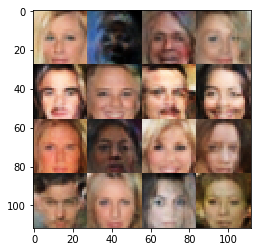

Epochs 11510/300000 Batch Step 2015/3166 gen_loss = -19.313159942626953..., disc_loss = -0.4525813162326813..., train using time = 9.215
Epochs 11520/300000 Batch Step 2025/3166 gen_loss = -19.48900032043457..., disc_loss = -0.6362124681472778..., train using time = 9.019
Epochs 11530/300000 Batch Step 2035/3166 gen_loss = -19.521272659301758..., disc_loss = -0.6380828619003296..., train using time = 10.127
Epochs 11540/300000 Batch Step 2045/3166 gen_loss = -19.476306915283203..., disc_loss = -0.6898959875106812..., train using time = 11.097
Epochs 11550/300000 Batch Step 2055/3166 gen_loss = -18.592975616455078..., disc_loss = -0.4583469331264496..., train using time = 9.156
Epochs 11560/300000 Batch Step 2065/3166 gen_loss = -20.777809143066406..., disc_loss = -0.39658477902412415..., train using time = 10.064
Epochs 11570/300000 Batch Step 2075/3166 gen_loss = -19.478782653808594..., disc_loss = -0.6118637919425964..., train using time = 9.084
Epochs 11580/300000 Batch Step 2085/31

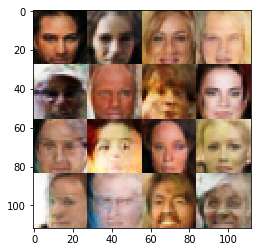

Epochs 11610/300000 Batch Step 2115/3166 gen_loss = -20.646568298339844..., disc_loss = -0.43794161081314087..., train using time = 10.219
Epochs 11620/300000 Batch Step 2125/3166 gen_loss = -18.79574203491211..., disc_loss = -0.5754371881484985..., train using time = 10.100
Epochs 11630/300000 Batch Step 2135/3166 gen_loss = -19.493133544921875..., disc_loss = -0.5211684107780457..., train using time = 10.268
Epochs 11640/300000 Batch Step 2145/3166 gen_loss = -19.641738891601562..., disc_loss = -0.5037603378295898..., train using time = 10.267
Epochs 11650/300000 Batch Step 2155/3166 gen_loss = -19.91537094116211..., disc_loss = -0.611101508140564..., train using time = 12.412
Epochs 11660/300000 Batch Step 2165/3166 gen_loss = -19.957059860229492..., disc_loss = -0.7124874591827393..., train using time = 9.138
Epochs 11670/300000 Batch Step 2175/3166 gen_loss = -19.17905616760254..., disc_loss = -0.5491615533828735..., train using time = 9.125
Epochs 11680/300000 Batch Step 2185/316

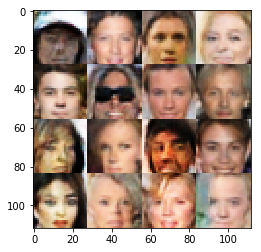

Epochs 11710/300000 Batch Step 2215/3166 gen_loss = -19.566431045532227..., disc_loss = -0.5488559603691101..., train using time = 12.072
Epochs 11720/300000 Batch Step 2225/3166 gen_loss = -19.002824783325195..., disc_loss = -0.46385708451271057..., train using time = 9.259
Epochs 11730/300000 Batch Step 2235/3166 gen_loss = -19.448558807373047..., disc_loss = -0.4565543532371521..., train using time = 9.127
Epochs 11740/300000 Batch Step 2245/3166 gen_loss = -19.415754318237305..., disc_loss = -0.532026469707489..., train using time = 12.312
Epochs 11750/300000 Batch Step 2255/3166 gen_loss = -19.602161407470703..., disc_loss = -0.5602805018424988..., train using time = 9.129
Epochs 11760/300000 Batch Step 2265/3166 gen_loss = -20.19562339782715..., disc_loss = -0.6990810036659241..., train using time = 9.048
Epochs 11770/300000 Batch Step 2275/3166 gen_loss = -20.8682804107666..., disc_loss = -0.5789225101470947..., train using time = 13.429
Epochs 11780/300000 Batch Step 2285/3166 

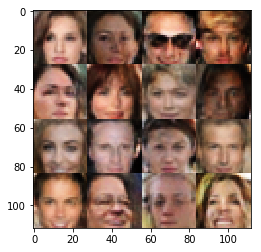

Epochs 11810/300000 Batch Step 2315/3166 gen_loss = -19.461008071899414..., disc_loss = -0.5565547943115234..., train using time = 9.023
Epochs 11820/300000 Batch Step 2325/3166 gen_loss = -19.75531768798828..., disc_loss = -0.5511240363121033..., train using time = 9.280
Epochs 11830/300000 Batch Step 2335/3166 gen_loss = -19.086278915405273..., disc_loss = -0.5324630737304688..., train using time = 10.848
Epochs 11840/300000 Batch Step 2345/3166 gen_loss = -20.10723304748535..., disc_loss = -0.6175004839897156..., train using time = 10.085
Epochs 11850/300000 Batch Step 2355/3166 gen_loss = -20.64677619934082..., disc_loss = -0.5631488561630249..., train using time = 9.516
Epochs 11860/300000 Batch Step 2365/3166 gen_loss = -19.143287658691406..., disc_loss = -0.6474737524986267..., train using time = 10.620
Epochs 11870/300000 Batch Step 2375/3166 gen_loss = -19.897579193115234..., disc_loss = -0.5060105919837952..., train using time = 9.137
Epochs 11880/300000 Batch Step 2385/3166 

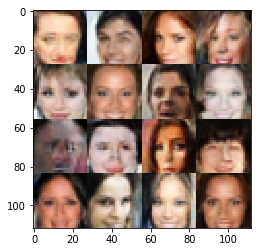

Epochs 11910/300000 Batch Step 2415/3166 gen_loss = -20.956174850463867..., disc_loss = -0.6724965572357178..., train using time = 9.055
Epochs 11920/300000 Batch Step 2425/3166 gen_loss = -20.35821533203125..., disc_loss = -0.63388592004776..., train using time = 10.209
Epochs 11930/300000 Batch Step 2435/3166 gen_loss = -20.141544342041016..., disc_loss = -0.6198805570602417..., train using time = 9.126
Epochs 11940/300000 Batch Step 2445/3166 gen_loss = -21.09933090209961..., disc_loss = -0.6727246642112732..., train using time = 12.547
Epochs 11950/300000 Batch Step 2455/3166 gen_loss = -20.24555206298828..., disc_loss = -0.6492134928703308..., train using time = 10.863
Epochs 11960/300000 Batch Step 2465/3166 gen_loss = -20.229938507080078..., disc_loss = -0.4107041358947754..., train using time = 9.054
Epochs 11970/300000 Batch Step 2475/3166 gen_loss = -20.434829711914062..., disc_loss = -0.6579972505569458..., train using time = 8.905
Epochs 11980/300000 Batch Step 2485/3166 ge

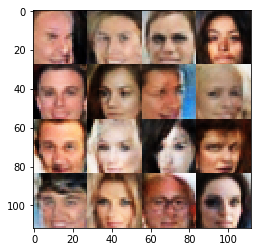

Epochs 12010/300000 Batch Step 2515/3166 gen_loss = -20.395883560180664..., disc_loss = -0.534654974937439..., train using time = 11.161
Epochs 12020/300000 Batch Step 2525/3166 gen_loss = -20.768310546875..., disc_loss = -0.4231993556022644..., train using time = 10.110
Epochs 12030/300000 Batch Step 2535/3166 gen_loss = -20.31690216064453..., disc_loss = -0.5106341242790222..., train using time = 10.228
Epochs 12040/300000 Batch Step 2545/3166 gen_loss = -20.914274215698242..., disc_loss = -0.6496370434761047..., train using time = 12.744
Epochs 12050/300000 Batch Step 2555/3166 gen_loss = -20.889209747314453..., disc_loss = -0.6274045705795288..., train using time = 18.785
Epochs 12060/300000 Batch Step 2565/3166 gen_loss = -21.747604370117188..., disc_loss = -0.5476496815681458..., train using time = 10.626
Epochs 12070/300000 Batch Step 2575/3166 gen_loss = -20.402915954589844..., disc_loss = -0.6646376848220825..., train using time = 10.091
Epochs 12080/300000 Batch Step 2585/316

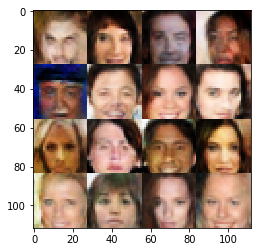

Epochs 12110/300000 Batch Step 2615/3166 gen_loss = -20.777488708496094..., disc_loss = -0.6161596775054932..., train using time = 12.350
Epochs 12120/300000 Batch Step 2625/3166 gen_loss = -22.134965896606445..., disc_loss = -0.48985546827316284..., train using time = 9.196
Epochs 12130/300000 Batch Step 2635/3166 gen_loss = -22.12420654296875..., disc_loss = -0.5013030767440796..., train using time = 8.987
Epochs 12140/300000 Batch Step 2645/3166 gen_loss = -20.44053840637207..., disc_loss = -0.5806746482849121..., train using time = 11.179
Epochs 12150/300000 Batch Step 2655/3166 gen_loss = -21.05569839477539..., disc_loss = -0.5070393681526184..., train using time = 8.998
Epochs 12160/300000 Batch Step 2665/3166 gen_loss = -21.686012268066406..., disc_loss = -0.5385004281997681..., train using time = 11.746
Epochs 12170/300000 Batch Step 2675/3166 gen_loss = -21.796308517456055..., disc_loss = -0.5127190351486206..., train using time = 10.410
Epochs 12180/300000 Batch Step 2685/316

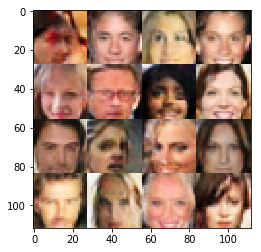

Epochs 12210/300000 Batch Step 2715/3166 gen_loss = -21.75730323791504..., disc_loss = -0.5412505865097046..., train using time = 10.292
Epochs 12220/300000 Batch Step 2725/3166 gen_loss = -20.812389373779297..., disc_loss = -0.5547578930854797..., train using time = 10.219
Epochs 12230/300000 Batch Step 2735/3166 gen_loss = -20.338640213012695..., disc_loss = -0.6071833372116089..., train using time = 10.558
Epochs 12240/300000 Batch Step 2745/3166 gen_loss = -20.649017333984375..., disc_loss = -0.522266685962677..., train using time = 9.347
Epochs 12250/300000 Batch Step 2755/3166 gen_loss = -21.708511352539062..., disc_loss = -0.7137552499771118..., train using time = 9.917
Epochs 12260/300000 Batch Step 2765/3166 gen_loss = -21.38792610168457..., disc_loss = -0.6087019443511963..., train using time = 13.326
Epochs 12270/300000 Batch Step 2775/3166 gen_loss = -21.75999641418457..., disc_loss = -0.5742235779762268..., train using time = 9.153
Epochs 12280/300000 Batch Step 2785/3166 

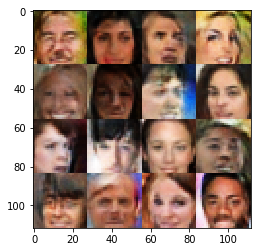

Epochs 12310/300000 Batch Step 2815/3166 gen_loss = -22.32998275756836..., disc_loss = -0.5671164393424988..., train using time = 10.948
Epochs 12320/300000 Batch Step 2825/3166 gen_loss = -22.29241943359375..., disc_loss = -0.4530428946018219..., train using time = 9.280
Epochs 12330/300000 Batch Step 2835/3166 gen_loss = -21.821361541748047..., disc_loss = -0.6271657347679138..., train using time = 9.004
Epochs 12340/300000 Batch Step 2845/3166 gen_loss = -21.59911346435547..., disc_loss = -0.6245216131210327..., train using time = 11.468
Epochs 12350/300000 Batch Step 2855/3166 gen_loss = -21.14739990234375..., disc_loss = -0.5646412968635559..., train using time = 9.918
Epochs 12360/300000 Batch Step 2865/3166 gen_loss = -21.811063766479492..., disc_loss = -0.5393272638320923..., train using time = 10.596
Epochs 12370/300000 Batch Step 2875/3166 gen_loss = -20.974864959716797..., disc_loss = -0.5129178762435913..., train using time = 10.370
Epochs 12380/300000 Batch Step 2885/3166 

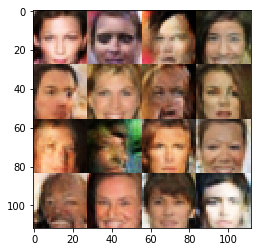

Epochs 12410/300000 Batch Step 2915/3166 gen_loss = -21.4208984375..., disc_loss = -0.5927265882492065..., train using time = 11.756
Epochs 12420/300000 Batch Step 2925/3166 gen_loss = -22.0242862701416..., disc_loss = -0.6024514436721802..., train using time = 9.212
Epochs 12430/300000 Batch Step 2935/3166 gen_loss = -21.982624053955078..., disc_loss = -0.550633430480957..., train using time = 10.222
Epochs 12440/300000 Batch Step 2945/3166 gen_loss = -23.738004684448242..., disc_loss = -0.30811160802841187..., train using time = 9.164
Epochs 12450/300000 Batch Step 2955/3166 gen_loss = -21.721607208251953..., disc_loss = -0.6209484338760376..., train using time = 9.101
Epochs 12460/300000 Batch Step 2965/3166 gen_loss = -21.85836410522461..., disc_loss = -0.482210636138916..., train using time = 15.364
Epochs 12470/300000 Batch Step 2975/3166 gen_loss = -22.54032325744629..., disc_loss = -0.3660169541835785..., train using time = 9.253
Epochs 12480/300000 Batch Step 2985/3166 gen_los

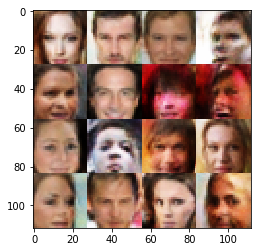

Epochs 12510/300000 Batch Step 3015/3166 gen_loss = -22.223556518554688..., disc_loss = -0.4990784525871277..., train using time = 10.260
Epochs 12520/300000 Batch Step 3025/3166 gen_loss = -21.704025268554688..., disc_loss = -0.5615919232368469..., train using time = 11.025
Epochs 12530/300000 Batch Step 3035/3166 gen_loss = -22.2216739654541..., disc_loss = -0.719274640083313..., train using time = 9.175
Epochs 12540/300000 Batch Step 3045/3166 gen_loss = -22.197282791137695..., disc_loss = -0.6113929748535156..., train using time = 9.259
Epochs 12550/300000 Batch Step 3055/3166 gen_loss = -22.231687545776367..., disc_loss = -0.5094032883644104..., train using time = 10.137
Epochs 12560/300000 Batch Step 3065/3166 gen_loss = -22.757673263549805..., disc_loss = -0.6597034931182861..., train using time = 11.090
Epochs 12570/300000 Batch Step 3075/3166 gen_loss = -22.01424789428711..., disc_loss = -0.614197850227356..., train using time = 9.512
Epochs 12580/300000 Batch Step 3085/3166 g

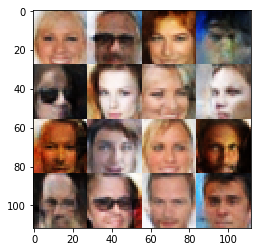

Epochs 12610/300000 Batch Step 3115/3166 gen_loss = -22.355907440185547..., disc_loss = -0.48989734053611755..., train using time = 11.184
Epochs 12620/300000 Batch Step 3125/3166 gen_loss = -22.00318145751953..., disc_loss = -0.6184128522872925..., train using time = 9.065
Epochs 12630/300000 Batch Step 3135/3166 gen_loss = -22.152801513671875..., disc_loss = -0.7409438490867615..., train using time = 9.851
Epochs 12640/300000 Batch Step 3145/3166 gen_loss = -22.291236877441406..., disc_loss = -0.5393064022064209..., train using time = 10.987
Epochs 12650/300000 Batch Step 3155/3166 gen_loss = -22.812358856201172..., disc_loss = -0.6894102096557617..., train using time = 9.795
Epochs 12660/300000 Batch Step 3165/3166 gen_loss = -22.08839988708496..., disc_loss = -0.41636258363723755..., train using time = 10.422
Epochs 12670/300000 Batch Step 10/3166 gen_loss = -23.241558074951172..., disc_loss = -0.5365372896194458..., train using time = 10.171
Epochs 12680/300000 Batch Step 20/3166 

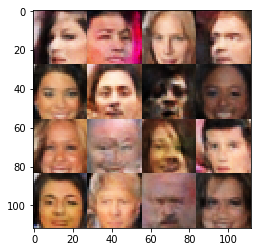

Epochs 12710/300000 Batch Step 50/3166 gen_loss = -22.835237503051758..., disc_loss = -0.6617351770401001..., train using time = 9.173
Epochs 12720/300000 Batch Step 60/3166 gen_loss = -22.03597640991211..., disc_loss = -0.4875006079673767..., train using time = 9.133
Epochs 12730/300000 Batch Step 70/3166 gen_loss = -23.387226104736328..., disc_loss = -0.6047106981277466..., train using time = 10.390
Epochs 12740/300000 Batch Step 80/3166 gen_loss = -22.974380493164062..., disc_loss = -0.5786682963371277..., train using time = 9.838
Epochs 12750/300000 Batch Step 90/3166 gen_loss = -22.080970764160156..., disc_loss = -0.38254794478416443..., train using time = 12.487
Epochs 12760/300000 Batch Step 100/3166 gen_loss = -21.830476760864258..., disc_loss = -0.5991553068161011..., train using time = 10.062
Epochs 12770/300000 Batch Step 110/3166 gen_loss = -23.023033142089844..., disc_loss = -0.5630657076835632..., train using time = 9.437
Epochs 12780/300000 Batch Step 120/3166 gen_loss =

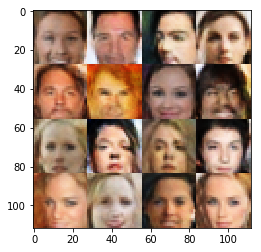

Epochs 12810/300000 Batch Step 150/3166 gen_loss = -22.004257202148438..., disc_loss = -0.5629578828811646..., train using time = 10.324
Epochs 12820/300000 Batch Step 160/3166 gen_loss = -22.56571388244629..., disc_loss = -0.5835875272750854..., train using time = 10.287
Epochs 12830/300000 Batch Step 170/3166 gen_loss = -23.230857849121094..., disc_loss = -0.5899319648742676..., train using time = 9.002
Epochs 12840/300000 Batch Step 180/3166 gen_loss = -22.940906524658203..., disc_loss = -0.5074926614761353..., train using time = 8.990
Epochs 12850/300000 Batch Step 190/3166 gen_loss = -23.69921875..., disc_loss = -0.5667679309844971..., train using time = 12.411
Epochs 12860/300000 Batch Step 200/3166 gen_loss = -23.724824905395508..., disc_loss = -0.6248129606246948..., train using time = 8.997
Epochs 12870/300000 Batch Step 210/3166 gen_loss = -24.05678939819336..., disc_loss = -0.5987809896469116..., train using time = 10.384
Epochs 12880/300000 Batch Step 220/3166 gen_loss = -2

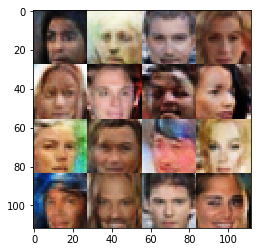

Epochs 12910/300000 Batch Step 250/3166 gen_loss = -22.866104125976562..., disc_loss = -0.4124494194984436..., train using time = 10.215
Epochs 12920/300000 Batch Step 260/3166 gen_loss = -22.82307243347168..., disc_loss = -0.6686319708824158..., train using time = 8.934
Epochs 12930/300000 Batch Step 270/3166 gen_loss = -23.372570037841797..., disc_loss = -0.5550209879875183..., train using time = 10.599
Epochs 12940/300000 Batch Step 280/3166 gen_loss = -24.098169326782227..., disc_loss = -0.5379642248153687..., train using time = 11.209
Epochs 12950/300000 Batch Step 290/3166 gen_loss = -22.907718658447266..., disc_loss = -0.674639105796814..., train using time = 10.485
Epochs 12960/300000 Batch Step 300/3166 gen_loss = -23.312789916992188..., disc_loss = -0.4607105851173401..., train using time = 9.281
Epochs 12970/300000 Batch Step 310/3166 gen_loss = -22.938404083251953..., disc_loss = -0.4962325990200043..., train using time = 10.262
Epochs 12980/300000 Batch Step 320/3166 gen_l

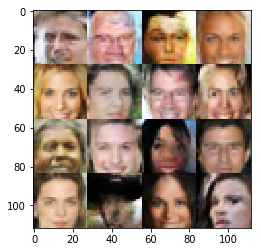

Epochs 13010/300000 Batch Step 350/3166 gen_loss = -23.765804290771484..., disc_loss = -0.6051219701766968..., train using time = 9.133
Epochs 13020/300000 Batch Step 360/3166 gen_loss = -23.816434860229492..., disc_loss = -0.5242331624031067..., train using time = 9.031
Epochs 13030/300000 Batch Step 370/3166 gen_loss = -24.23794937133789..., disc_loss = -0.5108375549316406..., train using time = 10.613
Epochs 13040/300000 Batch Step 380/3166 gen_loss = -24.096284866333008..., disc_loss = -0.5897615551948547..., train using time = 8.976
Epochs 13050/300000 Batch Step 390/3166 gen_loss = -24.174205780029297..., disc_loss = -0.47116947174072266..., train using time = 11.403
Epochs 13060/300000 Batch Step 400/3166 gen_loss = -24.056560516357422..., disc_loss = -0.5483739972114563..., train using time = 9.564
Epochs 13070/300000 Batch Step 410/3166 gen_loss = -23.887475967407227..., disc_loss = -0.6546866297721863..., train using time = 9.084
Epochs 13080/300000 Batch Step 420/3166 gen_lo

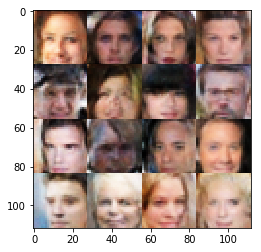

Epochs 13110/300000 Batch Step 450/3166 gen_loss = -23.879228591918945..., disc_loss = -0.5153752565383911..., train using time = 12.624
Epochs 13120/300000 Batch Step 460/3166 gen_loss = -23.28586196899414..., disc_loss = -0.5379825234413147..., train using time = 9.228
Epochs 13130/300000 Batch Step 470/3166 gen_loss = -23.740398406982422..., disc_loss = -0.4534197747707367..., train using time = 9.043
Epochs 13140/300000 Batch Step 480/3166 gen_loss = -22.448286056518555..., disc_loss = -0.577226996421814..., train using time = 10.849
Epochs 13150/300000 Batch Step 490/3166 gen_loss = -24.295650482177734..., disc_loss = -0.5781468749046326..., train using time = 10.227
Epochs 13160/300000 Batch Step 500/3166 gen_loss = -24.06207275390625..., disc_loss = -0.6457880735397339..., train using time = 9.044
Epochs 13170/300000 Batch Step 510/3166 gen_loss = -23.504528045654297..., disc_loss = -0.5078570246696472..., train using time = 13.526
Epochs 13180/300000 Batch Step 520/3166 gen_los

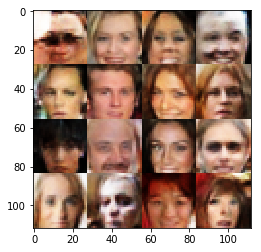

Epochs 13210/300000 Batch Step 550/3166 gen_loss = -24.561853408813477..., disc_loss = -0.4033389985561371..., train using time = 9.113
Epochs 13220/300000 Batch Step 560/3166 gen_loss = -23.530376434326172..., disc_loss = -0.48482489585876465..., train using time = 9.018
Epochs 13230/300000 Batch Step 570/3166 gen_loss = -23.78059196472168..., disc_loss = -0.5985157489776611..., train using time = 12.570
Epochs 13240/300000 Batch Step 580/3166 gen_loss = -23.855253219604492..., disc_loss = -0.6191521883010864..., train using time = 9.190
Epochs 13250/300000 Batch Step 590/3166 gen_loss = -23.439350128173828..., disc_loss = -0.5508023500442505..., train using time = 10.425
Epochs 13260/300000 Batch Step 600/3166 gen_loss = -24.213478088378906..., disc_loss = -0.5135746002197266..., train using time = 10.668
Epochs 13270/300000 Batch Step 610/3166 gen_loss = -24.70016098022461..., disc_loss = -0.5798152685165405..., train using time = 9.168
Epochs 13280/300000 Batch Step 620/3166 gen_lo

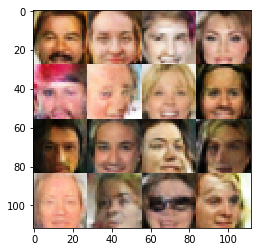

Epochs 13310/300000 Batch Step 650/3166 gen_loss = -24.02902603149414..., disc_loss = -0.567725658416748..., train using time = 9.183
Epochs 13320/300000 Batch Step 660/3166 gen_loss = -24.339445114135742..., disc_loss = -0.3931119740009308..., train using time = 10.286
Epochs 13330/300000 Batch Step 670/3166 gen_loss = -24.79299545288086..., disc_loss = -0.6175622940063477..., train using time = 9.092
Epochs 13340/300000 Batch Step 680/3166 gen_loss = -25.214685440063477..., disc_loss = -0.4358045160770416..., train using time = 9.852
Epochs 13350/300000 Batch Step 690/3166 gen_loss = -24.62299919128418..., disc_loss = -0.5340206623077393..., train using time = 10.984
Epochs 13360/300000 Batch Step 700/3166 gen_loss = -24.919784545898438..., disc_loss = -0.572658360004425..., train using time = 9.199
Epochs 13370/300000 Batch Step 710/3166 gen_loss = -24.750301361083984..., disc_loss = -0.526103675365448..., train using time = 9.475
Epochs 13380/300000 Batch Step 720/3166 gen_loss = -

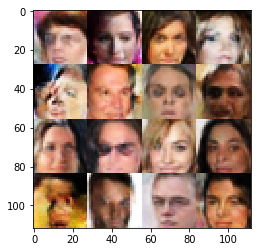

Epochs 13410/300000 Batch Step 750/3166 gen_loss = -25.158618927001953..., disc_loss = -0.5777322053909302..., train using time = 10.344
Epochs 13420/300000 Batch Step 760/3166 gen_loss = -25.00337791442871..., disc_loss = -0.5592685341835022..., train using time = 9.080
Epochs 13430/300000 Batch Step 770/3166 gen_loss = -25.573333740234375..., disc_loss = -0.43873223662376404..., train using time = 9.368
Epochs 13440/300000 Batch Step 780/3166 gen_loss = -24.561370849609375..., disc_loss = -0.3986324369907379..., train using time = 13.235
Epochs 13450/300000 Batch Step 790/3166 gen_loss = -24.914535522460938..., disc_loss = -0.46879005432128906..., train using time = 9.130
Epochs 13460/300000 Batch Step 800/3166 gen_loss = -24.269084930419922..., disc_loss = -0.5271531939506531..., train using time = 11.391
Epochs 13470/300000 Batch Step 810/3166 gen_loss = -24.334775924682617..., disc_loss = -0.5553368330001831..., train using time = 10.232
Epochs 13480/300000 Batch Step 820/3166 gen

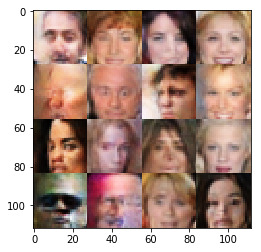

Epochs 13510/300000 Batch Step 850/3166 gen_loss = -24.714937210083008..., disc_loss = -0.6034790277481079..., train using time = 9.147
Epochs 13520/300000 Batch Step 860/3166 gen_loss = -24.90312385559082..., disc_loss = -0.4740029275417328..., train using time = 10.371
Epochs 13530/300000 Batch Step 870/3166 gen_loss = -25.800369262695312..., disc_loss = -0.5713455677032471..., train using time = 11.243
Epochs 13540/300000 Batch Step 880/3166 gen_loss = -25.62803077697754..., disc_loss = -0.6143239140510559..., train using time = 10.439
Epochs 13550/300000 Batch Step 890/3166 gen_loss = -24.942020416259766..., disc_loss = -0.6319072246551514..., train using time = 9.062
Epochs 13560/300000 Batch Step 900/3166 gen_loss = -24.810190200805664..., disc_loss = -0.5017805099487305..., train using time = 10.406
Epochs 13570/300000 Batch Step 910/3166 gen_loss = -25.03626823425293..., disc_loss = -0.3939729332923889..., train using time = 9.175
Epochs 13580/300000 Batch Step 920/3166 gen_los

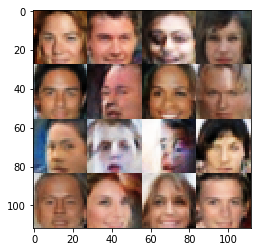

Epochs 13610/300000 Batch Step 950/3166 gen_loss = -24.358112335205078..., disc_loss = -0.5968209505081177..., train using time = 9.360
Epochs 13620/300000 Batch Step 960/3166 gen_loss = -24.798677444458008..., disc_loss = -0.3840593695640564..., train using time = 10.592
Epochs 13630/300000 Batch Step 970/3166 gen_loss = -25.358055114746094..., disc_loss = -0.5608305931091309..., train using time = 9.040
Epochs 13640/300000 Batch Step 980/3166 gen_loss = -25.209096908569336..., disc_loss = -0.39425384998321533..., train using time = 11.611
Epochs 13650/300000 Batch Step 990/3166 gen_loss = -24.996850967407227..., disc_loss = -0.5697640180587769..., train using time = 9.736
Epochs 13660/300000 Batch Step 1000/3166 gen_loss = -25.970861434936523..., disc_loss = -0.40395450592041016..., train using time = 9.148
Epochs 13670/300000 Batch Step 1010/3166 gen_loss = -25.955781936645508..., disc_loss = -0.5275386571884155..., train using time = 9.018
Epochs 13680/300000 Batch Step 1020/3166 g

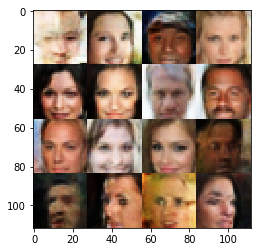

Epochs 13710/300000 Batch Step 1050/3166 gen_loss = -25.975040435791016..., disc_loss = -0.5163079500198364..., train using time = 8.956
Epochs 13720/300000 Batch Step 1060/3166 gen_loss = -24.927509307861328..., disc_loss = -0.6326708793640137..., train using time = 9.218
Epochs 13730/300000 Batch Step 1070/3166 gen_loss = -26.042461395263672..., disc_loss = -0.5012267827987671..., train using time = 9.069
Epochs 13740/300000 Batch Step 1080/3166 gen_loss = -25.636932373046875..., disc_loss = -0.5143078565597534..., train using time = 10.110
Epochs 13750/300000 Batch Step 1090/3166 gen_loss = -25.58953094482422..., disc_loss = -0.5029035806655884..., train using time = 9.116
Epochs 13760/300000 Batch Step 1100/3166 gen_loss = -25.132572174072266..., disc_loss = -0.5426801443099976..., train using time = 12.240
Epochs 13770/300000 Batch Step 1110/3166 gen_loss = -25.348045349121094..., disc_loss = -0.5518854856491089..., train using time = 9.059
Epochs 13780/300000 Batch Step 1120/3166

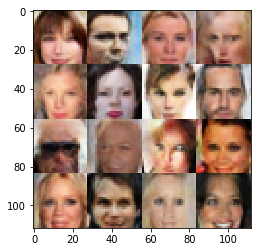

Epochs 13810/300000 Batch Step 1150/3166 gen_loss = -25.715885162353516..., disc_loss = -0.5201120376586914..., train using time = 9.414
Epochs 13820/300000 Batch Step 1160/3166 gen_loss = -24.931344985961914..., disc_loss = -0.6819921731948853..., train using time = 12.858
Epochs 13830/300000 Batch Step 1170/3166 gen_loss = -25.55413055419922..., disc_loss = -0.5428756475448608..., train using time = 9.168
Epochs 13840/300000 Batch Step 1180/3166 gen_loss = -25.262371063232422..., disc_loss = -0.46681633591651917..., train using time = 11.279
Epochs 13850/300000 Batch Step 1190/3166 gen_loss = -24.816654205322266..., disc_loss = -0.4139518737792969..., train using time = 10.685
Epochs 13860/300000 Batch Step 1200/3166 gen_loss = -25.915542602539062..., disc_loss = -0.45457154512405396..., train using time = 9.012
Epochs 13870/300000 Batch Step 1210/3166 gen_loss = -24.10879135131836..., disc_loss = -0.4295770227909088..., train using time = 9.006
Epochs 13880/300000 Batch Step 1220/31

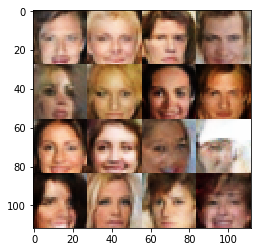

Epochs 13910/300000 Batch Step 1250/3166 gen_loss = -26.250564575195312..., disc_loss = -0.3912675380706787..., train using time = 10.254
Epochs 13920/300000 Batch Step 1260/3166 gen_loss = -25.767337799072266..., disc_loss = -0.5102370381355286..., train using time = 9.111
Epochs 13930/300000 Batch Step 1270/3166 gen_loss = -24.729368209838867..., disc_loss = -0.5522497892379761..., train using time = 9.094
Epochs 13940/300000 Batch Step 1280/3166 gen_loss = -25.741077423095703..., disc_loss = -0.5583386421203613..., train using time = 11.390
Epochs 13950/300000 Batch Step 1290/3166 gen_loss = -25.434165954589844..., disc_loss = -0.3310459852218628..., train using time = 9.199
Epochs 13960/300000 Batch Step 1300/3166 gen_loss = -25.143342971801758..., disc_loss = -0.5105829834938049..., train using time = 9.169
Epochs 13970/300000 Batch Step 1310/3166 gen_loss = -25.40482521057129..., disc_loss = -0.374844491481781..., train using time = 11.182
Epochs 13980/300000 Batch Step 1320/3166

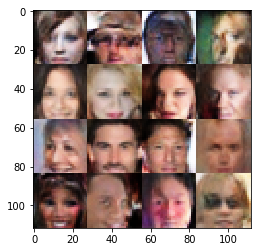

Epochs 14010/300000 Batch Step 1350/3166 gen_loss = -25.681509017944336..., disc_loss = -0.5062175989151001..., train using time = 9.037
Epochs 14020/300000 Batch Step 1360/3166 gen_loss = -27.62393569946289..., disc_loss = -0.4389250874519348..., train using time = 9.032
Epochs 14030/300000 Batch Step 1370/3166 gen_loss = -25.43996238708496..., disc_loss = -0.5357319712638855..., train using time = 11.829
Epochs 14040/300000 Batch Step 1380/3166 gen_loss = -25.91147804260254..., disc_loss = -0.40654128789901733..., train using time = 9.714
Epochs 14050/300000 Batch Step 1390/3166 gen_loss = -26.035709381103516..., disc_loss = -0.5012879371643066..., train using time = 10.278
Epochs 14060/300000 Batch Step 1400/3166 gen_loss = -26.239540100097656..., disc_loss = -0.5066308379173279..., train using time = 10.106
Epochs 14070/300000 Batch Step 1410/3166 gen_loss = -24.877700805664062..., disc_loss = -0.4279445707798004..., train using time = 9.027
Epochs 14080/300000 Batch Step 1420/3166

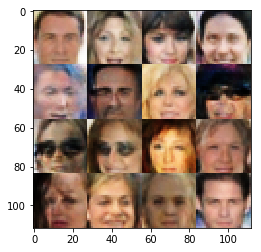

Epochs 14110/300000 Batch Step 1450/3166 gen_loss = -26.111461639404297..., disc_loss = -0.45707693696022034..., train using time = 10.349
Epochs 14120/300000 Batch Step 1460/3166 gen_loss = -25.97536849975586..., disc_loss = -0.6291590929031372..., train using time = 10.331
Epochs 14130/300000 Batch Step 1470/3166 gen_loss = -26.727752685546875..., disc_loss = -0.5154343843460083..., train using time = 10.639
Epochs 14140/300000 Batch Step 1480/3166 gen_loss = -25.822277069091797..., disc_loss = -0.5279998779296875..., train using time = 9.194
Epochs 14150/300000 Batch Step 1490/3166 gen_loss = -26.999786376953125..., disc_loss = -0.5104280710220337..., train using time = 10.277
Epochs 14160/300000 Batch Step 1500/3166 gen_loss = -25.15432357788086..., disc_loss = -0.44921571016311646..., train using time = 9.679
Epochs 14170/300000 Batch Step 1510/3166 gen_loss = -26.38737678527832..., disc_loss = -0.48817747831344604..., train using time = 10.197
Epochs 14180/300000 Batch Step 1520/

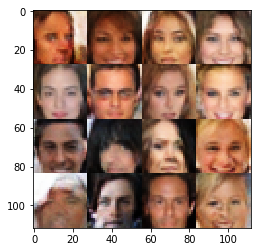

Epochs 14210/300000 Batch Step 1550/3166 gen_loss = -26.236339569091797..., disc_loss = -0.5435531735420227..., train using time = 10.260
Epochs 14220/300000 Batch Step 1560/3166 gen_loss = -25.264957427978516..., disc_loss = -0.4317319989204407..., train using time = 9.084
Epochs 14230/300000 Batch Step 1570/3166 gen_loss = -25.599971771240234..., disc_loss = -0.547735333442688..., train using time = 12.283
Epochs 14240/300000 Batch Step 1580/3166 gen_loss = -25.990266799926758..., disc_loss = -0.4799140989780426..., train using time = 9.146
Epochs 14250/300000 Batch Step 1590/3166 gen_loss = -25.956912994384766..., disc_loss = -0.5621687173843384..., train using time = 9.064
Epochs 14260/300000 Batch Step 1600/3166 gen_loss = -26.467510223388672..., disc_loss = -0.4493843913078308..., train using time = 9.586
Epochs 14270/300000 Batch Step 1610/3166 gen_loss = -25.378189086914062..., disc_loss = -0.30660682916641235..., train using time = 10.031
Epochs 14280/300000 Batch Step 1620/31

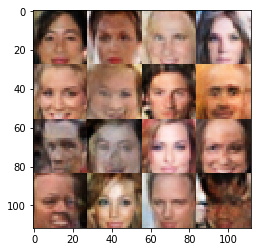

Epochs 14310/300000 Batch Step 1650/3166 gen_loss = -25.954303741455078..., disc_loss = -0.5050512552261353..., train using time = 9.051
Epochs 14320/300000 Batch Step 1660/3166 gen_loss = -26.373180389404297..., disc_loss = -0.41311851143836975..., train using time = 10.331
Epochs 14330/300000 Batch Step 1670/3166 gen_loss = -26.919113159179688..., disc_loss = -0.4613242745399475..., train using time = 10.546
Epochs 14340/300000 Batch Step 1680/3166 gen_loss = -27.44045639038086..., disc_loss = -0.4655136466026306..., train using time = 9.665
Epochs 14350/300000 Batch Step 1690/3166 gen_loss = -25.332862854003906..., disc_loss = -0.5190666913986206..., train using time = 13.386
Epochs 14360/300000 Batch Step 1700/3166 gen_loss = -26.597820281982422..., disc_loss = -0.5439046025276184..., train using time = 9.969
Epochs 14370/300000 Batch Step 1710/3166 gen_loss = -26.55493927001953..., disc_loss = -0.6006976366043091..., train using time = 9.074
Epochs 14380/300000 Batch Step 1720/316

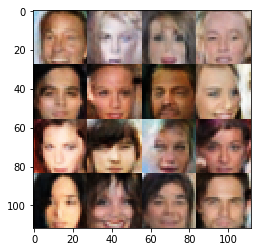

Epochs 14410/300000 Batch Step 1750/3166 gen_loss = -27.39708709716797..., disc_loss = -0.436985582113266..., train using time = 13.318
Epochs 14420/300000 Batch Step 1760/3166 gen_loss = -26.370723724365234..., disc_loss = -0.6391816735267639..., train using time = 9.832
Epochs 14430/300000 Batch Step 1770/3166 gen_loss = -26.888731002807617..., disc_loss = -0.5634311437606812..., train using time = 10.396
Epochs 14440/300000 Batch Step 1780/3166 gen_loss = -26.26680564880371..., disc_loss = -0.5969480276107788..., train using time = 10.234
Epochs 14450/300000 Batch Step 1790/3166 gen_loss = -27.986392974853516..., disc_loss = -0.3082588016986847..., train using time = 9.043
Epochs 14460/300000 Batch Step 1800/3166 gen_loss = -27.356109619140625..., disc_loss = -0.6095644235610962..., train using time = 9.056
Epochs 14470/300000 Batch Step 1810/3166 gen_loss = -27.147356033325195..., disc_loss = -0.6099479794502258..., train using time = 11.352
Epochs 14480/300000 Batch Step 1820/3166

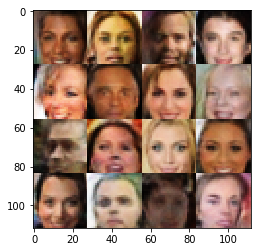

Epochs 14510/300000 Batch Step 1850/3166 gen_loss = -28.00406837463379..., disc_loss = -0.4975654184818268..., train using time = 9.078
Epochs 14520/300000 Batch Step 1860/3166 gen_loss = -27.423330307006836..., disc_loss = -0.37188369035720825..., train using time = 10.503
Epochs 14530/300000 Batch Step 1870/3166 gen_loss = -26.096115112304688..., disc_loss = -0.45738333463668823..., train using time = 10.937
Epochs 14540/300000 Batch Step 1880/3166 gen_loss = -27.208389282226562..., disc_loss = -0.49534979462623596..., train using time = 8.936
Epochs 14550/300000 Batch Step 1890/3166 gen_loss = -27.08861541748047..., disc_loss = -0.5123962163925171..., train using time = 9.108
Epochs 14560/300000 Batch Step 1900/3166 gen_loss = -27.612625122070312..., disc_loss = -0.5540441274642944..., train using time = 10.591
Epochs 14570/300000 Batch Step 1910/3166 gen_loss = -27.211816787719727..., disc_loss = -0.5659978985786438..., train using time = 9.232
Epochs 14580/300000 Batch Step 1920/3

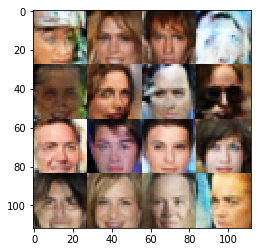

Epochs 14610/300000 Batch Step 1950/3166 gen_loss = -27.08780288696289..., disc_loss = -0.5460009574890137..., train using time = 9.065
Epochs 14620/300000 Batch Step 1960/3166 gen_loss = -27.51917266845703..., disc_loss = -0.43866729736328125..., train using time = 12.766
Epochs 14630/300000 Batch Step 1970/3166 gen_loss = -27.799428939819336..., disc_loss = -0.5816895365715027..., train using time = 9.913
Epochs 14640/300000 Batch Step 1980/3166 gen_loss = -28.147663116455078..., disc_loss = -0.5019229650497437..., train using time = 10.295
Epochs 14650/300000 Batch Step 1990/3166 gen_loss = -27.75955581665039..., disc_loss = -0.23858895897865295..., train using time = 10.211
Epochs 14660/300000 Batch Step 2000/3166 gen_loss = -28.25991439819336..., disc_loss = -0.5333071947097778..., train using time = 8.996
Epochs 14670/300000 Batch Step 2010/3166 gen_loss = -28.164215087890625..., disc_loss = -0.524699330329895..., train using time = 10.397
Epochs 14680/300000 Batch Step 2020/3166

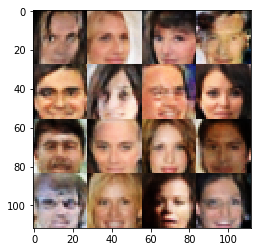

Epochs 14710/300000 Batch Step 2050/3166 gen_loss = -27.776138305664062..., disc_loss = -0.5079250335693359..., train using time = 10.440
Epochs 14720/300000 Batch Step 2060/3166 gen_loss = -27.322341918945312..., disc_loss = -0.44103342294692993..., train using time = 11.522
Epochs 14730/300000 Batch Step 2070/3166 gen_loss = -27.92272186279297..., disc_loss = -0.49610552191734314..., train using time = 9.044
Epochs 14740/300000 Batch Step 2080/3166 gen_loss = -27.290334701538086..., disc_loss = -0.4915596842765808..., train using time = 10.350
Epochs 14750/300000 Batch Step 2090/3166 gen_loss = -27.449893951416016..., disc_loss = -0.4098602831363678..., train using time = 9.518
Epochs 14760/300000 Batch Step 2100/3166 gen_loss = -28.012466430664062..., disc_loss = -0.564548671245575..., train using time = 10.233
Epochs 14770/300000 Batch Step 2110/3166 gen_loss = -27.699207305908203..., disc_loss = -0.43332362174987793..., train using time = 12.628
Epochs 14780/300000 Batch Step 2120

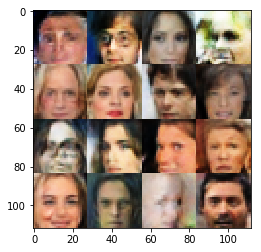

Epochs 14810/300000 Batch Step 2150/3166 gen_loss = -28.055274963378906..., disc_loss = -0.5401310324668884..., train using time = 9.019
Epochs 14820/300000 Batch Step 2160/3166 gen_loss = -28.112693786621094..., disc_loss = -0.5493698120117188..., train using time = 11.401
Epochs 14830/300000 Batch Step 2170/3166 gen_loss = -27.37949562072754..., disc_loss = -0.5180460214614868..., train using time = 10.342
Epochs 14840/300000 Batch Step 2180/3166 gen_loss = -27.729244232177734..., disc_loss = -0.6123595237731934..., train using time = 9.140
Epochs 14850/300000 Batch Step 2190/3166 gen_loss = -27.74049949645996..., disc_loss = -0.6661970019340515..., train using time = 9.127
Epochs 14860/300000 Batch Step 2200/3166 gen_loss = -28.132129669189453..., disc_loss = -0.4254469871520996..., train using time = 10.151
Epochs 14870/300000 Batch Step 2210/3166 gen_loss = -28.77213478088379..., disc_loss = -0.3986330032348633..., train using time = 10.322
Epochs 14880/300000 Batch Step 2220/3166

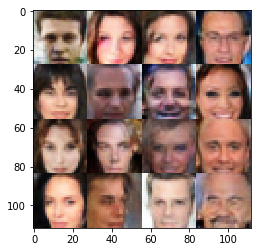

Epochs 14910/300000 Batch Step 2250/3166 gen_loss = -28.003768920898438..., disc_loss = -0.6240370273590088..., train using time = 10.252
Epochs 14920/300000 Batch Step 2260/3166 gen_loss = -28.39738655090332..., disc_loss = -0.5011461973190308..., train using time = 10.470
Epochs 14930/300000 Batch Step 2270/3166 gen_loss = -29.307296752929688..., disc_loss = -0.22696132957935333..., train using time = 9.001
Epochs 14940/300000 Batch Step 2280/3166 gen_loss = -28.182254791259766..., disc_loss = -0.5147383809089661..., train using time = 12.314
Epochs 14950/300000 Batch Step 2290/3166 gen_loss = -28.787199020385742..., disc_loss = -0.5387754440307617..., train using time = 9.130
Epochs 14960/300000 Batch Step 2300/3166 gen_loss = -28.28477668762207..., disc_loss = -0.4533659517765045..., train using time = 10.025
Epochs 14970/300000 Batch Step 2310/3166 gen_loss = -28.426355361938477..., disc_loss = -0.45405930280685425..., train using time = 12.308
Epochs 14980/300000 Batch Step 2320/

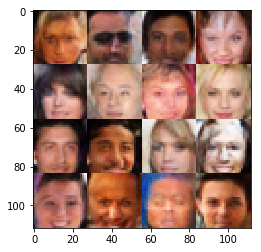

Epochs 15010/300000 Batch Step 2350/3166 gen_loss = -29.53772735595703..., disc_loss = -0.5292518734931946..., train using time = 9.099
Epochs 15020/300000 Batch Step 2360/3166 gen_loss = -28.775402069091797..., disc_loss = -0.5342446565628052..., train using time = 10.448
Epochs 15030/300000 Batch Step 2370/3166 gen_loss = -28.124473571777344..., disc_loss = -0.5772770643234253..., train using time = 10.317
Epochs 15040/300000 Batch Step 2380/3166 gen_loss = -27.87179183959961..., disc_loss = -0.4633548855781555..., train using time = 9.058
Epochs 15050/300000 Batch Step 2390/3166 gen_loss = -27.92283058166504..., disc_loss = -0.52339106798172..., train using time = 9.207
Epochs 15060/300000 Batch Step 2400/3166 gen_loss = -28.123815536499023..., disc_loss = -0.4504906237125397..., train using time = 12.134
Epochs 15070/300000 Batch Step 2410/3166 gen_loss = -29.054542541503906..., disc_loss = -0.5353965163230896..., train using time = 9.693
Epochs 15080/300000 Batch Step 2420/3166 ge

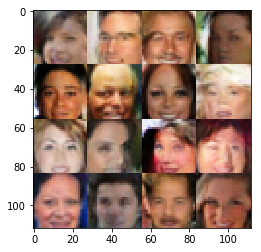

Epochs 15110/300000 Batch Step 2450/3166 gen_loss = -29.1534423828125..., disc_loss = -0.4615655839443207..., train using time = 10.281
Epochs 15120/300000 Batch Step 2460/3166 gen_loss = -29.68927001953125..., disc_loss = -0.5147684216499329..., train using time = 10.704
Epochs 15130/300000 Batch Step 2470/3166 gen_loss = -28.796348571777344..., disc_loss = -0.38621845841407776..., train using time = 9.193
Epochs 15140/300000 Batch Step 2480/3166 gen_loss = -29.671499252319336..., disc_loss = -0.544643223285675..., train using time = 8.970
Epochs 15150/300000 Batch Step 2490/3166 gen_loss = -29.286705017089844..., disc_loss = -0.550151526927948..., train using time = 10.308
Epochs 15160/300000 Batch Step 2500/3166 gen_loss = -29.483680725097656..., disc_loss = -0.4718095660209656..., train using time = 9.137
Epochs 15170/300000 Batch Step 2510/3166 gen_loss = -30.493175506591797..., disc_loss = -0.2588594853878021..., train using time = 10.954
Epochs 15180/300000 Batch Step 2520/3166 

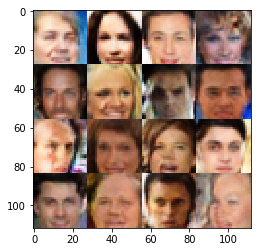

Epochs 15210/300000 Batch Step 2550/3166 gen_loss = -28.9542179107666..., disc_loss = -0.5426797866821289..., train using time = 12.151
Epochs 15220/300000 Batch Step 2560/3166 gen_loss = -29.346778869628906..., disc_loss = -0.6139115691184998..., train using time = 9.125
Epochs 15230/300000 Batch Step 2570/3166 gen_loss = -29.772462844848633..., disc_loss = -0.6832847595214844..., train using time = 11.483
Epochs 15240/300000 Batch Step 2580/3166 gen_loss = -30.301311492919922..., disc_loss = -0.42199963331222534..., train using time = 10.246
Epochs 15250/300000 Batch Step 2590/3166 gen_loss = -29.957359313964844..., disc_loss = -0.4679417014122009..., train using time = 9.144
Epochs 15260/300000 Batch Step 2600/3166 gen_loss = -29.895328521728516..., disc_loss = -0.499324232339859..., train using time = 10.233
Epochs 15270/300000 Batch Step 2610/3166 gen_loss = -29.579090118408203..., disc_loss = -0.533663272857666..., train using time = 10.255
Epochs 15280/300000 Batch Step 2620/316

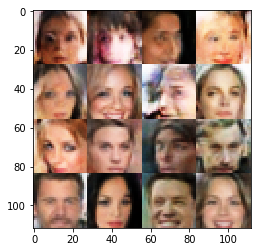

Epochs 15310/300000 Batch Step 2650/3166 gen_loss = -29.504188537597656..., disc_loss = -0.4268317222595215..., train using time = 11.663
Epochs 15320/300000 Batch Step 2660/3166 gen_loss = -30.00580596923828..., disc_loss = -0.5986477136611938..., train using time = 9.135
Epochs 15330/300000 Batch Step 2670/3166 gen_loss = -29.36922836303711..., disc_loss = -0.5051771402359009..., train using time = 10.285
Epochs 15340/300000 Batch Step 2680/3166 gen_loss = -30.55287742614746..., disc_loss = -0.4572475552558899..., train using time = 9.174
Epochs 15350/300000 Batch Step 2690/3166 gen_loss = -30.494876861572266..., disc_loss = -0.46365174651145935..., train using time = 11.704
Epochs 15360/300000 Batch Step 2700/3166 gen_loss = -29.719079971313477..., disc_loss = -0.4546336233615875..., train using time = 12.189
Epochs 15370/300000 Batch Step 2710/3166 gen_loss = -30.699159622192383..., disc_loss = -0.41411155462265015..., train using time = 9.059
Epochs 15380/300000 Batch Step 2720/31

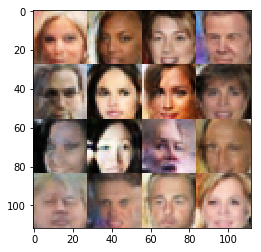

Epochs 15410/300000 Batch Step 2750/3166 gen_loss = -30.625362396240234..., disc_loss = -0.4257494807243347..., train using time = 11.399
Epochs 15420/300000 Batch Step 2760/3166 gen_loss = -29.64828872680664..., disc_loss = -0.5587750673294067..., train using time = 9.695
Epochs 15430/300000 Batch Step 2770/3166 gen_loss = -29.472442626953125..., disc_loss = -0.4763704836368561..., train using time = 8.912
Epochs 15440/300000 Batch Step 2780/3166 gen_loss = -30.111692428588867..., disc_loss = -0.5351131558418274..., train using time = 8.923
Epochs 15450/300000 Batch Step 2790/3166 gen_loss = -29.233449935913086..., disc_loss = -0.4545816481113434..., train using time = 10.222
Epochs 15460/300000 Batch Step 2800/3166 gen_loss = -30.011159896850586..., disc_loss = -0.5382996797561646..., train using time = 10.209
Epochs 15470/300000 Batch Step 2810/3166 gen_loss = -29.976823806762695..., disc_loss = -0.5774087905883789..., train using time = 10.096
Epochs 15480/300000 Batch Step 2820/31

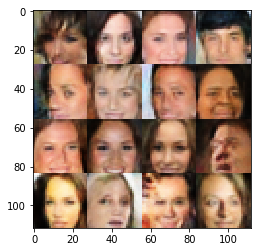

Epochs 15510/300000 Batch Step 2850/3166 gen_loss = -30.82958984375..., disc_loss = -0.4557968080043793..., train using time = 10.380
Epochs 15520/300000 Batch Step 2860/3166 gen_loss = -31.222280502319336..., disc_loss = -0.4686916768550873..., train using time = 9.103
Epochs 15530/300000 Batch Step 2870/3166 gen_loss = -29.988901138305664..., disc_loss = -0.5192511677742004..., train using time = 11.747
Epochs 15540/300000 Batch Step 2880/3166 gen_loss = -30.523691177368164..., disc_loss = -0.5171843767166138..., train using time = 9.228
Epochs 15550/300000 Batch Step 2890/3166 gen_loss = -31.099586486816406..., disc_loss = -0.4968087077140808..., train using time = 8.920
Epochs 15560/300000 Batch Step 2900/3166 gen_loss = -30.894954681396484..., disc_loss = -0.4684596061706543..., train using time = 11.953
Epochs 15570/300000 Batch Step 2910/3166 gen_loss = -30.073200225830078..., disc_loss = -0.3761462867259979..., train using time = 9.127
Epochs 15580/300000 Batch Step 2920/3166 g

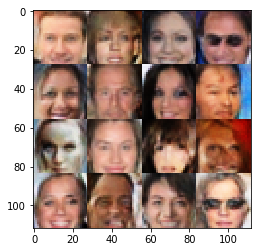

Epochs 15610/300000 Batch Step 2950/3166 gen_loss = -30.13215446472168..., disc_loss = -0.5294329524040222..., train using time = 10.570
Epochs 15620/300000 Batch Step 2960/3166 gen_loss = -30.619611740112305..., disc_loss = -0.5181829333305359..., train using time = 10.552
Epochs 15630/300000 Batch Step 2970/3166 gen_loss = -30.407455444335938..., disc_loss = -0.4835220277309418..., train using time = 9.026
Epochs 15640/300000 Batch Step 2980/3166 gen_loss = -30.7854061126709..., disc_loss = -0.4066217541694641..., train using time = 9.605
Epochs 15650/300000 Batch Step 2990/3166 gen_loss = -30.499919891357422..., disc_loss = -0.5025449991226196..., train using time = 12.756
Epochs 15660/300000 Batch Step 3000/3166 gen_loss = -30.83721160888672..., disc_loss = -0.46661871671676636..., train using time = 10.493
Epochs 15670/300000 Batch Step 3010/3166 gen_loss = -30.08216094970703..., disc_loss = -0.5428938865661621..., train using time = 9.703
Epochs 15680/300000 Batch Step 3020/3166 

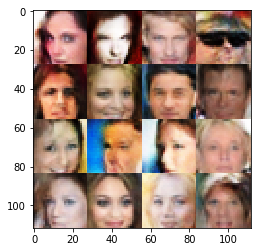

Epochs 15710/300000 Batch Step 3050/3166 gen_loss = -30.87496566772461..., disc_loss = -0.3275873064994812..., train using time = 11.440
Epochs 15720/300000 Batch Step 3060/3166 gen_loss = -30.598106384277344..., disc_loss = -0.6484581232070923..., train using time = 9.186
Epochs 15730/300000 Batch Step 3070/3166 gen_loss = -30.212337493896484..., disc_loss = -0.5213493704795837..., train using time = 9.008
Epochs 15740/300000 Batch Step 3080/3166 gen_loss = -30.60375213623047..., disc_loss = -0.3976648449897766..., train using time = 11.503
Epochs 15750/300000 Batch Step 3090/3166 gen_loss = -31.19999885559082..., disc_loss = -0.4907321333885193..., train using time = 9.050
Epochs 15760/300000 Batch Step 3100/3166 gen_loss = -30.51897430419922..., disc_loss = -0.4332270622253418..., train using time = 12.450
Epochs 15770/300000 Batch Step 3110/3166 gen_loss = -31.079788208007812..., disc_loss = -0.42108964920043945..., train using time = 11.591
Epochs 15780/300000 Batch Step 3120/3166

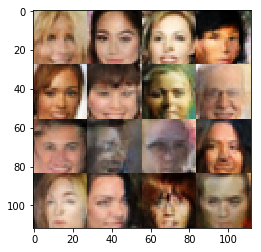

Epochs 15810/300000 Batch Step 3150/3166 gen_loss = -31.71900177001953..., disc_loss = -0.5600167512893677..., train using time = 9.685
Epochs 15820/300000 Batch Step 3160/3166 gen_loss = -30.730533599853516..., disc_loss = -0.5617809891700745..., train using time = 10.699
Epochs 15830/300000 Batch Step 5/3166 gen_loss = -29.463233947753906..., disc_loss = -0.5324329733848572..., train using time = 10.220
Epochs 15840/300000 Batch Step 15/3166 gen_loss = -31.110546112060547..., disc_loss = -0.5026756525039673..., train using time = 10.422
Epochs 15850/300000 Batch Step 25/3166 gen_loss = -30.910104751586914..., disc_loss = -0.5217160582542419..., train using time = 10.265
Epochs 15860/300000 Batch Step 35/3166 gen_loss = -30.733341217041016..., disc_loss = -0.49394527077674866..., train using time = 10.181
Epochs 15870/300000 Batch Step 45/3166 gen_loss = -31.432876586914062..., disc_loss = -0.4844995439052582..., train using time = 9.839
Epochs 15880/300000 Batch Step 55/3166 gen_loss

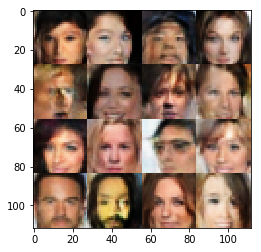

Epochs 15910/300000 Batch Step 85/3166 gen_loss = -30.01215362548828..., disc_loss = -0.39483770728111267..., train using time = 9.056
Epochs 15920/300000 Batch Step 95/3166 gen_loss = -31.02511978149414..., disc_loss = -0.39454951882362366..., train using time = 10.329
Epochs 15930/300000 Batch Step 105/3166 gen_loss = -30.746536254882812..., disc_loss = -0.4411860406398773..., train using time = 9.821
Epochs 15940/300000 Batch Step 115/3166 gen_loss = -30.68863296508789..., disc_loss = -0.5110126733779907..., train using time = 10.505
Epochs 15950/300000 Batch Step 125/3166 gen_loss = -31.37257194519043..., disc_loss = -0.47711458802223206..., train using time = 12.320
Epochs 15960/300000 Batch Step 135/3166 gen_loss = -31.685644149780273..., disc_loss = -0.5563207864761353..., train using time = 9.813
Epochs 15970/300000 Batch Step 145/3166 gen_loss = -31.411317825317383..., disc_loss = -0.4847596287727356..., train using time = 10.421
Epochs 15980/300000 Batch Step 155/3166 gen_los

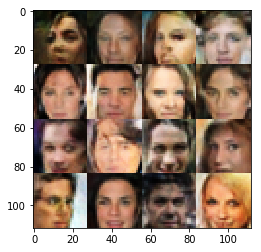

Epochs 16010/300000 Batch Step 185/3166 gen_loss = -31.325294494628906..., disc_loss = -0.5024806261062622..., train using time = 10.451
Epochs 16020/300000 Batch Step 195/3166 gen_loss = -31.895002365112305..., disc_loss = -0.5294109582901001..., train using time = 9.107
Epochs 16030/300000 Batch Step 205/3166 gen_loss = -31.386550903320312..., disc_loss = -0.39451539516448975..., train using time = 9.096
Epochs 16040/300000 Batch Step 215/3166 gen_loss = -30.50187110900879..., disc_loss = -0.4262503683567047..., train using time = 10.542
Epochs 16050/300000 Batch Step 225/3166 gen_loss = -32.18330764770508..., disc_loss = -0.32423120737075806..., train using time = 10.347
Epochs 16060/300000 Batch Step 235/3166 gen_loss = -30.779430389404297..., disc_loss = -0.4385421872138977..., train using time = 10.224
Epochs 16070/300000 Batch Step 245/3166 gen_loss = -31.18134307861328..., disc_loss = -0.5069593191146851..., train using time = 11.506
Epochs 16080/300000 Batch Step 255/3166 gen_

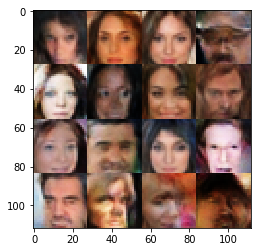

Epochs 16110/300000 Batch Step 285/3166 gen_loss = -30.916122436523438..., disc_loss = -0.5215157270431519..., train using time = 9.074
Epochs 16120/300000 Batch Step 295/3166 gen_loss = -31.228042602539062..., disc_loss = -0.565900981426239..., train using time = 10.315
Epochs 16130/300000 Batch Step 305/3166 gen_loss = -31.872941970825195..., disc_loss = -0.5182290077209473..., train using time = 9.276
Epochs 16140/300000 Batch Step 315/3166 gen_loss = -31.680816650390625..., disc_loss = -0.3478240370750427..., train using time = 9.147
Epochs 16150/300000 Batch Step 325/3166 gen_loss = -32.42938232421875..., disc_loss = -0.3502200245857239..., train using time = 10.238
Epochs 16160/300000 Batch Step 335/3166 gen_loss = -31.791072845458984..., disc_loss = -0.5426963567733765..., train using time = 10.129
Epochs 16170/300000 Batch Step 345/3166 gen_loss = -31.808753967285156..., disc_loss = -0.5168644189834595..., train using time = 9.104
Epochs 16180/300000 Batch Step 355/3166 gen_los

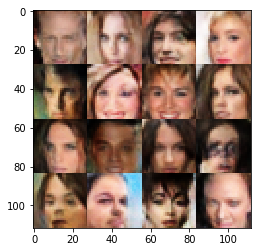

Epochs 16210/300000 Batch Step 385/3166 gen_loss = -32.669677734375..., disc_loss = -0.492000013589859..., train using time = 10.387
Epochs 16220/300000 Batch Step 395/3166 gen_loss = -32.44249725341797..., disc_loss = -0.39656299352645874..., train using time = 9.064
Epochs 16230/300000 Batch Step 405/3166 gen_loss = -31.206071853637695..., disc_loss = -0.37883278727531433..., train using time = 9.006
Epochs 16240/300000 Batch Step 415/3166 gen_loss = -31.05292320251465..., disc_loss = -0.3440910279750824..., train using time = 12.357
Epochs 16250/300000 Batch Step 425/3166 gen_loss = -31.443004608154297..., disc_loss = -0.5052717924118042..., train using time = 10.373
Epochs 16260/300000 Batch Step 435/3166 gen_loss = -32.42298889160156..., disc_loss = -0.4886695444583893..., train using time = 9.036
Epochs 16270/300000 Batch Step 445/3166 gen_loss = -32.70124435424805..., disc_loss = -0.4202759265899658..., train using time = 10.344
Epochs 16280/300000 Batch Step 455/3166 gen_loss =

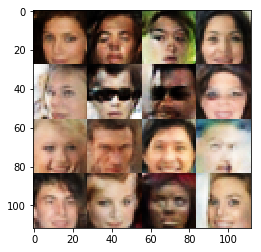

Epochs 16310/300000 Batch Step 485/3166 gen_loss = -32.700035095214844..., disc_loss = -0.49148029088974..., train using time = 9.116
Epochs 16320/300000 Batch Step 495/3166 gen_loss = -32.40770721435547..., disc_loss = -0.49635225534439087..., train using time = 8.886
Epochs 16330/300000 Batch Step 505/3166 gen_loss = -33.082984924316406..., disc_loss = -0.4008430540561676..., train using time = 10.203
Epochs 16340/300000 Batch Step 515/3166 gen_loss = -31.705400466918945..., disc_loss = -0.4948982298374176..., train using time = 9.433
Epochs 16350/300000 Batch Step 525/3166 gen_loss = -32.413902282714844..., disc_loss = -0.39468711614608765..., train using time = 10.838
Epochs 16360/300000 Batch Step 535/3166 gen_loss = -33.00551986694336..., disc_loss = -0.42027854919433594..., train using time = 11.130
Epochs 16370/300000 Batch Step 545/3166 gen_loss = -32.97447967529297..., disc_loss = -0.5209115743637085..., train using time = 9.162
Epochs 16380/300000 Batch Step 555/3166 gen_los

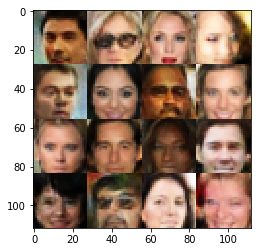

Epochs 16410/300000 Batch Step 585/3166 gen_loss = -33.41075897216797..., disc_loss = -0.5943356156349182..., train using time = 10.472
Epochs 16420/300000 Batch Step 595/3166 gen_loss = -32.714515686035156..., disc_loss = -0.4616401791572571..., train using time = 10.356
Epochs 16430/300000 Batch Step 605/3166 gen_loss = -32.68312072753906..., disc_loss = -0.45080986618995667..., train using time = 9.897
Epochs 16440/300000 Batch Step 615/3166 gen_loss = -33.35139465332031..., disc_loss = -0.3777104616165161..., train using time = 9.152
Epochs 16450/300000 Batch Step 625/3166 gen_loss = -32.57591247558594..., disc_loss = -0.4792896807193756..., train using time = 10.774
Epochs 16460/300000 Batch Step 635/3166 gen_loss = -33.47001647949219..., disc_loss = -0.4468839764595032..., train using time = 9.055
Epochs 16470/300000 Batch Step 645/3166 gen_loss = -32.923828125..., disc_loss = -0.5601538419723511..., train using time = 10.401
Epochs 16480/300000 Batch Step 655/3166 gen_loss = -33

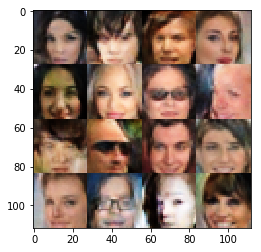

Epochs 16510/300000 Batch Step 685/3166 gen_loss = -33.01270294189453..., disc_loss = -0.4173840582370758..., train using time = 10.183
Epochs 16520/300000 Batch Step 695/3166 gen_loss = -33.195518493652344..., disc_loss = -0.38897043466567993..., train using time = 8.963
Epochs 16530/300000 Batch Step 705/3166 gen_loss = -33.317047119140625..., disc_loss = -0.4896743893623352..., train using time = 10.414
Epochs 16540/300000 Batch Step 715/3166 gen_loss = -32.876922607421875..., disc_loss = -0.4896794855594635..., train using time = 13.074
Epochs 16550/300000 Batch Step 725/3166 gen_loss = -34.784645080566406..., disc_loss = -0.3645564615726471..., train using time = 9.183
Epochs 16560/300000 Batch Step 735/3166 gen_loss = -33.762454986572266..., disc_loss = -0.4759255349636078..., train using time = 9.013
Epochs 16570/300000 Batch Step 745/3166 gen_loss = -33.790550231933594..., disc_loss = -0.453106552362442..., train using time = 10.239
Epochs 16580/300000 Batch Step 755/3166 gen_l

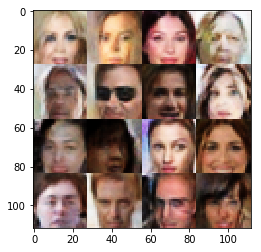

Epochs 16610/300000 Batch Step 785/3166 gen_loss = -33.79295349121094..., disc_loss = -0.45081934332847595..., train using time = 9.048
Epochs 16620/300000 Batch Step 795/3166 gen_loss = -34.00043869018555..., disc_loss = -0.5280030965805054..., train using time = 9.042
Epochs 16630/300000 Batch Step 805/3166 gen_loss = -33.441715240478516..., disc_loss = -0.3479844927787781..., train using time = 10.617
Epochs 16640/300000 Batch Step 815/3166 gen_loss = -34.010772705078125..., disc_loss = -0.5275560617446899..., train using time = 10.292
Epochs 16650/300000 Batch Step 825/3166 gen_loss = -33.11565399169922..., disc_loss = -0.4586253762245178..., train using time = 10.202
Epochs 16660/300000 Batch Step 835/3166 gen_loss = -33.580955505371094..., disc_loss = -0.4973042607307434..., train using time = 11.295
Epochs 16670/300000 Batch Step 845/3166 gen_loss = -32.798866271972656..., disc_loss = -0.5251243710517883..., train using time = 9.095
Epochs 16680/300000 Batch Step 855/3166 gen_lo

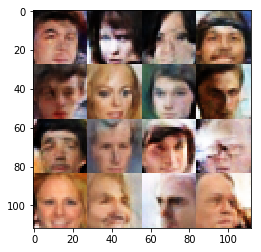

Epochs 16710/300000 Batch Step 885/3166 gen_loss = -34.22163772583008..., disc_loss = -0.2830936312675476..., train using time = 10.200
Epochs 16720/300000 Batch Step 895/3166 gen_loss = -34.430938720703125..., disc_loss = -0.48306894302368164..., train using time = 10.378
Epochs 16730/300000 Batch Step 905/3166 gen_loss = -33.07781982421875..., disc_loss = -0.5028847455978394..., train using time = 9.250
Epochs 16740/300000 Batch Step 915/3166 gen_loss = -33.55518341064453..., disc_loss = -0.37164944410324097..., train using time = 10.398
Epochs 16750/300000 Batch Step 925/3166 gen_loss = -33.6370964050293..., disc_loss = -0.4828549325466156..., train using time = 10.487
Epochs 16760/300000 Batch Step 935/3166 gen_loss = -34.87617874145508..., disc_loss = -0.36830607056617737..., train using time = 8.960
Epochs 16770/300000 Batch Step 945/3166 gen_loss = -34.550079345703125..., disc_loss = -0.5348365902900696..., train using time = 10.297
Epochs 16780/300000 Batch Step 955/3166 gen_lo

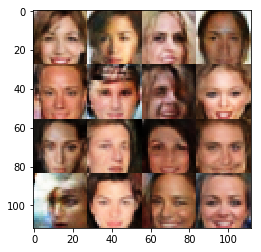

Epochs 16810/300000 Batch Step 985/3166 gen_loss = -33.80177688598633..., disc_loss = -0.3241223096847534..., train using time = 9.895
Epochs 16820/300000 Batch Step 995/3166 gen_loss = -33.170101165771484..., disc_loss = -0.5091739892959595..., train using time = 9.031
Epochs 16830/300000 Batch Step 1005/3166 gen_loss = -34.336605072021484..., disc_loss = -0.3851774334907532..., train using time = 10.508
Epochs 16840/300000 Batch Step 1015/3166 gen_loss = -34.16380310058594..., disc_loss = -0.5364528894424438..., train using time = 10.307
Epochs 16850/300000 Batch Step 1025/3166 gen_loss = -33.73260498046875..., disc_loss = -0.33190804719924927..., train using time = 9.692
Epochs 16860/300000 Batch Step 1035/3166 gen_loss = -34.17217254638672..., disc_loss = -0.492511510848999..., train using time = 9.943
Epochs 16870/300000 Batch Step 1045/3166 gen_loss = -34.05832290649414..., disc_loss = -0.38760992884635925..., train using time = 9.468
Epochs 16880/300000 Batch Step 1055/3166 gen_

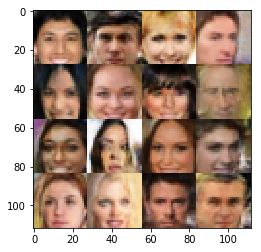

Epochs 16910/300000 Batch Step 1085/3166 gen_loss = -34.948570251464844..., disc_loss = -0.4455128610134125..., train using time = 9.023
Epochs 16920/300000 Batch Step 1095/3166 gen_loss = -34.043365478515625..., disc_loss = -0.45765456557273865..., train using time = 10.222
Epochs 16930/300000 Batch Step 1105/3166 gen_loss = -35.26715087890625..., disc_loss = -0.6073892712593079..., train using time = 9.770
Epochs 16940/300000 Batch Step 1115/3166 gen_loss = -34.665679931640625..., disc_loss = -0.4405224919319153..., train using time = 10.333
Epochs 16950/300000 Batch Step 1125/3166 gen_loss = -33.95914077758789..., disc_loss = -0.40498512983322144..., train using time = 13.342
Epochs 16960/300000 Batch Step 1135/3166 gen_loss = -34.95426940917969..., disc_loss = -0.4783465266227722..., train using time = 9.370
Epochs 16970/300000 Batch Step 1145/3166 gen_loss = -34.699623107910156..., disc_loss = -0.36426252126693726..., train using time = 9.137
Epochs 16980/300000 Batch Step 1155/31

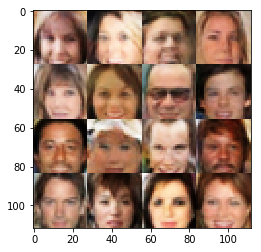

Epochs 17010/300000 Batch Step 1185/3166 gen_loss = -34.604759216308594..., disc_loss = -0.5173126459121704..., train using time = 10.675
Epochs 17020/300000 Batch Step 1195/3166 gen_loss = -33.82945251464844..., disc_loss = -0.5229016542434692..., train using time = 9.362
Epochs 17030/300000 Batch Step 1205/3166 gen_loss = -33.96018600463867..., disc_loss = -0.3238287568092346..., train using time = 9.113
Epochs 17040/300000 Batch Step 1215/3166 gen_loss = -35.077308654785156..., disc_loss = -0.42826637625694275..., train using time = 11.651
Epochs 17050/300000 Batch Step 1225/3166 gen_loss = -34.51264953613281..., disc_loss = -0.4506226181983948..., train using time = 9.645
Epochs 17060/300000 Batch Step 1235/3166 gen_loss = -35.08622360229492..., disc_loss = -0.48066145181655884..., train using time = 9.983
Epochs 17070/300000 Batch Step 1245/3166 gen_loss = -35.104854583740234..., disc_loss = -0.5370053052902222..., train using time = 10.464
Epochs 17080/300000 Batch Step 1255/3166

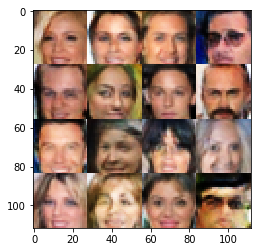

Epochs 17110/300000 Batch Step 1285/3166 gen_loss = -34.3302001953125..., disc_loss = -0.43551844358444214..., train using time = 9.147
Epochs 17120/300000 Batch Step 1295/3166 gen_loss = -34.675655364990234..., disc_loss = -0.4296491742134094..., train using time = 11.329
Epochs 17130/300000 Batch Step 1305/3166 gen_loss = -34.72346496582031..., disc_loss = -0.3931349217891693..., train using time = 13.321
Epochs 17140/300000 Batch Step 1315/3166 gen_loss = -33.446624755859375..., disc_loss = -0.3712487518787384..., train using time = 9.552
Epochs 17150/300000 Batch Step 1325/3166 gen_loss = -34.212074279785156..., disc_loss = -0.46736374497413635..., train using time = 9.149
Epochs 17160/300000 Batch Step 1335/3166 gen_loss = -35.533538818359375..., disc_loss = -0.40061578154563904..., train using time = 10.194
Epochs 17170/300000 Batch Step 1345/3166 gen_loss = -35.06946563720703..., disc_loss = -0.43750065565109253..., train using time = 9.290
Epochs 17180/300000 Batch Step 1355/31

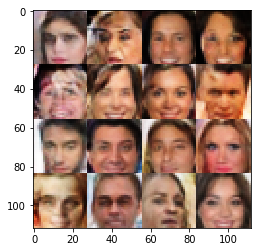

Epochs 17210/300000 Batch Step 1385/3166 gen_loss = -35.07924270629883..., disc_loss = -0.5023442506790161..., train using time = 9.066
Epochs 17220/300000 Batch Step 1395/3166 gen_loss = -34.761383056640625..., disc_loss = -0.48042982816696167..., train using time = 10.276
Epochs 17230/300000 Batch Step 1405/3166 gen_loss = -34.81707763671875..., disc_loss = -0.5507785081863403..., train using time = 10.299
Epochs 17240/300000 Batch Step 1415/3166 gen_loss = -35.87982177734375..., disc_loss = -0.3680175840854645..., train using time = 10.214
Epochs 17250/300000 Batch Step 1425/3166 gen_loss = -35.67280578613281..., disc_loss = -0.550448477268219..., train using time = 10.911
Epochs 17260/300000 Batch Step 1435/3166 gen_loss = -35.913795471191406..., disc_loss = -0.4674310088157654..., train using time = 9.081
Epochs 17270/300000 Batch Step 1445/3166 gen_loss = -34.5509147644043..., disc_loss = -0.4252486228942871..., train using time = 9.826
Epochs 17280/300000 Batch Step 1455/3166 ge

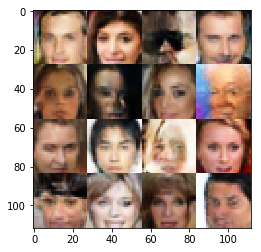

Epochs 17310/300000 Batch Step 1485/3166 gen_loss = -36.056129455566406..., disc_loss = -0.5125578045845032..., train using time = 10.259
Epochs 17320/300000 Batch Step 1495/3166 gen_loss = -36.192474365234375..., disc_loss = -0.45835861563682556..., train using time = 9.081
Epochs 17330/300000 Batch Step 1505/3166 gen_loss = -36.109188079833984..., disc_loss = -0.4663940966129303..., train using time = 10.273
Epochs 17340/300000 Batch Step 1515/3166 gen_loss = -36.76513671875..., disc_loss = -0.44488325715065..., train using time = 10.486
Epochs 17350/300000 Batch Step 1525/3166 gen_loss = -36.85248565673828..., disc_loss = -0.46086710691452026..., train using time = 8.932
Epochs 17360/300000 Batch Step 1535/3166 gen_loss = -36.123985290527344..., disc_loss = -0.4800254702568054..., train using time = 11.910
Epochs 17370/300000 Batch Step 1545/3166 gen_loss = -36.43474197387695..., disc_loss = -0.4845711588859558..., train using time = 10.463
Epochs 17380/300000 Batch Step 1555/3166 g

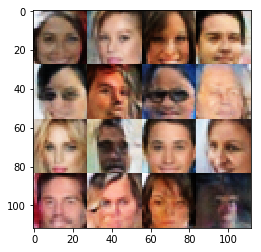

Epochs 17410/300000 Batch Step 1585/3166 gen_loss = -35.616294860839844..., disc_loss = -0.3763352930545807..., train using time = 9.360
Epochs 17420/300000 Batch Step 1595/3166 gen_loss = -35.92707061767578..., disc_loss = -0.483729749917984..., train using time = 10.510
Epochs 17430/300000 Batch Step 1605/3166 gen_loss = -35.82766342163086..., disc_loss = -0.45987987518310547..., train using time = 10.276
Epochs 17440/300000 Batch Step 1615/3166 gen_loss = -36.683067321777344..., disc_loss = -0.4262315630912781..., train using time = 8.993
Epochs 17450/300000 Batch Step 1625/3166 gen_loss = -35.030723571777344..., disc_loss = -0.29131996631622314..., train using time = 8.882
Epochs 17460/300000 Batch Step 1635/3166 gen_loss = -36.080322265625..., disc_loss = -0.43639105558395386..., train using time = 12.649
Epochs 17470/300000 Batch Step 1645/3166 gen_loss = -36.198211669921875..., disc_loss = -0.4196339547634125..., train using time = 21.599
Epochs 17480/300000 Batch Step 1655/3166

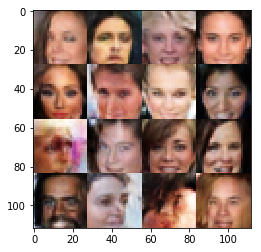

Epochs 17510/300000 Batch Step 1685/3166 gen_loss = -36.42255401611328..., disc_loss = -0.5551187992095947..., train using time = 10.403
Epochs 17520/300000 Batch Step 1695/3166 gen_loss = -34.805816650390625..., disc_loss = -0.2750554084777832..., train using time = 11.529
Epochs 17530/300000 Batch Step 1705/3166 gen_loss = -36.31499481201172..., disc_loss = -0.5878180861473083..., train using time = 10.193
Epochs 17540/300000 Batch Step 1715/3166 gen_loss = -35.977073669433594..., disc_loss = -0.43285807967185974..., train using time = 9.961
Epochs 17550/300000 Batch Step 1725/3166 gen_loss = -36.40077590942383..., disc_loss = -0.4520722031593323..., train using time = 9.024
Epochs 17560/300000 Batch Step 1735/3166 gen_loss = -35.067298889160156..., disc_loss = -0.5130623579025269..., train using time = 12.319
Epochs 17570/300000 Batch Step 1745/3166 gen_loss = -37.13263702392578..., disc_loss = -0.3524487614631653..., train using time = 9.796
Epochs 17580/300000 Batch Step 1755/3166

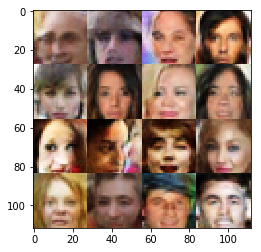

Epochs 17610/300000 Batch Step 1785/3166 gen_loss = -35.79844665527344..., disc_loss = -0.3603547513484955..., train using time = 10.451
Epochs 17620/300000 Batch Step 1795/3166 gen_loss = -36.21208190917969..., disc_loss = -0.44887393712997437..., train using time = 10.716
Epochs 17630/300000 Batch Step 1805/3166 gen_loss = -36.899681091308594..., disc_loss = -0.45923566818237305..., train using time = 8.944
Epochs 17640/300000 Batch Step 1815/3166 gen_loss = -36.904502868652344..., disc_loss = -0.3429327607154846..., train using time = 10.344
Epochs 17650/300000 Batch Step 1825/3166 gen_loss = -36.76945114135742..., disc_loss = -0.40855294466018677..., train using time = 10.324
Epochs 17660/300000 Batch Step 1835/3166 gen_loss = -36.82582092285156..., disc_loss = -0.49733132123947144..., train using time = 10.820
Epochs 17670/300000 Batch Step 1845/3166 gen_loss = -36.50904083251953..., disc_loss = -0.37246960401535034..., train using time = 8.959
Epochs 17680/300000 Batch Step 1855/

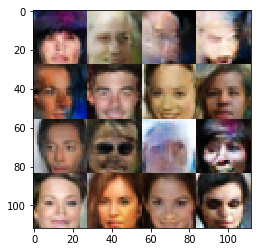

Epochs 17710/300000 Batch Step 1885/3166 gen_loss = -37.10615539550781..., disc_loss = -0.4379635751247406..., train using time = 10.278
Epochs 17720/300000 Batch Step 1895/3166 gen_loss = -36.92539978027344..., disc_loss = -0.44478240609169006..., train using time = 9.138
Epochs 17730/300000 Batch Step 1905/3166 gen_loss = -36.887733459472656..., disc_loss = -0.45457348227500916..., train using time = 10.069
Epochs 17740/300000 Batch Step 1915/3166 gen_loss = -37.55763244628906..., disc_loss = -0.4622553884983063..., train using time = 9.284
Epochs 17750/300000 Batch Step 1925/3166 gen_loss = -36.9146728515625..., disc_loss = -0.4719769358634949..., train using time = 9.078
Epochs 17760/300000 Batch Step 1935/3166 gen_loss = -37.42301940917969..., disc_loss = -0.40360599756240845..., train using time = 13.866
Epochs 17770/300000 Batch Step 1945/3166 gen_loss = -36.845367431640625..., disc_loss = -0.41495823860168457..., train using time = 9.074
Epochs 17780/300000 Batch Step 1955/3166

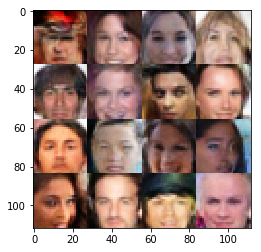

Epochs 17810/300000 Batch Step 1985/3166 gen_loss = -37.007484436035156..., disc_loss = -0.3555572032928467..., train using time = 10.883
Epochs 17820/300000 Batch Step 1995/3166 gen_loss = -36.56352996826172..., disc_loss = -0.2991109788417816..., train using time = 11.636
Epochs 17830/300000 Batch Step 2005/3166 gen_loss = -36.955692291259766..., disc_loss = -0.4560798704624176..., train using time = 9.187
Epochs 17840/300000 Batch Step 2015/3166 gen_loss = -37.82132339477539..., disc_loss = -0.38780856132507324..., train using time = 9.171
Epochs 17850/300000 Batch Step 2025/3166 gen_loss = -37.44239044189453..., disc_loss = -0.44809141755104065..., train using time = 11.421
Epochs 17860/300000 Batch Step 2035/3166 gen_loss = -37.633052825927734..., disc_loss = -0.4827689230442047..., train using time = 10.787
Epochs 17870/300000 Batch Step 2045/3166 gen_loss = -36.87940216064453..., disc_loss = -0.45779451727867126..., train using time = 10.228
Epochs 17880/300000 Batch Step 2055/3

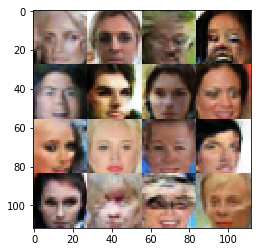

Epochs 17910/300000 Batch Step 2085/3166 gen_loss = -37.70783615112305..., disc_loss = -0.3266821503639221..., train using time = 10.846
Epochs 17920/300000 Batch Step 2095/3166 gen_loss = -37.733280181884766..., disc_loss = -0.4000781178474426..., train using time = 9.487
Epochs 17930/300000 Batch Step 2105/3166 gen_loss = -36.35795593261719..., disc_loss = -0.40247076749801636..., train using time = 10.214
Epochs 17940/300000 Batch Step 2115/3166 gen_loss = -37.292083740234375..., disc_loss = -0.5355829000473022..., train using time = 10.149
Epochs 17950/300000 Batch Step 2125/3166 gen_loss = -37.34375762939453..., disc_loss = -0.5050882697105408..., train using time = 10.376
Epochs 17960/300000 Batch Step 2135/3166 gen_loss = -37.95492172241211..., disc_loss = -0.40459364652633667..., train using time = 9.157
Epochs 17970/300000 Batch Step 2145/3166 gen_loss = -37.68017578125..., disc_loss = -0.5111857652664185..., train using time = 10.934
Epochs 17980/300000 Batch Step 2155/3166 g

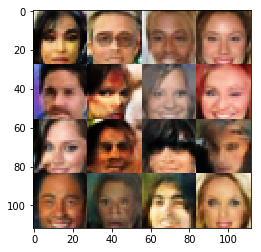

Epochs 18010/300000 Batch Step 2185/3166 gen_loss = -38.249794006347656..., disc_loss = -0.515465259552002..., train using time = 9.153
Epochs 18020/300000 Batch Step 2195/3166 gen_loss = -36.69181442260742..., disc_loss = -0.3506752550601959..., train using time = 9.090
Epochs 18030/300000 Batch Step 2205/3166 gen_loss = -37.6441650390625..., disc_loss = -0.5567246079444885..., train using time = 10.133
Epochs 18040/300000 Batch Step 2215/3166 gen_loss = -38.78989791870117..., disc_loss = -0.5952038764953613..., train using time = 9.473
Epochs 18050/300000 Batch Step 2225/3166 gen_loss = -38.03712463378906..., disc_loss = -0.3761177957057953..., train using time = 11.579
Epochs 18060/300000 Batch Step 2235/3166 gen_loss = -37.68325424194336..., disc_loss = -0.3622470498085022..., train using time = 10.629
Epochs 18070/300000 Batch Step 2245/3166 gen_loss = -37.83327102661133..., disc_loss = -0.40469059348106384..., train using time = 9.107
Epochs 18080/300000 Batch Step 2255/3166 gen_

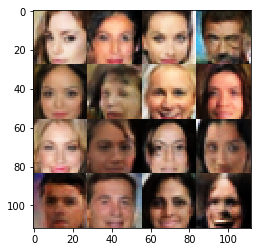

Epochs 18110/300000 Batch Step 2285/3166 gen_loss = -38.11973571777344..., disc_loss = -0.4642006456851959..., train using time = 10.911
Epochs 18120/300000 Batch Step 2295/3166 gen_loss = -38.205596923828125..., disc_loss = -0.41614073514938354..., train using time = 10.341
Epochs 18130/300000 Batch Step 2305/3166 gen_loss = -37.4798698425293..., disc_loss = -0.4452572464942932..., train using time = 9.129
Epochs 18140/300000 Batch Step 2315/3166 gen_loss = -38.20611572265625..., disc_loss = -0.5056010484695435..., train using time = 8.993
Epochs 18150/300000 Batch Step 2325/3166 gen_loss = -38.474117279052734..., disc_loss = -0.4257902503013611..., train using time = 13.455
Epochs 18160/300000 Batch Step 2335/3166 gen_loss = -37.136695861816406..., disc_loss = -0.4098043441772461..., train using time = 9.523
Epochs 18170/300000 Batch Step 2345/3166 gen_loss = -38.18709182739258..., disc_loss = -0.3926295340061188..., train using time = 10.300
Epochs 18180/300000 Batch Step 2355/3166 

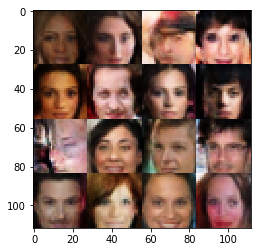

Epochs 18210/300000 Batch Step 2385/3166 gen_loss = -37.43971252441406..., disc_loss = -0.4282904267311096..., train using time = 10.357
Epochs 18220/300000 Batch Step 2395/3166 gen_loss = -38.12740707397461..., disc_loss = -0.4568025469779968..., train using time = 10.159
Epochs 18230/300000 Batch Step 2405/3166 gen_loss = -38.051109313964844..., disc_loss = -0.3948763906955719..., train using time = 11.255
Epochs 18240/300000 Batch Step 2415/3166 gen_loss = -38.708065032958984..., disc_loss = -0.44009771943092346..., train using time = 9.026
Epochs 18250/300000 Batch Step 2425/3166 gen_loss = -38.988033294677734..., disc_loss = -0.35414260625839233..., train using time = 10.254
Epochs 18260/300000 Batch Step 2435/3166 gen_loss = -38.785499572753906..., disc_loss = -0.3824390470981598..., train using time = 10.487
Epochs 18270/300000 Batch Step 2445/3166 gen_loss = -38.432579040527344..., disc_loss = -0.5010858178138733..., train using time = 9.083
Epochs 18280/300000 Batch Step 2455/

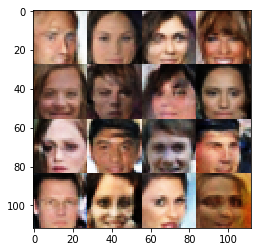

Epochs 18310/300000 Batch Step 2485/3166 gen_loss = -38.07842254638672..., disc_loss = -0.38782596588134766..., train using time = 9.212
Epochs 18320/300000 Batch Step 2495/3166 gen_loss = -37.79416275024414..., disc_loss = -0.3755425810813904..., train using time = 10.227
Epochs 18330/300000 Batch Step 2505/3166 gen_loss = -38.38284683227539..., disc_loss = -0.3805117607116699..., train using time = 9.054
Epochs 18340/300000 Batch Step 2515/3166 gen_loss = -38.169776916503906..., disc_loss = -0.35690999031066895..., train using time = 9.105
Epochs 18350/300000 Batch Step 2525/3166 gen_loss = -38.863189697265625..., disc_loss = -0.4615336060523987..., train using time = 10.637
Epochs 18360/300000 Batch Step 2535/3166 gen_loss = -38.51655578613281..., disc_loss = -0.4501708447933197..., train using time = 8.986
Epochs 18370/300000 Batch Step 2545/3166 gen_loss = -38.944313049316406..., disc_loss = -0.46081462502479553..., train using time = 9.107
Epochs 18380/300000 Batch Step 2555/3166

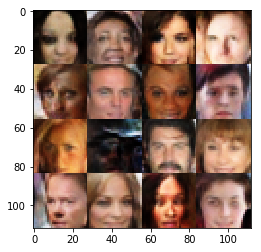

Epochs 18410/300000 Batch Step 2585/3166 gen_loss = -38.94621276855469..., disc_loss = -0.3798043131828308..., train using time = 10.496
Epochs 18420/300000 Batch Step 2595/3166 gen_loss = -38.992095947265625..., disc_loss = -0.4425744414329529..., train using time = 9.027
Epochs 18430/300000 Batch Step 2605/3166 gen_loss = -38.251731872558594..., disc_loss = -0.4594506323337555..., train using time = 9.055
Epochs 18440/300000 Batch Step 2615/3166 gen_loss = -38.67667770385742..., disc_loss = -0.42344531416893005..., train using time = 10.236
Epochs 18450/300000 Batch Step 2625/3166 gen_loss = -39.530792236328125..., disc_loss = -0.43166303634643555..., train using time = 10.469
Epochs 18460/300000 Batch Step 2635/3166 gen_loss = -38.66181182861328..., disc_loss = -0.42798060178756714..., train using time = 10.155
Epochs 18470/300000 Batch Step 2645/3166 gen_loss = -38.180267333984375..., disc_loss = -0.39653730392456055..., train using time = 10.606
Epochs 18480/300000 Batch Step 2655

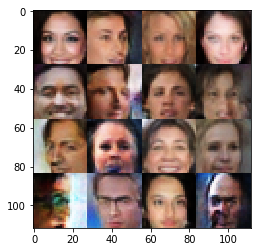

Epochs 18510/300000 Batch Step 2685/3166 gen_loss = -39.365684509277344..., disc_loss = -0.522557258605957..., train using time = 9.077
Epochs 18520/300000 Batch Step 2695/3166 gen_loss = -40.033416748046875..., disc_loss = -0.40469223260879517..., train using time = 10.239
Epochs 18530/300000 Batch Step 2705/3166 gen_loss = -39.9001579284668..., disc_loss = -0.3647564947605133..., train using time = 10.328
Epochs 18540/300000 Batch Step 2715/3166 gen_loss = -40.31720733642578..., disc_loss = -0.37585872411727905..., train using time = 10.396
Epochs 18550/300000 Batch Step 2725/3166 gen_loss = -38.50946807861328..., disc_loss = -0.5409408807754517..., train using time = 9.276
Epochs 18560/300000 Batch Step 2735/3166 gen_loss = -39.243385314941406..., disc_loss = -0.5209363698959351..., train using time = 10.130
Epochs 18570/300000 Batch Step 2745/3166 gen_loss = -38.53166198730469..., disc_loss = -0.39040645956993103..., train using time = 9.152
Epochs 18580/300000 Batch Step 2755/3166

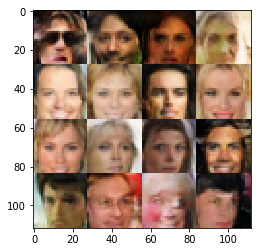

Epochs 18610/300000 Batch Step 2785/3166 gen_loss = -40.887107849121094..., disc_loss = -0.3701474070549011..., train using time = 9.605
Epochs 18620/300000 Batch Step 2795/3166 gen_loss = -39.900787353515625..., disc_loss = -0.35565924644470215..., train using time = 10.530
Epochs 18630/300000 Batch Step 2805/3166 gen_loss = -39.53038024902344..., disc_loss = -0.4160535931587219..., train using time = 9.950
Epochs 18640/300000 Batch Step 2815/3166 gen_loss = -39.508934020996094..., disc_loss = -0.45464596152305603..., train using time = 13.139
Epochs 18650/300000 Batch Step 2825/3166 gen_loss = -40.08915710449219..., disc_loss = -0.46270161867141724..., train using time = 10.303
Epochs 18660/300000 Batch Step 2835/3166 gen_loss = -39.66571044921875..., disc_loss = -0.46380671858787537..., train using time = 10.591
Epochs 18670/300000 Batch Step 2845/3166 gen_loss = -39.42354965209961..., disc_loss = -0.4666931629180908..., train using time = 9.179
Epochs 18680/300000 Batch Step 2855/3

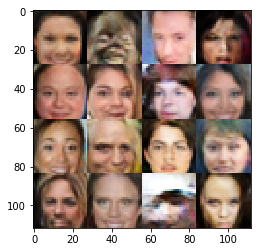

Epochs 18710/300000 Batch Step 2885/3166 gen_loss = -39.299163818359375..., disc_loss = -0.4633185863494873..., train using time = 10.366
Epochs 18720/300000 Batch Step 2895/3166 gen_loss = -39.6324462890625..., disc_loss = -0.4543616771697998..., train using time = 9.017
Epochs 18730/300000 Batch Step 2905/3166 gen_loss = -39.40069580078125..., disc_loss = -0.4682181775569916..., train using time = 9.125
Epochs 18740/300000 Batch Step 2915/3166 gen_loss = -39.6033935546875..., disc_loss = -0.41499394178390503..., train using time = 12.538
Epochs 18750/300000 Batch Step 2925/3166 gen_loss = -39.505889892578125..., disc_loss = -0.3452272415161133..., train using time = 9.107
Epochs 18760/300000 Batch Step 2935/3166 gen_loss = -40.864830017089844..., disc_loss = -0.35917019844055176..., train using time = 10.650
Epochs 18770/300000 Batch Step 2945/3166 gen_loss = -40.583946228027344..., disc_loss = -0.3951960504055023..., train using time = 9.919
Epochs 18780/300000 Batch Step 2955/3166 

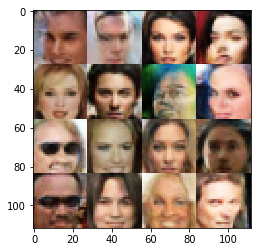

Epochs 18810/300000 Batch Step 2985/3166 gen_loss = -39.86255645751953..., disc_loss = -0.548943817615509..., train using time = 9.250
Epochs 18820/300000 Batch Step 2995/3166 gen_loss = -39.941654205322266..., disc_loss = -0.536885142326355..., train using time = 12.237
Epochs 18830/300000 Batch Step 3005/3166 gen_loss = -40.008358001708984..., disc_loss = -0.4393007159233093..., train using time = 9.142
Epochs 18840/300000 Batch Step 3015/3166 gen_loss = -39.85387420654297..., disc_loss = -0.42432576417922974..., train using time = 10.630
Epochs 18850/300000 Batch Step 3025/3166 gen_loss = -40.5096321105957..., disc_loss = -0.5167518854141235..., train using time = 10.529
Epochs 18860/300000 Batch Step 3035/3166 gen_loss = -40.802940368652344..., disc_loss = -0.4412841796875..., train using time = 9.223
Epochs 18870/300000 Batch Step 3045/3166 gen_loss = -40.65594482421875..., disc_loss = -0.5747140645980835..., train using time = 9.139
Epochs 18880/300000 Batch Step 3055/3166 gen_lo

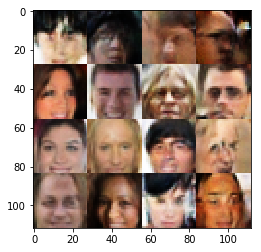

Epochs 18910/300000 Batch Step 3085/3166 gen_loss = -40.00880432128906..., disc_loss = -0.5436484217643738..., train using time = 10.281
Epochs 18920/300000 Batch Step 3095/3166 gen_loss = -40.493370056152344..., disc_loss = -0.3278767764568329..., train using time = 9.207
Epochs 18930/300000 Batch Step 3105/3166 gen_loss = -41.042213439941406..., disc_loss = -0.39267879724502563..., train using time = 9.728
Epochs 18940/300000 Batch Step 3115/3166 gen_loss = -41.074806213378906..., disc_loss = -0.4352070689201355..., train using time = 10.333
Epochs 18950/300000 Batch Step 3125/3166 gen_loss = -40.55069351196289..., disc_loss = -0.4685981273651123..., train using time = 9.576
Epochs 18960/300000 Batch Step 3135/3166 gen_loss = -40.84899139404297..., disc_loss = -0.43017512559890747..., train using time = 9.064
Epochs 18970/300000 Batch Step 3145/3166 gen_loss = -40.74892044067383..., disc_loss = -0.42686930298805237..., train using time = 10.264
Epochs 18980/300000 Batch Step 3155/316

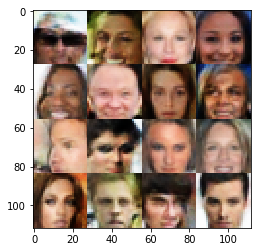

Epochs 19010/300000 Batch Step 20/3166 gen_loss = -40.32404327392578..., disc_loss = -0.4473497271537781..., train using time = 9.107
Epochs 19020/300000 Batch Step 30/3166 gen_loss = -40.65504455566406..., disc_loss = -0.4075842797756195..., train using time = 9.235
Epochs 19030/300000 Batch Step 40/3166 gen_loss = -40.681915283203125..., disc_loss = -0.46647757291793823..., train using time = 12.506
Epochs 19040/300000 Batch Step 50/3166 gen_loss = -41.186729431152344..., disc_loss = -0.4880463182926178..., train using time = 9.781
Epochs 19050/300000 Batch Step 60/3166 gen_loss = -40.825157165527344..., disc_loss = -0.35800114274024963..., train using time = 10.825
Epochs 19060/300000 Batch Step 70/3166 gen_loss = -41.108558654785156..., disc_loss = -0.31240883469581604..., train using time = 10.238
Epochs 19070/300000 Batch Step 80/3166 gen_loss = -40.568275451660156..., disc_loss = -0.43570804595947266..., train using time = 9.343
Epochs 19080/300000 Batch Step 90/3166 gen_loss = 

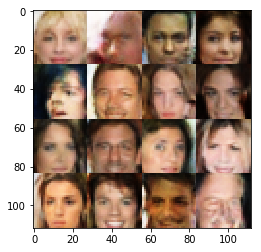

Epochs 19110/300000 Batch Step 120/3166 gen_loss = -40.45693588256836..., disc_loss = -0.4468839168548584..., train using time = 10.213
Epochs 19120/300000 Batch Step 130/3166 gen_loss = -41.098304748535156..., disc_loss = -0.47930964827537537..., train using time = 10.543
Epochs 19130/300000 Batch Step 140/3166 gen_loss = -40.64289093017578..., disc_loss = -0.49833303689956665..., train using time = 10.723
Epochs 19140/300000 Batch Step 150/3166 gen_loss = -40.695579528808594..., disc_loss = -0.4512456953525543..., train using time = 9.259
Epochs 19150/300000 Batch Step 160/3166 gen_loss = -41.28994369506836..., disc_loss = -0.46046632528305054..., train using time = 10.194
Epochs 19160/300000 Batch Step 170/3166 gen_loss = -40.058143615722656..., disc_loss = -0.42348212003707886..., train using time = 9.064
Epochs 19170/300000 Batch Step 180/3166 gen_loss = -40.91722869873047..., disc_loss = -0.4619790017604828..., train using time = 10.099
Epochs 19180/300000 Batch Step 190/3166 gen

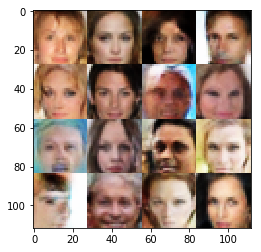

Epochs 19210/300000 Batch Step 220/3166 gen_loss = -40.717952728271484..., disc_loss = -0.4318447709083557..., train using time = 11.465
Epochs 19220/300000 Batch Step 230/3166 gen_loss = -41.258934020996094..., disc_loss = -0.4804164469242096..., train using time = 9.003
Epochs 19230/300000 Batch Step 240/3166 gen_loss = -40.59568786621094..., disc_loss = -0.44049137830734253..., train using time = 11.290
Epochs 19240/300000 Batch Step 250/3166 gen_loss = -40.951332092285156..., disc_loss = -0.2810075283050537..., train using time = 11.508
Epochs 19250/300000 Batch Step 260/3166 gen_loss = -41.065467834472656..., disc_loss = -0.4872666001319885..., train using time = 9.009
Epochs 19260/300000 Batch Step 270/3166 gen_loss = -41.362125396728516..., disc_loss = -0.4950703978538513..., train using time = 9.148
Epochs 19270/300000 Batch Step 280/3166 gen_loss = -40.99437713623047..., disc_loss = -0.6205494403839111..., train using time = 10.499
Epochs 19280/300000 Batch Step 290/3166 gen_l

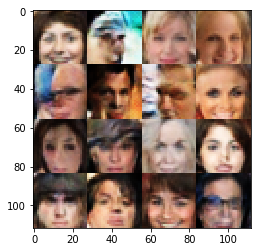

Epochs 19310/300000 Batch Step 320/3166 gen_loss = -41.12123489379883..., disc_loss = -0.3952268958091736..., train using time = 9.003
Epochs 19320/300000 Batch Step 330/3166 gen_loss = -41.285789489746094..., disc_loss = -0.39528340101242065..., train using time = 9.627
Epochs 19330/300000 Batch Step 340/3166 gen_loss = -40.613990783691406..., disc_loss = -0.4094320237636566..., train using time = 10.332
Epochs 19340/300000 Batch Step 350/3166 gen_loss = -41.65761184692383..., disc_loss = -0.4556768536567688..., train using time = 9.221
Epochs 19350/300000 Batch Step 360/3166 gen_loss = -41.328392028808594..., disc_loss = -0.5134873390197754..., train using time = 12.723
Epochs 19360/300000 Batch Step 370/3166 gen_loss = -41.80470657348633..., disc_loss = -0.43436765670776367..., train using time = 9.114
Epochs 19370/300000 Batch Step 380/3166 gen_loss = -42.146419525146484..., disc_loss = -0.31160813570022583..., train using time = 8.974
Epochs 19380/300000 Batch Step 390/3166 gen_lo

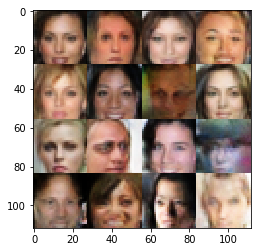

Epochs 19410/300000 Batch Step 420/3166 gen_loss = -41.87697219848633..., disc_loss = -0.3606303334236145..., train using time = 10.452
Epochs 19420/300000 Batch Step 430/3166 gen_loss = -41.333274841308594..., disc_loss = -0.4835037291049957..., train using time = 9.313
Epochs 19430/300000 Batch Step 440/3166 gen_loss = -42.13911819458008..., disc_loss = -0.38208621740341187..., train using time = 10.547
Epochs 19440/300000 Batch Step 450/3166 gen_loss = -41.86925506591797..., disc_loss = -0.43919914960861206..., train using time = 10.275
Epochs 19450/300000 Batch Step 460/3166 gen_loss = -41.42102813720703..., disc_loss = -0.4154333472251892..., train using time = 9.001
Epochs 19460/300000 Batch Step 470/3166 gen_loss = -41.44483947753906..., disc_loss = -0.42602744698524475..., train using time = 9.729
Epochs 19470/300000 Batch Step 480/3166 gen_loss = -41.45228576660156..., disc_loss = -0.5020486116409302..., train using time = 10.371
Epochs 19480/300000 Batch Step 490/3166 gen_los

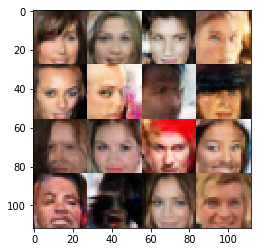

Epochs 19510/300000 Batch Step 520/3166 gen_loss = -41.798133850097656..., disc_loss = -0.4495113790035248..., train using time = 8.993
Epochs 19520/300000 Batch Step 530/3166 gen_loss = -41.02617645263672..., disc_loss = -0.42401963472366333..., train using time = 12.780
Epochs 19530/300000 Batch Step 540/3166 gen_loss = -41.53983688354492..., disc_loss = -0.3598496913909912..., train using time = 10.416
Epochs 19540/300000 Batch Step 550/3166 gen_loss = -42.71852111816406..., disc_loss = -0.32670021057128906..., train using time = 9.057
Epochs 19550/300000 Batch Step 560/3166 gen_loss = -41.82001495361328..., disc_loss = -0.3453812301158905..., train using time = 9.930
Epochs 19560/300000 Batch Step 570/3166 gen_loss = -41.5509033203125..., disc_loss = -0.569675624370575..., train using time = 10.497
Epochs 19570/300000 Batch Step 580/3166 gen_loss = -41.858760833740234..., disc_loss = -0.41798704862594604..., train using time = 10.424
Epochs 19580/300000 Batch Step 590/3166 gen_loss

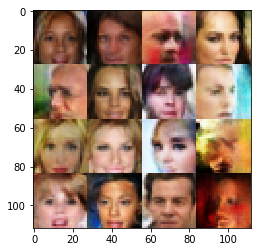

Epochs 19610/300000 Batch Step 620/3166 gen_loss = -42.95637130737305..., disc_loss = -0.44617271423339844..., train using time = 9.015
Epochs 19620/300000 Batch Step 630/3166 gen_loss = -41.60105895996094..., disc_loss = -0.32614994049072266..., train using time = 12.319
Epochs 19630/300000 Batch Step 640/3166 gen_loss = -43.04345703125..., disc_loss = -0.29438120126724243..., train using time = 9.203
Epochs 19640/300000 Batch Step 650/3166 gen_loss = -41.68365478515625..., disc_loss = -0.5689948797225952..., train using time = 10.966
Epochs 19650/300000 Batch Step 660/3166 gen_loss = -41.638404846191406..., disc_loss = -0.40758222341537476..., train using time = 10.578
Epochs 19660/300000 Batch Step 670/3166 gen_loss = -42.136077880859375..., disc_loss = -0.4172123372554779..., train using time = 9.057
Epochs 19670/300000 Batch Step 680/3166 gen_loss = -43.08155822753906..., disc_loss = -0.37729114294052124..., train using time = 10.299
Epochs 19680/300000 Batch Step 690/3166 gen_los

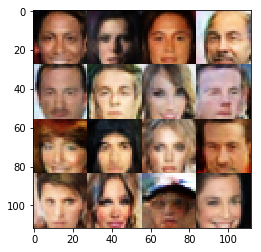

Epochs 19710/300000 Batch Step 720/3166 gen_loss = -42.52776336669922..., disc_loss = -0.3970080316066742..., train using time = 10.308
Epochs 19720/300000 Batch Step 730/3166 gen_loss = -41.73342514038086..., disc_loss = -0.4036664068698883..., train using time = 10.426
Epochs 19730/300000 Batch Step 740/3166 gen_loss = -41.51165008544922..., disc_loss = -0.43482470512390137..., train using time = 9.100
Epochs 19740/300000 Batch Step 750/3166 gen_loss = -42.21759033203125..., disc_loss = -0.41735315322875977..., train using time = 10.508
Epochs 19750/300000 Batch Step 760/3166 gen_loss = -41.774147033691406..., disc_loss = -0.5537053346633911..., train using time = 9.068
Epochs 19760/300000 Batch Step 770/3166 gen_loss = -42.86603546142578..., disc_loss = -0.3936811685562134..., train using time = 10.715
Epochs 19770/300000 Batch Step 780/3166 gen_loss = -42.838905334472656..., disc_loss = -0.3609052002429962..., train using time = 14.507
Epochs 19780/300000 Batch Step 790/3166 gen_lo

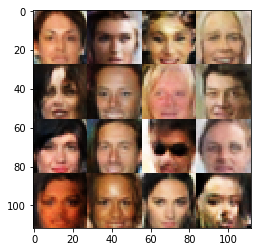

Epochs 19810/300000 Batch Step 820/3166 gen_loss = -42.59852981567383..., disc_loss = -0.4426828920841217..., train using time = 9.150
Epochs 19820/300000 Batch Step 830/3166 gen_loss = -43.33695983886719..., disc_loss = -0.17540328204631805..., train using time = 13.384
Epochs 19830/300000 Batch Step 840/3166 gen_loss = -41.848411560058594..., disc_loss = -0.4049275517463684..., train using time = 9.241
Epochs 19840/300000 Batch Step 850/3166 gen_loss = -42.742095947265625..., disc_loss = -0.4512803554534912..., train using time = 9.094
Epochs 19850/300000 Batch Step 860/3166 gen_loss = -41.644142150878906..., disc_loss = -0.3101045489311218..., train using time = 9.314
Epochs 19860/300000 Batch Step 870/3166 gen_loss = -42.771366119384766..., disc_loss = -0.48455601930618286..., train using time = 9.050
Epochs 19870/300000 Batch Step 880/3166 gen_loss = -42.382415771484375..., disc_loss = -0.4705014228820801..., train using time = 10.185
Epochs 19880/300000 Batch Step 890/3166 gen_lo

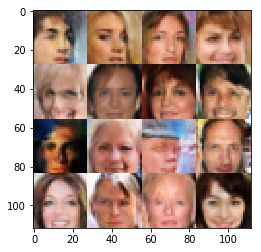

Epochs 19910/300000 Batch Step 920/3166 gen_loss = -42.93465042114258..., disc_loss = -0.4957542419433594..., train using time = 10.416
Epochs 19920/300000 Batch Step 930/3166 gen_loss = -42.554931640625..., disc_loss = -0.33911436796188354..., train using time = 11.121
Epochs 19930/300000 Batch Step 940/3166 gen_loss = -43.2443733215332..., disc_loss = -0.31166499853134155..., train using time = 9.653
Epochs 19940/300000 Batch Step 950/3166 gen_loss = -43.03172302246094..., disc_loss = -0.4580211043357849..., train using time = 10.363
Epochs 19950/300000 Batch Step 960/3166 gen_loss = -42.19003677368164..., disc_loss = -0.3652128577232361..., train using time = 9.526
Epochs 19960/300000 Batch Step 970/3166 gen_loss = -42.75812911987305..., disc_loss = -0.3001846671104431..., train using time = 8.952
Epochs 19970/300000 Batch Step 980/3166 gen_loss = -42.450286865234375..., disc_loss = -0.3154454231262207..., train using time = 12.787
Epochs 19980/300000 Batch Step 990/3166 gen_loss = 

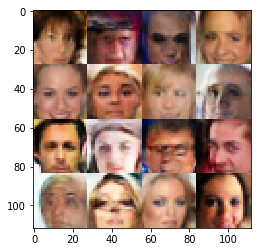

Epochs 20010/300000 Batch Step 1020/3166 gen_loss = -42.39729309082031..., disc_loss = -0.4135898947715759..., train using time = 10.354
Epochs 20020/300000 Batch Step 1030/3166 gen_loss = -42.79555130004883..., disc_loss = -0.46962523460388184..., train using time = 9.424
Epochs 20030/300000 Batch Step 1040/3166 gen_loss = -43.67512512207031..., disc_loss = -0.39075788855552673..., train using time = 10.337
Epochs 20040/300000 Batch Step 1050/3166 gen_loss = -43.32862854003906..., disc_loss = -0.3391656279563904..., train using time = 9.475
Epochs 20050/300000 Batch Step 1060/3166 gen_loss = -44.45233154296875..., disc_loss = -0.3564578890800476..., train using time = 10.423
Epochs 20060/300000 Batch Step 1070/3166 gen_loss = -43.69642639160156..., disc_loss = -0.49544644355773926..., train using time = 12.152
Epochs 20070/300000 Batch Step 1080/3166 gen_loss = -43.50443649291992..., disc_loss = -0.4335607588291168..., train using time = 9.267
Epochs 20080/300000 Batch Step 1090/3166 

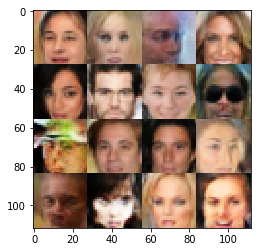

Epochs 20110/300000 Batch Step 1120/3166 gen_loss = -42.83723831176758..., disc_loss = -0.3915631175041199..., train using time = 11.580
Epochs 20120/300000 Batch Step 1130/3166 gen_loss = -43.96680450439453..., disc_loss = -0.39893990755081177..., train using time = 12.125
Epochs 20130/300000 Batch Step 1140/3166 gen_loss = -43.67058563232422..., disc_loss = -0.3307381570339203..., train using time = 9.075
Epochs 20140/300000 Batch Step 1150/3166 gen_loss = -44.211219787597656..., disc_loss = -0.42509040236473083..., train using time = 9.027
Epochs 20150/300000 Batch Step 1160/3166 gen_loss = -44.24285888671875..., disc_loss = -0.37673965096473694..., train using time = 10.260
Epochs 20160/300000 Batch Step 1170/3166 gen_loss = -43.61766052246094..., disc_loss = -0.4571100175380707..., train using time = 10.415
Epochs 20170/300000 Batch Step 1180/3166 gen_loss = -44.236358642578125..., disc_loss = -0.37369999289512634..., train using time = 10.356
Epochs 20180/300000 Batch Step 1190/3

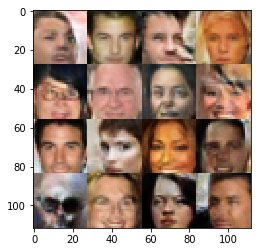

Epochs 20210/300000 Batch Step 1220/3166 gen_loss = -43.5743293762207..., disc_loss = -0.5198567509651184..., train using time = 12.479
Epochs 20220/300000 Batch Step 1230/3166 gen_loss = -44.49848175048828..., disc_loss = -0.44384732842445374..., train using time = 9.039
Epochs 20230/300000 Batch Step 1240/3166 gen_loss = -43.6982421875..., disc_loss = -0.5648684501647949..., train using time = 10.187
Epochs 20240/300000 Batch Step 1250/3166 gen_loss = -43.8777961730957..., disc_loss = -0.4066429138183594..., train using time = 10.361
Epochs 20250/300000 Batch Step 1260/3166 gen_loss = -44.37166213989258..., disc_loss = -0.46971505880355835..., train using time = 9.674
Epochs 20260/300000 Batch Step 1270/3166 gen_loss = -43.998008728027344..., disc_loss = -0.32748597860336304..., train using time = 10.267
Epochs 20270/300000 Batch Step 1280/3166 gen_loss = -43.967838287353516..., disc_loss = -0.4746032655239105..., train using time = 10.570
Epochs 20280/300000 Batch Step 1290/3166 gen

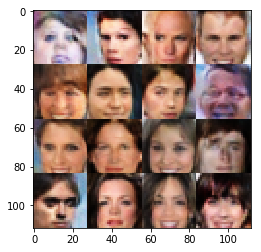

Epochs 20310/300000 Batch Step 1320/3166 gen_loss = -43.833351135253906..., disc_loss = -0.3474608361721039..., train using time = 10.411
Epochs 20320/300000 Batch Step 1330/3166 gen_loss = -44.535587310791016..., disc_loss = -0.4708327651023865..., train using time = 9.210
Epochs 20330/300000 Batch Step 1340/3166 gen_loss = -44.09074401855469..., disc_loss = -0.26147717237472534..., train using time = 9.183
Epochs 20340/300000 Batch Step 1350/3166 gen_loss = -43.744163513183594..., disc_loss = -0.3581750690937042..., train using time = 9.184
Epochs 20350/300000 Batch Step 1360/3166 gen_loss = -44.54316711425781..., disc_loss = -0.5252602100372314..., train using time = 11.559
Epochs 20360/300000 Batch Step 1370/3166 gen_loss = -44.361934661865234..., disc_loss = -0.31036797165870667..., train using time = 11.440
Epochs 20370/300000 Batch Step 1380/3166 gen_loss = -44.50148010253906..., disc_loss = -0.37240344285964966..., train using time = 9.058
Epochs 20380/300000 Batch Step 1390/31

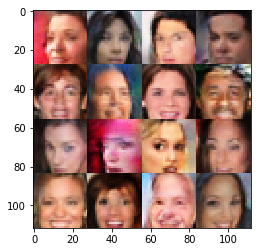

Epochs 20410/300000 Batch Step 1420/3166 gen_loss = -44.038509368896484..., disc_loss = -0.4347684383392334..., train using time = 19.327
Epochs 20420/300000 Batch Step 1430/3166 gen_loss = -44.59740447998047..., disc_loss = -0.4066169857978821..., train using time = 9.270
Epochs 20430/300000 Batch Step 1440/3166 gen_loss = -45.57456970214844..., disc_loss = -0.48836931586265564..., train using time = 9.623
Epochs 20440/300000 Batch Step 1450/3166 gen_loss = -45.16057586669922..., disc_loss = -0.40660324692726135..., train using time = 9.249
Epochs 20450/300000 Batch Step 1460/3166 gen_loss = -44.38737487792969..., disc_loss = -0.4893191456794739..., train using time = 10.820
Epochs 20460/300000 Batch Step 1470/3166 gen_loss = -44.36445617675781..., disc_loss = -0.48643961548805237..., train using time = 11.391
Epochs 20470/300000 Batch Step 1480/3166 gen_loss = -42.896339416503906..., disc_loss = -0.3426252007484436..., train using time = 9.130
Epochs 20480/300000 Batch Step 1490/3166

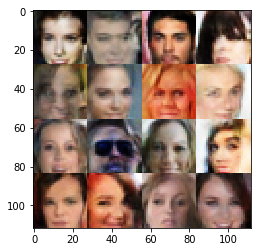

Epochs 20510/300000 Batch Step 1520/3166 gen_loss = -44.46392059326172..., disc_loss = -0.3859575390815735..., train using time = 10.726
Epochs 20520/300000 Batch Step 1530/3166 gen_loss = -44.81006622314453..., disc_loss = -0.3575647473335266..., train using time = 10.472
Epochs 20530/300000 Batch Step 1540/3166 gen_loss = -44.588226318359375..., disc_loss = -0.38495007157325745..., train using time = 9.165
Epochs 20540/300000 Batch Step 1550/3166 gen_loss = -44.982032775878906..., disc_loss = -0.3890295624732971..., train using time = 9.665
Epochs 20550/300000 Batch Step 1560/3166 gen_loss = -45.01441192626953..., disc_loss = -0.38888949155807495..., train using time = 10.443
Epochs 20560/300000 Batch Step 1570/3166 gen_loss = -44.92340087890625..., disc_loss = -0.4112706184387207..., train using time = 9.041
Epochs 20570/300000 Batch Step 1580/3166 gen_loss = -44.72865295410156..., disc_loss = -0.43502578139305115..., train using time = 10.350
Epochs 20580/300000 Batch Step 1590/316

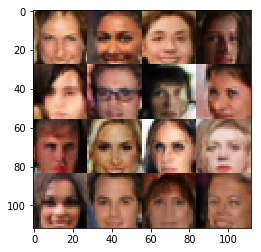

Epochs 20610/300000 Batch Step 1620/3166 gen_loss = -45.139076232910156..., disc_loss = -0.5308030843734741..., train using time = 10.252
Epochs 20620/300000 Batch Step 1630/3166 gen_loss = -45.040870666503906..., disc_loss = -0.3504254221916199..., train using time = 9.118
Epochs 20630/300000 Batch Step 1640/3166 gen_loss = -45.55267333984375..., disc_loss = -0.3774755299091339..., train using time = 11.862
Epochs 20640/300000 Batch Step 1650/3166 gen_loss = -44.911155700683594..., disc_loss = -0.4651361405849457..., train using time = 12.299
Epochs 20650/300000 Batch Step 1660/3166 gen_loss = -45.363258361816406..., disc_loss = -0.39062759280204773..., train using time = 9.452
Epochs 20660/300000 Batch Step 1670/3166 gen_loss = -45.6624870300293..., disc_loss = -0.32203954458236694..., train using time = 9.114
Epochs 20670/300000 Batch Step 1680/3166 gen_loss = -45.93231964111328..., disc_loss = -0.2329178750514984..., train using time = 10.249
Epochs 20680/300000 Batch Step 1690/316

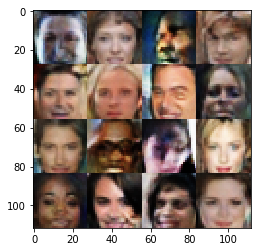

Epochs 20710/300000 Batch Step 1720/3166 gen_loss = -45.952003479003906..., disc_loss = -0.36873191595077515..., train using time = 9.146
Epochs 20720/300000 Batch Step 1730/3166 gen_loss = -45.427513122558594..., disc_loss = -0.6039341688156128..., train using time = 9.040
Epochs 20730/300000 Batch Step 1740/3166 gen_loss = -45.47175216674805..., disc_loss = -0.4664383828639984..., train using time = 10.996
Epochs 20740/300000 Batch Step 1750/3166 gen_loss = -45.87470245361328..., disc_loss = -0.4171440601348877..., train using time = 10.388
Epochs 20750/300000 Batch Step 1760/3166 gen_loss = -45.08837890625..., disc_loss = -0.4663058817386627..., train using time = 10.244
Epochs 20760/300000 Batch Step 1770/3166 gen_loss = -45.52688980102539..., disc_loss = -0.41704192757606506..., train using time = 10.514
Epochs 20770/300000 Batch Step 1780/3166 gen_loss = -44.74489212036133..., disc_loss = -0.4165172576904297..., train using time = 9.010
Epochs 20780/300000 Batch Step 1790/3166 ge

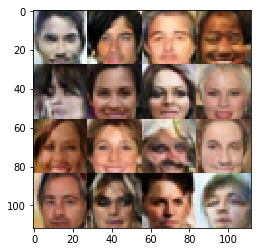

Epochs 20810/300000 Batch Step 1820/3166 gen_loss = -45.62089538574219..., disc_loss = -0.44043588638305664..., train using time = 10.281
Epochs 20820/300000 Batch Step 1830/3166 gen_loss = -45.394859313964844..., disc_loss = -0.42557087540626526..., train using time = 9.588
Epochs 20830/300000 Batch Step 1840/3166 gen_loss = -45.264686584472656..., disc_loss = -0.45872753858566284..., train using time = 9.090
Epochs 20840/300000 Batch Step 1850/3166 gen_loss = -45.9119873046875..., disc_loss = -0.4225890636444092..., train using time = 10.056
Epochs 20850/300000 Batch Step 1860/3166 gen_loss = -45.92831039428711..., disc_loss = -0.4768952429294586..., train using time = 9.388
Epochs 20860/300000 Batch Step 1870/3166 gen_loss = -45.47343826293945..., disc_loss = -0.31721991300582886..., train using time = 9.097
Epochs 20870/300000 Batch Step 1880/3166 gen_loss = -45.081947326660156..., disc_loss = -0.4329996109008789..., train using time = 10.473
Epochs 20880/300000 Batch Step 1890/316

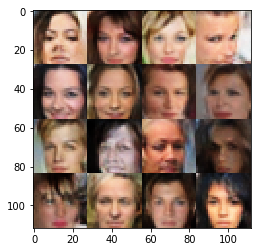

Epochs 20910/300000 Batch Step 1920/3166 gen_loss = -46.27973937988281..., disc_loss = -0.5534194707870483..., train using time = 9.183
Epochs 20920/300000 Batch Step 1930/3166 gen_loss = -45.58763885498047..., disc_loss = -0.45307105779647827..., train using time = 9.160
Epochs 20930/300000 Batch Step 1940/3166 gen_loss = -44.62355422973633..., disc_loss = -0.31791257858276367..., train using time = 13.415
Epochs 20940/300000 Batch Step 1950/3166 gen_loss = -46.015533447265625..., disc_loss = -0.42221522331237793..., train using time = 10.140
Epochs 20950/300000 Batch Step 1960/3166 gen_loss = -46.76094436645508..., disc_loss = -0.4167606830596924..., train using time = 9.026
Epochs 20960/300000 Batch Step 1970/3166 gen_loss = -46.575111389160156..., disc_loss = -0.3717137575149536..., train using time = 10.276
Epochs 20970/300000 Batch Step 1980/3166 gen_loss = -46.230613708496094..., disc_loss = -0.3431909680366516..., train using time = 9.059
Epochs 20980/300000 Batch Step 1990/316

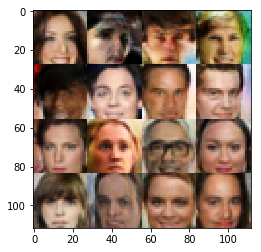

Epochs 21010/300000 Batch Step 2020/3166 gen_loss = -47.556251525878906..., disc_loss = -0.3850386142730713..., train using time = 8.975
Epochs 21020/300000 Batch Step 2030/3166 gen_loss = -46.5378532409668..., disc_loss = -0.32806459069252014..., train using time = 10.224
Epochs 21030/300000 Batch Step 2040/3166 gen_loss = -46.56111145019531..., disc_loss = -0.4613286554813385..., train using time = 9.089
Epochs 21040/300000 Batch Step 2050/3166 gen_loss = -46.3007698059082..., disc_loss = -0.3308757543563843..., train using time = 11.958
Epochs 21050/300000 Batch Step 2060/3166 gen_loss = -45.74051284790039..., disc_loss = -0.17344620823860168..., train using time = 10.311
Epochs 21060/300000 Batch Step 2070/3166 gen_loss = -44.70637512207031..., disc_loss = -0.38031402230262756..., train using time = 9.114
Epochs 21070/300000 Batch Step 2080/3166 gen_loss = -46.21949768066406..., disc_loss = -0.3052540421485901..., train using time = 8.893
Epochs 21080/300000 Batch Step 2090/3166 ge

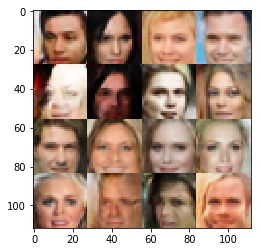

Epochs 21110/300000 Batch Step 2120/3166 gen_loss = -46.73527526855469..., disc_loss = -0.37718456983566284..., train using time = 10.136
Epochs 21120/300000 Batch Step 2130/3166 gen_loss = -46.925148010253906..., disc_loss = -0.38744431734085083..., train using time = 10.266
Epochs 21130/300000 Batch Step 2140/3166 gen_loss = -46.1743278503418..., disc_loss = -0.340767502784729..., train using time = 10.288
Epochs 21140/300000 Batch Step 2150/3166 gen_loss = -46.38365936279297..., disc_loss = -0.36523598432540894..., train using time = 10.296
Epochs 21150/300000 Batch Step 2160/3166 gen_loss = -46.61673355102539..., disc_loss = -0.439420223236084..., train using time = 9.004
Epochs 21160/300000 Batch Step 2170/3166 gen_loss = -46.202247619628906..., disc_loss = -0.5356613993644714..., train using time = 10.342
Epochs 21170/300000 Batch Step 2180/3166 gen_loss = -46.65303039550781..., disc_loss = -0.3953593671321869..., train using time = 10.133
Epochs 21180/300000 Batch Step 2190/3166

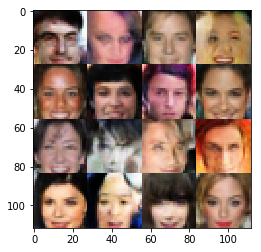

Epochs 21210/300000 Batch Step 2220/3166 gen_loss = -47.279666900634766..., disc_loss = -0.4064156115055084..., train using time = 9.030
Epochs 21220/300000 Batch Step 2230/3166 gen_loss = -47.082122802734375..., disc_loss = -0.4122597277164459..., train using time = 10.300
Epochs 21230/300000 Batch Step 2240/3166 gen_loss = -46.698265075683594..., disc_loss = -0.3910554349422455..., train using time = 11.994
Epochs 21240/300000 Batch Step 2250/3166 gen_loss = -46.4615478515625..., disc_loss = -0.4710467755794525..., train using time = 9.208
Epochs 21250/300000 Batch Step 2260/3166 gen_loss = -46.434383392333984..., disc_loss = -0.3733079433441162..., train using time = 9.013
Epochs 21260/300000 Batch Step 2270/3166 gen_loss = -47.30750274658203..., disc_loss = -0.34320446848869324..., train using time = 10.325
Epochs 21270/300000 Batch Step 2280/3166 gen_loss = -47.064231872558594..., disc_loss = -0.41546326875686646..., train using time = 8.905
Epochs 21280/300000 Batch Step 2290/316

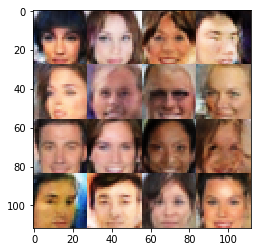

Epochs 21310/300000 Batch Step 2320/3166 gen_loss = -47.181236267089844..., disc_loss = -0.31859955191612244..., train using time = 9.070
Epochs 21320/300000 Batch Step 2330/3166 gen_loss = -47.403602600097656..., disc_loss = -0.37986621260643005..., train using time = 10.226
Epochs 21330/300000 Batch Step 2340/3166 gen_loss = -47.663917541503906..., disc_loss = -0.38452082872390747..., train using time = 10.303
Epochs 21340/300000 Batch Step 2350/3166 gen_loss = -48.16786193847656..., disc_loss = -0.40890470147132874..., train using time = 10.503
Epochs 21350/300000 Batch Step 2360/3166 gen_loss = -46.786521911621094..., disc_loss = -0.314991295337677..., train using time = 10.428
Epochs 21360/300000 Batch Step 2370/3166 gen_loss = -47.225955963134766..., disc_loss = -0.34664633870124817..., train using time = 9.116
Epochs 21370/300000 Batch Step 2380/3166 gen_loss = -47.04084777832031..., disc_loss = -0.4948089122772217..., train using time = 9.784
Epochs 21380/300000 Batch Step 2390

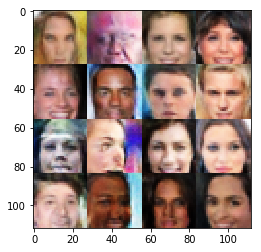

Epochs 21410/300000 Batch Step 2420/3166 gen_loss = -47.50770568847656..., disc_loss = -0.3086700439453125..., train using time = 9.533
Epochs 21420/300000 Batch Step 2430/3166 gen_loss = -46.51301956176758..., disc_loss = -0.39250627160072327..., train using time = 9.180
Epochs 21430/300000 Batch Step 2440/3166 gen_loss = -47.31123352050781..., disc_loss = -0.40249156951904297..., train using time = 10.100
Epochs 21440/300000 Batch Step 2450/3166 gen_loss = -48.28814697265625..., disc_loss = -0.39334774017333984..., train using time = 10.295
Epochs 21450/300000 Batch Step 2460/3166 gen_loss = -47.83787536621094..., disc_loss = -0.3984098732471466..., train using time = 9.534
Epochs 21460/300000 Batch Step 2470/3166 gen_loss = -47.00055694580078..., disc_loss = -0.3418444097042084..., train using time = 12.001
Epochs 21470/300000 Batch Step 2480/3166 gen_loss = -47.82017517089844..., disc_loss = -0.42215242981910706..., train using time = 9.439
Epochs 21480/300000 Batch Step 2490/3166 

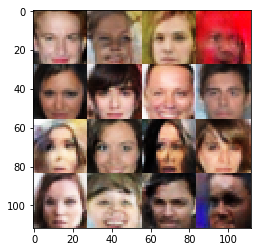

Epochs 21510/300000 Batch Step 2520/3166 gen_loss = -48.0211181640625..., disc_loss = -0.44272541999816895..., train using time = 9.002
Epochs 21520/300000 Batch Step 2530/3166 gen_loss = -49.458229064941406..., disc_loss = -0.3988521993160248..., train using time = 12.388
Epochs 21530/300000 Batch Step 2540/3166 gen_loss = -47.42259216308594..., disc_loss = -0.36701059341430664..., train using time = 11.533
Epochs 21540/300000 Batch Step 2550/3166 gen_loss = -48.577796936035156..., disc_loss = -0.42927056550979614..., train using time = 9.681
Epochs 21550/300000 Batch Step 2560/3166 gen_loss = -48.307159423828125..., disc_loss = -0.4971954822540283..., train using time = 10.429
Epochs 21560/300000 Batch Step 2570/3166 gen_loss = -49.05451965332031..., disc_loss = -0.3581066131591797..., train using time = 9.159
Epochs 21570/300000 Batch Step 2580/3166 gen_loss = -48.436649322509766..., disc_loss = -0.4409253001213074..., train using time = 9.185
Epochs 21580/300000 Batch Step 2590/316

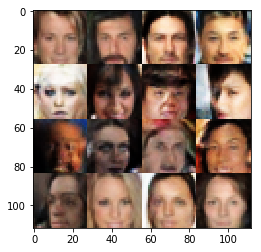

Epochs 21610/300000 Batch Step 2620/3166 gen_loss = -48.60612106323242..., disc_loss = -0.4664529263973236..., train using time = 10.197
Epochs 21620/300000 Batch Step 2630/3166 gen_loss = -48.722259521484375..., disc_loss = -0.421896755695343..., train using time = 9.091
Epochs 21630/300000 Batch Step 2640/3166 gen_loss = -49.081886291503906..., disc_loss = -0.23802649974822998..., train using time = 12.275
Epochs 21640/300000 Batch Step 2650/3166 gen_loss = -48.93598175048828..., disc_loss = -0.4026070535182953..., train using time = 11.054
Epochs 21650/300000 Batch Step 2660/3166 gen_loss = -49.11077880859375..., disc_loss = -0.32434138655662537..., train using time = 9.155
Epochs 21660/300000 Batch Step 2670/3166 gen_loss = -48.79999542236328..., disc_loss = -0.41611164808273315..., train using time = 9.538
Epochs 21670/300000 Batch Step 2680/3166 gen_loss = -49.23786544799805..., disc_loss = -0.40098482370376587..., train using time = 10.259
Epochs 21680/300000 Batch Step 2690/316

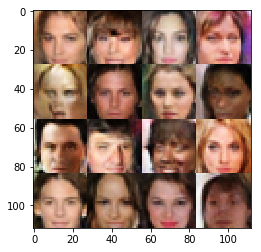

Epochs 21710/300000 Batch Step 2720/3166 gen_loss = -48.57821273803711..., disc_loss = -0.47268009185791016..., train using time = 9.194
Epochs 21720/300000 Batch Step 2730/3166 gen_loss = -49.33982849121094..., disc_loss = -0.38235345482826233..., train using time = 10.368
Epochs 21730/300000 Batch Step 2740/3166 gen_loss = -49.086429595947266..., disc_loss = -0.38511523604393005..., train using time = 11.473
Epochs 21740/300000 Batch Step 2750/3166 gen_loss = -48.783729553222656..., disc_loss = -0.33438605070114136..., train using time = 9.107
Epochs 21750/300000 Batch Step 2760/3166 gen_loss = -47.9110107421875..., disc_loss = -0.34831517934799194..., train using time = 10.324
Epochs 21760/300000 Batch Step 2770/3166 gen_loss = -48.74584197998047..., disc_loss = -0.4061308801174164..., train using time = 10.354
Epochs 21770/300000 Batch Step 2780/3166 gen_loss = -49.324459075927734..., disc_loss = -0.43783849477767944..., train using time = 10.464
Epochs 21780/300000 Batch Step 2790

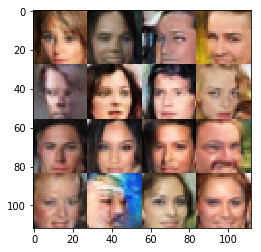

Epochs 21810/300000 Batch Step 2820/3166 gen_loss = -48.81764221191406..., disc_loss = -0.4185155928134918..., train using time = 10.182
Epochs 21820/300000 Batch Step 2830/3166 gen_loss = -49.877498626708984..., disc_loss = -0.3647932708263397..., train using time = 12.460
Epochs 21830/300000 Batch Step 2840/3166 gen_loss = -49.20109558105469..., disc_loss = -0.5657233595848083..., train using time = 9.200
Epochs 21840/300000 Batch Step 2850/3166 gen_loss = -48.960243225097656..., disc_loss = -0.35609668493270874..., train using time = 8.983
Epochs 21850/300000 Batch Step 2860/3166 gen_loss = -49.1871337890625..., disc_loss = -0.42534178495407104..., train using time = 10.254
Epochs 21860/300000 Batch Step 2870/3166 gen_loss = -48.590675354003906..., disc_loss = -0.5193992853164673..., train using time = 9.004
Epochs 21870/300000 Batch Step 2880/3166 gen_loss = -49.06313705444336..., disc_loss = -0.4427477717399597..., train using time = 12.124
Epochs 21880/300000 Batch Step 2890/3166

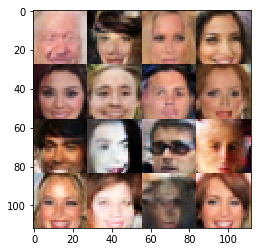

Epochs 21910/300000 Batch Step 2920/3166 gen_loss = -48.661773681640625..., disc_loss = -0.43235906958580017..., train using time = 10.233
Epochs 21920/300000 Batch Step 2930/3166 gen_loss = -48.63300323486328..., disc_loss = -0.4465448260307312..., train using time = 10.381
Epochs 21930/300000 Batch Step 2940/3166 gen_loss = -48.97506332397461..., disc_loss = -0.4284276068210602..., train using time = 11.398
Epochs 21940/300000 Batch Step 2950/3166 gen_loss = -49.38386535644531..., disc_loss = -0.3978502154350281..., train using time = 10.023
Epochs 21950/300000 Batch Step 2960/3166 gen_loss = -48.81116485595703..., disc_loss = -0.5164223909378052..., train using time = 9.096
Epochs 21960/300000 Batch Step 2970/3166 gen_loss = -49.162391662597656..., disc_loss = -0.37227582931518555..., train using time = 8.976
Epochs 21970/300000 Batch Step 2980/3166 gen_loss = -49.480812072753906..., disc_loss = -0.39361414313316345..., train using time = 12.070
Epochs 21980/300000 Batch Step 2990/3

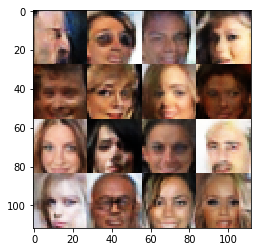

Epochs 22010/300000 Batch Step 3020/3166 gen_loss = -49.9548225402832..., disc_loss = -0.3688410818576813..., train using time = 9.157
Epochs 22020/300000 Batch Step 3030/3166 gen_loss = -50.19287109375..., disc_loss = -0.374582976102829..., train using time = 10.421
Epochs 22030/300000 Batch Step 3040/3166 gen_loss = -49.49378967285156..., disc_loss = -0.4396286904811859..., train using time = 9.966
Epochs 22040/300000 Batch Step 3050/3166 gen_loss = -50.26445007324219..., disc_loss = -0.39485400915145874..., train using time = 8.975
Epochs 22050/300000 Batch Step 3060/3166 gen_loss = -48.98041534423828..., disc_loss = -0.3996570110321045..., train using time = 10.753
Epochs 22060/300000 Batch Step 3070/3166 gen_loss = -48.62314224243164..., disc_loss = -0.4882238805294037..., train using time = 9.476
Epochs 22070/300000 Batch Step 3080/3166 gen_loss = -49.79376983642578..., disc_loss = -0.3889029920101166..., train using time = 10.348
Epochs 22080/300000 Batch Step 3090/3166 gen_loss

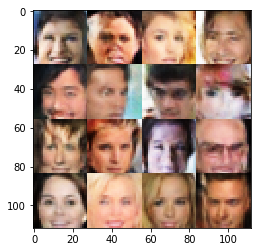

Epochs 22110/300000 Batch Step 3120/3166 gen_loss = -48.75288391113281..., disc_loss = -0.4274156987667084..., train using time = 11.969
Epochs 22120/300000 Batch Step 3130/3166 gen_loss = -49.74774932861328..., disc_loss = -0.3918117880821228..., train using time = 10.027
Epochs 22130/300000 Batch Step 3140/3166 gen_loss = -48.89312744140625..., disc_loss = -0.4009232521057129..., train using time = 9.082
Epochs 22140/300000 Batch Step 3150/3166 gen_loss = -50.140830993652344..., disc_loss = -0.5144635438919067..., train using time = 10.139
Epochs 22150/300000 Batch Step 3160/3166 gen_loss = -49.17203140258789..., disc_loss = -0.4653398394584656..., train using time = 9.166
Epochs 22160/300000 Batch Step 5/3166 gen_loss = -48.7552490234375..., disc_loss = -0.31145793199539185..., train using time = 9.725
Epochs 22170/300000 Batch Step 15/3166 gen_loss = -50.064605712890625..., disc_loss = -0.38570672273635864..., train using time = 10.619
Epochs 22180/300000 Batch Step 25/3166 gen_los

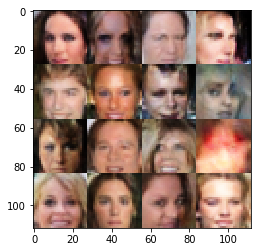

Epochs 22210/300000 Batch Step 55/3166 gen_loss = -49.52328109741211..., disc_loss = -0.45301422476768494..., train using time = 9.405
Epochs 22220/300000 Batch Step 65/3166 gen_loss = -49.468971252441406..., disc_loss = -0.32378071546554565..., train using time = 12.156
Epochs 22230/300000 Batch Step 75/3166 gen_loss = -50.089012145996094..., disc_loss = -0.47213953733444214..., train using time = 10.343
Epochs 22240/300000 Batch Step 85/3166 gen_loss = -49.452579498291016..., disc_loss = -0.4599836766719818..., train using time = 9.088
Epochs 22250/300000 Batch Step 95/3166 gen_loss = -49.38603210449219..., disc_loss = -0.4399494230747223..., train using time = 9.199
Epochs 22260/300000 Batch Step 105/3166 gen_loss = -49.16944122314453..., disc_loss = -0.4001569151878357..., train using time = 11.635
Epochs 22270/300000 Batch Step 115/3166 gen_loss = -49.902828216552734..., disc_loss = -0.3435167074203491..., train using time = 9.154
Epochs 22280/300000 Batch Step 125/3166 gen_loss =

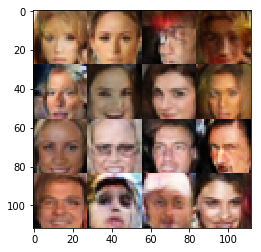

Epochs 22310/300000 Batch Step 155/3166 gen_loss = -50.670928955078125..., disc_loss = -0.38138455152511597..., train using time = 10.460
Epochs 22320/300000 Batch Step 165/3166 gen_loss = -50.65631866455078..., disc_loss = -0.37679314613342285..., train using time = 10.163
Epochs 22330/300000 Batch Step 175/3166 gen_loss = -50.57543182373047..., disc_loss = -0.4241090714931488..., train using time = 10.069
Epochs 22340/300000 Batch Step 185/3166 gen_loss = -51.083641052246094..., disc_loss = -0.293770968914032..., train using time = 10.212
Epochs 22350/300000 Batch Step 195/3166 gen_loss = -50.757659912109375..., disc_loss = -0.430117130279541..., train using time = 10.311
Epochs 22360/300000 Batch Step 205/3166 gen_loss = -50.32527160644531..., disc_loss = -0.36373409628868103..., train using time = 10.376
Epochs 22370/300000 Batch Step 215/3166 gen_loss = -49.67211151123047..., disc_loss = -0.3813997209072113..., train using time = 9.178
Epochs 22380/300000 Batch Step 225/3166 gen_l

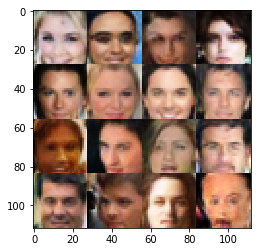

Epochs 22410/300000 Batch Step 255/3166 gen_loss = -50.225746154785156..., disc_loss = -0.3401029706001282..., train using time = 13.774
Epochs 22420/300000 Batch Step 265/3166 gen_loss = -51.35597229003906..., disc_loss = -0.3477028012275696..., train using time = 9.695
Epochs 22430/300000 Batch Step 275/3166 gen_loss = -50.912384033203125..., disc_loss = -0.4202790856361389..., train using time = 9.190
Epochs 22440/300000 Batch Step 285/3166 gen_loss = -51.54405212402344..., disc_loss = -0.415032297372818..., train using time = 10.236
Epochs 22450/300000 Batch Step 295/3166 gen_loss = -50.44841003417969..., disc_loss = -0.3407067656517029..., train using time = 9.187
Epochs 22460/300000 Batch Step 305/3166 gen_loss = -51.405296325683594..., disc_loss = -0.48350515961647034..., train using time = 11.188
Epochs 22470/300000 Batch Step 315/3166 gen_loss = -51.25270462036133..., disc_loss = -0.3261398673057556..., train using time = 10.136
Epochs 22480/300000 Batch Step 325/3166 gen_loss

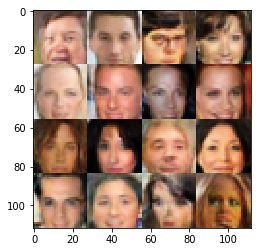

Epochs 22510/300000 Batch Step 355/3166 gen_loss = -51.22477722167969..., disc_loss = -0.3920254707336426..., train using time = 10.358
Epochs 22520/300000 Batch Step 365/3166 gen_loss = -51.445621490478516..., disc_loss = -0.3638228476047516..., train using time = 10.241
Epochs 22530/300000 Batch Step 375/3166 gen_loss = -51.76755142211914..., disc_loss = -0.5461209416389465..., train using time = 10.554
Epochs 22540/300000 Batch Step 385/3166 gen_loss = -51.95720672607422..., disc_loss = -0.4967748522758484..., train using time = 9.051
Epochs 22550/300000 Batch Step 395/3166 gen_loss = -51.42138671875..., disc_loss = -0.36168617010116577..., train using time = 9.142
Epochs 22560/300000 Batch Step 405/3166 gen_loss = -50.78845977783203..., disc_loss = -0.41544896364212036..., train using time = 12.157
Epochs 22570/300000 Batch Step 415/3166 gen_loss = -49.98894500732422..., disc_loss = -0.3727571368217468..., train using time = 9.101
Epochs 22580/300000 Batch Step 425/3166 gen_loss = 

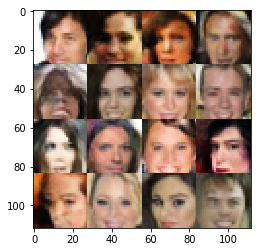

Epochs 22610/300000 Batch Step 455/3166 gen_loss = -51.3824348449707..., disc_loss = -0.4393705427646637..., train using time = 10.232
Epochs 22620/300000 Batch Step 465/3166 gen_loss = -51.17754364013672..., disc_loss = -0.4197835326194763..., train using time = 9.884
Epochs 22630/300000 Batch Step 475/3166 gen_loss = -51.87030792236328..., disc_loss = -0.44390854239463806..., train using time = 9.095
Epochs 22640/300000 Batch Step 485/3166 gen_loss = -50.64702224731445..., disc_loss = -0.41887006163597107..., train using time = 11.353
Epochs 22650/300000 Batch Step 495/3166 gen_loss = -51.639122009277344..., disc_loss = -0.3848339319229126..., train using time = 9.059
Epochs 22660/300000 Batch Step 505/3166 gen_loss = -51.71836853027344..., disc_loss = -0.43282485008239746..., train using time = 10.381
Epochs 22670/300000 Batch Step 515/3166 gen_loss = -51.01988983154297..., disc_loss = -0.3899862766265869..., train using time = 9.998
Epochs 22680/300000 Batch Step 525/3166 gen_loss 

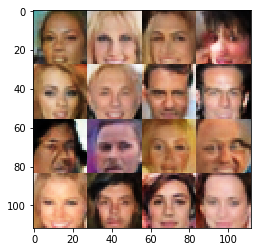

Epochs 22710/300000 Batch Step 555/3166 gen_loss = -51.035980224609375..., disc_loss = -0.392151415348053..., train using time = 10.800
Epochs 22720/300000 Batch Step 565/3166 gen_loss = -51.81262969970703..., disc_loss = -0.3776809275150299..., train using time = 9.135
Epochs 22730/300000 Batch Step 575/3166 gen_loss = -52.48863983154297..., disc_loss = -0.3427450656890869..., train using time = 10.165
Epochs 22740/300000 Batch Step 585/3166 gen_loss = -52.66969299316406..., disc_loss = -0.31906241178512573..., train using time = 9.507
Epochs 22750/300000 Batch Step 595/3166 gen_loss = -52.7059211730957..., disc_loss = -0.36785680055618286..., train using time = 9.011
Epochs 22760/300000 Batch Step 605/3166 gen_loss = -51.816200256347656..., disc_loss = -0.3330019414424896..., train using time = 10.646
Epochs 22770/300000 Batch Step 615/3166 gen_loss = -51.86671447753906..., disc_loss = -0.40373167395591736..., train using time = 9.545
Epochs 22780/300000 Batch Step 625/3166 gen_loss 

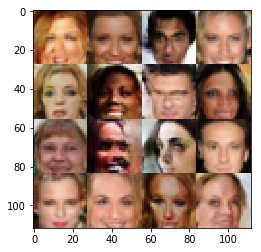

Epochs 22810/300000 Batch Step 655/3166 gen_loss = -53.21216583251953..., disc_loss = -0.48128360509872437..., train using time = 13.968
Epochs 22820/300000 Batch Step 665/3166 gen_loss = -52.377166748046875..., disc_loss = -0.37995070219039917..., train using time = 10.428
Epochs 22830/300000 Batch Step 675/3166 gen_loss = -52.20802307128906..., disc_loss = -0.3622244894504547..., train using time = 8.943
Epochs 22840/300000 Batch Step 685/3166 gen_loss = -51.40587615966797..., disc_loss = -0.20902912318706512..., train using time = 8.997
Epochs 22850/300000 Batch Step 695/3166 gen_loss = -53.601959228515625..., disc_loss = -0.3438364267349243..., train using time = 10.592
Epochs 22860/300000 Batch Step 705/3166 gen_loss = -52.56507873535156..., disc_loss = -0.43610477447509766..., train using time = 10.074
Epochs 22870/300000 Batch Step 715/3166 gen_loss = -53.38381576538086..., disc_loss = -0.34558606147766113..., train using time = 10.325
Epochs 22880/300000 Batch Step 725/3166 gen

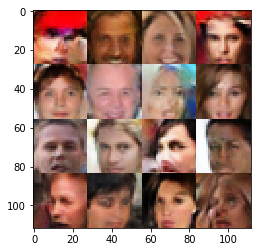

Epochs 22910/300000 Batch Step 755/3166 gen_loss = -52.8790168762207..., disc_loss = -0.38705915212631226..., train using time = 10.435
Epochs 22920/300000 Batch Step 765/3166 gen_loss = -52.011573791503906..., disc_loss = -0.2823611795902252..., train using time = 9.000
Epochs 22930/300000 Batch Step 775/3166 gen_loss = -52.62963104248047..., disc_loss = -0.4370609223842621..., train using time = 12.146
Epochs 22940/300000 Batch Step 785/3166 gen_loss = -52.81415939331055..., disc_loss = -0.37743061780929565..., train using time = 11.304
Epochs 22950/300000 Batch Step 795/3166 gen_loss = -53.69096374511719..., disc_loss = -0.31544679403305054..., train using time = 10.304
Epochs 22960/300000 Batch Step 805/3166 gen_loss = -53.14437484741211..., disc_loss = -0.3968633711338043..., train using time = 9.043
Epochs 22970/300000 Batch Step 815/3166 gen_loss = -52.28971862792969..., disc_loss = -0.44221535325050354..., train using time = 10.166
Epochs 22980/300000 Batch Step 825/3166 gen_lo

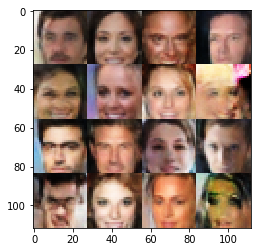

Epochs 23010/300000 Batch Step 855/3166 gen_loss = -52.67036056518555..., disc_loss = -0.4130071997642517..., train using time = 8.994
Epochs 23020/300000 Batch Step 865/3166 gen_loss = -53.24155807495117..., disc_loss = -0.4082410931587219..., train using time = 9.093
Epochs 23030/300000 Batch Step 875/3166 gen_loss = -51.811302185058594..., disc_loss = -0.2936387062072754..., train using time = 10.193
Epochs 23040/300000 Batch Step 885/3166 gen_loss = -52.8028678894043..., disc_loss = -0.34365543723106384..., train using time = 9.617
Epochs 23050/300000 Batch Step 895/3166 gen_loss = -52.46860885620117..., disc_loss = -0.41383782029151917..., train using time = 12.118
Epochs 23060/300000 Batch Step 905/3166 gen_loss = -52.56165313720703..., disc_loss = -0.44869810342788696..., train using time = 11.607
Epochs 23070/300000 Batch Step 915/3166 gen_loss = -52.89656066894531..., disc_loss = -0.533088207244873..., train using time = 9.114
Epochs 23080/300000 Batch Step 925/3166 gen_loss =

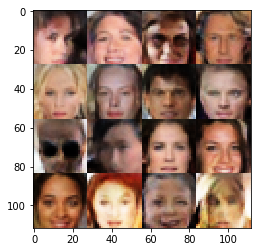

Epochs 23110/300000 Batch Step 955/3166 gen_loss = -52.30786895751953..., disc_loss = -0.4138939380645752..., train using time = 10.304
Epochs 23120/300000 Batch Step 965/3166 gen_loss = -52.785194396972656..., disc_loss = -0.27074122428894043..., train using time = 10.431
Epochs 23130/300000 Batch Step 975/3166 gen_loss = -52.31306457519531..., disc_loss = -0.41327065229415894..., train using time = 8.950
Epochs 23140/300000 Batch Step 985/3166 gen_loss = -52.32099914550781..., disc_loss = -0.260977566242218..., train using time = 9.150
Epochs 23150/300000 Batch Step 995/3166 gen_loss = -53.262969970703125..., disc_loss = -0.40534764528274536..., train using time = 13.273
Epochs 23160/300000 Batch Step 1005/3166 gen_loss = -53.56519317626953..., disc_loss = -0.42302951216697693..., train using time = 9.185
Epochs 23170/300000 Batch Step 1015/3166 gen_loss = -53.47654724121094..., disc_loss = -0.4705367088317871..., train using time = 10.391
Epochs 23180/300000 Batch Step 1025/3166 gen

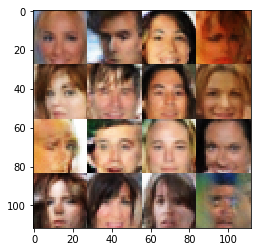

Epochs 23210/300000 Batch Step 1055/3166 gen_loss = -52.7887077331543..., disc_loss = -0.42779502272605896..., train using time = 9.580
Epochs 23220/300000 Batch Step 1065/3166 gen_loss = -53.47808837890625..., disc_loss = -0.4197796881198883..., train using time = 9.134
Epochs 23230/300000 Batch Step 1075/3166 gen_loss = -53.823699951171875..., disc_loss = -0.3027476966381073..., train using time = 10.649
Epochs 23240/300000 Batch Step 1085/3166 gen_loss = -53.18144226074219..., disc_loss = -0.41149377822875977..., train using time = 9.654
Epochs 23250/300000 Batch Step 1095/3166 gen_loss = -53.008522033691406..., disc_loss = -0.42430657148361206..., train using time = 10.335
Epochs 23260/300000 Batch Step 1105/3166 gen_loss = -53.46134948730469..., disc_loss = -0.39441603422164917..., train using time = 9.923
Epochs 23270/300000 Batch Step 1115/3166 gen_loss = -53.66819763183594..., disc_loss = -0.32804274559020996..., train using time = 9.267
Epochs 23280/300000 Batch Step 1125/3166

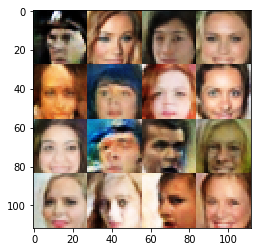

Epochs 23310/300000 Batch Step 1155/3166 gen_loss = -53.88642883300781..., disc_loss = -0.41017094254493713..., train using time = 9.094
Epochs 23320/300000 Batch Step 1165/3166 gen_loss = -53.69009017944336..., disc_loss = -0.2507392466068268..., train using time = 10.397
Epochs 23330/300000 Batch Step 1175/3166 gen_loss = -54.95750045776367..., disc_loss = -0.49716120958328247..., train using time = 9.352
Epochs 23340/300000 Batch Step 1185/3166 gen_loss = -53.9692497253418..., disc_loss = -0.4043087065219879..., train using time = 9.174
Epochs 23350/300000 Batch Step 1195/3166 gen_loss = -53.976192474365234..., disc_loss = -0.47119683027267456..., train using time = 11.333
Epochs 23360/300000 Batch Step 1205/3166 gen_loss = -53.779090881347656..., disc_loss = -0.39035114645957947..., train using time = 9.131
Epochs 23370/300000 Batch Step 1215/3166 gen_loss = -54.08277893066406..., disc_loss = -0.4189448356628418..., train using time = 9.070
Epochs 23380/300000 Batch Step 1225/3166 

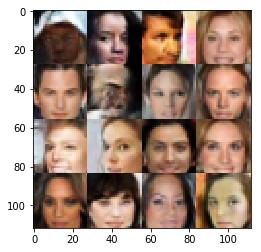

Epochs 23410/300000 Batch Step 1255/3166 gen_loss = -54.116641998291016..., disc_loss = -0.21818546950817108..., train using time = 11.340
Epochs 23420/300000 Batch Step 1265/3166 gen_loss = -55.33379364013672..., disc_loss = -0.323617160320282..., train using time = 9.155
Epochs 23430/300000 Batch Step 1275/3166 gen_loss = -54.07721710205078..., disc_loss = -0.31335362792015076..., train using time = 9.076
Epochs 23440/300000 Batch Step 1285/3166 gen_loss = -54.29425811767578..., disc_loss = -0.38526174426078796..., train using time = 12.136
Epochs 23450/300000 Batch Step 1295/3166 gen_loss = -53.54202651977539..., disc_loss = -0.4547653794288635..., train using time = 9.962
Epochs 23460/300000 Batch Step 1305/3166 gen_loss = -53.25289535522461..., disc_loss = -0.3832647502422333..., train using time = 11.396
Epochs 23470/300000 Batch Step 1315/3166 gen_loss = -53.97175216674805..., disc_loss = -0.37122923135757446..., train using time = 10.624
Epochs 23480/300000 Batch Step 1325/3166

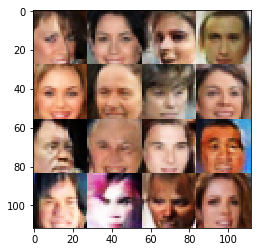

Epochs 23510/300000 Batch Step 1355/3166 gen_loss = -53.90620803833008..., disc_loss = -0.495504766702652..., train using time = 9.115
Epochs 23520/300000 Batch Step 1365/3166 gen_loss = -54.291587829589844..., disc_loss = -0.4362841546535492..., train using time = 10.408
Epochs 23530/300000 Batch Step 1375/3166 gen_loss = -53.873191833496094..., disc_loss = -0.5146255493164062..., train using time = 10.286
Epochs 23540/300000 Batch Step 1385/3166 gen_loss = -55.13542938232422..., disc_loss = -0.3097469210624695..., train using time = 10.548
Epochs 23550/300000 Batch Step 1395/3166 gen_loss = -55.52384948730469..., disc_loss = -0.417898952960968..., train using time = 9.152
Epochs 23560/300000 Batch Step 1405/3166 gen_loss = -53.667076110839844..., disc_loss = -0.2537601590156555..., train using time = 10.036
Epochs 23570/300000 Batch Step 1415/3166 gen_loss = -55.42961502075195..., disc_loss = -0.3604981601238251..., train using time = 9.144
Epochs 23580/300000 Batch Step 1425/3166 ge

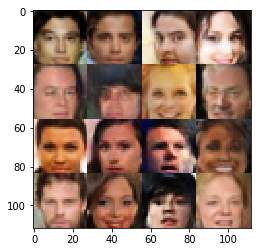

Epochs 23610/300000 Batch Step 1455/3166 gen_loss = -55.47370147705078..., disc_loss = -0.4171299934387207..., train using time = 9.003
Epochs 23620/300000 Batch Step 1465/3166 gen_loss = -54.970237731933594..., disc_loss = -0.32882434129714966..., train using time = 10.460
Epochs 23630/300000 Batch Step 1475/3166 gen_loss = -55.008056640625..., disc_loss = -0.4431857466697693..., train using time = 9.117
Epochs 23640/300000 Batch Step 1485/3166 gen_loss = -55.58137893676758..., disc_loss = -0.3872838020324707..., train using time = 11.270
Epochs 23650/300000 Batch Step 1495/3166 gen_loss = -54.79011535644531..., disc_loss = -0.42659181356430054..., train using time = 11.763
Epochs 23660/300000 Batch Step 1505/3166 gen_loss = -55.09154510498047..., disc_loss = -0.38007020950317383..., train using time = 8.969
Epochs 23670/300000 Batch Step 1515/3166 gen_loss = -55.47474670410156..., disc_loss = -0.3455633223056793..., train using time = 9.022
Epochs 23680/300000 Batch Step 1525/3166 ge

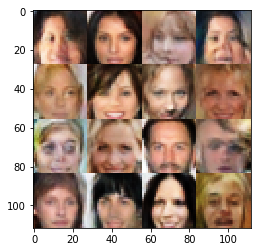

Epochs 23710/300000 Batch Step 1555/3166 gen_loss = -56.32275390625..., disc_loss = -0.36624595522880554..., train using time = 10.410
Epochs 23720/300000 Batch Step 1565/3166 gen_loss = -55.10740661621094..., disc_loss = -0.41618800163269043..., train using time = 9.035
Epochs 23730/300000 Batch Step 1575/3166 gen_loss = -55.53362274169922..., disc_loss = -0.30658456683158875..., train using time = 9.101
Epochs 23740/300000 Batch Step 1585/3166 gen_loss = -55.78355407714844..., disc_loss = -0.3700637221336365..., train using time = 12.248
Epochs 23750/300000 Batch Step 1595/3166 gen_loss = -54.716346740722656..., disc_loss = -0.35932818055152893..., train using time = 9.194
Epochs 23760/300000 Batch Step 1605/3166 gen_loss = -56.08844757080078..., disc_loss = -0.40258684754371643..., train using time = 10.267
Epochs 23770/300000 Batch Step 1615/3166 gen_loss = -55.77653503417969..., disc_loss = -0.3715910315513611..., train using time = 9.075
Epochs 23780/300000 Batch Step 1625/3166 g

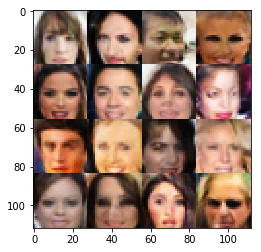

Epochs 23810/300000 Batch Step 1655/3166 gen_loss = -55.11481475830078..., disc_loss = -0.36141839623451233..., train using time = 9.238
Epochs 23820/300000 Batch Step 1665/3166 gen_loss = -55.60628128051758..., disc_loss = -0.3353782296180725..., train using time = 12.416
Epochs 23830/300000 Batch Step 1675/3166 gen_loss = -55.4522705078125..., disc_loss = -0.44937705993652344..., train using time = 9.168
Epochs 23840/300000 Batch Step 1685/3166 gen_loss = -56.03239440917969..., disc_loss = -0.415548712015152..., train using time = 11.622
Epochs 23850/300000 Batch Step 1695/3166 gen_loss = -54.502906799316406..., disc_loss = -0.25596028566360474..., train using time = 10.388
Epochs 23860/300000 Batch Step 1705/3166 gen_loss = -55.783729553222656..., disc_loss = -0.37570708990097046..., train using time = 9.285
Epochs 23870/300000 Batch Step 1715/3166 gen_loss = -56.056156158447266..., disc_loss = -0.3920375108718872..., train using time = 10.437
Epochs 23880/300000 Batch Step 1725/316

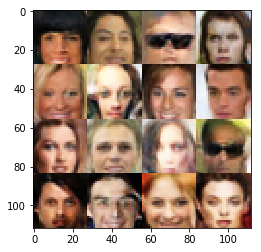

Epochs 23910/300000 Batch Step 1755/3166 gen_loss = -55.943763732910156..., disc_loss = -0.388672411441803..., train using time = 10.351
Epochs 23920/300000 Batch Step 1765/3166 gen_loss = -55.26652526855469..., disc_loss = -0.26661983132362366..., train using time = 9.044
Epochs 23930/300000 Batch Step 1775/3166 gen_loss = -56.49195861816406..., disc_loss = -0.28313708305358887..., train using time = 10.680
Epochs 23940/300000 Batch Step 1785/3166 gen_loss = -56.35065841674805..., disc_loss = -0.43322476744651794..., train using time = 10.395
Epochs 23950/300000 Batch Step 1795/3166 gen_loss = -55.54124069213867..., disc_loss = -0.4422122836112976..., train using time = 9.348
Epochs 23960/300000 Batch Step 1805/3166 gen_loss = -56.455482482910156..., disc_loss = -0.5465226173400879..., train using time = 9.060
Epochs 23970/300000 Batch Step 1815/3166 gen_loss = -55.86387252807617..., disc_loss = -0.3484457731246948..., train using time = 11.528
Epochs 23980/300000 Batch Step 1825/3166

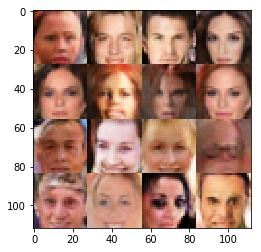

Epochs 24010/300000 Batch Step 1855/3166 gen_loss = -56.30778503417969..., disc_loss = -0.23192772269248962..., train using time = 9.540
Epochs 24020/300000 Batch Step 1865/3166 gen_loss = -55.88734436035156..., disc_loss = -0.43958908319473267..., train using time = 9.124
Epochs 24030/300000 Batch Step 1875/3166 gen_loss = -55.39030838012695..., disc_loss = -0.4479336738586426..., train using time = 13.692
Epochs 24040/300000 Batch Step 1885/3166 gen_loss = -56.269683837890625..., disc_loss = -0.4846789836883545..., train using time = 9.158
Epochs 24050/300000 Batch Step 1895/3166 gen_loss = -56.13083267211914..., disc_loss = -0.3516513705253601..., train using time = 10.285
Epochs 24060/300000 Batch Step 1905/3166 gen_loss = -56.16572570800781..., disc_loss = -0.4638371467590332..., train using time = 10.112
Epochs 24070/300000 Batch Step 1915/3166 gen_loss = -56.37518310546875..., disc_loss = -0.3356921672821045..., train using time = 9.561
Epochs 24080/300000 Batch Step 1925/3166 g

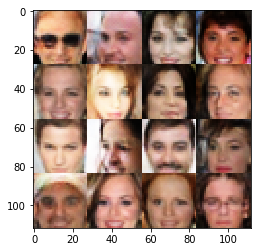

Epochs 24110/300000 Batch Step 1955/3166 gen_loss = -56.28285598754883..., disc_loss = -0.4788178503513336..., train using time = 10.268
Epochs 24120/300000 Batch Step 1965/3166 gen_loss = -55.80293273925781..., disc_loss = -0.4078538417816162..., train using time = 10.282
Epochs 24130/300000 Batch Step 1975/3166 gen_loss = -56.784915924072266..., disc_loss = -0.3753070831298828..., train using time = 10.607
Epochs 24140/300000 Batch Step 1985/3166 gen_loss = -56.59764099121094..., disc_loss = -0.24776002764701843..., train using time = 9.063
Epochs 24150/300000 Batch Step 1995/3166 gen_loss = -56.204978942871094..., disc_loss = -0.3980686664581299..., train using time = 10.185
Epochs 24160/300000 Batch Step 2005/3166 gen_loss = -56.42981719970703..., disc_loss = -0.44038277864456177..., train using time = 9.084
Epochs 24170/300000 Batch Step 2015/3166 gen_loss = -57.144287109375..., disc_loss = -0.40782755613327026..., train using time = 10.206
Epochs 24180/300000 Batch Step 2025/3166

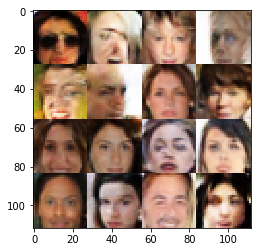

Epochs 24210/300000 Batch Step 2055/3166 gen_loss = -56.68572235107422..., disc_loss = -0.27036136388778687..., train using time = 10.342
Epochs 24220/300000 Batch Step 2065/3166 gen_loss = -55.776729583740234..., disc_loss = -0.19356794655323029..., train using time = 9.068
Epochs 24230/300000 Batch Step 2075/3166 gen_loss = -57.12848663330078..., disc_loss = -0.433576762676239..., train using time = 11.846
Epochs 24240/300000 Batch Step 2085/3166 gen_loss = -56.617431640625..., disc_loss = -0.29324114322662354..., train using time = 10.221
Epochs 24250/300000 Batch Step 2095/3166 gen_loss = -56.39093017578125..., disc_loss = -0.21893508732318878..., train using time = 9.123
Epochs 24260/300000 Batch Step 2105/3166 gen_loss = -56.53989791870117..., disc_loss = -0.31185728311538696..., train using time = 8.895
Epochs 24270/300000 Batch Step 2115/3166 gen_loss = -56.523193359375..., disc_loss = -0.3590235710144043..., train using time = 10.077
Epochs 24280/300000 Batch Step 2125/3166 ge

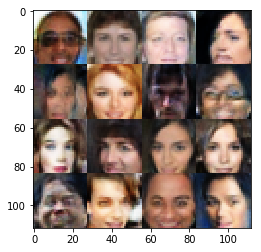

Epochs 24310/300000 Batch Step 2155/3166 gen_loss = -57.31590270996094..., disc_loss = -0.4658421576023102..., train using time = 9.327
Epochs 24320/300000 Batch Step 2165/3166 gen_loss = -57.10718536376953..., disc_loss = -0.38013941049575806..., train using time = 9.022
Epochs 24330/300000 Batch Step 2175/3166 gen_loss = -57.42424774169922..., disc_loss = -0.3818000853061676..., train using time = 10.592
Epochs 24340/300000 Batch Step 2185/3166 gen_loss = -57.449222564697266..., disc_loss = -0.24709010124206543..., train using time = 9.360
Epochs 24350/300000 Batch Step 2195/3166 gen_loss = -57.191524505615234..., disc_loss = -0.4210570752620697..., train using time = 11.114
Epochs 24360/300000 Batch Step 2205/3166 gen_loss = -57.041561126708984..., disc_loss = -0.379546195268631..., train using time = 10.301
Epochs 24370/300000 Batch Step 2215/3166 gen_loss = -56.96408462524414..., disc_loss = -0.4251699447631836..., train using time = 9.136
Epochs 24380/300000 Batch Step 2225/3166 

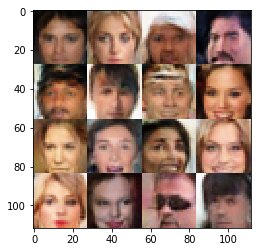

Epochs 24410/300000 Batch Step 2255/3166 gen_loss = -57.84689712524414..., disc_loss = -0.31677722930908203..., train using time = 10.561
Epochs 24420/300000 Batch Step 2265/3166 gen_loss = -56.782508850097656..., disc_loss = -0.262198805809021..., train using time = 9.576
Epochs 24430/300000 Batch Step 2275/3166 gen_loss = -57.848506927490234..., disc_loss = -0.3718109130859375..., train using time = 10.463
Epochs 24440/300000 Batch Step 2285/3166 gen_loss = -58.087791442871094..., disc_loss = -0.3718472719192505..., train using time = 10.327
Epochs 24450/300000 Batch Step 2295/3166 gen_loss = -58.6523551940918..., disc_loss = -0.33218497037887573..., train using time = 8.980
Epochs 24460/300000 Batch Step 2305/3166 gen_loss = -58.0178337097168..., disc_loss = -0.38416147232055664..., train using time = 10.080
Epochs 24470/300000 Batch Step 2315/3166 gen_loss = -58.17121124267578..., disc_loss = -0.3674631118774414..., train using time = 11.312
Epochs 24480/300000 Batch Step 2325/3166

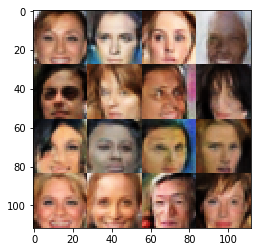

Epochs 24510/300000 Batch Step 2355/3166 gen_loss = -57.331825256347656..., disc_loss = -0.38457489013671875..., train using time = 8.999
Epochs 24520/300000 Batch Step 2365/3166 gen_loss = -57.285186767578125..., disc_loss = -0.2757212519645691..., train using time = 12.291
Epochs 24530/300000 Batch Step 2375/3166 gen_loss = -57.9170036315918..., disc_loss = -0.3690195381641388..., train using time = 10.244
Epochs 24540/300000 Batch Step 2385/3166 gen_loss = -57.895347595214844..., disc_loss = -0.45680850744247437..., train using time = 9.105
Epochs 24550/300000 Batch Step 2395/3166 gen_loss = -58.31250762939453..., disc_loss = -0.37680384516716003..., train using time = 8.961
Epochs 24560/300000 Batch Step 2405/3166 gen_loss = -59.176727294921875..., disc_loss = -0.281437486410141..., train using time = 10.359
Epochs 24570/300000 Batch Step 2415/3166 gen_loss = -58.67843246459961..., disc_loss = -0.29266563057899475..., train using time = 10.951
Epochs 24580/300000 Batch Step 2425/31

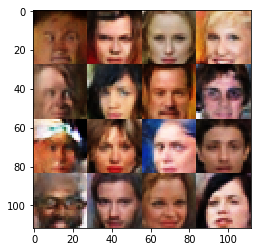

Epochs 24610/300000 Batch Step 2455/3166 gen_loss = -57.51372528076172..., disc_loss = -0.2666974365711212..., train using time = 9.120
Epochs 24620/300000 Batch Step 2465/3166 gen_loss = -57.23590087890625..., disc_loss = -0.29744139313697815..., train using time = 13.119
Epochs 24630/300000 Batch Step 2475/3166 gen_loss = -58.81939697265625..., disc_loss = -0.40909749269485474..., train using time = 9.090
Epochs 24640/300000 Batch Step 2485/3166 gen_loss = -57.96913146972656..., disc_loss = -0.2747531235218048..., train using time = 10.101
Epochs 24650/300000 Batch Step 2495/3166 gen_loss = -58.690521240234375..., disc_loss = -0.4155459403991699..., train using time = 10.246
Epochs 24660/300000 Batch Step 2505/3166 gen_loss = -58.33068084716797..., disc_loss = -0.46964341402053833..., train using time = 9.733
Epochs 24670/300000 Batch Step 2515/3166 gen_loss = -58.300838470458984..., disc_loss = -0.3795846104621887..., train using time = 10.489
Epochs 24680/300000 Batch Step 2525/316

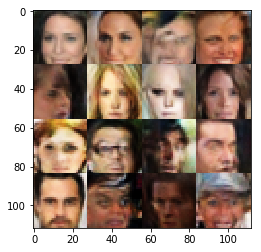

Epochs 24710/300000 Batch Step 2555/3166 gen_loss = -59.43141174316406..., disc_loss = -0.3756585419178009..., train using time = 10.391
Epochs 24720/300000 Batch Step 2565/3166 gen_loss = -58.40645217895508..., disc_loss = -0.4470999836921692..., train using time = 10.175
Epochs 24730/300000 Batch Step 2575/3166 gen_loss = -58.510704040527344..., disc_loss = -0.3860854506492615..., train using time = 8.998
Epochs 24740/300000 Batch Step 2585/3166 gen_loss = -58.07521057128906..., disc_loss = -0.42523232102394104..., train using time = 10.107
Epochs 24750/300000 Batch Step 2595/3166 gen_loss = -59.42338562011719..., disc_loss = -0.47102099657058716..., train using time = 9.239
Epochs 24760/300000 Batch Step 2605/3166 gen_loss = -58.7803955078125..., disc_loss = -0.3341220021247864..., train using time = 10.181
Epochs 24770/300000 Batch Step 2615/3166 gen_loss = -59.27606964111328..., disc_loss = -0.3862379193305969..., train using time = 12.126
Epochs 24780/300000 Batch Step 2625/3166 

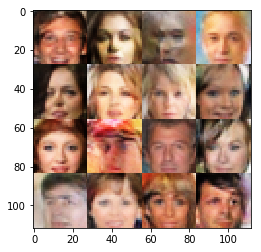

Epochs 24810/300000 Batch Step 2655/3166 gen_loss = -58.230979919433594..., disc_loss = -0.3621201515197754..., train using time = 8.984
Epochs 24820/300000 Batch Step 2665/3166 gen_loss = -57.78809356689453..., disc_loss = -0.2838967442512512..., train using time = 11.610
Epochs 24830/300000 Batch Step 2675/3166 gen_loss = -59.16646194458008..., disc_loss = -0.37458908557891846..., train using time = 9.202
Epochs 24840/300000 Batch Step 2685/3166 gen_loss = -58.70716857910156..., disc_loss = -0.4120887815952301..., train using time = 9.113
Epochs 24850/300000 Batch Step 2695/3166 gen_loss = -59.93312072753906..., disc_loss = -0.308275043964386..., train using time = 9.022
Epochs 24860/300000 Batch Step 2705/3166 gen_loss = -58.24995040893555..., disc_loss = -0.3461174964904785..., train using time = 10.298
Epochs 24870/300000 Batch Step 2715/3166 gen_loss = -58.87208557128906..., disc_loss = -0.40960437059402466..., train using time = 10.655
Epochs 24880/300000 Batch Step 2725/3166 ge

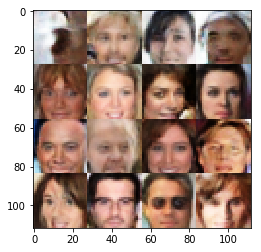

Epochs 24910/300000 Batch Step 2755/3166 gen_loss = -59.455039978027344..., disc_loss = -0.451998770236969..., train using time = 9.062
Epochs 24920/300000 Batch Step 2765/3166 gen_loss = -59.83599853515625..., disc_loss = -0.5214014053344727..., train using time = 9.864
Epochs 24930/300000 Batch Step 2775/3166 gen_loss = -59.32099151611328..., disc_loss = -0.3926800787448883..., train using time = 9.960
Epochs 24940/300000 Batch Step 2785/3166 gen_loss = -59.78020477294922..., disc_loss = -0.29773080348968506..., train using time = 13.367
Epochs 24950/300000 Batch Step 2795/3166 gen_loss = -59.74583435058594..., disc_loss = -0.42780429124832153..., train using time = 9.177
Epochs 24960/300000 Batch Step 2805/3166 gen_loss = -59.06770324707031..., disc_loss = -0.29841944575309753..., train using time = 9.023
Epochs 24970/300000 Batch Step 2815/3166 gen_loss = -59.69231414794922..., disc_loss = -0.4561651349067688..., train using time = 13.407
Epochs 24980/300000 Batch Step 2825/3166 ge

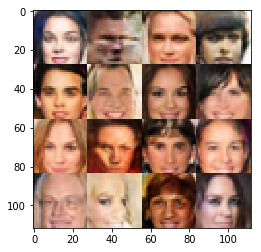

Epochs 25010/300000 Batch Step 2855/3166 gen_loss = -59.10846710205078..., disc_loss = -0.4276936650276184..., train using time = 9.654
Epochs 25020/300000 Batch Step 2865/3166 gen_loss = -59.31403350830078..., disc_loss = -0.42716366052627563..., train using time = 9.712
Epochs 25030/300000 Batch Step 2875/3166 gen_loss = -59.504661560058594..., disc_loss = -0.3942408561706543..., train using time = 10.348
Epochs 25040/300000 Batch Step 2885/3166 gen_loss = -59.68750762939453..., disc_loss = -0.37224406003952026..., train using time = 9.647
Epochs 25050/300000 Batch Step 2895/3166 gen_loss = -59.37718963623047..., disc_loss = -0.4279041886329651..., train using time = 9.975
Epochs 25060/300000 Batch Step 2905/3166 gen_loss = -59.28659439086914..., disc_loss = -0.2815002202987671..., train using time = 11.250
Epochs 25070/300000 Batch Step 2915/3166 gen_loss = -59.37736129760742..., disc_loss = -0.3505076766014099..., train using time = 9.259
Epochs 25080/300000 Batch Step 2925/3166 ge

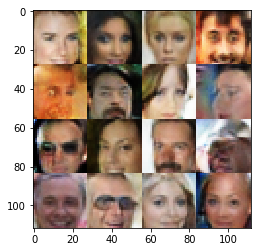

Epochs 25110/300000 Batch Step 2955/3166 gen_loss = -59.68716812133789..., disc_loss = -0.38611921668052673..., train using time = 12.222
Epochs 25120/300000 Batch Step 2965/3166 gen_loss = -59.93009948730469..., disc_loss = -0.3232644498348236..., train using time = 12.126
Epochs 25130/300000 Batch Step 2975/3166 gen_loss = -60.32229232788086..., disc_loss = -0.2783634066581726..., train using time = 9.160
Epochs 25140/300000 Batch Step 2985/3166 gen_loss = -59.80078887939453..., disc_loss = -0.311826229095459..., train using time = 9.683
Epochs 25150/300000 Batch Step 2995/3166 gen_loss = -59.28023147583008..., disc_loss = -0.2916794717311859..., train using time = 10.298
Epochs 25160/300000 Batch Step 3005/3166 gen_loss = -59.172508239746094..., disc_loss = -0.34735018014907837..., train using time = 10.425
Epochs 25170/300000 Batch Step 3015/3166 gen_loss = -59.741424560546875..., disc_loss = -0.4497848451137543..., train using time = 11.512
Epochs 25180/300000 Batch Step 3025/3166

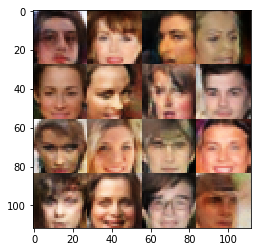

Epochs 25210/300000 Batch Step 3055/3166 gen_loss = -59.322784423828125..., disc_loss = -0.4695656895637512..., train using time = 12.259
Epochs 25220/300000 Batch Step 3065/3166 gen_loss = -60.91633224487305..., disc_loss = -0.25287312269210815..., train using time = 9.159
Epochs 25230/300000 Batch Step 3075/3166 gen_loss = -60.30546569824219..., disc_loss = -0.35080650448799133..., train using time = 11.715
Epochs 25240/300000 Batch Step 3085/3166 gen_loss = -60.50724411010742..., disc_loss = -0.32349371910095215..., train using time = 10.254
Epochs 25250/300000 Batch Step 3095/3166 gen_loss = -59.190879821777344..., disc_loss = -0.26852670311927795..., train using time = 9.192
Epochs 25260/300000 Batch Step 3105/3166 gen_loss = -59.44733428955078..., disc_loss = -0.39036932587623596..., train using time = 11.386
Epochs 25270/300000 Batch Step 3115/3166 gen_loss = -61.25933074951172..., disc_loss = -0.2329348623752594..., train using time = 10.603
Epochs 25280/300000 Batch Step 3125/

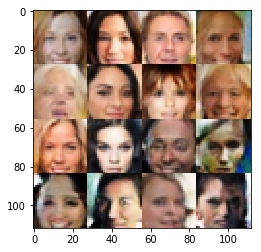

Epochs 25310/300000 Batch Step 3155/3166 gen_loss = -60.24353790283203..., disc_loss = -0.32507145404815674..., train using time = 10.254
Epochs 25320/300000 Batch Step 3165/3166 gen_loss = -59.780391693115234..., disc_loss = -0.4196421504020691..., train using time = 9.115
Epochs 25330/300000 Batch Step 10/3166 gen_loss = -59.7823486328125..., disc_loss = -0.3877717852592468..., train using time = 10.444
Epochs 25340/300000 Batch Step 20/3166 gen_loss = -59.51853561401367..., disc_loss = -0.35321199893951416..., train using time = 9.057
Epochs 25350/300000 Batch Step 30/3166 gen_loss = -59.35378646850586..., disc_loss = -0.3896012604236603..., train using time = 11.331
Epochs 25360/300000 Batch Step 40/3166 gen_loss = -60.37359619140625..., disc_loss = -0.3412814438343048..., train using time = 12.128
Epochs 25370/300000 Batch Step 50/3166 gen_loss = -59.91438293457031..., disc_loss = -0.4297543168067932..., train using time = 9.261
Epochs 25380/300000 Batch Step 60/3166 gen_loss = -5

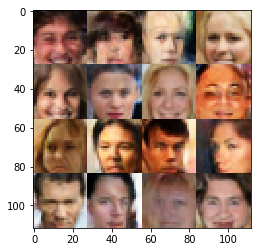

Epochs 25410/300000 Batch Step 90/3166 gen_loss = -59.2429313659668..., disc_loss = -0.42129606008529663..., train using time = 13.794
Epochs 25420/300000 Batch Step 100/3166 gen_loss = -59.79872131347656..., disc_loss = -0.558753490447998..., train using time = 10.273
Epochs 25430/300000 Batch Step 110/3166 gen_loss = -60.90913009643555..., disc_loss = -0.2971436679363251..., train using time = 9.175
Epochs 25440/300000 Batch Step 120/3166 gen_loss = -60.200130462646484..., disc_loss = -0.4154353141784668..., train using time = 9.101
Epochs 25450/300000 Batch Step 130/3166 gen_loss = -60.161102294921875..., disc_loss = -0.35912472009658813..., train using time = 11.164
Epochs 25460/300000 Batch Step 140/3166 gen_loss = -60.93895721435547..., disc_loss = -0.29630860686302185..., train using time = 10.632
Epochs 25470/300000 Batch Step 150/3166 gen_loss = -59.74159622192383..., disc_loss = -0.4091242253780365..., train using time = 10.999
Epochs 25480/300000 Batch Step 160/3166 gen_loss

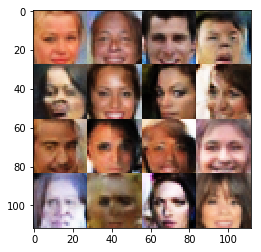

Epochs 25510/300000 Batch Step 190/3166 gen_loss = -61.45600128173828..., disc_loss = -0.29713383316993713..., train using time = 9.749
Epochs 25520/300000 Batch Step 200/3166 gen_loss = -60.33542251586914..., disc_loss = -0.35988447070121765..., train using time = 10.325
Epochs 25530/300000 Batch Step 210/3166 gen_loss = -61.41720199584961..., disc_loss = -0.37416505813598633..., train using time = 10.284
Epochs 25540/300000 Batch Step 220/3166 gen_loss = -60.648529052734375..., disc_loss = -0.2826773226261139..., train using time = 10.068
Epochs 25550/300000 Batch Step 230/3166 gen_loss = -61.3544921875..., disc_loss = -0.29533979296684265..., train using time = 9.460
Epochs 25560/300000 Batch Step 240/3166 gen_loss = -60.6114387512207..., disc_loss = -0.3386741876602173..., train using time = 10.227
Epochs 25570/300000 Batch Step 250/3166 gen_loss = -60.74230194091797..., disc_loss = -0.26401156187057495..., train using time = 9.338
Epochs 25580/300000 Batch Step 260/3166 gen_loss =

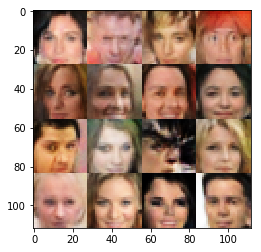

Epochs 25610/300000 Batch Step 290/3166 gen_loss = -60.93964767456055..., disc_loss = -0.4774875044822693..., train using time = 9.871
Epochs 25620/300000 Batch Step 300/3166 gen_loss = -61.13125991821289..., disc_loss = -0.3465765118598938..., train using time = 10.314
Epochs 25630/300000 Batch Step 310/3166 gen_loss = -61.60017776489258..., disc_loss = -0.3149983882904053..., train using time = 9.358
Epochs 25640/300000 Batch Step 320/3166 gen_loss = -61.05475616455078..., disc_loss = -0.4028759002685547..., train using time = 10.294
Epochs 25650/300000 Batch Step 330/3166 gen_loss = -61.439697265625..., disc_loss = -0.32305964827537537..., train using time = 12.425
Epochs 25660/300000 Batch Step 340/3166 gen_loss = -60.33791732788086..., disc_loss = -0.2984163761138916..., train using time = 9.019
Epochs 25670/300000 Batch Step 350/3166 gen_loss = -61.258056640625..., disc_loss = -0.36654818058013916..., train using time = 9.150
Epochs 25680/300000 Batch Step 360/3166 gen_loss = -60

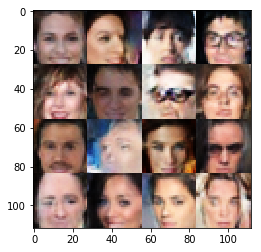

Epochs 25710/300000 Batch Step 390/3166 gen_loss = -60.76856994628906..., disc_loss = -0.45904913544654846..., train using time = 10.267
Epochs 25720/300000 Batch Step 400/3166 gen_loss = -61.521419525146484..., disc_loss = -0.2887020409107208..., train using time = 9.013
Epochs 25730/300000 Batch Step 410/3166 gen_loss = -61.148460388183594..., disc_loss = -0.39299559593200684..., train using time = 9.054
Epochs 25740/300000 Batch Step 420/3166 gen_loss = -60.87624740600586..., disc_loss = -0.334230899810791..., train using time = 10.712
Epochs 25750/300000 Batch Step 430/3166 gen_loss = -61.552391052246094..., disc_loss = -0.4411860406398773..., train using time = 10.627
Epochs 25760/300000 Batch Step 440/3166 gen_loss = -61.00490188598633..., disc_loss = -0.3225567936897278..., train using time = 10.275
Epochs 25770/300000 Batch Step 450/3166 gen_loss = -61.543704986572266..., disc_loss = -0.3750040829181671..., train using time = 10.193
Epochs 25780/300000 Batch Step 460/3166 gen_l

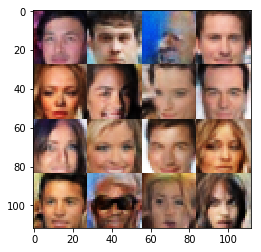

Epochs 25810/300000 Batch Step 490/3166 gen_loss = -61.33256912231445..., disc_loss = -0.3888673782348633..., train using time = 9.210
Epochs 25820/300000 Batch Step 500/3166 gen_loss = -62.200843811035156..., disc_loss = -0.33668792247772217..., train using time = 10.210
Epochs 25830/300000 Batch Step 510/3166 gen_loss = -60.85964584350586..., disc_loss = -0.41777390241622925..., train using time = 10.201
Epochs 25840/300000 Batch Step 520/3166 gen_loss = -61.867271423339844..., disc_loss = -0.3489084839820862..., train using time = 9.029
Epochs 25850/300000 Batch Step 530/3166 gen_loss = -61.67900848388672..., disc_loss = -0.32027536630630493..., train using time = 10.395
Epochs 25860/300000 Batch Step 540/3166 gen_loss = -61.071746826171875..., disc_loss = -0.3723384737968445..., train using time = 10.320
Epochs 25870/300000 Batch Step 550/3166 gen_loss = -62.002559661865234..., disc_loss = -0.3200734257698059..., train using time = 10.595
Epochs 25880/300000 Batch Step 560/3166 gen

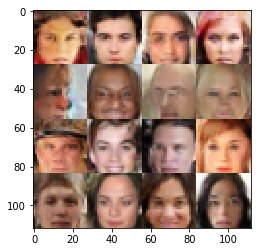

Epochs 25910/300000 Batch Step 590/3166 gen_loss = -61.60054016113281..., disc_loss = -0.40374183654785156..., train using time = 9.360
Epochs 25920/300000 Batch Step 600/3166 gen_loss = -62.05624771118164..., disc_loss = -0.33753538131713867..., train using time = 9.286
Epochs 25930/300000 Batch Step 610/3166 gen_loss = -60.987281799316406..., disc_loss = -0.3165285885334015..., train using time = 9.179
Epochs 25940/300000 Batch Step 620/3166 gen_loss = -61.79436492919922..., disc_loss = -0.4353068470954895..., train using time = 13.335
Epochs 25950/300000 Batch Step 630/3166 gen_loss = -61.74004364013672..., disc_loss = -0.3196418881416321..., train using time = 9.418
Epochs 25960/300000 Batch Step 640/3166 gen_loss = -62.63836669921875..., disc_loss = -0.24863176047801971..., train using time = 9.083
Epochs 25970/300000 Batch Step 650/3166 gen_loss = -62.06529235839844..., disc_loss = -0.4581044614315033..., train using time = 10.278
Epochs 25980/300000 Batch Step 660/3166 gen_loss 

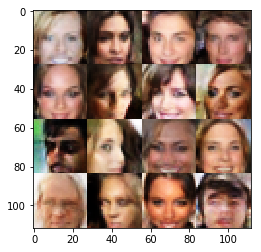

Epochs 26010/300000 Batch Step 690/3166 gen_loss = -61.685882568359375..., disc_loss = -0.4181506633758545..., train using time = 9.120
Epochs 26020/300000 Batch Step 700/3166 gen_loss = -61.757835388183594..., disc_loss = -0.3144761025905609..., train using time = 8.948
Epochs 26030/300000 Batch Step 710/3166 gen_loss = -61.80146408081055..., disc_loss = -0.24662455916404724..., train using time = 10.390
Epochs 26040/300000 Batch Step 720/3166 gen_loss = -62.92120361328125..., disc_loss = -0.22201547026634216..., train using time = 9.149
Epochs 26050/300000 Batch Step 730/3166 gen_loss = -62.334747314453125..., disc_loss = -0.38752299547195435..., train using time = 10.969
Epochs 26060/300000 Batch Step 740/3166 gen_loss = -62.382423400878906..., disc_loss = -0.41839876770973206..., train using time = 10.420
Epochs 26070/300000 Batch Step 750/3166 gen_loss = -61.6065559387207..., disc_loss = -0.41428080201148987..., train using time = 9.274
Epochs 26080/300000 Batch Step 760/3166 gen_

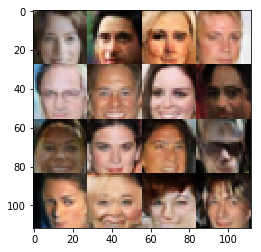

Epochs 26110/300000 Batch Step 790/3166 gen_loss = -62.292457580566406..., disc_loss = -0.39396363496780396..., train using time = 12.015
Epochs 26120/300000 Batch Step 800/3166 gen_loss = -61.228004455566406..., disc_loss = -0.32810819149017334..., train using time = 10.589
Epochs 26130/300000 Batch Step 810/3166 gen_loss = -62.68627166748047..., disc_loss = -0.3204866051673889..., train using time = 9.537
Epochs 26140/300000 Batch Step 820/3166 gen_loss = -62.86234664916992..., disc_loss = -0.33493152260780334..., train using time = 10.324
Epochs 26150/300000 Batch Step 830/3166 gen_loss = -62.6424560546875..., disc_loss = -0.3719543516635895..., train using time = 10.699
Epochs 26160/300000 Batch Step 840/3166 gen_loss = -62.32313537597656..., disc_loss = -0.3831358551979065..., train using time = 9.172
Epochs 26170/300000 Batch Step 850/3166 gen_loss = -62.63740539550781..., disc_loss = -0.410472571849823..., train using time = 10.319
Epochs 26180/300000 Batch Step 860/3166 gen_los

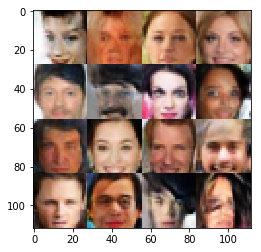

Epochs 26210/300000 Batch Step 890/3166 gen_loss = -61.55021667480469..., disc_loss = -0.3978521227836609..., train using time = 10.184
Epochs 26220/300000 Batch Step 900/3166 gen_loss = -61.25908279418945..., disc_loss = -0.30092406272888184..., train using time = 9.253
Epochs 26230/300000 Batch Step 910/3166 gen_loss = -62.554931640625..., disc_loss = -0.2833424508571625..., train using time = 10.178
Epochs 26240/300000 Batch Step 920/3166 gen_loss = -63.37400817871094..., disc_loss = -0.3900074362754822..., train using time = 13.242
Epochs 26250/300000 Batch Step 930/3166 gen_loss = -63.344696044921875..., disc_loss = -0.4099894165992737..., train using time = 9.044
Epochs 26260/300000 Batch Step 940/3166 gen_loss = -63.01953125..., disc_loss = -0.3397044539451599..., train using time = 9.098
Epochs 26270/300000 Batch Step 950/3166 gen_loss = -62.32573699951172..., disc_loss = -0.29717087745666504..., train using time = 10.943
Epochs 26280/300000 Batch Step 960/3166 gen_loss = -62.5

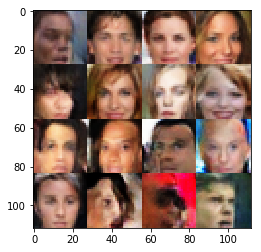

Epochs 26310/300000 Batch Step 990/3166 gen_loss = -62.87071228027344..., disc_loss = -0.3780699670314789..., train using time = 8.959
Epochs 26320/300000 Batch Step 1000/3166 gen_loss = -62.07524490356445..., disc_loss = -0.4511677622795105..., train using time = 9.083
Epochs 26330/300000 Batch Step 1010/3166 gen_loss = -62.73223114013672..., disc_loss = -0.3809928297996521..., train using time = 10.299
Epochs 26340/300000 Batch Step 1020/3166 gen_loss = -63.16535949707031..., disc_loss = -0.29281359910964966..., train using time = 10.823
Epochs 26350/300000 Batch Step 1030/3166 gen_loss = -62.91952896118164..., disc_loss = -0.4790891110897064..., train using time = 10.135
Epochs 26360/300000 Batch Step 1040/3166 gen_loss = -63.136756896972656..., disc_loss = -0.3322977125644684..., train using time = 11.838
Epochs 26370/300000 Batch Step 1050/3166 gen_loss = -62.94871139526367..., disc_loss = -0.2632978558540344..., train using time = 9.058
Epochs 26380/300000 Batch Step 1060/3166 ge

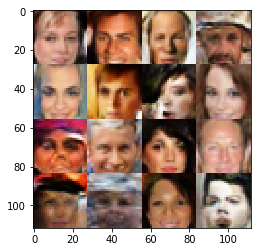

Epochs 26410/300000 Batch Step 1090/3166 gen_loss = -63.441131591796875..., disc_loss = -0.33786940574645996..., train using time = 10.438
Epochs 26420/300000 Batch Step 1100/3166 gen_loss = -62.27621841430664..., disc_loss = -0.23853106796741486..., train using time = 9.633
Epochs 26430/300000 Batch Step 1110/3166 gen_loss = -62.874168395996094..., disc_loss = -0.41641396284103394..., train using time = 9.730
Epochs 26440/300000 Batch Step 1120/3166 gen_loss = -62.32170104980469..., disc_loss = -0.43239766359329224..., train using time = 10.226
Epochs 26450/300000 Batch Step 1130/3166 gen_loss = -64.09455108642578..., disc_loss = -0.2819302976131439..., train using time = 9.300
Epochs 26460/300000 Batch Step 1140/3166 gen_loss = -63.522674560546875..., disc_loss = -0.4352089762687683..., train using time = 9.264
Epochs 26470/300000 Batch Step 1150/3166 gen_loss = -64.44231414794922..., disc_loss = -0.3143290579319..., train using time = 10.677
Epochs 26480/300000 Batch Step 1160/3166 

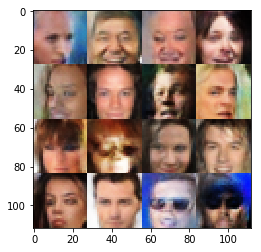

Epochs 26510/300000 Batch Step 1190/3166 gen_loss = -64.1211166381836..., disc_loss = -0.3695993423461914..., train using time = 9.123
Epochs 26520/300000 Batch Step 1200/3166 gen_loss = -63.61927795410156..., disc_loss = -0.3693350553512573..., train using time = 10.392
Epochs 26530/300000 Batch Step 1210/3166 gen_loss = -63.19951629638672..., disc_loss = -0.43655475974082947..., train using time = 11.621
Epochs 26540/300000 Batch Step 1220/3166 gen_loss = -63.27220916748047..., disc_loss = -0.24566450715065002..., train using time = 9.316
Epochs 26550/300000 Batch Step 1230/3166 gen_loss = -63.52372360229492..., disc_loss = -0.418487012386322..., train using time = 9.012
Epochs 26560/300000 Batch Step 1240/3166 gen_loss = -62.98177719116211..., disc_loss = -0.3896086812019348..., train using time = 10.306
Epochs 26570/300000 Batch Step 1250/3166 gen_loss = -63.995880126953125..., disc_loss = -0.332624614238739..., train using time = 9.137
Epochs 26580/300000 Batch Step 1260/3166 gen_

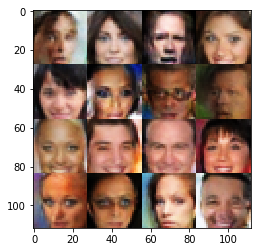

Epochs 26610/300000 Batch Step 1290/3166 gen_loss = -64.09686279296875..., disc_loss = -0.4143642485141754..., train using time = 9.003
Epochs 26620/300000 Batch Step 1300/3166 gen_loss = -63.645423889160156..., disc_loss = -0.3101590573787689..., train using time = 10.200
Epochs 26630/300000 Batch Step 1310/3166 gen_loss = -63.58229064941406..., disc_loss = -0.3315529227256775..., train using time = 10.400
Epochs 26640/300000 Batch Step 1320/3166 gen_loss = -63.52619171142578..., disc_loss = -0.2933371663093567..., train using time = 10.888
Epochs 26650/300000 Batch Step 1330/3166 gen_loss = -64.01075744628906..., disc_loss = -0.35031867027282715..., train using time = 10.350
Epochs 26660/300000 Batch Step 1340/3166 gen_loss = -63.35442352294922..., disc_loss = -0.47445544600486755..., train using time = 9.194
Epochs 26670/300000 Batch Step 1350/3166 gen_loss = -63.5745735168457..., disc_loss = -0.23711636662483215..., train using time = 8.996
Epochs 26680/300000 Batch Step 1360/3166 

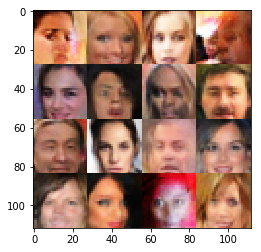

Epochs 26710/300000 Batch Step 1390/3166 gen_loss = -63.82312774658203..., disc_loss = -0.4255989193916321..., train using time = 10.237
Epochs 26720/300000 Batch Step 1400/3166 gen_loss = -64.39704895019531..., disc_loss = -0.3351394534111023..., train using time = 9.309
Epochs 26730/300000 Batch Step 1410/3166 gen_loss = -64.5152587890625..., disc_loss = -0.2407209873199463..., train using time = 10.250
Epochs 26740/300000 Batch Step 1420/3166 gen_loss = -65.14047241210938..., disc_loss = -0.36196449398994446..., train using time = 10.364
Epochs 26750/300000 Batch Step 1430/3166 gen_loss = -64.35218811035156..., disc_loss = -0.37827619910240173..., train using time = 9.671
Epochs 26760/300000 Batch Step 1440/3166 gen_loss = -63.90411376953125..., disc_loss = -0.34394699335098267..., train using time = 10.218
Epochs 26770/300000 Batch Step 1450/3166 gen_loss = -64.23944091796875..., disc_loss = -0.4334322512149811..., train using time = 10.668
Epochs 26780/300000 Batch Step 1460/3166 

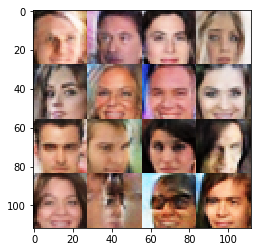

Epochs 26810/300000 Batch Step 1490/3166 gen_loss = -64.91410827636719..., disc_loss = -0.4071043133735657..., train using time = 9.113
Epochs 26820/300000 Batch Step 1500/3166 gen_loss = -63.926307678222656..., disc_loss = -0.41689735651016235..., train using time = 10.624
Epochs 26830/300000 Batch Step 1510/3166 gen_loss = -64.57644653320312..., disc_loss = -0.4108548164367676..., train using time = 11.794
Epochs 26840/300000 Batch Step 1520/3166 gen_loss = -64.73222351074219..., disc_loss = -0.3501548171043396..., train using time = 9.647
Epochs 26850/300000 Batch Step 1530/3166 gen_loss = -65.49418640136719..., disc_loss = -0.3284105956554413..., train using time = 9.854
Epochs 26860/300000 Batch Step 1540/3166 gen_loss = -65.11972045898438..., disc_loss = -0.26048681139945984..., train using time = 10.378
Epochs 26870/300000 Batch Step 1550/3166 gen_loss = -64.08563232421875..., disc_loss = -0.4656130373477936..., train using time = 9.069
Epochs 26880/300000 Batch Step 1560/3166 g

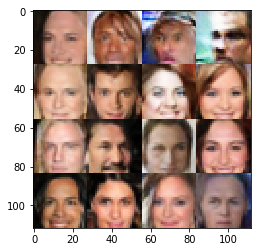

Epochs 26910/300000 Batch Step 1590/3166 gen_loss = -65.1755599975586..., disc_loss = -0.3210667073726654..., train using time = 9.002
Epochs 26920/300000 Batch Step 1600/3166 gen_loss = -64.29273223876953..., disc_loss = -0.3499070405960083..., train using time = 11.292
Epochs 26930/300000 Batch Step 1610/3166 gen_loss = -65.12855529785156..., disc_loss = -0.3791240155696869..., train using time = 10.691
Epochs 26940/300000 Batch Step 1620/3166 gen_loss = -65.48583221435547..., disc_loss = -0.3749311864376068..., train using time = 10.417
Epochs 26950/300000 Batch Step 1630/3166 gen_loss = -65.10401916503906..., disc_loss = -0.33878418803215027..., train using time = 9.597
Epochs 26960/300000 Batch Step 1640/3166 gen_loss = -64.32504272460938..., disc_loss = -0.38749557733535767..., train using time = 9.150
Epochs 26970/300000 Batch Step 1650/3166 gen_loss = -64.20469665527344..., disc_loss = -0.4531933665275574..., train using time = 9.455
Epochs 26980/300000 Batch Step 1660/3166 gen

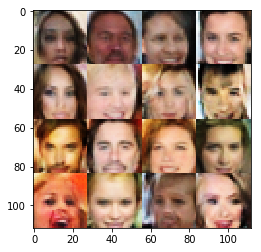

Epochs 27010/300000 Batch Step 1690/3166 gen_loss = -64.6324462890625..., disc_loss = -0.2373034507036209..., train using time = 9.255
Epochs 27020/300000 Batch Step 1700/3166 gen_loss = -64.77867889404297..., disc_loss = -0.33974558115005493..., train using time = 9.377
Epochs 27030/300000 Batch Step 1710/3166 gen_loss = -64.5195541381836..., disc_loss = -0.41671594977378845..., train using time = 10.468
Epochs 27040/300000 Batch Step 1720/3166 gen_loss = -63.82358169555664..., disc_loss = -0.3925843834877014..., train using time = 9.228
Epochs 27050/300000 Batch Step 1730/3166 gen_loss = -63.84926223754883..., disc_loss = -0.47363632917404175..., train using time = 10.391
Epochs 27060/300000 Batch Step 1740/3166 gen_loss = -63.864593505859375..., disc_loss = -0.32860618829727173..., train using time = 10.347
Epochs 27070/300000 Batch Step 1750/3166 gen_loss = -65.47418212890625..., disc_loss = -0.37589913606643677..., train using time = 11.172
Epochs 27080/300000 Batch Step 1760/3166

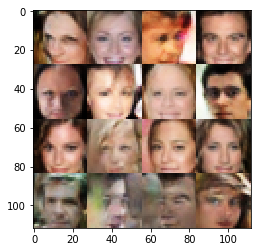

Epochs 27110/300000 Batch Step 1790/3166 gen_loss = -65.49293518066406..., disc_loss = -0.3418067991733551..., train using time = 10.372
Epochs 27120/300000 Batch Step 1800/3166 gen_loss = -65.54959869384766..., disc_loss = -0.46047115325927734..., train using time = 11.833
Epochs 27130/300000 Batch Step 1810/3166 gen_loss = -65.03538513183594..., disc_loss = -0.3737088441848755..., train using time = 9.829
Epochs 27140/300000 Batch Step 1820/3166 gen_loss = -64.616943359375..., disc_loss = -0.4524582028388977..., train using time = 8.999
Epochs 27150/300000 Batch Step 1830/3166 gen_loss = -65.90523529052734..., disc_loss = -0.27088648080825806..., train using time = 10.380
Epochs 27160/300000 Batch Step 1840/3166 gen_loss = -65.589599609375..., disc_loss = -0.47145143151283264..., train using time = 9.072
Epochs 27170/300000 Batch Step 1850/3166 gen_loss = -64.55540466308594..., disc_loss = -0.2866200804710388..., train using time = 12.758
Epochs 27180/300000 Batch Step 1860/3166 gen_

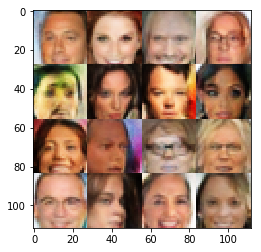

Epochs 27210/300000 Batch Step 1890/3166 gen_loss = -65.92366027832031..., disc_loss = -0.28143978118896484..., train using time = 10.399
Epochs 27220/300000 Batch Step 1900/3166 gen_loss = -66.16181945800781..., disc_loss = -0.19572813808918..., train using time = 10.150
Epochs 27230/300000 Batch Step 1910/3166 gen_loss = -65.69359588623047..., disc_loss = -0.4234006404876709..., train using time = 10.581
Epochs 27240/300000 Batch Step 1920/3166 gen_loss = -64.88264465332031..., disc_loss = -0.42482447624206543..., train using time = 10.098
Epochs 27250/300000 Batch Step 1930/3166 gen_loss = -65.11576843261719..., disc_loss = -0.3184787631034851..., train using time = 9.115
Epochs 27260/300000 Batch Step 1940/3166 gen_loss = -65.327880859375..., disc_loss = -0.3789359927177429..., train using time = 9.007
Epochs 27270/300000 Batch Step 1950/3166 gen_loss = -64.46646118164062..., disc_loss = -0.49963703751564026..., train using time = 13.668
Epochs 27280/300000 Batch Step 1960/3166 gen

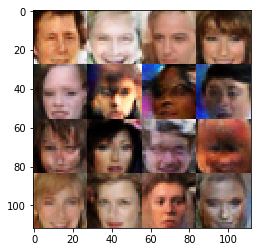

Epochs 27310/300000 Batch Step 1990/3166 gen_loss = -65.16943359375..., disc_loss = -0.2752174139022827..., train using time = 9.113
Epochs 27320/300000 Batch Step 2000/3166 gen_loss = -65.10250091552734..., disc_loss = -0.4030764698982239..., train using time = 10.270
Epochs 27330/300000 Batch Step 2010/3166 gen_loss = -65.302734375..., disc_loss = -0.2903323173522949..., train using time = 10.466
Epochs 27340/300000 Batch Step 2020/3166 gen_loss = -66.64602661132812..., disc_loss = -0.3741643726825714..., train using time = 9.100
Epochs 27350/300000 Batch Step 2030/3166 gen_loss = -65.8636474609375..., disc_loss = -0.33901888132095337..., train using time = 10.205
Epochs 27360/300000 Batch Step 2040/3166 gen_loss = -65.73942565917969..., disc_loss = -0.23005160689353943..., train using time = 10.222
Epochs 27370/300000 Batch Step 2050/3166 gen_loss = -64.88623809814453..., disc_loss = -0.33565571904182434..., train using time = 10.266
Epochs 27380/300000 Batch Step 2060/3166 gen_loss

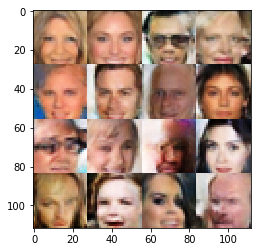

Epochs 27410/300000 Batch Step 2090/3166 gen_loss = -65.78392028808594..., disc_loss = -0.3335376977920532..., train using time = 11.172
Epochs 27420/300000 Batch Step 2100/3166 gen_loss = -66.82058715820312..., disc_loss = -0.3217523992061615..., train using time = 11.304
Epochs 27430/300000 Batch Step 2110/3166 gen_loss = -64.96829223632812..., disc_loss = -0.38176003098487854..., train using time = 9.081
Epochs 27440/300000 Batch Step 2120/3166 gen_loss = -66.2643051147461..., disc_loss = -0.3055158853530884..., train using time = 8.929
Epochs 27450/300000 Batch Step 2130/3166 gen_loss = -66.57073974609375..., disc_loss = -0.2390076369047165..., train using time = 10.269
Epochs 27460/300000 Batch Step 2140/3166 gen_loss = -65.73571014404297..., disc_loss = -0.3741748332977295..., train using time = 9.706
Epochs 27470/300000 Batch Step 2150/3166 gen_loss = -65.96021270751953..., disc_loss = -0.44549840688705444..., train using time = 11.254
Epochs 27480/300000 Batch Step 2160/3166 ge

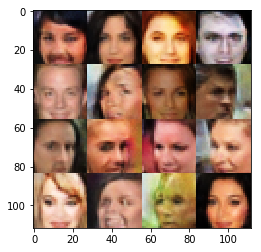

Epochs 27510/300000 Batch Step 2190/3166 gen_loss = -66.51597595214844..., disc_loss = -0.4521886706352234..., train using time = 10.148
Epochs 27520/300000 Batch Step 2200/3166 gen_loss = -65.73880004882812..., disc_loss = -0.3207470178604126..., train using time = 10.811
Epochs 27530/300000 Batch Step 2210/3166 gen_loss = -65.95738220214844..., disc_loss = -0.3138253688812256..., train using time = 11.547
Epochs 27540/300000 Batch Step 2220/3166 gen_loss = -65.25098419189453..., disc_loss = -0.3809426426887512..., train using time = 10.034
Epochs 27550/300000 Batch Step 2230/3166 gen_loss = -65.77561950683594..., disc_loss = -0.30286863446235657..., train using time = 9.963
Epochs 27560/300000 Batch Step 2240/3166 gen_loss = -66.08242797851562..., disc_loss = -0.31300073862075806..., train using time = 9.804
Epochs 27570/300000 Batch Step 2250/3166 gen_loss = -66.03119659423828..., disc_loss = -0.40958040952682495..., train using time = 11.823
Epochs 27580/300000 Batch Step 2260/3166

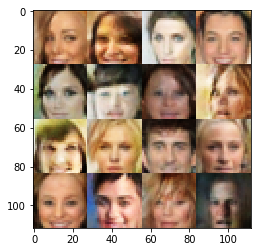

Epochs 27610/300000 Batch Step 2290/3166 gen_loss = -66.57064819335938..., disc_loss = -0.3478379249572754..., train using time = 9.110
Epochs 27620/300000 Batch Step 2300/3166 gen_loss = -66.52682495117188..., disc_loss = -0.3268751800060272..., train using time = 10.984
Epochs 27630/300000 Batch Step 2310/3166 gen_loss = -66.31397247314453..., disc_loss = -0.4167822003364563..., train using time = 9.478
Epochs 27640/300000 Batch Step 2320/3166 gen_loss = -66.77525329589844..., disc_loss = -0.3611110746860504..., train using time = 9.123
Epochs 27650/300000 Batch Step 2330/3166 gen_loss = -67.0119400024414..., disc_loss = -0.4128851294517517..., train using time = 10.135
Epochs 27660/300000 Batch Step 2340/3166 gen_loss = -67.47639465332031..., disc_loss = -0.39078542590141296..., train using time = 10.028
Epochs 27670/300000 Batch Step 2350/3166 gen_loss = -67.13520812988281..., disc_loss = -0.3929778039455414..., train using time = 10.450
Epochs 27680/300000 Batch Step 2360/3166 gen

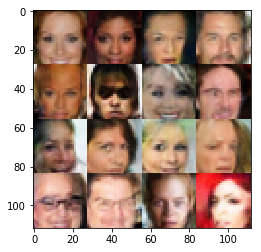

Epochs 27710/300000 Batch Step 2390/3166 gen_loss = -67.01068115234375..., disc_loss = -0.3052513003349304..., train using time = 11.822
Epochs 27720/300000 Batch Step 2400/3166 gen_loss = -67.12342834472656..., disc_loss = -0.3746163845062256..., train using time = 9.156
Epochs 27730/300000 Batch Step 2410/3166 gen_loss = -67.09588623046875..., disc_loss = -0.4765891134738922..., train using time = 9.167
Epochs 27740/300000 Batch Step 2420/3166 gen_loss = -67.35899353027344..., disc_loss = -0.3703796863555908..., train using time = 10.054
Epochs 27750/300000 Batch Step 2430/3166 gen_loss = -67.13037109375..., disc_loss = -0.2843538224697113..., train using time = 9.241
Epochs 27760/300000 Batch Step 2440/3166 gen_loss = -66.83441925048828..., disc_loss = -0.4252156615257263..., train using time = 10.685
Epochs 27770/300000 Batch Step 2450/3166 gen_loss = -67.36701965332031..., disc_loss = -0.3392459750175476..., train using time = 10.294
Epochs 27780/300000 Batch Step 2460/3166 gen_lo

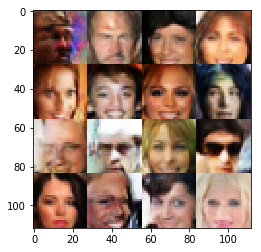

Epochs 27810/300000 Batch Step 2490/3166 gen_loss = -66.83551788330078..., disc_loss = -0.19172663986682892..., train using time = 10.338
Epochs 27820/300000 Batch Step 2500/3166 gen_loss = -66.39498901367188..., disc_loss = -0.4008060097694397..., train using time = 10.427
Epochs 27830/300000 Batch Step 2510/3166 gen_loss = -66.92594909667969..., disc_loss = -0.2948249578475952..., train using time = 10.278
Epochs 27840/300000 Batch Step 2520/3166 gen_loss = -66.75143432617188..., disc_loss = -0.46815523505210876..., train using time = 9.100
Epochs 27850/300000 Batch Step 2530/3166 gen_loss = -67.30770111083984..., disc_loss = -0.3107854425907135..., train using time = 9.172
Epochs 27860/300000 Batch Step 2540/3166 gen_loss = -67.14266967773438..., disc_loss = -0.3641619086265564..., train using time = 11.428
Epochs 27870/300000 Batch Step 2550/3166 gen_loss = -66.76073455810547..., disc_loss = -0.3817666172981262..., train using time = 9.129
Epochs 27880/300000 Batch Step 2560/3166 g

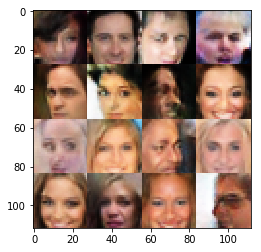

Epochs 27910/300000 Batch Step 2590/3166 gen_loss = -67.55149841308594..., disc_loss = -0.3826819062232971..., train using time = 10.291
Epochs 27920/300000 Batch Step 2600/3166 gen_loss = -67.30436706542969..., disc_loss = -0.31974393129348755..., train using time = 10.331
Epochs 27930/300000 Batch Step 2610/3166 gen_loss = -67.35941314697266..., disc_loss = -0.2882400155067444..., train using time = 9.175
Epochs 27940/300000 Batch Step 2620/3166 gen_loss = -67.72576141357422..., disc_loss = -0.45881032943725586..., train using time = 10.240
Epochs 27950/300000 Batch Step 2630/3166 gen_loss = -67.0765609741211..., disc_loss = -0.34211277961730957..., train using time = 11.558
Epochs 27960/300000 Batch Step 2640/3166 gen_loss = -67.63903045654297..., disc_loss = -0.3304961323738098..., train using time = 10.297
Epochs 27970/300000 Batch Step 2650/3166 gen_loss = -67.4549789428711..., disc_loss = -0.31926897168159485..., train using time = 9.101
Epochs 27980/300000 Batch Step 2660/3166 

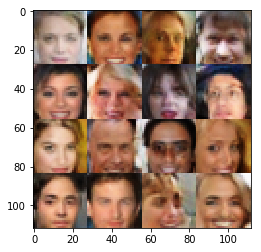

Epochs 28010/300000 Batch Step 2690/3166 gen_loss = -67.97122192382812..., disc_loss = -0.26609885692596436..., train using time = 12.344
Epochs 28020/300000 Batch Step 2700/3166 gen_loss = -67.49658966064453..., disc_loss = -0.36910104751586914..., train using time = 9.183
Epochs 28030/300000 Batch Step 2710/3166 gen_loss = -67.16449737548828..., disc_loss = -0.26745694875717163..., train using time = 9.025
Epochs 28040/300000 Batch Step 2720/3166 gen_loss = -67.92994689941406..., disc_loss = -0.09296973794698715..., train using time = 10.195
Epochs 28050/300000 Batch Step 2730/3166 gen_loss = -67.77734375..., disc_loss = -0.3306750953197479..., train using time = 9.468
Epochs 28060/300000 Batch Step 2740/3166 gen_loss = -67.96577453613281..., disc_loss = -0.4499478340148926..., train using time = 12.713
Epochs 28070/300000 Batch Step 2750/3166 gen_loss = -67.94303131103516..., disc_loss = -0.23126919567584991..., train using time = 10.395
Epochs 28080/300000 Batch Step 2760/3166 gen_

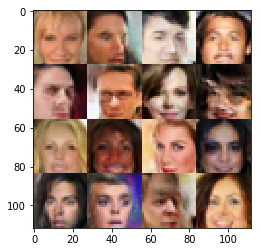

Epochs 28110/300000 Batch Step 2790/3166 gen_loss = -68.1406478881836..., disc_loss = -0.44516220688819885..., train using time = 10.391
Epochs 28120/300000 Batch Step 2800/3166 gen_loss = -68.38998413085938..., disc_loss = -0.25578734278678894..., train using time = 10.250
Epochs 28130/300000 Batch Step 2810/3166 gen_loss = -69.022216796875..., disc_loss = -0.361314058303833..., train using time = 10.219
Epochs 28140/300000 Batch Step 2820/3166 gen_loss = -69.04106140136719..., disc_loss = -0.3252524733543396..., train using time = 9.249
Epochs 28150/300000 Batch Step 2830/3166 gen_loss = -69.09831237792969..., disc_loss = -0.2784574627876282..., train using time = 9.041
Epochs 28160/300000 Batch Step 2840/3166 gen_loss = -68.74154663085938..., disc_loss = -0.4192637801170349..., train using time = 12.981
Epochs 28170/300000 Batch Step 2850/3166 gen_loss = -67.98502349853516..., disc_loss = -0.3557876944541931..., train using time = 8.996
Epochs 28180/300000 Batch Step 2860/3166 gen_l

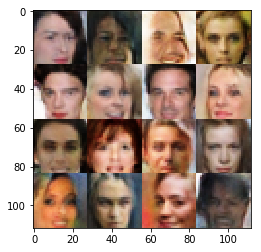

Epochs 28210/300000 Batch Step 2890/3166 gen_loss = -68.4400634765625..., disc_loss = -0.44261184334754944..., train using time = 10.601
Epochs 28220/300000 Batch Step 2900/3166 gen_loss = -68.82067108154297..., disc_loss = -0.3876553475856781..., train using time = 9.717
Epochs 28230/300000 Batch Step 2910/3166 gen_loss = -68.25328063964844..., disc_loss = -0.3703498840332031..., train using time = 9.514
Epochs 28240/300000 Batch Step 2920/3166 gen_loss = -67.70109558105469..., disc_loss = -0.38480108976364136..., train using time = 10.810
Epochs 28250/300000 Batch Step 2930/3166 gen_loss = -68.11166381835938..., disc_loss = -0.37466612458229065..., train using time = 9.296
Epochs 28260/300000 Batch Step 2940/3166 gen_loss = -68.43612670898438..., disc_loss = -0.44656258821487427..., train using time = 9.749
Epochs 28270/300000 Batch Step 2950/3166 gen_loss = -68.51168060302734..., disc_loss = -0.3233006000518799..., train using time = 10.239
Epochs 28280/300000 Batch Step 2960/3166 g

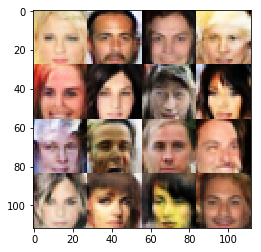

Epochs 28310/300000 Batch Step 2990/3166 gen_loss = -68.70217895507812..., disc_loss = -0.41522541642189026..., train using time = 9.009
Epochs 28320/300000 Batch Step 3000/3166 gen_loss = -68.91179656982422..., disc_loss = -0.324160635471344..., train using time = 9.207
Epochs 28330/300000 Batch Step 3010/3166 gen_loss = -68.7591781616211..., disc_loss = -0.3333180248737335..., train using time = 10.320
Epochs 28340/300000 Batch Step 3020/3166 gen_loss = -69.20469665527344..., disc_loss = -0.3495636582374573..., train using time = 9.805
Epochs 28350/300000 Batch Step 3030/3166 gen_loss = -68.9188232421875..., disc_loss = -0.38611119985580444..., train using time = 10.588
Epochs 28360/300000 Batch Step 3040/3166 gen_loss = -69.16880798339844..., disc_loss = -0.3606557250022888..., train using time = 10.417
Epochs 28370/300000 Batch Step 3050/3166 gen_loss = -68.91644287109375..., disc_loss = -0.3683447241783142..., train using time = 10.285
Epochs 28380/300000 Batch Step 3060/3166 gen_

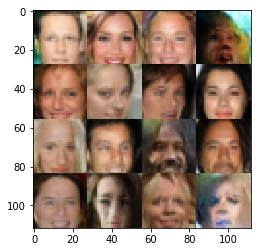

Epochs 28410/300000 Batch Step 3090/3166 gen_loss = -68.93495178222656..., disc_loss = -0.3186688721179962..., train using time = 10.295
Epochs 28420/300000 Batch Step 3100/3166 gen_loss = -67.89236450195312..., disc_loss = -0.39892905950546265..., train using time = 10.389
Epochs 28430/300000 Batch Step 3110/3166 gen_loss = -68.1918716430664..., disc_loss = -0.2986626625061035..., train using time = 8.966
Epochs 28440/300000 Batch Step 3120/3166 gen_loss = -68.60739135742188..., disc_loss = -0.4382694661617279..., train using time = 9.127
Epochs 28450/300000 Batch Step 3130/3166 gen_loss = -68.19712829589844..., disc_loss = -0.29960280656814575..., train using time = 11.745
Epochs 28460/300000 Batch Step 3140/3166 gen_loss = -67.84992980957031..., disc_loss = -0.3613142669200897..., train using time = 9.105
Epochs 28470/300000 Batch Step 3150/3166 gen_loss = -68.57008361816406..., disc_loss = -0.3719600737094879..., train using time = 10.230
Epochs 28480/300000 Batch Step 3160/3166 ge

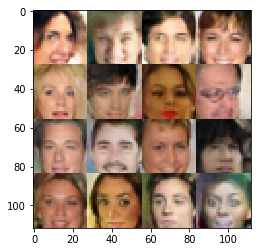

Epochs 28510/300000 Batch Step 25/3166 gen_loss = -69.31034088134766..., disc_loss = -0.3866816461086273..., train using time = 10.273
Epochs 28520/300000 Batch Step 35/3166 gen_loss = -68.74806213378906..., disc_loss = -0.4287775158882141..., train using time = 9.091
Epochs 28530/300000 Batch Step 45/3166 gen_loss = -68.64794158935547..., disc_loss = -0.33505159616470337..., train using time = 10.398
Epochs 28540/300000 Batch Step 55/3166 gen_loss = -69.8601303100586..., disc_loss = -0.26455357670783997..., train using time = 10.286
Epochs 28550/300000 Batch Step 65/3166 gen_loss = -69.22186279296875..., disc_loss = -0.37329840660095215..., train using time = 10.400
Epochs 28560/300000 Batch Step 75/3166 gen_loss = -68.91963195800781..., disc_loss = -0.49010616540908813..., train using time = 10.160
Epochs 28570/300000 Batch Step 85/3166 gen_loss = -68.9702377319336..., disc_loss = -0.3876156508922577..., train using time = 10.177
Epochs 28580/300000 Batch Step 95/3166 gen_loss = -68.

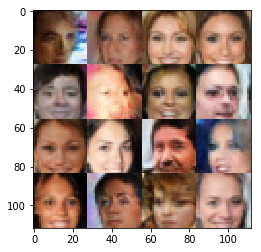

Epochs 28610/300000 Batch Step 125/3166 gen_loss = -67.757568359375..., disc_loss = -0.16413691639900208..., train using time = 9.174
Epochs 28620/300000 Batch Step 135/3166 gen_loss = -68.85807800292969..., disc_loss = -0.32580363750457764..., train using time = 9.130
Epochs 28630/300000 Batch Step 145/3166 gen_loss = -68.89599609375..., disc_loss = -0.4319371283054352..., train using time = 10.217
Epochs 28640/300000 Batch Step 155/3166 gen_loss = -68.75399017333984..., disc_loss = -0.33215823769569397..., train using time = 9.207
Epochs 28650/300000 Batch Step 165/3166 gen_loss = -68.98710632324219..., disc_loss = -0.2119951695203781..., train using time = 13.140
Epochs 28660/300000 Batch Step 175/3166 gen_loss = -69.29391479492188..., disc_loss = -0.34661638736724854..., train using time = 10.360
Epochs 28670/300000 Batch Step 185/3166 gen_loss = -69.71070861816406..., disc_loss = -0.27663159370422363..., train using time = 9.188
Epochs 28680/300000 Batch Step 195/3166 gen_loss = -

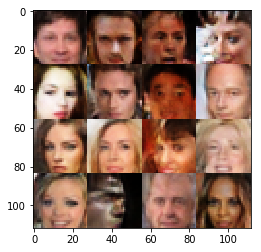

Epochs 28710/300000 Batch Step 225/3166 gen_loss = -69.54949188232422..., disc_loss = -0.33077365159988403..., train using time = 11.162
Epochs 28720/300000 Batch Step 235/3166 gen_loss = -69.35342407226562..., disc_loss = -0.35352620482444763..., train using time = 10.235
Epochs 28730/300000 Batch Step 245/3166 gen_loss = -69.53744506835938..., disc_loss = -0.3647307753562927..., train using time = 9.146
Epochs 28740/300000 Batch Step 255/3166 gen_loss = -69.72361755371094..., disc_loss = -0.29998379945755005..., train using time = 9.118
Epochs 28750/300000 Batch Step 265/3166 gen_loss = -71.03656005859375..., disc_loss = -0.35215580463409424..., train using time = 11.605
Epochs 28760/300000 Batch Step 275/3166 gen_loss = -69.79203796386719..., disc_loss = -0.4308931231498718..., train using time = 9.157
Epochs 28770/300000 Batch Step 285/3166 gen_loss = -69.84866333007812..., disc_loss = -0.4115146994590759..., train using time = 10.686
Epochs 28780/300000 Batch Step 295/3166 gen_los

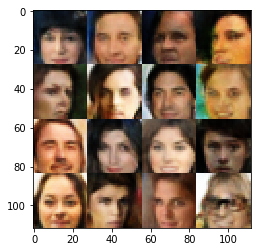

Epochs 28810/300000 Batch Step 325/3166 gen_loss = -70.88847351074219..., disc_loss = -0.23692485690116882..., train using time = 10.402
Epochs 28820/300000 Batch Step 335/3166 gen_loss = -70.70742797851562..., disc_loss = -0.4513389468193054..., train using time = 9.149
Epochs 28830/300000 Batch Step 345/3166 gen_loss = -69.60057067871094..., disc_loss = -0.3978736400604248..., train using time = 11.258
Epochs 28840/300000 Batch Step 355/3166 gen_loss = -69.4144287109375..., disc_loss = -0.4021664559841156..., train using time = 10.296
Epochs 28850/300000 Batch Step 365/3166 gen_loss = -70.07963562011719..., disc_loss = -0.3243492841720581..., train using time = 10.455
Epochs 28860/300000 Batch Step 375/3166 gen_loss = -70.54199981689453..., disc_loss = -0.3558799624443054..., train using time = 10.442
Epochs 28870/300000 Batch Step 385/3166 gen_loss = -70.34585571289062..., disc_loss = -0.34487128257751465..., train using time = 11.696
Epochs 28880/300000 Batch Step 395/3166 gen_loss

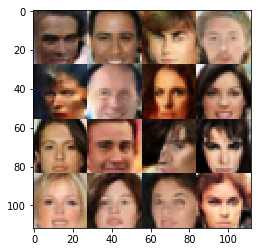

Epochs 28910/300000 Batch Step 425/3166 gen_loss = -69.1937484741211..., disc_loss = -0.3317919969558716..., train using time = 9.017
Epochs 28920/300000 Batch Step 435/3166 gen_loss = -69.1838150024414..., disc_loss = -0.4363625943660736..., train using time = 10.390
Epochs 28930/300000 Batch Step 445/3166 gen_loss = -70.21322631835938..., disc_loss = -0.3907794952392578..., train using time = 9.594
Epochs 28940/300000 Batch Step 455/3166 gen_loss = -69.22503662109375..., disc_loss = -0.36119070649147034..., train using time = 10.188
Epochs 28950/300000 Batch Step 465/3166 gen_loss = -69.24014282226562..., disc_loss = -0.41670411825180054..., train using time = 11.953
Epochs 28960/300000 Batch Step 475/3166 gen_loss = -69.66159057617188..., disc_loss = -0.3689223825931549..., train using time = 10.583
Epochs 28970/300000 Batch Step 485/3166 gen_loss = -70.0223388671875..., disc_loss = -0.3265010416507721..., train using time = 9.085
Epochs 28980/300000 Batch Step 495/3166 gen_loss = -

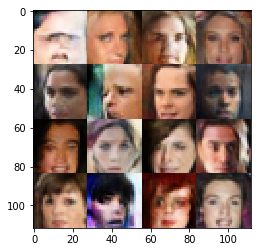

Epochs 29010/300000 Batch Step 525/3166 gen_loss = -70.15571594238281..., disc_loss = -0.22998538613319397..., train using time = 10.308
Epochs 29020/300000 Batch Step 535/3166 gen_loss = -70.49806213378906..., disc_loss = -0.3507665693759918..., train using time = 9.020
Epochs 29030/300000 Batch Step 545/3166 gen_loss = -69.5836181640625..., disc_loss = -0.37206509709358215..., train using time = 9.106
Epochs 29040/300000 Batch Step 555/3166 gen_loss = -70.251708984375..., disc_loss = -0.40178942680358887..., train using time = 11.359
Epochs 29050/300000 Batch Step 565/3166 gen_loss = -70.95964050292969..., disc_loss = -0.34203702211380005..., train using time = 9.157
Epochs 29060/300000 Batch Step 575/3166 gen_loss = -70.84732055664062..., disc_loss = -0.21062231063842773..., train using time = 10.100
Epochs 29070/300000 Batch Step 585/3166 gen_loss = -70.73243713378906..., disc_loss = -0.37217143177986145..., train using time = 10.337
Epochs 29080/300000 Batch Step 595/3166 gen_loss

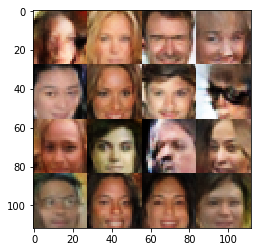

Epochs 29110/300000 Batch Step 625/3166 gen_loss = -69.79771423339844..., disc_loss = -0.37055036425590515..., train using time = 9.053
Epochs 29120/300000 Batch Step 635/3166 gen_loss = -70.76402282714844..., disc_loss = -0.5010026097297668..., train using time = 11.902
Epochs 29130/300000 Batch Step 645/3166 gen_loss = -70.57669067382812..., disc_loss = -0.4158925414085388..., train using time = 10.354
Epochs 29140/300000 Batch Step 655/3166 gen_loss = -70.95318603515625..., disc_loss = -0.37278619408607483..., train using time = 10.331
Epochs 29150/300000 Batch Step 665/3166 gen_loss = -70.23430633544922..., disc_loss = -0.35710960626602173..., train using time = 9.052
Epochs 29160/300000 Batch Step 675/3166 gen_loss = -70.50581359863281..., disc_loss = -0.44329437613487244..., train using time = 10.125
Epochs 29170/300000 Batch Step 685/3166 gen_loss = -69.84708404541016..., disc_loss = -0.19421319663524628..., train using time = 9.166
Epochs 29180/300000 Batch Step 695/3166 gen_lo

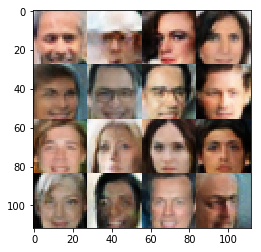

Epochs 29210/300000 Batch Step 725/3166 gen_loss = -71.1051254272461..., disc_loss = -0.3734292984008789..., train using time = 9.086
Epochs 29220/300000 Batch Step 735/3166 gen_loss = -71.10697937011719..., disc_loss = -0.379893958568573..., train using time = 10.309
Epochs 29230/300000 Batch Step 745/3166 gen_loss = -70.85274505615234..., disc_loss = -0.2767259478569031..., train using time = 9.343
Epochs 29240/300000 Batch Step 755/3166 gen_loss = -71.34217834472656..., disc_loss = -0.30252277851104736..., train using time = 11.426
Epochs 29250/300000 Batch Step 765/3166 gen_loss = -70.9281997680664..., disc_loss = -0.32976049184799194..., train using time = 10.287
Epochs 29260/300000 Batch Step 775/3166 gen_loss = -70.29838562011719..., disc_loss = -0.3915342390537262..., train using time = 9.167
Epochs 29270/300000 Batch Step 785/3166 gen_loss = -70.18907165527344..., disc_loss = -0.4104679524898529..., train using time = 9.181
Epochs 29280/300000 Batch Step 795/3166 gen_loss = -7

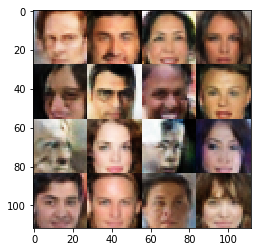

Epochs 29310/300000 Batch Step 825/3166 gen_loss = -70.57066345214844..., disc_loss = -0.3498925268650055..., train using time = 10.493
Epochs 29320/300000 Batch Step 835/3166 gen_loss = -71.07667541503906..., disc_loss = -0.3598892390727997..., train using time = 9.449
Epochs 29330/300000 Batch Step 845/3166 gen_loss = -70.21924591064453..., disc_loss = -0.40246644616127014..., train using time = 9.046
Epochs 29340/300000 Batch Step 855/3166 gen_loss = -71.15372467041016..., disc_loss = -0.34305447340011597..., train using time = 11.586
Epochs 29350/300000 Batch Step 865/3166 gen_loss = -70.90829467773438..., disc_loss = -0.38589245080947876..., train using time = 9.586
Epochs 29360/300000 Batch Step 875/3166 gen_loss = -70.12962341308594..., disc_loss = -0.32359200716018677..., train using time = 10.284
Epochs 29370/300000 Batch Step 885/3166 gen_loss = -69.85324096679688..., disc_loss = -0.35312166810035706..., train using time = 11.342
Epochs 29380/300000 Batch Step 895/3166 gen_lo

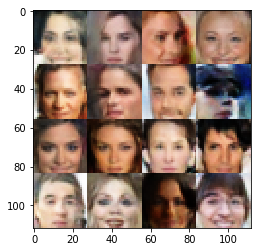

Epochs 29410/300000 Batch Step 925/3166 gen_loss = -69.9345703125..., disc_loss = -0.22107848525047302..., train using time = 9.203
Epochs 29420/300000 Batch Step 935/3166 gen_loss = -71.06417846679688..., disc_loss = -0.4400545656681061..., train using time = 10.499
Epochs 29430/300000 Batch Step 945/3166 gen_loss = -71.76720428466797..., disc_loss = -0.3018079102039337..., train using time = 10.007
Epochs 29440/300000 Batch Step 955/3166 gen_loss = -70.24342346191406..., disc_loss = -0.25062182545661926..., train using time = 10.491
Epochs 29450/300000 Batch Step 965/3166 gen_loss = -70.6001205444336..., disc_loss = -0.2778795659542084..., train using time = 9.247
Epochs 29460/300000 Batch Step 975/3166 gen_loss = -71.5330581665039..., disc_loss = -0.40516453981399536..., train using time = 9.357
Epochs 29470/300000 Batch Step 985/3166 gen_loss = -71.28219604492188..., disc_loss = -0.1227833479642868..., train using time = 9.385
Epochs 29480/300000 Batch Step 995/3166 gen_loss = -70.

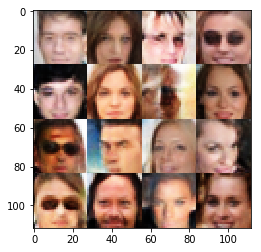

Epochs 29510/300000 Batch Step 1025/3166 gen_loss = -71.73593139648438..., disc_loss = -0.3058289587497711..., train using time = 10.413
Epochs 29520/300000 Batch Step 1035/3166 gen_loss = -71.62189483642578..., disc_loss = -0.3695058524608612..., train using time = 9.196
Epochs 29530/300000 Batch Step 1045/3166 gen_loss = -71.12313842773438..., disc_loss = -0.2907467484474182..., train using time = 10.660
Epochs 29540/300000 Batch Step 1055/3166 gen_loss = -70.62911224365234..., disc_loss = -0.3165683448314667..., train using time = 10.468
Epochs 29550/300000 Batch Step 1065/3166 gen_loss = -71.51918029785156..., disc_loss = -0.3478136658668518..., train using time = 9.178
Epochs 29560/300000 Batch Step 1075/3166 gen_loss = -71.39079284667969..., disc_loss = -0.3657287061214447..., train using time = 9.538
Epochs 29570/300000 Batch Step 1085/3166 gen_loss = -70.95050048828125..., disc_loss = -0.30616986751556396..., train using time = 10.373
Epochs 29580/300000 Batch Step 1095/3166 ge

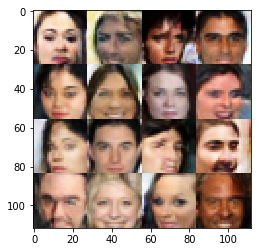

Epochs 29610/300000 Batch Step 1125/3166 gen_loss = -71.29829406738281..., disc_loss = -0.4317418932914734..., train using time = 9.127
Epochs 29620/300000 Batch Step 1135/3166 gen_loss = -71.17938232421875..., disc_loss = -0.3946757912635803..., train using time = 9.016
Epochs 29630/300000 Batch Step 1145/3166 gen_loss = -71.73912048339844..., disc_loss = -0.25828105211257935..., train using time = 11.728
Epochs 29640/300000 Batch Step 1155/3166 gen_loss = -71.001220703125..., disc_loss = -0.2902038097381592..., train using time = 9.168
Epochs 29650/300000 Batch Step 1165/3166 gen_loss = -71.12625122070312..., disc_loss = -0.3150429129600525..., train using time = 10.341
Epochs 29660/300000 Batch Step 1175/3166 gen_loss = -71.46448516845703..., disc_loss = -0.34357950091362..., train using time = 10.231
Epochs 29670/300000 Batch Step 1185/3166 gen_loss = -71.99111938476562..., disc_loss = -0.36080121994018555..., train using time = 9.154
Epochs 29680/300000 Batch Step 1195/3166 gen_lo

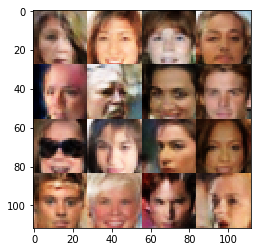

Epochs 29710/300000 Batch Step 1225/3166 gen_loss = -71.85222625732422..., disc_loss = -0.3800889253616333..., train using time = 10.365
Epochs 29720/300000 Batch Step 1235/3166 gen_loss = -72.706787109375..., disc_loss = -0.34008416533470154..., train using time = 10.459
Epochs 29730/300000 Batch Step 1245/3166 gen_loss = -71.85316467285156..., disc_loss = -0.34841758012771606..., train using time = 11.844
Epochs 29740/300000 Batch Step 1255/3166 gen_loss = -71.93876647949219..., disc_loss = -0.24256794154644012..., train using time = 15.314
Epochs 29750/300000 Batch Step 1265/3166 gen_loss = -71.6046142578125..., disc_loss = -0.3863820433616638..., train using time = 12.065
Epochs 29760/300000 Batch Step 1275/3166 gen_loss = -71.71266174316406..., disc_loss = -0.3569445013999939..., train using time = 21.513


KeyboardInterrupt: 

In [11]:
OUTPUT_DIM = 28*28*3

batch_size = 64  # 128 # 16 # 64 128
z_dim = 128
learning_rate = 1e-4  # 0.0003 #  1e-4
beta1 = 0  # 0.5
beta2 = 0.9

epochs = 60000 
Xs = glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))

tf.reset_default_graph()
with tf.Graph().as_default():
    train(epochs, batch_size, learning_rate, beta1, beta2, get_batches, Xs, 'RGB')


## 批量生成人脸，参数是生成图像个数

In [32]:
class network(object):
    def __init__(self, epochs):
        self.epochs = epochs
        tf.reset_default_graph()

        with tf.Graph().as_default():
            with tf.Session() as sess:
                global_step = tf.train.get_or_create_global_step(sess.graph)

                input_real = tf.placeholder(tf.float32, [None, OUTPUT_DIM], name="input")
                d_loss, g_loss, summary_op = model_loss(input_real)
                d_train_opt, g_train_opt = model_opt(d_loss, g_loss, beta1, beta2, global_step)

        #         saver = tf.train.Saver()
                save_dir = "./models"
                sess.run(tf.global_variables_initializer())
        #         loader = tf.train.import_meta_graph(l'best_model.ckpt-90306.meta')
        #         loader.restore(sess, save_dir)

                if not os.path.isdir(save_dir):
                    os.mkdir(save_dir)
                checkpoint = tf.train.get_checkpoint_state(save_dir)
                if checkpoint and checkpoint.model_checkpoint_path:
                    # self.saver.restore(self.sess, checkpoint.model_checkpoint_path)
                    tf.train.Saver().restore(sess, tf.train.latest_checkpoint(save_dir))
                    print("Successfully loaded:", tf.train.latest_checkpoint(save_dir))
                    # print("Successfully loaded:", checkpoint.model_checkpoint_path)
                else:
                    print("Could not find old network weights")

                variable_names = [v.name for v in tf.all_variables()]  # tf.trainable_variables
#                 print(variable_names)
                for epoch_i in range(self.epochs):
                    show_generator_output(sess, 16, "RGB")


INFO:tensorflow:Restoring parameters from ./models/best_model.ckpt-178199
Successfully loaded: ./models/best_model.ckpt-178199


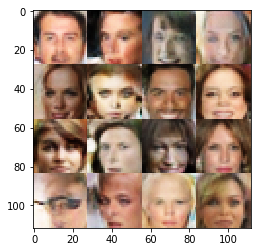

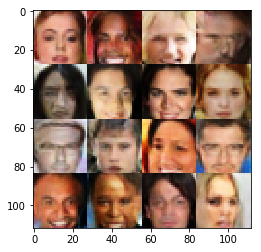

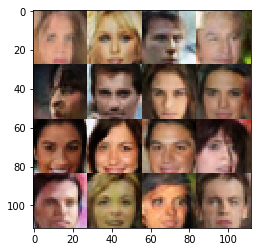

In [35]:
obj=network(3)

In [54]:
LOGDIR='./log/'
train_writer = tf.summary.FileWriter(LOGDIR)
train_writer.add_graph(graph)

In [55]:
train_writer.flush()
train_writer.close()

In [35]:
with open('test2.txt', 'w') as f:
    for i in graph.get_operations():
        f.write(i.name + "\n")

In [38]:
graph.get_all_collection_keys()

['summaries',
 'global_step',
 'variables',
 'model_variables',
 'trainable_variables',
 'train_op']

In [44]:
graph.get_collection('train_op')

[<tf.Operation 'Adam' type=AssignAdd>, <tf.Operation 'Adam_1' type=AssignAdd>]

In [50]:
graph.get_tensor_by_name("generator_211/Tanh:0")

<tf.Tensor 'generator_211/Tanh:0' shape=(?, 28, 28, 3) dtype=float32>

In [12]:
# graph.get_operations()